In [1]:
import os
import astropy
import requests
import pandas as pd
import numpy as np
import lightkurve as lk 
from scipy.interpolate import interp1d
from astropy.modeling import models, fitting
import matplotlib.pyplot as plt
import emcee
import sys
import csv
from astropy.timeseries import LombScargle
from os.path import basename, exists

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/utils/')
import filters # Suzanne's functions
import norm

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/ETV')
import etv_functions # Nora's functions 

%matplotlib inline

In [2]:
from IPython.display import display, HTML, Javascript, clear_output

display(HTML("<style>.container { width:99% !important; }</style>"))  # Jupyter 6
display(HTML("<style>.jp-Notebook { --jp-notebook-max-width: 98%; }</style>"))  # Jupyter 7

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_base = './etv_out'  # for ETV
lk_download_dir = 'C:/dev/_juypter/PH_TESS_LightCurveViewer/data'  

# A command from shell that can be run to notify users, e.g., fitting is finished. Use "echo" if you do not have one
NOTIFY_CMD = "win-notify.bat"

if hasattr(lk, "conf"):  # default download dir
    lk.conf.cache_dir = lk_download_dir
if hasattr(lk.search, "sr_cache"):   # PR for persistent query result cache
    lk.search.sr_cache.cache_dir = lk_download_dir  # None
    lk.search.sr_cache.expire_second = 86400

## Looking for ETVs in TIC 298264838



In [3]:
# define the plotting parameters

figsize = (8,4)

In [4]:
# import the data

# choose a TIC ID to analyze
ticid = 298264838  # EW-like dips + 3rd sets of dips

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_path = f"{outfile_base}/tic{ticid}_etv_primary.csv"
outfile_path_s = f"{outfile_base}/tic{ticid}_etv_secondary.csv"


# import data using Lightkurve
# sr = lk.search_lightcurve('TIC {}'.format(ticid), author = 'SPOC')  
if not "../.." in sys.path:
    sys.path.append("../..")
import lightkurve_ext as lke  # at ../../
import astropy.units as u


sr = lk.search_lightcurve('TIC {}'.format(ticid))  # get long cadence data too
sr = lke.filter_by_priority(sr, author_priority=['SPOC', 'TESS-SPOC'], exptime_priority=['short', 'long', 'fast'])
sr = sr[sr.exptime != 1800 *u.s]  # exclude 30min cadence data for now (TESS-SPOC, sectors 18, 19, 23 )
# sr = sr[np.isin(sr.author, ['SPOC', 'TESS-SPOC'])]  # exclude QLP to ensure for uniformity in the data
sr = lke._sort_chronologically(sr)  # workaround lightkurve v2.4.2+ change in sort order
display(sr)
lc_tess = sr.download_all().stitch()
# lc_tess = lc_tess.truncate(None, 1450)  # use data from sectors 2 - 3 for now


search_result = lc_tess

time = search_result.time.value
flux = search_result.flux.value
fluxerr = search_result.flux_err.value
len(search_result)

#,mission,year,author,exptime,target_name,distance,proposal_id
,,,,s,,arcsec,
0,TESS Sector 24,2020,SPOC,120,298264838,0.0,G022208
1,TESS Sector 25,2020,SPOC,120,298264838,0.0,G022208
2,TESS Sector 49,2022,SPOC,120,298264838,0.0,G04171
3,TESS Sector 50,2022,SPOC,120,298264838,0.0,G04171
4,TESS Sector 51,2022,SPOC,120,298264838,0.0,G04171
5,TESS Sector 52,2022,SPOC,120,298264838,0.0,G04171
6,TESS Sector 56,2022,SPOC,120,298264838,0.0,G05003
7,TESS Sector 59,2022,SPOC,120,298264838,0.0,G05003


141960

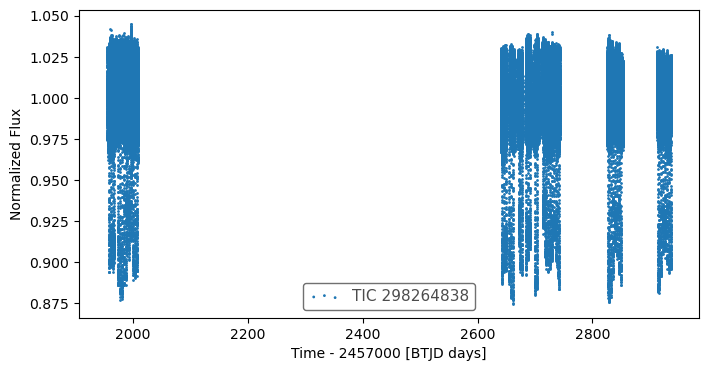

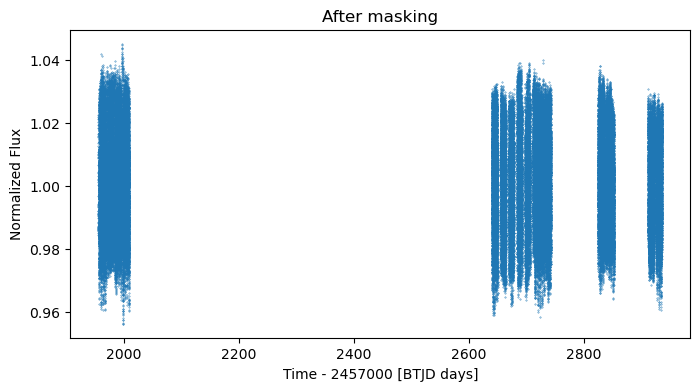

In [10]:
%matplotlib inline
# %matplotlib widget

time = search_result.time.value
flux = search_result.flux.value
fluxerr = search_result.flux_err.value
len(search_result)

# mask out data you don't like...

fig, ax = plt.subplots(figsize=figsize)
search_result.scatter(ax = ax)

# mask out 5rd set of dips, based on :
# epoch=1958.4612, duration_hr=6.4202, period=3.226190, label="s0014-s0060:TCE1",   # <-- 3rd set of dips, 8.1%, not used here

# mask = time < 0 #( time > 54950) & (time < 54963)  #  truncate weird spikes at the beginning of Kepler data  
mask = search_result.create_transit_mask(period=3.226190, transit_time=1958.4612, duration=6.4202/24*1.1)  # use 110% of the TCE duration to avoid complications from 3rd set of dips

time = time[~mask]
flux = flux[~mask]
fluxerr = fluxerr[~mask]

# make sure that therte are no nans!

finite_mask = np.isfinite(time) * np.isfinite(flux) * np.isfinite(fluxerr)

# make a dictionary of the data 

data = pd.DataFrame({'time': time[finite_mask], 'flux': flux[finite_mask], 'err': fluxerr[finite_mask]})

ax2 = plt.figure(figsize=figsize).gca()
ax2.scatter(data.time, data.flux, s=0.1);
ax2.set_ylabel(ax.get_ylabel())
ax2.set_xlabel(ax.get_xlabel())
ax2.set_title("After masking");

In [ ]:
do_bls = False

if do_bls:
    if not "../.." in sys.path:
        sys.path.append("../..")
    import lightkurve_ext_pg_runner as lke_pg_runner  # at ../../

    bls_result = lke_pg_runner.run_bls(
        search_result.remove_nans(),
        pg_kwargs=dict(
            minimum_period=1, maximum_period=20,
            frequency_factor=1,            
            duration=[3.4957 / 24 * f for f in [0.975, 1, 1.025, 1.05, 1.1, 1.15,]],  # based on observed primary eclipse duration for better fit
        ),
    )
    !$NOTIFY_CMD  "BLS Done"

In [ ]:
# Visaully compare different candidate period

# ax = search_result.normalize().fold(epoch_time=1471.4196, period=8.418132651611877).truncate(-0.1, 0.1).scatter(label="BLS period, frequency_factor=10");  # HWHM 0.001571020094789155
# ax = search_result.normalize().fold(epoch_time=1471.4196, period=8.418147).truncate(-0.1, 0.1).scatter(label="s0001-s0009:TCE1");

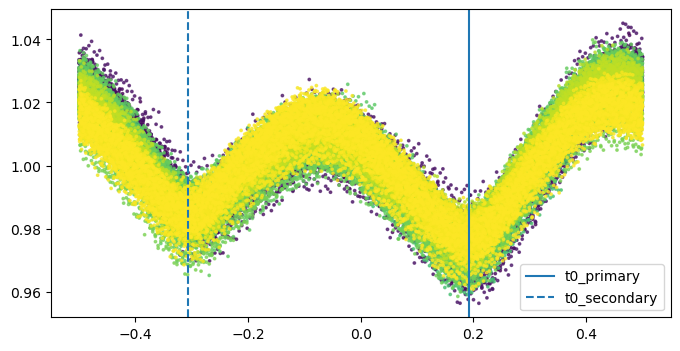

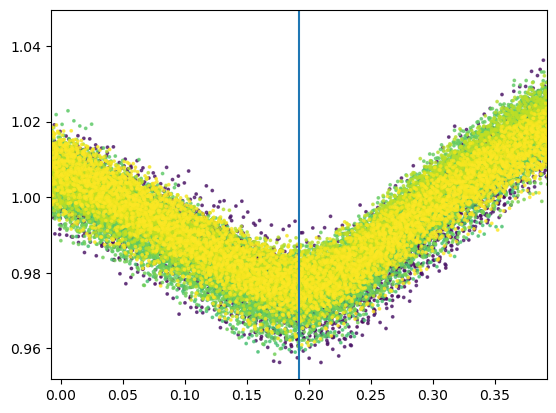

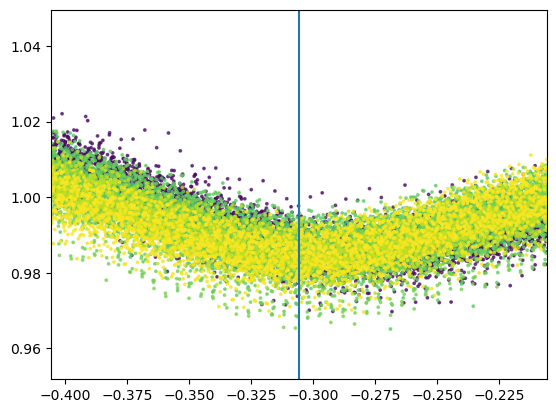

In [47]:
%matplotlib inline
# %matplotlib widget

from astropy.time import Time

# define the orbital period and the t0 

# epoch=1955.8427, duration_hr=0.5004, period=0.291278, label="s0014-s0060:TCE2",  # <-- EW dips shallow, 0.21%
# epoch=1955.9926, duration_hr=0.8349, period=0.291277, label="s0014-s0060:TCE3",  # <-- EW dips deep , 0.29%
# epoch=1958.4612, duration_hr=6.4202, period=3.226190, label="s0014-s0060:TCE1",   # <-- 3rd set of dips, 8.1%, masked above

# FILL-IN THE eclipse epoch / period, 
period = 0.291278 

t0_primary = 1955.9926 - 0.005  # the TCE epoch is visually off center, so we  apply an offset to adjust it
t0_secondary = 1955.8427


# convert epoch from BTJD to commonly mjd used here
# t0_primary = Time(t0_primary, format="btjd").to_value("mjd")
# t0_secondary = Time(t0_secondary, format="btjd").to_value("mjd")

# Move t0 to the first dip in the data (some of the subsequent codes, espically fit_each_eclipse(), assumes that)
t0_primary = t0_primary - int((t0_primary - data['time'][0]) / period) * period
if t0_secondary is not None:
    t0_secondary = t0_secondary - int((t0_secondary - data['time'][0]) / period) * period

duration_hr_primary = 0.8349
duration_hr_secondary = 0.5004

t0_for_plotting = 0  # keep 0 for plotting purposes
# t0_for_plotting = t0_primary - np.abs(t0_primary - t0_secondary) * 0.25  # use a custom one so that the eclipses are not near the edge (-0.5 or +0.5)

phase = etv_functions.phase_data(data['time'], t0_for_plotting, period)

fig, ax = plt.subplots(figsize = (8,4))

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])

# add the phase to the dataframe
data['phase'] = phase

plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
if t0_secondary is not None:
    plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
plt.legend()
# plt.ylim(0.535, 0.55)
# plt.xlim(-0.5, 0.1)
plt.show();

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])
plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
plt.xlim(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] - 0.2, etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] + 0.2);
# plt.ylim(0.75, 0.85);
plt.show()

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])
plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], label="t0_secondary")
plt.xlim(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] - 0.1, etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] + 0.1);
# plt.ylim(0.75, 0.85);
plt.show()

### Now that the data is ready we can start 

In [20]:
# show data to visualize what's changed in each step below
data  

,time,flux,err,phase
0,1955.797021,1.022452,0.001886,-0.462612
1,1955.798410,1.021769,0.001887,-0.457844
2,1955.799799,1.021208,0.001884,-0.453076
3,1955.801188,1.019264,0.001890,-0.448307
4,1955.802577,1.020257,0.001885,-0.443539
...,...,...,...,...
107344,2936.680246,1.000508,0.001830,0.053041
107345,2936.681635,0.997915,0.001828,0.057810
107346,2936.683024,0.997839,0.001826,0.062578
107347,2936.684412,0.999281,0.001828,0.067346


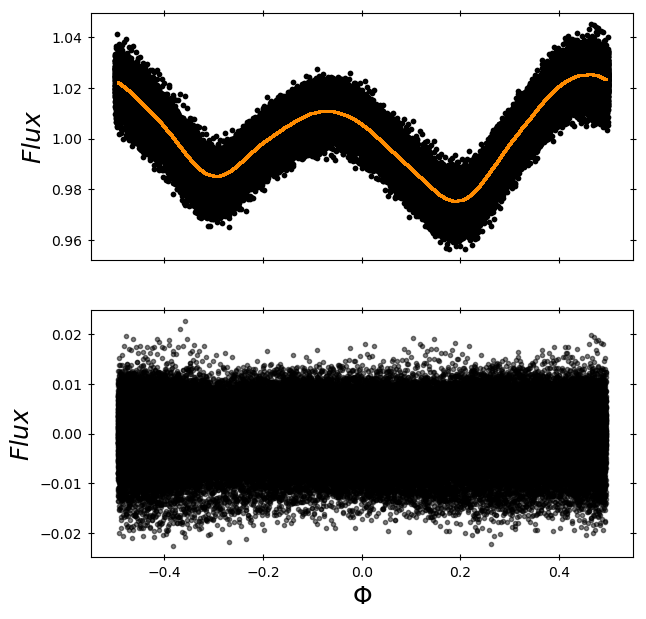

,time,flux,err,phase,flux_sub_binary,binary_model
0,1955.797021,1.022452,0.001886,-0.462612,0.005207,1.017245
1,1955.798410,1.021769,0.001887,-0.457844,0.005384,1.016385
2,1955.799799,1.021208,0.001884,-0.453076,0.005737,1.015471
3,1955.801188,1.019264,0.001890,-0.448307,0.004775,1.014490
4,1955.802577,1.020257,0.001885,-0.443539,0.006728,1.013529
...,...,...,...,...,...,...
107344,2936.680246,1.000508,0.001830,0.053041,0.003931,0.996576
107345,2936.681635,0.997915,0.001828,0.057810,0.002219,0.995696
107346,2936.683024,0.997839,0.001826,0.062578,0.003009,0.994830
107347,2936.684412,0.999281,0.001828,0.067346,0.005283,0.993998


In [21]:
# phase fold the data and create an appoximate binary model (top) and subtract it from the data (bottom)
#_, _ , flux_sub_binary, model, _, _ = etv_functions.trend_removal_interact(period, 0, data['time'], data['flux'], data['time'], data['flux'])

data = etv_functions.trend_removal_interact(period, t0_for_plotting, data)
data

10 106279 901
reached the end
10 104154 901
reached the end
10 103654 901
reached the end
10 103459 901
reached the end
10 103391 901
reached the end


,time,flux,err,phase,flux_sub_binary,binary_model,flux_detrended
0,1955.797021,1.022452,0.001886,-0.462612,0.005207,1.017245,1.017169
1,1955.798410,1.021769,0.001887,-0.457844,0.005384,1.016385,1.016505
2,1955.799799,1.021208,0.001884,-0.453076,0.005737,1.015471,1.015964
3,1955.801188,1.019264,0.001890,-0.448307,0.004775,1.014490,1.014040
4,1955.802577,1.020257,0.001885,-0.443539,0.006728,1.013529,1.015052
...,...,...,...,...,...,...,...
107344,2936.680246,1.000508,0.001830,0.053041,0.003931,0.996576,0.996970
107345,2936.681635,0.997915,0.001828,0.057810,0.002219,0.995696,0.994394
107346,2936.683024,0.997839,0.001826,0.062578,0.003009,0.994830,0.994331
107347,2936.684412,0.999281,0.001828,0.067346,0.005283,0.993998,0.995788


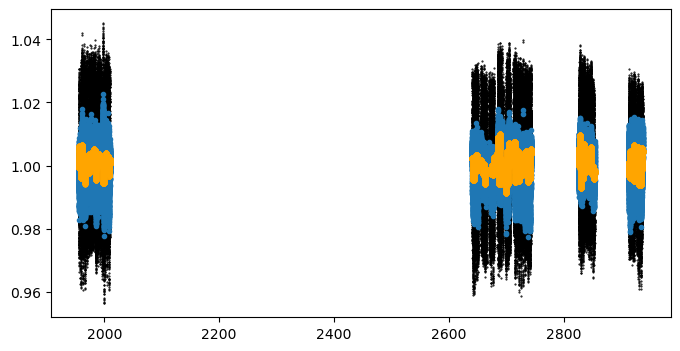

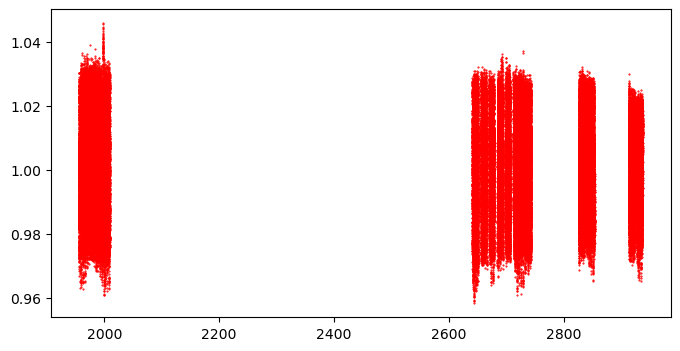

In [22]:
# if you want to detrend the data run this line!

data = etv_functions.detrend_suz(data, T_dur = 10, plot = True)
data

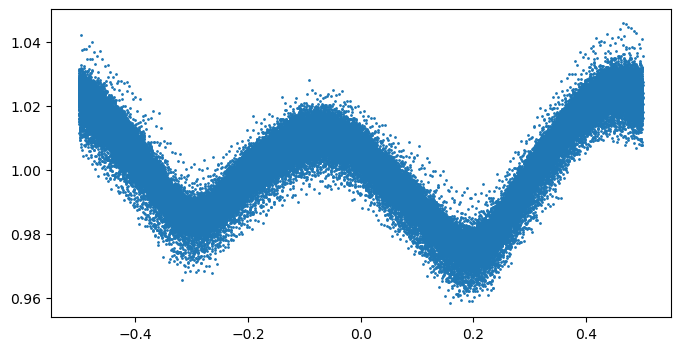

In [23]:
# plot the phase folded data here so that you know at what phase you want to cut the data to model 
fig, ax = plt.subplots(figsize = figsize)
plt.scatter(data.phase, data.flux_detrended, s = 1)
plt.show()

<span style="background-color: rgba(255, 0, 0, 0.6);"> NOTE: </span> The zoom windows below for the eclipses are made **smaller**, an attempt to reduce the complications that the eclipses were not symmetric, while the cosine model assumes symmetric dips.

Primary:   1955.9876 0.1916725602344863
window_width_p (phase): 0.05971528917391633
Secondary: 1955.8427 -0.30579034461931975
window_width_s (phase): 0.05726488097281635


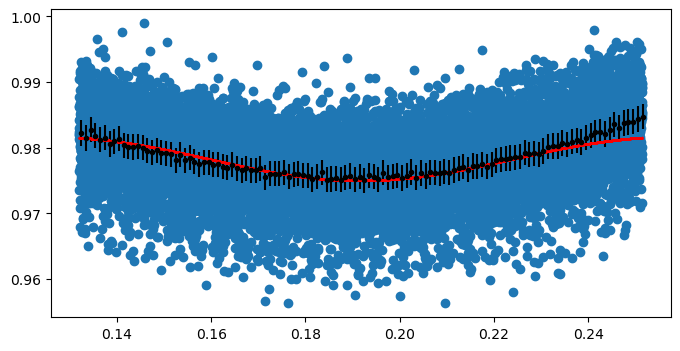

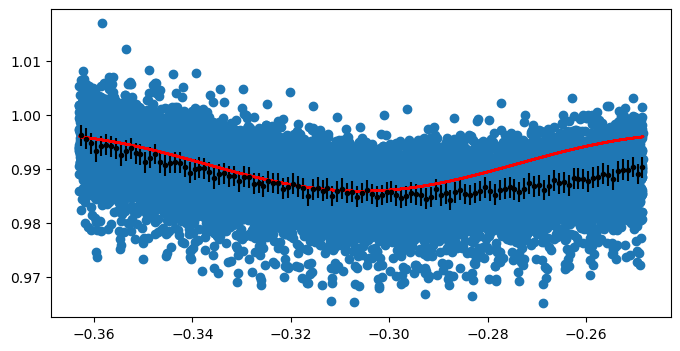

In [51]:
# define the midpoints of the primary and secondary eclipses and the window width

# if these don't look central - change them!! the eclipses should be central
midpoint_p =  etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0]  # convet to time in phase
# midpoint_p -= 0.004  # the offset is added back to t0_primary (& secondary above
print('Primary:  ', t0_primary, midpoint_p)

# change depending on the width of the eclipses, default to be slightly larger than the primary eclipse
window_width_p = 0.5 * duration_hr_primary / 24 / period
# use a shoter duration to avoid fitting the out-of-eclipse LC, which has its own variability that the model is not equipped to hanlde
# window_width_p = 0.095
print("window_width_p (phase):", window_width_p)

data_primary = data[(data['phase'] > midpoint_p - window_width_p) & (data['phase'] < midpoint_p + window_width_p) ]
ph_binned,flux_binned,err_binned = etv_functions.run_binning_phased(data_primary.phase, data_primary.flux, yerr=data_primary.err,nbins=1000)


if t0_secondary is not None:
    midpoint_s =  etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0]
    print('Secondary:', t0_secondary, midpoint_s)
    
    window_width_s = 0.8 * duration_hr_secondary / 24 / period
    # window_width_s = window_width_p
    print("window_width_s (phase):", window_width_s)
    
    data_secondary = data[(data['phase'] > midpoint_s - window_width_s) & (data['phase'] < midpoint_s + window_width_s) ]
    ph_binned_s,flux_binned_s,err_binned_s = etv_functions.run_binning_phased(data_secondary.phase, data_secondary.flux, yerr=data_secondary.err,nbins=1000)


### # you need initial guesses!! The order is :
# alpha0, alpha1, t0, d, Tau - CHANGE THESE TO YOUR OWN INITIAL GUESSES
# median flux, -eclipse depth, t0, related to duration, related to shape (U or V) 
# t0 in normalixed phase
start_vals = [0.982, -0.007, midpoint_p, 0.03, 1.0]
start_vals_s = [0.997, -0.011, midpoint_s, 0.03, 1.0]
    
# -- -- -- -- -- -- -- -- -- 
etv_functions.plot_initial_guess(data_primary, ph_binned, flux_binned, err_binned, *start_vals)
if t0_secondary is not None:
    etv_functions.plot_initial_guess(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, *start_vals_s)    

100%|██████████████████████████████████████████████████████████| 1000/1000 [04:03<00:00,  4.10it/s]


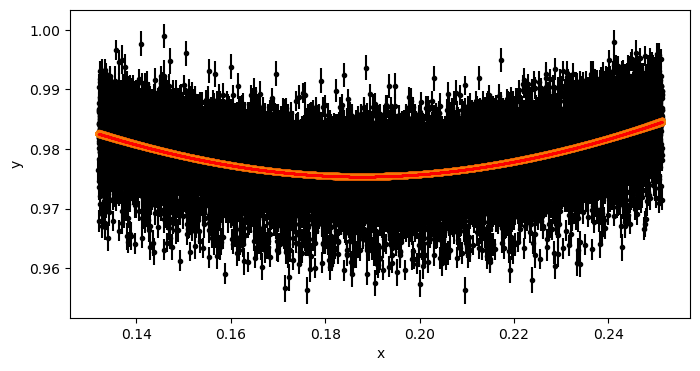

100%|██████████████████████████████████████████████████████████| 1000/1000 [04:03<00:00,  4.10it/s]


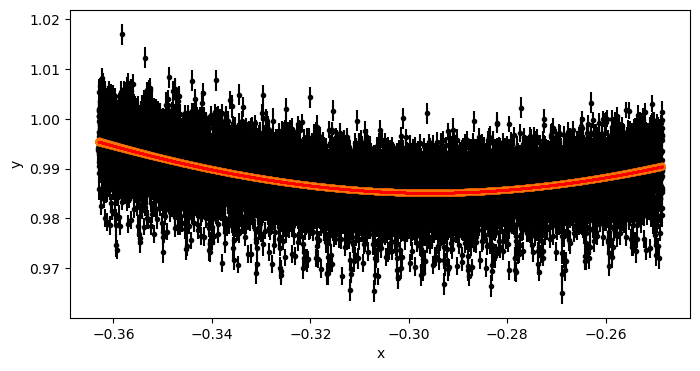

In [52]:
# run the initial model fit using MCMC for the primary and secondary eclipses 
run_init_fit = True

if run_init_fit:
    mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = etv_functions.run_mcmc_initial_fit(data_primary, start_vals, nruns = 1000, plot_chains = False, plot = True)
    if t0_secondary is not None:
        mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = etv_functions.run_mcmc_initial_fit(data_secondary, start_vals_s, nruns = 1000, plot_chains = False, plot = True)
    !$NOTIFY_CMD "Initial fit done"

In [53]:
if not run_init_fit:  # case init fit has been previously saved and to be reussed
    print("Use pre-defined inital model params:")
    # initial fit params from TESS data
    mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.0481367889527187, -0.07276250014981386, 0.1877866186894403, 0.12703125496756085, 0.9757000610223947
    etv_functions.plot_initial_guess(data_primary, ph_binned, flux_binned, err_binned, *[mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau])
    if t0_secondary is not None:
        mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 1.0470587669445575, -0.0619183967063911, -0.2957511148827722, 0.11593133898280264, 0.9764166107245558
        etv_functions.plot_initial_guess(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, *[mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s])    

In [54]:
print("Initial model params:")  # For information, and they can be copied to the cell above for future reuse

print("mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = " + ", ".join([str(v) for v in [mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau]]))
if t0_secondary is not None:
    print("mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = " + ", ".join([str(v) for v in [mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s]]))

Initial model params:
mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.0481367889527187, -0.07276250014981386, 0.1877866186894403, 0.12703125496756085, 0.9757000610223947
mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 1.0470587669445575, -0.0619183967063911, -0.2957511148827722, 0.11593133898280264, 0.9764166107245558


3366

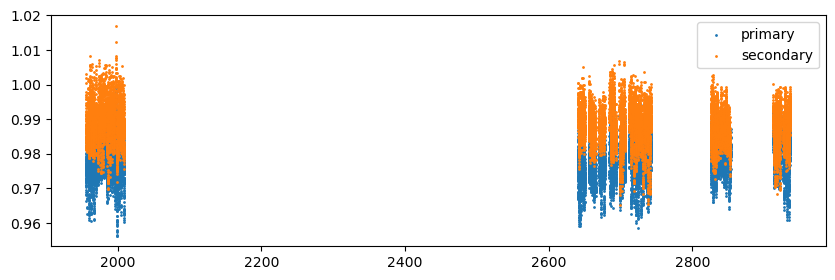

In [55]:
fig = plt.subplots(figsize=(10, 3), sharex=True)
plt.scatter(data_primary.time,data_primary.flux , s = 1, label = 'primary')
if t0_secondary is not None:
    plt.scatter(data_secondary.time,data_secondary.flux , s = 1, label = 'secondary')
plt.legend()

# calculate the number of transits there are within the data 
n_transits = int((max(data_primary.time) - min(data_primary.time)) / period)
n_transits

1955.9876 0.291278 1955.9876


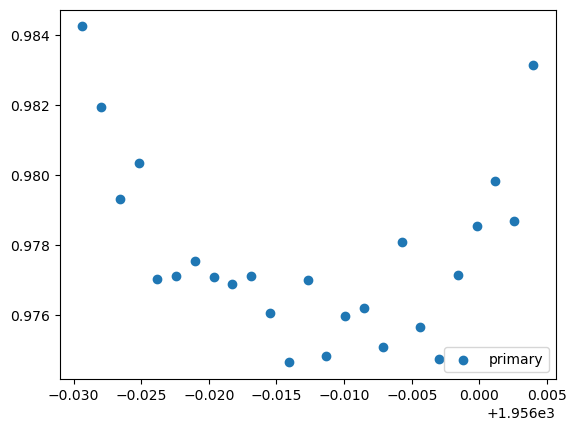

1955.9876 0.291278 1956.2788779999998


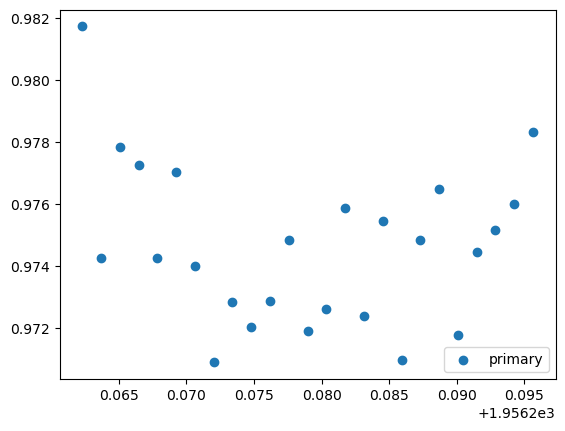

1955.9876 0.291278 1956.570156


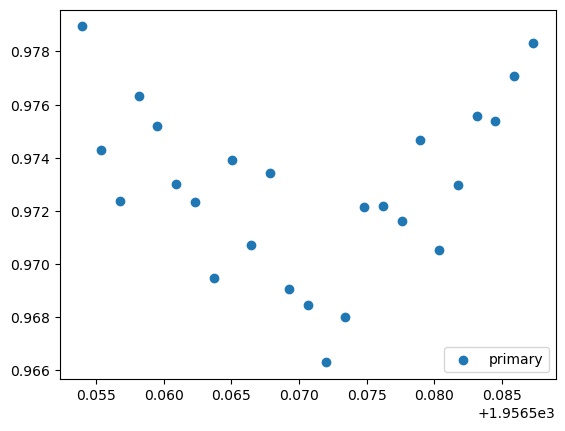

1955.8427 0.291278 1955.8427


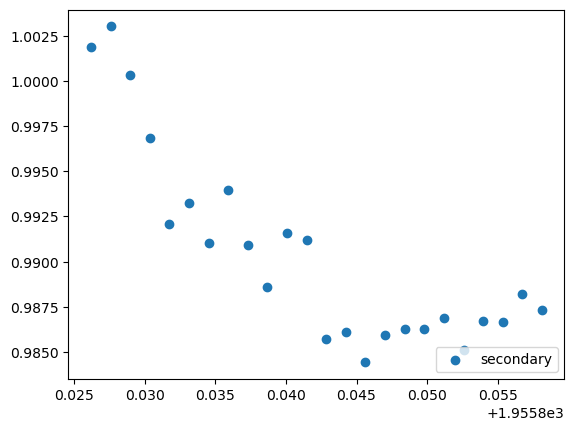

1955.8427 0.291278 1956.1339779999998


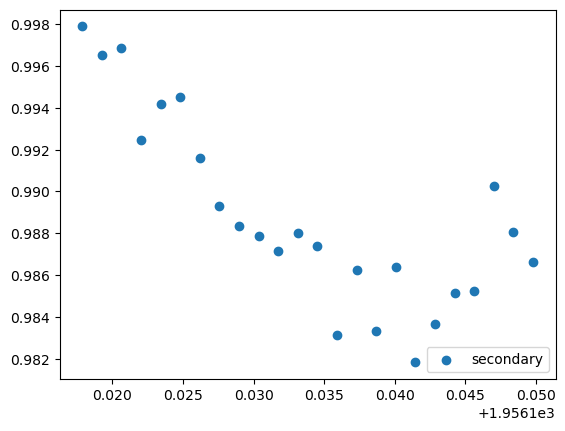

1955.8427 0.291278 1956.425256


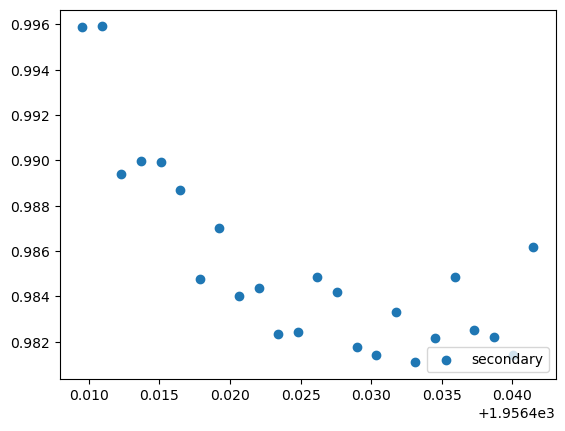

In [56]:
tr_index = range(0,n_transits)

for i in tr_index[0:3]:        
    transit_time = t0_primary+(period*i)
    x = np.array(data_primary.time)
    y = np.array(data_primary.flux) 
    yerr = np.array(data_primary.err)
    
    print (t0_primary, period, transit_time)
    
    mask = (x > (transit_time - (0.2*period))) & (x < (transit_time + (0.2*period))) 
    
    x = np.array(x[mask])
    y = np.array(y[mask]) 
    yerr = np.array(yerr[mask])
    fig, ax = plt.subplots()
    plt.scatter(x,y, label="primary")
    plt.legend(loc="lower right")
    plt.show()
    

if t0_secondary is not None:
    for i in tr_index[0:3]:        
        transit_time = t0_secondary+(period*i)
        x = np.array(data_secondary.time)
        y = np.array(data_secondary.flux) 
        yerr = np.array(data_secondary.err)
        
        print (t0_secondary, period, transit_time)
        
        mask = (x > (transit_time - (0.2*period))) & (x < (transit_time + (0.2*period))) 
        
        x = np.array(x[mask])
        y = np.array(y[mask]) 
        yerr = np.array(yerr[mask])
        fig, ax = plt.subplots()
        plt.scatter(x,y, label="secondary")
        plt.legend(loc="lower right")
        plt.show()

Fitting individual primary eclipses...
Creating new manifest file
1955.9876 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 413.20it/s]


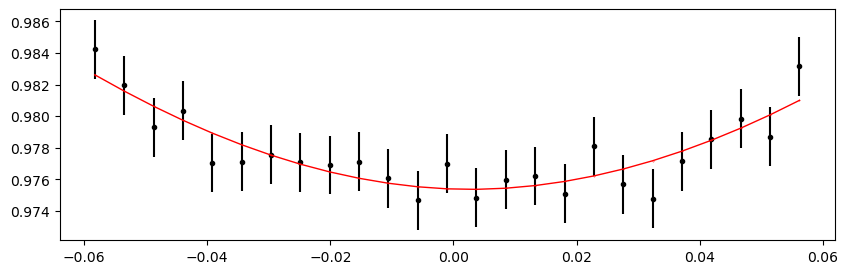

1956.2788779999998 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 420.05it/s]


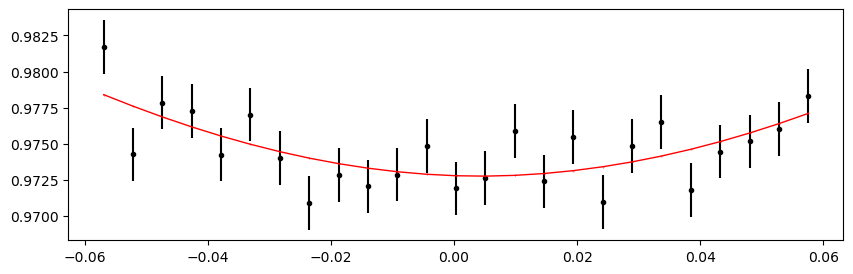

1956.570156 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 416.61it/s]


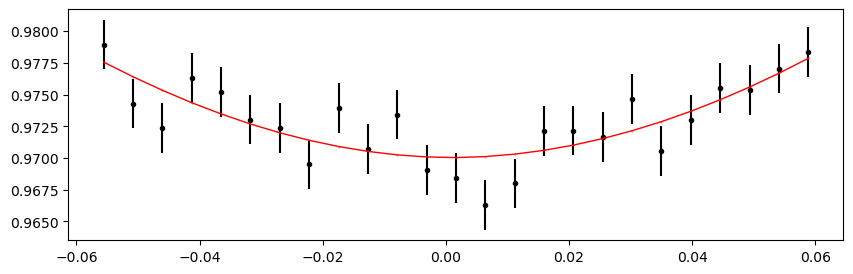

Time 1956.861434 does not have enough data points: 8
Time 1958.317824 does not have enough data points: 10
Time 1958.609102 does not have enough data points: 13
1958.90038 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.75it/s]


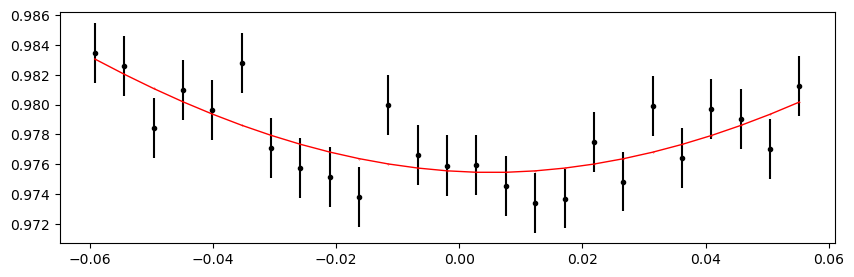

1959.191658 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.32it/s]


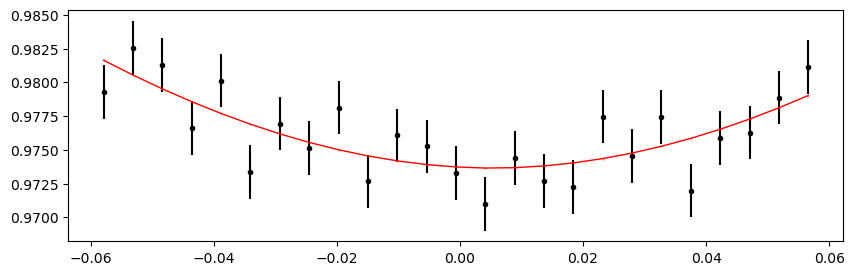

1959.4829359999999 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 405.30it/s]


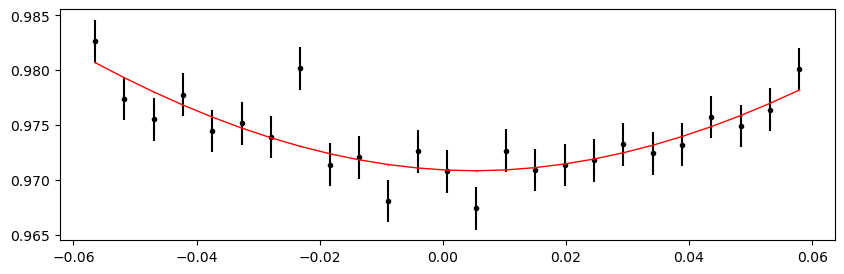

1959.774214 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.31it/s]


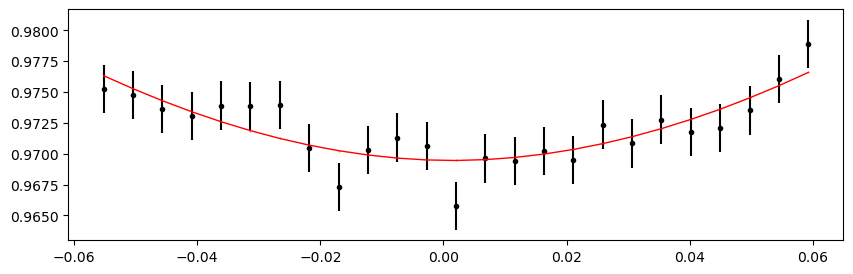

1960.065492 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.57it/s]


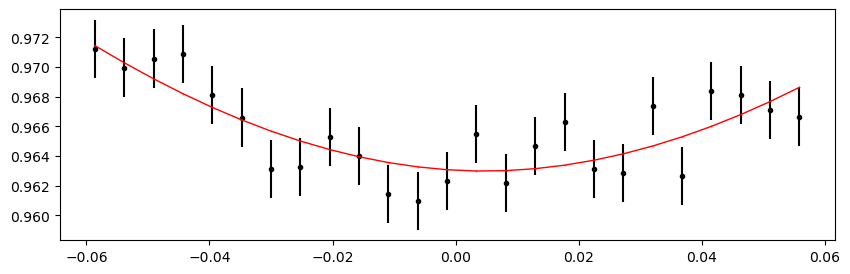

1960.3567699999999 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.18it/s]


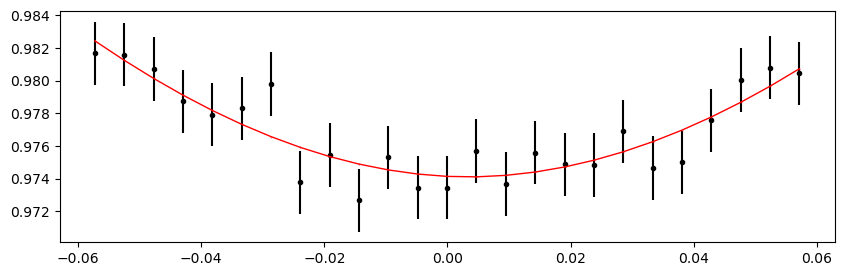

1960.648048 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.49it/s]


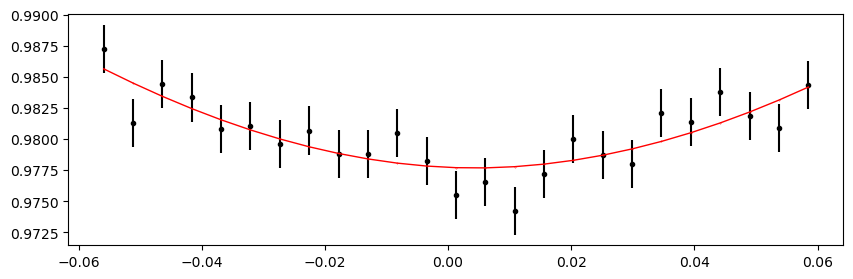

1960.939326 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 398.72it/s]


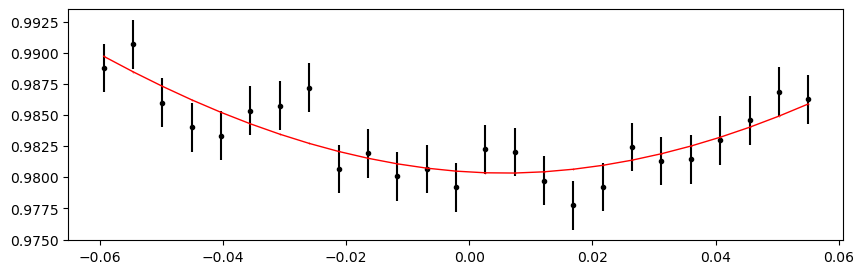

1961.2306039999999 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 413.57it/s]


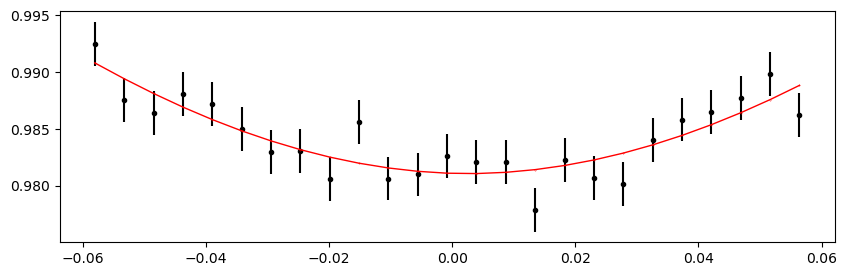

1961.521882 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.55it/s]


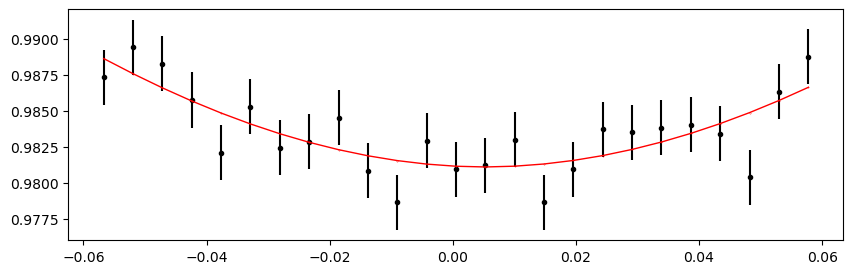

1962.1044379999998 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 414.66it/s]


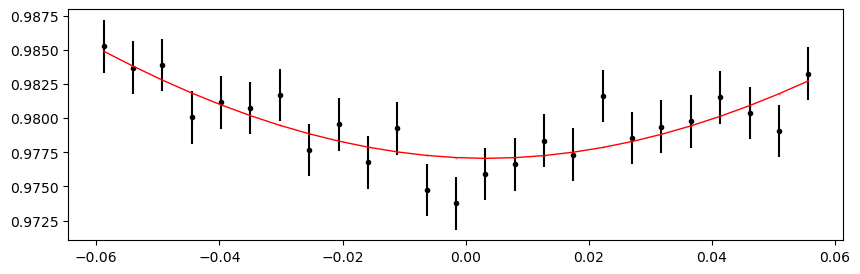

1962.395716 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 415.41it/s]


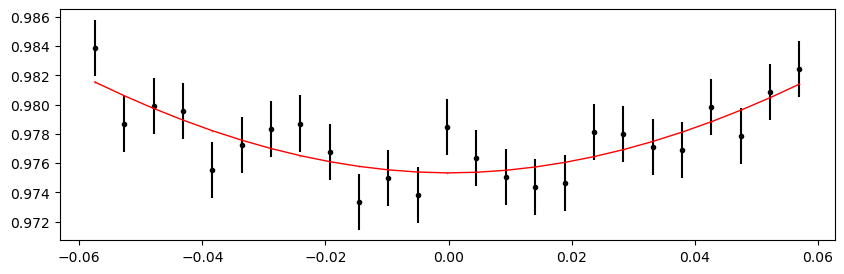

1962.686994 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.98it/s]


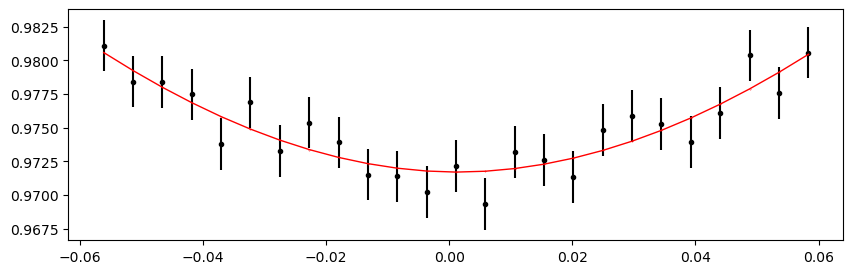

1962.9782719999998 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.41it/s]


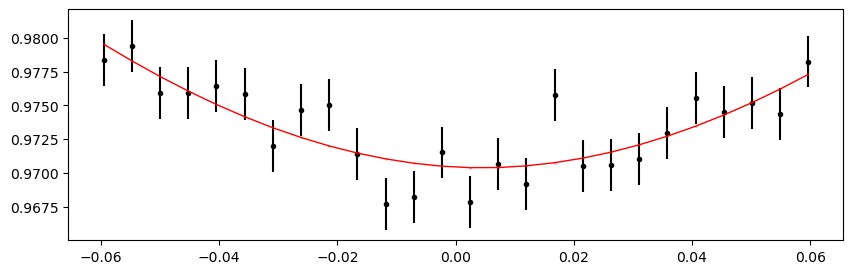

1963.26955 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 413.05it/s]


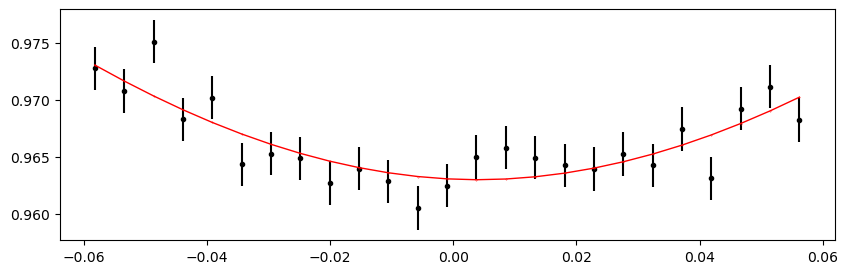

1963.560828 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.30it/s]


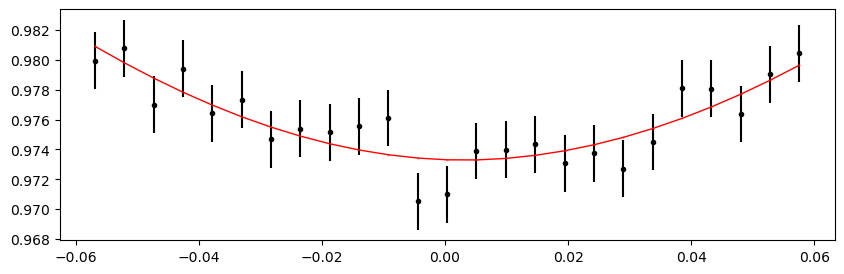

1963.8521059999998 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.67it/s]


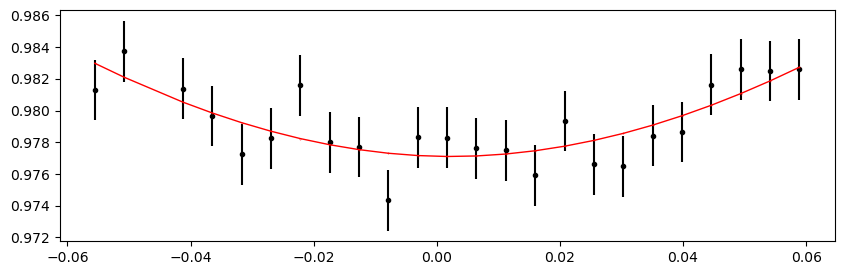

1964.143384 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 430.80it/s]


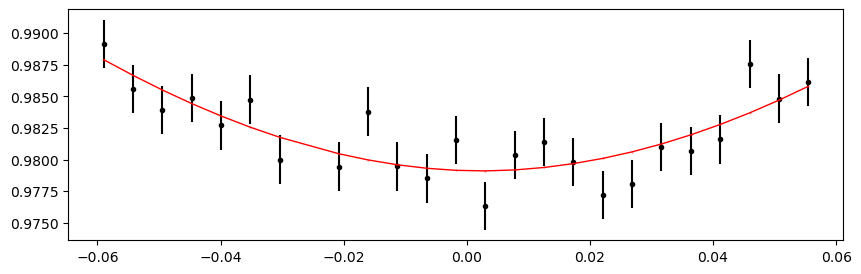

1964.434662 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 432.14it/s]


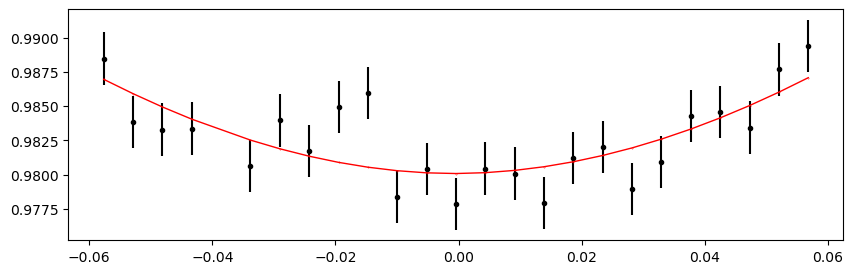

1964.72594 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 430.32it/s]


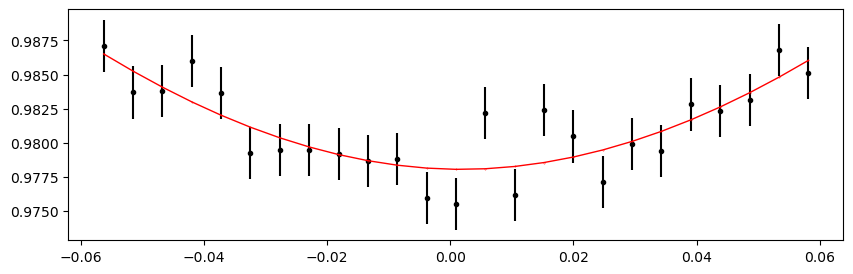

1965.3084959999999 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.45it/s]


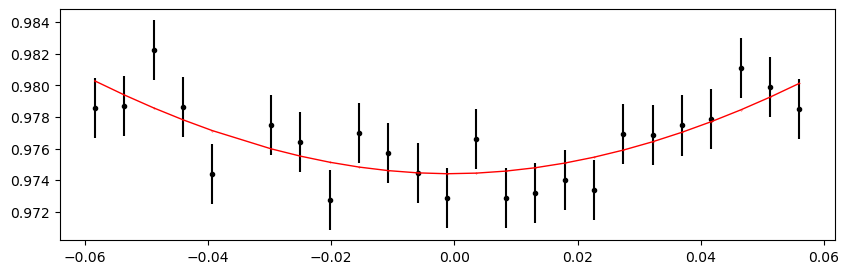

1965.599774 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 422.72it/s]


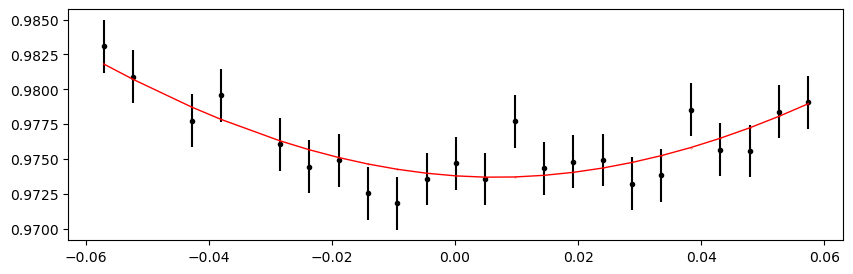

1965.891052 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.40it/s]


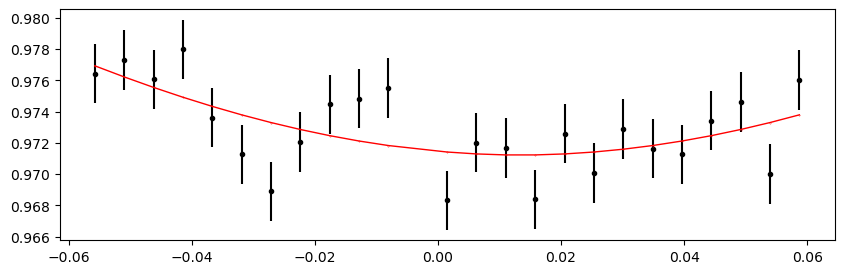

1966.1823299999999 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 430.57it/s]


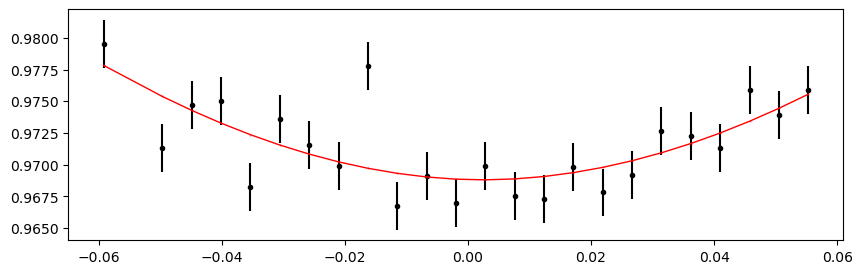

1966.473608 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 433.58it/s]


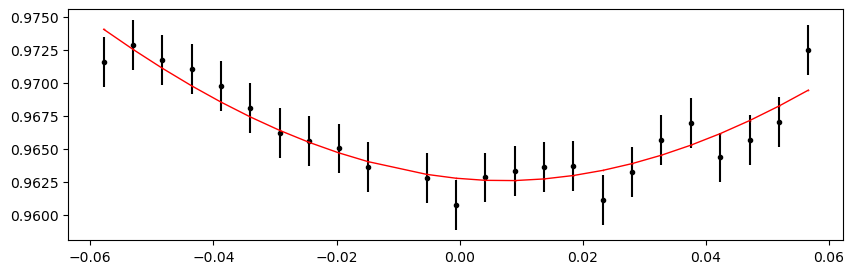

1966.764886 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 431.69it/s]


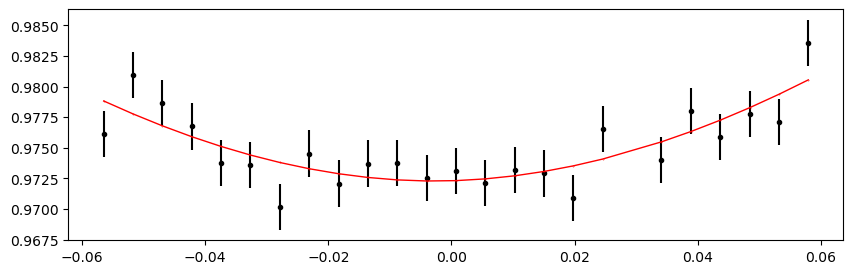

1967.0561639999999 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 432.19it/s]


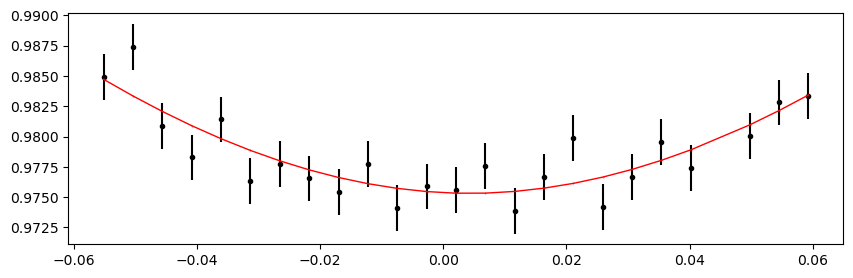

1967.347442 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.22it/s]


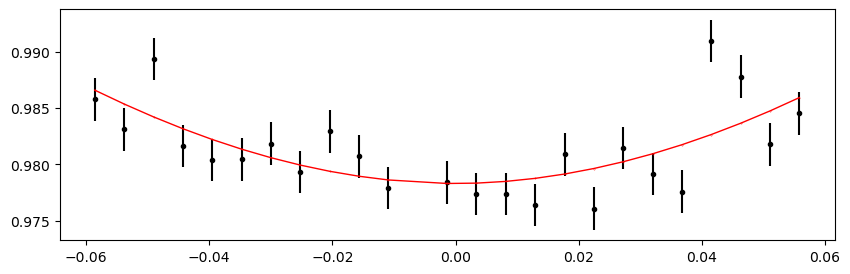

1967.63872 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 429.77it/s]


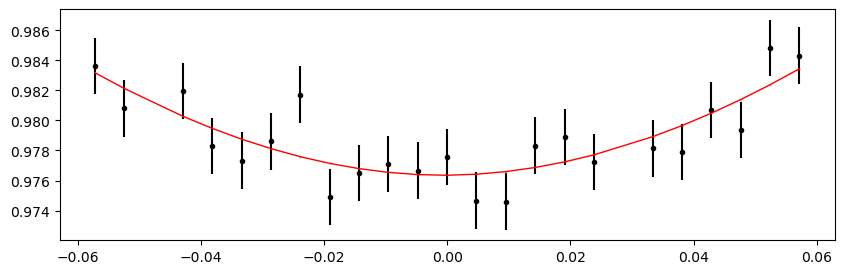

1967.9299979999998 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.25it/s]


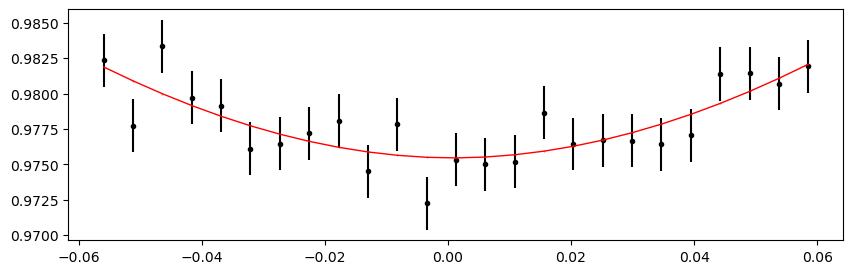

1969.386388 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 397.22it/s]


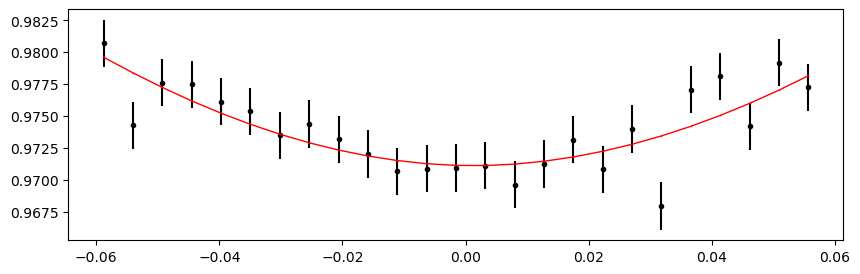

1969.6776659999998 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.22it/s]


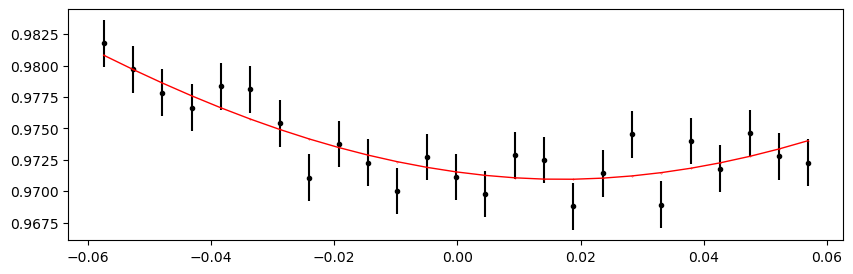

1969.968944 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.78it/s]


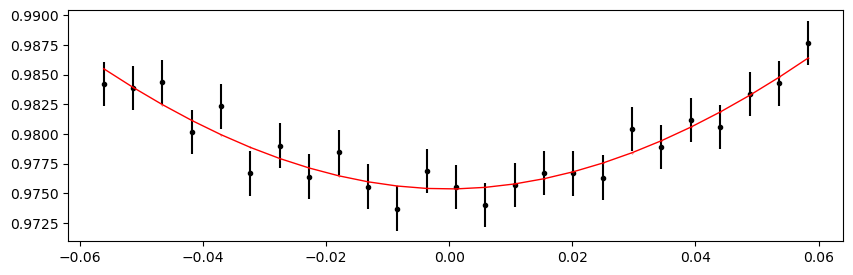

1970.2602219999999 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.63it/s]


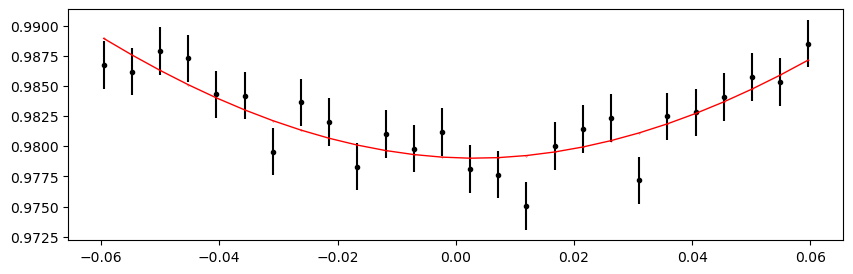

1970.5515 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.77it/s]


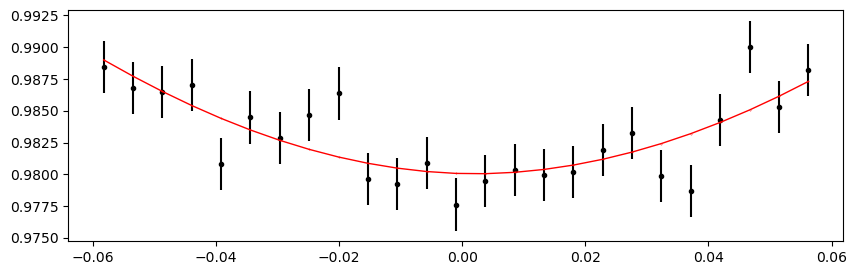

1972.299168 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.99it/s]


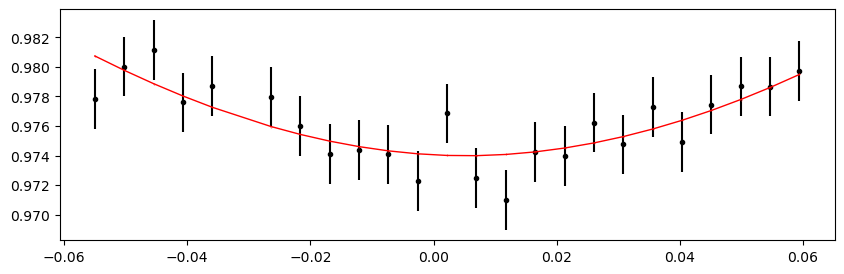

1972.590446 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.22it/s]


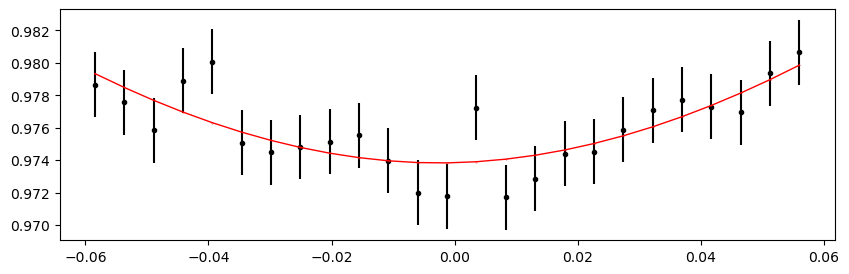

1972.8817239999998 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 429.71it/s]


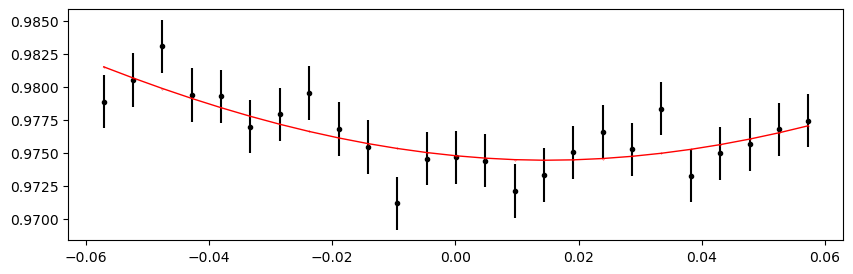

1973.173002 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 431.90it/s]


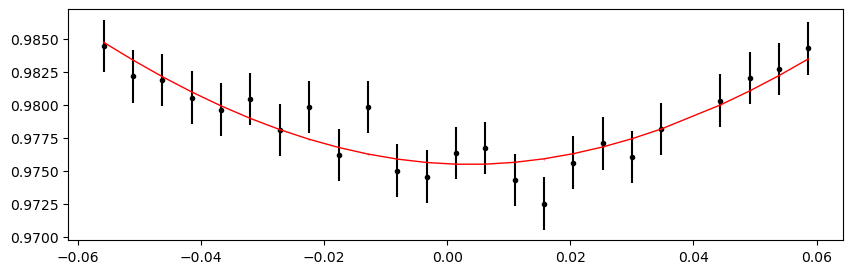

1973.46428 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.87it/s]


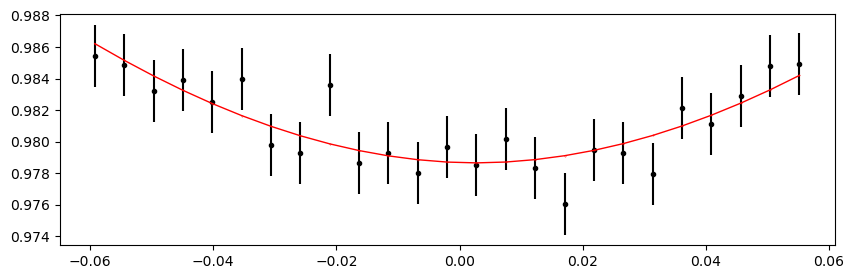

1973.7555579999998 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.52it/s]


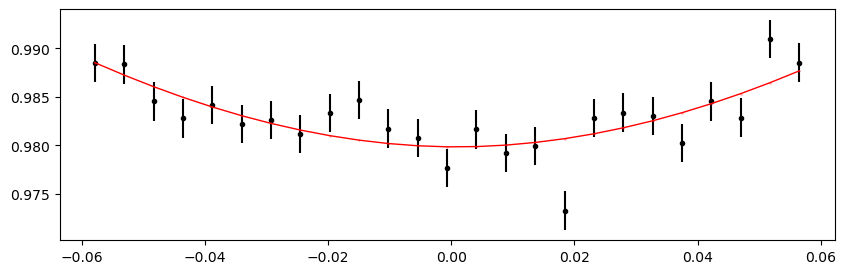

1974.046836 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 431.38it/s]


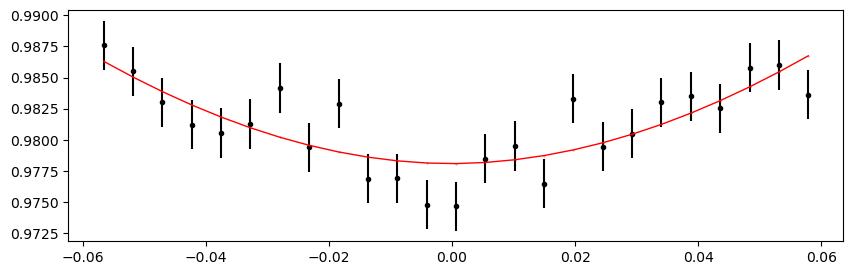

1974.338114 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 429.68it/s]


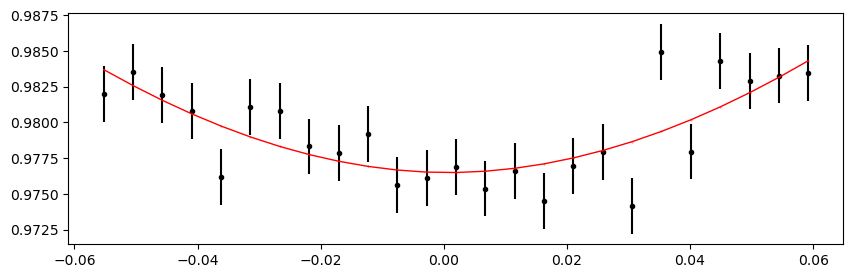

1974.92067 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 432.71it/s]


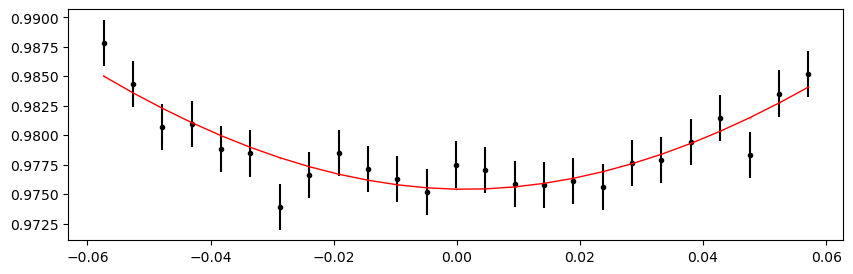

1975.211948 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.81it/s]


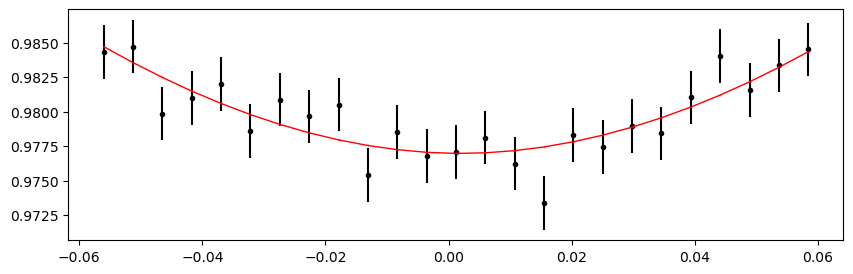

1975.5032259999998 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.94it/s]


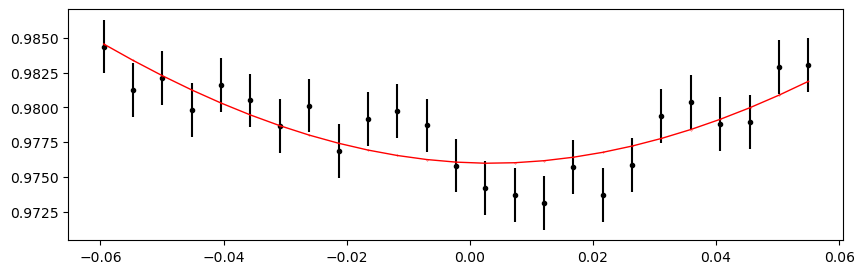

1975.794504 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 430.62it/s]


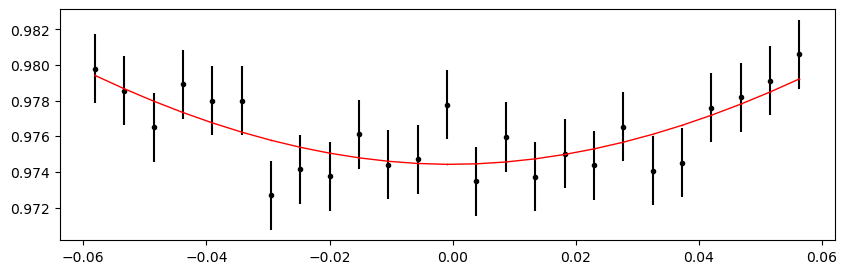

1976.0857819999999 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 429.52it/s]


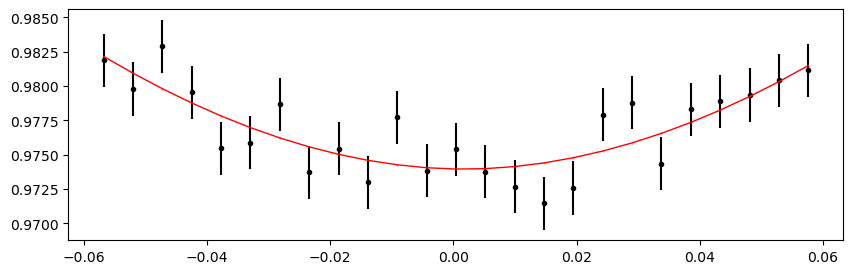

1976.37706 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 430.16it/s]


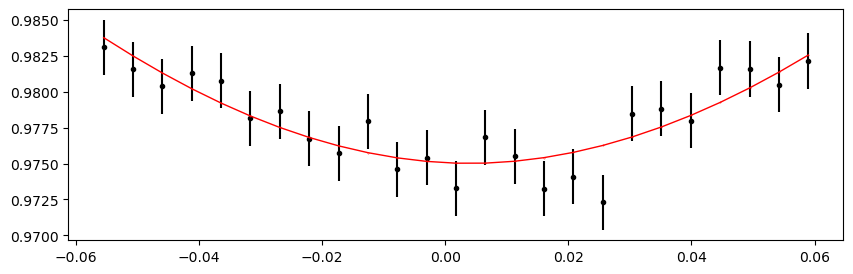

1976.668338 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.69it/s]


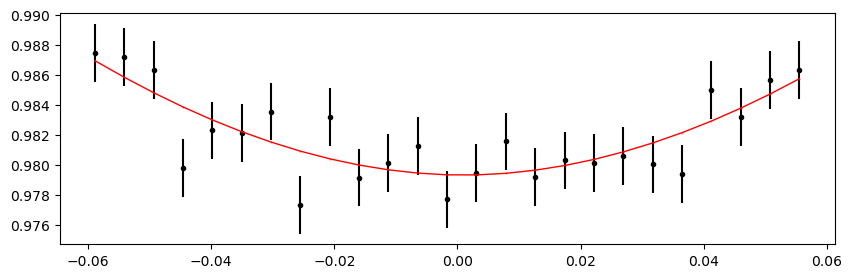

1976.9596159999999 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 430.57it/s]


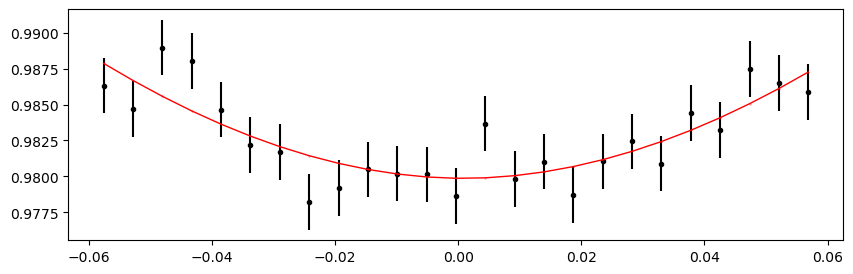

1977.250894 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 430.79it/s]


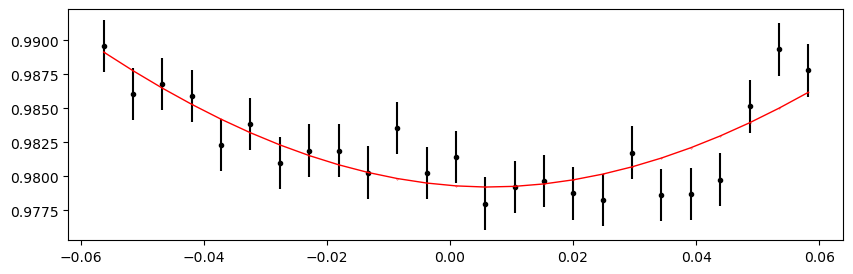

1977.542172 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.41it/s]


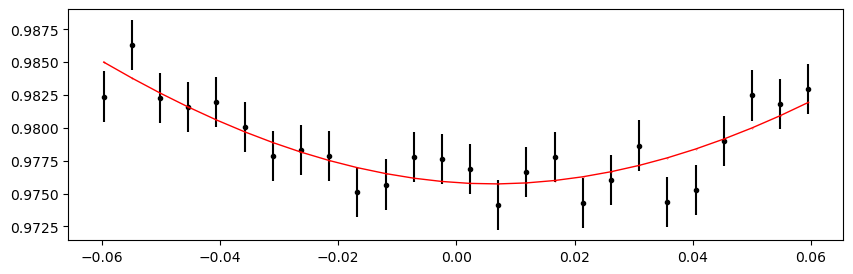

1978.124728 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 429.16it/s]


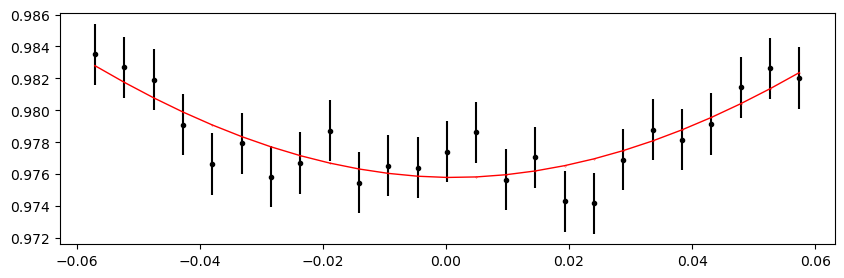

1978.416006 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.73it/s]


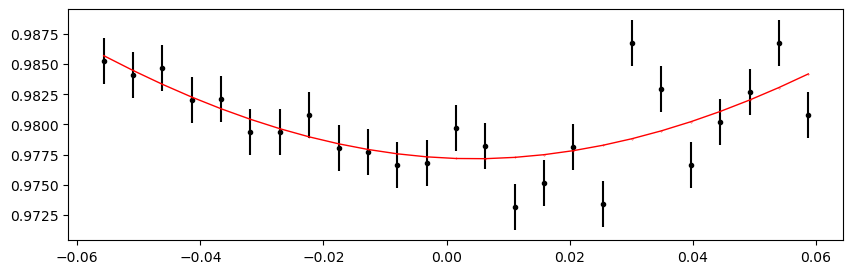

1978.7072839999998 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 429.27it/s]


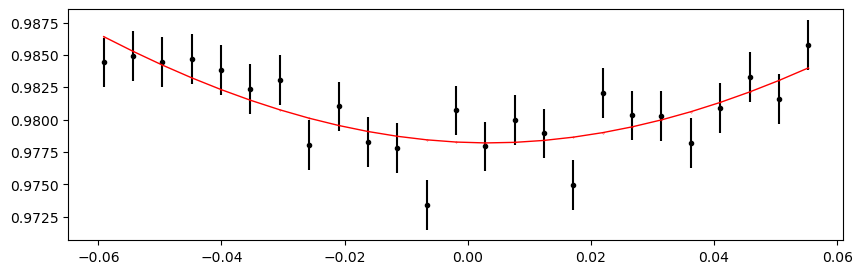

1978.998562 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.92it/s]


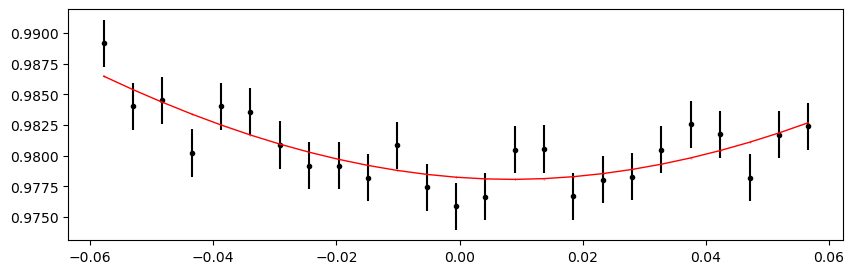

1979.28984 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.49it/s]


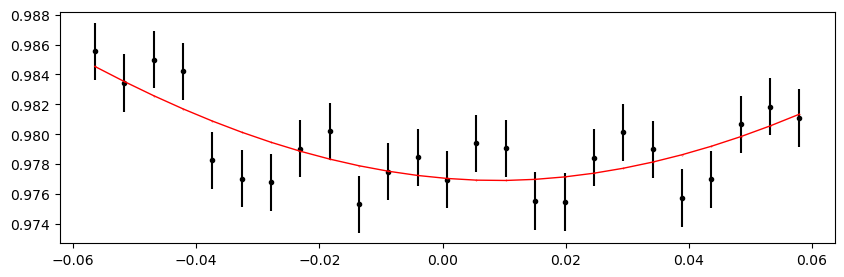

1979.5811179999998 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 429.73it/s]


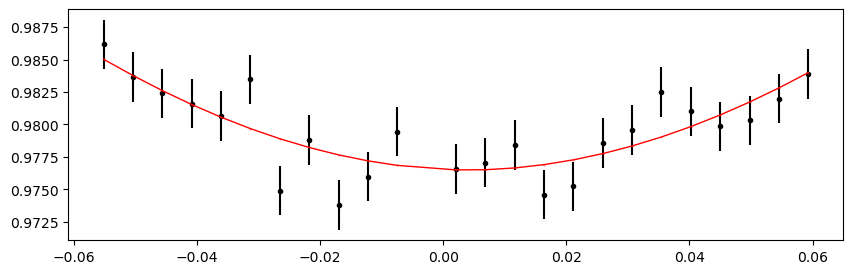

1979.872396 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 429.70it/s]


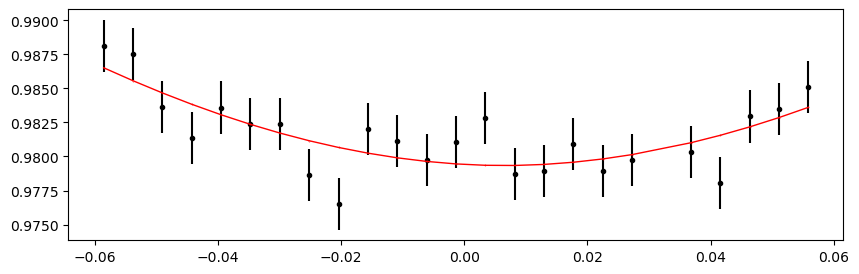

1980.163674 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 433.43it/s]


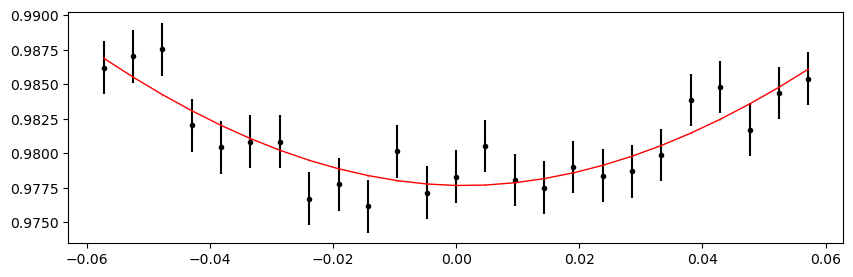

1980.4549519999998 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 430.17it/s]


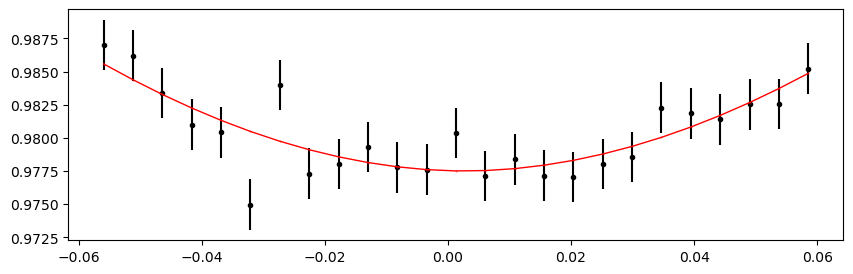

1980.74623 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 432.71it/s]


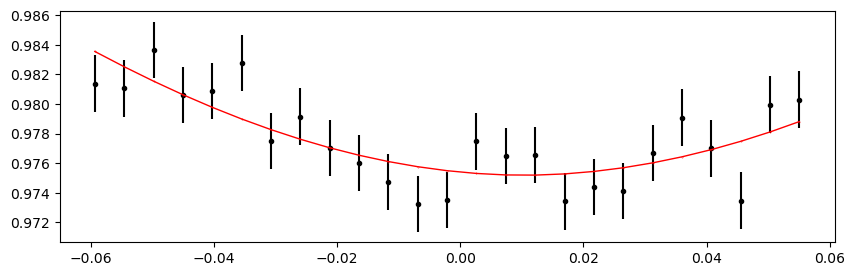

1981.328786 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 432.65it/s]


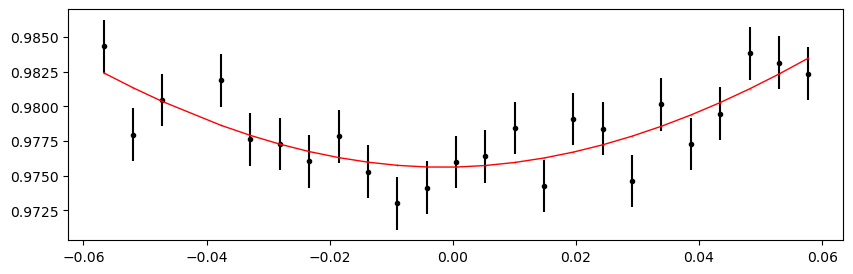

1981.620064 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.91it/s]


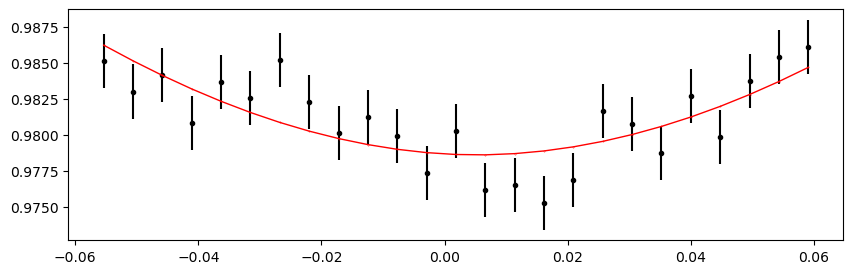

1981.9113419999999 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.94it/s]


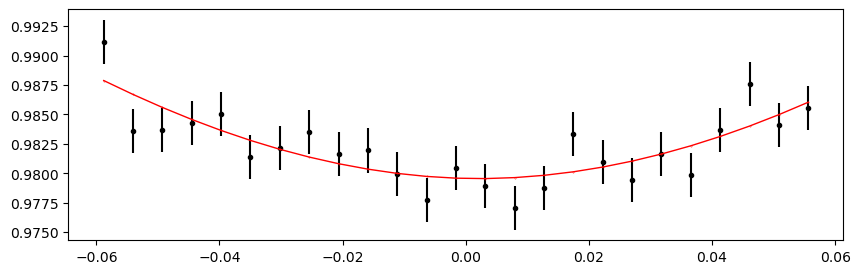

1982.20262 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.52it/s]


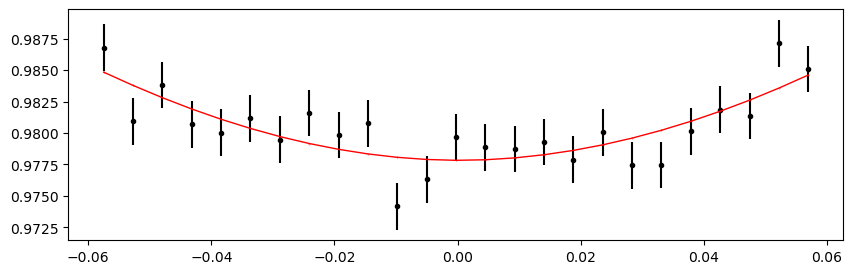

1983.6590099999999 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 431.74it/s]


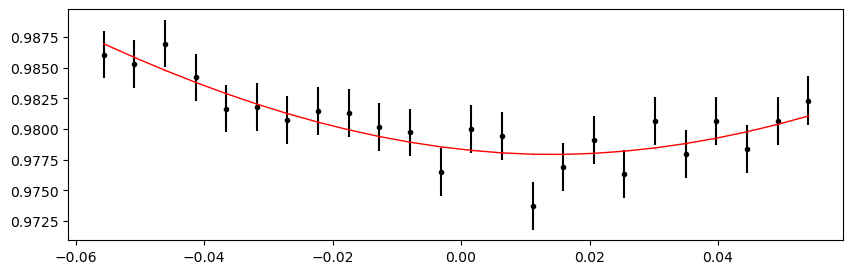

1983.950288 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.06it/s]


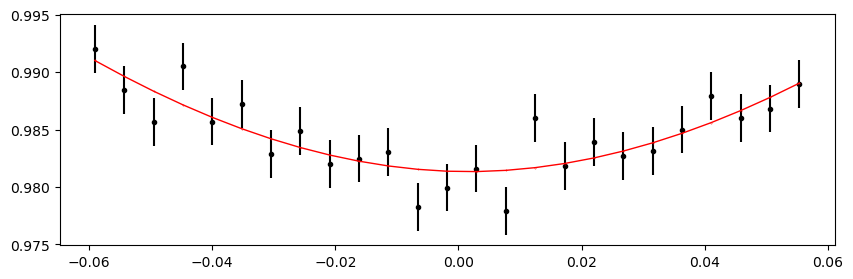

1984.5328439999998 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 430.66it/s]


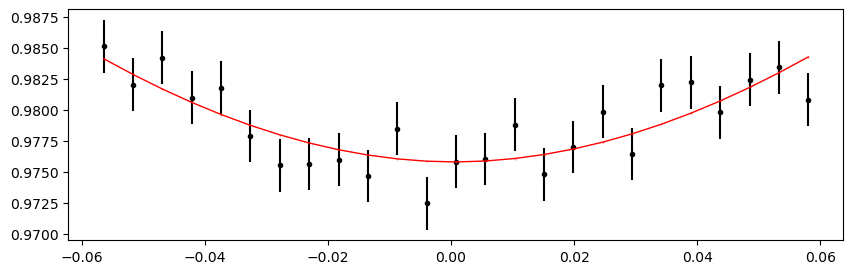

1984.824122 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.46it/s]


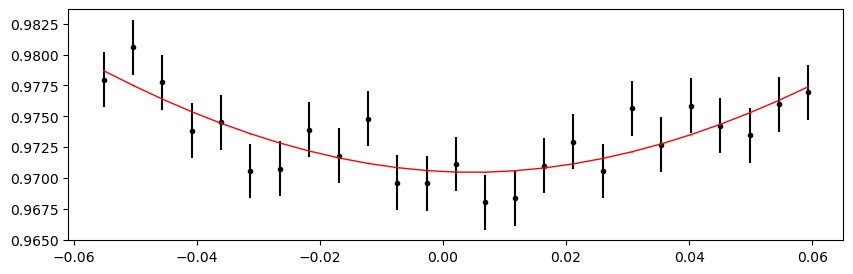

1985.1154 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 430.95it/s]


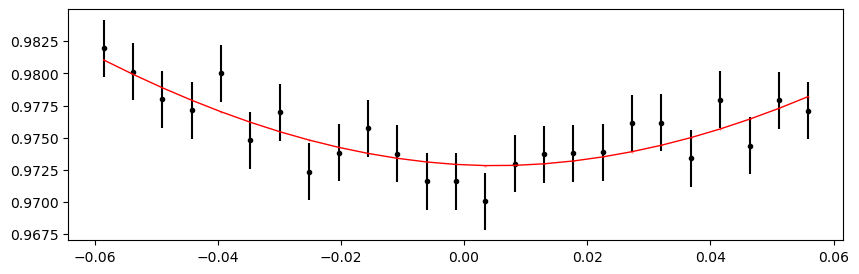

1985.4066779999998 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 431.25it/s]


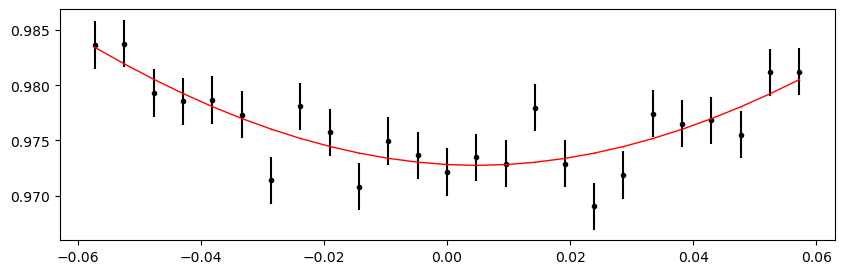

1985.697956 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 431.59it/s]


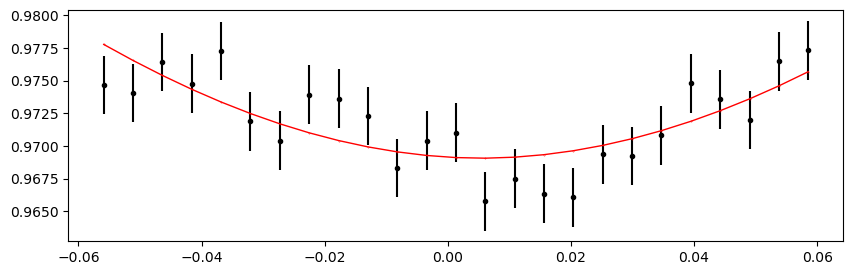

1985.989234 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 431.91it/s]


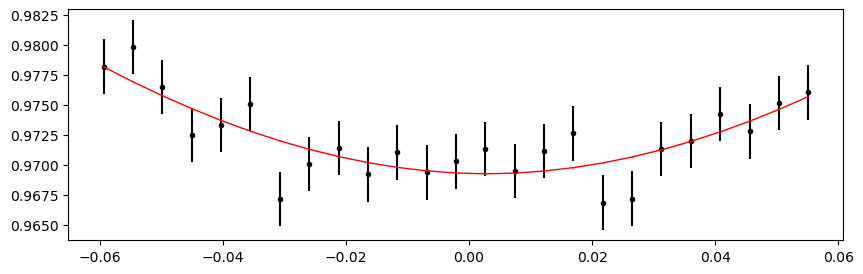

1986.2805119999998 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 430.32it/s]


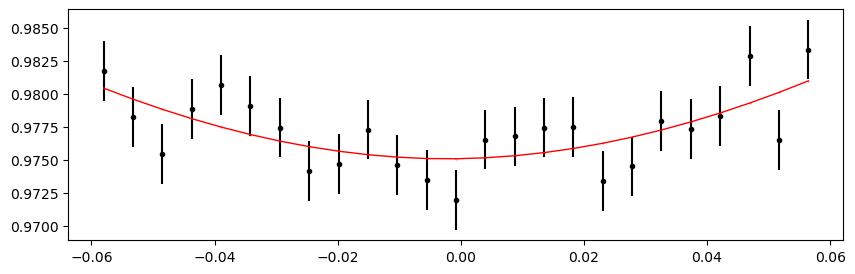

1986.57179 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 429.73it/s]


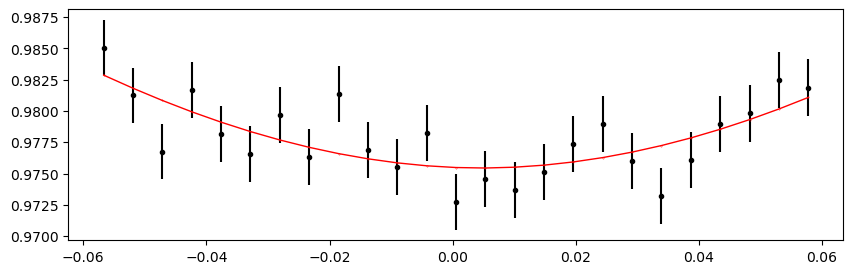

1986.8630679999999 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 433.97it/s]


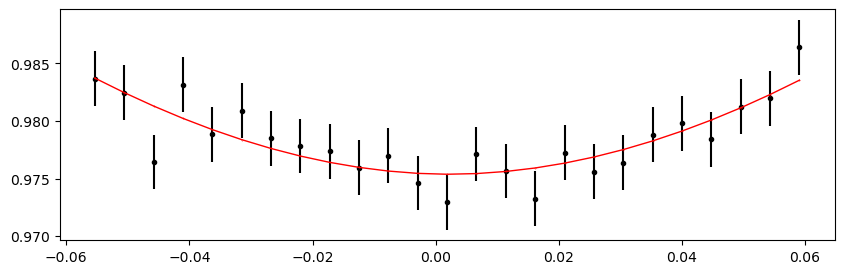

1987.154346 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.28it/s]


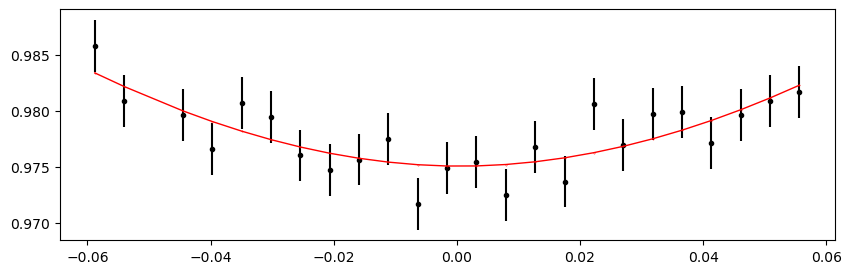

1987.7369019999999 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.38it/s]


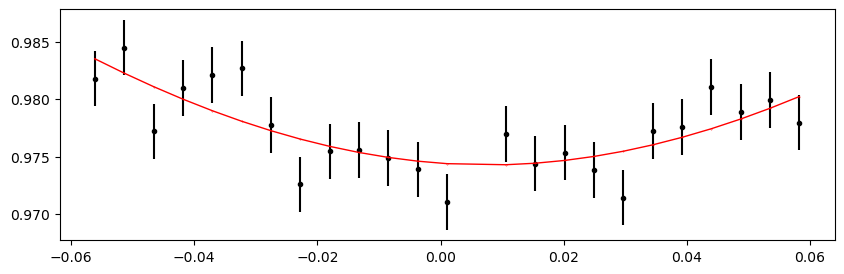

1988.02818 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 432.21it/s]


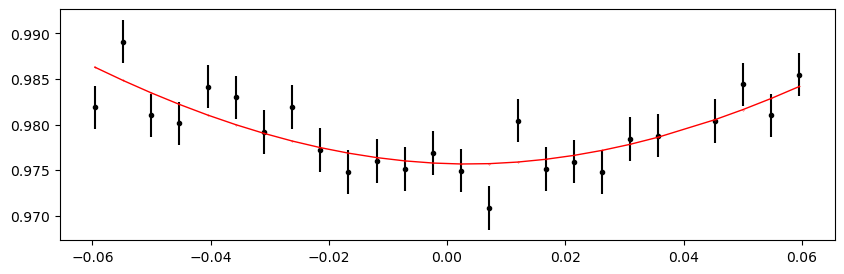

1988.319458 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 444.34it/s]


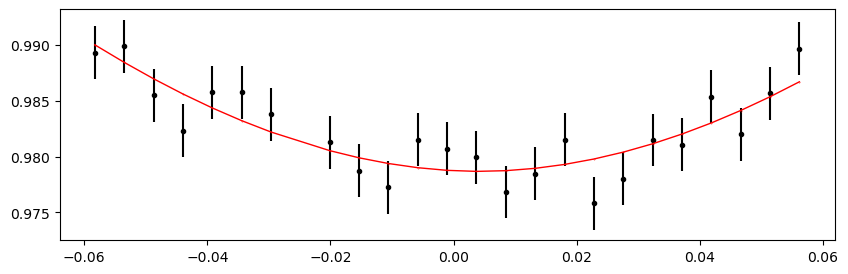

1988.6107359999999 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.28it/s]


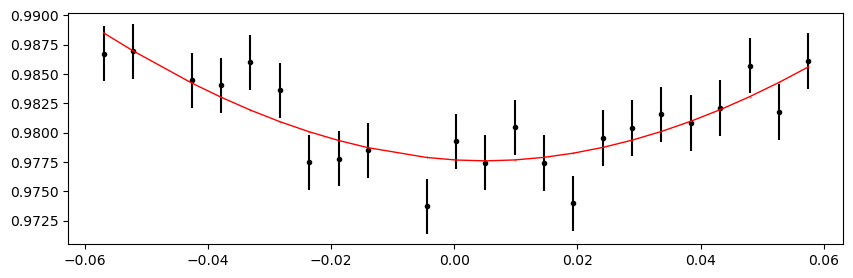

1988.902014 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.53it/s]


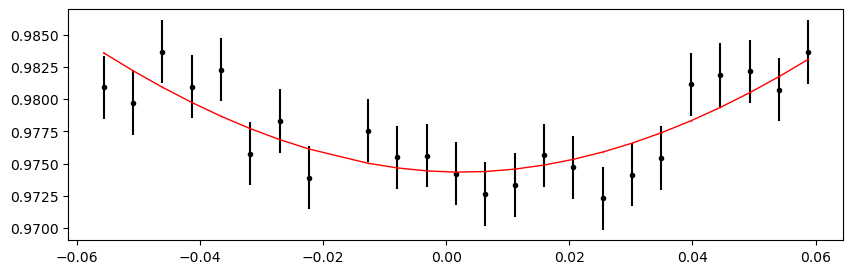

1989.193292 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.37it/s]


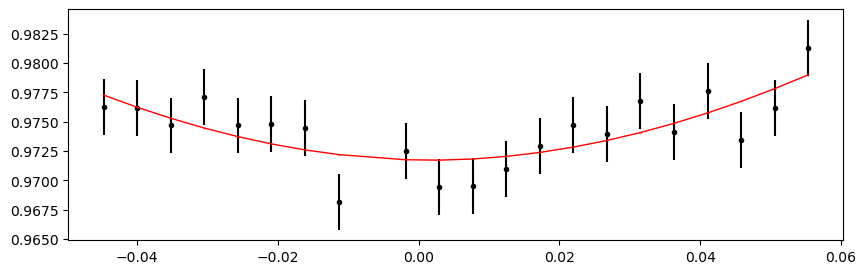

1989.4845699999998 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 429.39it/s]


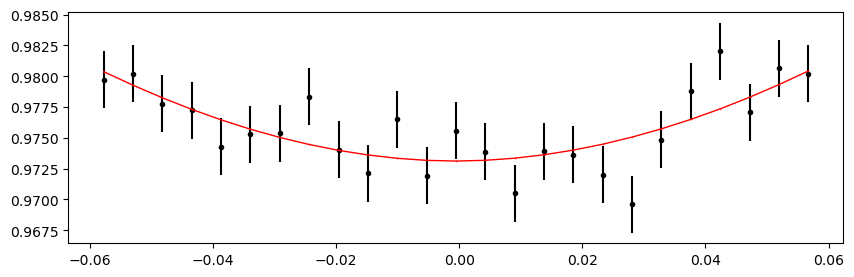

1989.775848 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 432.52it/s]


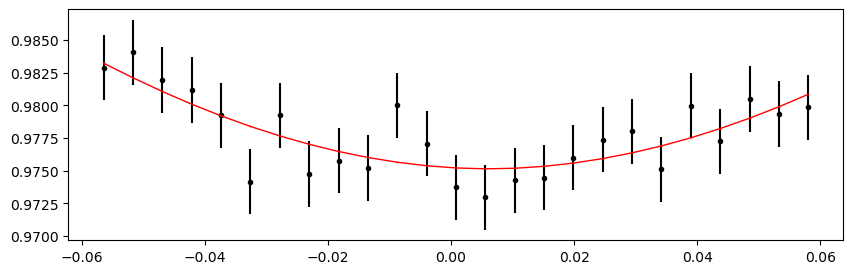

1990.067126 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 433.99it/s]


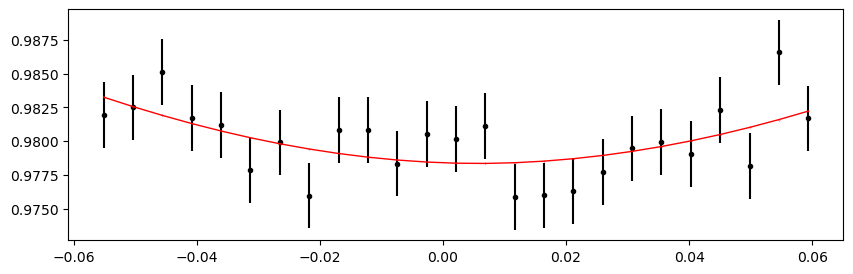

1990.3584039999998 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.93it/s]


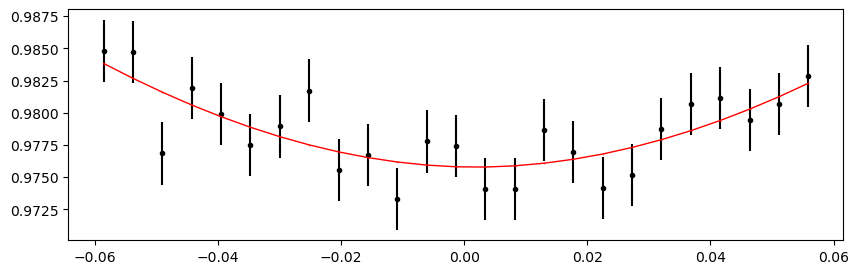

1990.94096 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 432.01it/s]


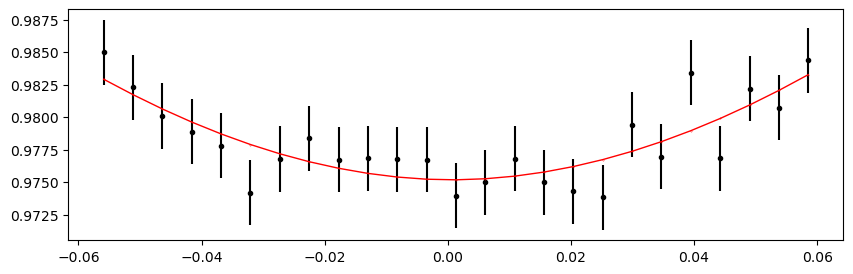

1991.2322379999998 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 444.35it/s]


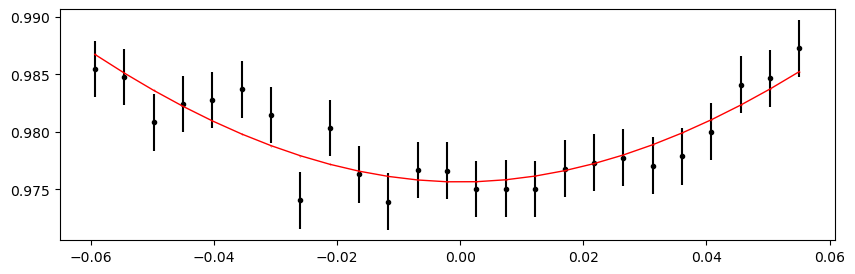

1991.523516 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 433.03it/s]


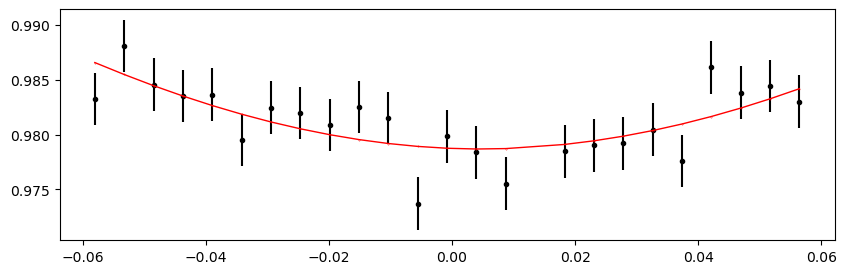

1991.814794 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 433.72it/s]


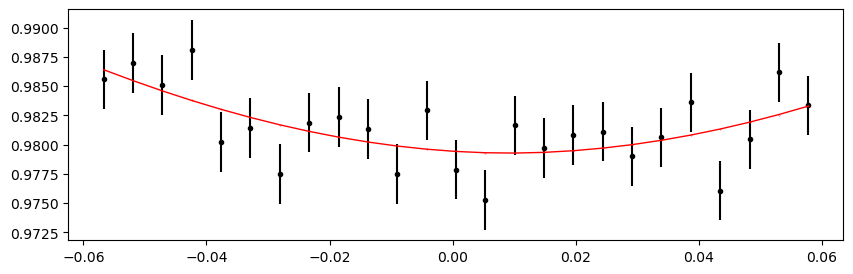

1992.106072 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:18<00:00, 537.50it/s]


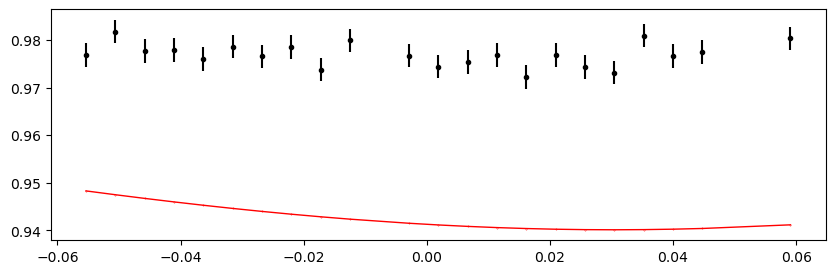

1992.39735 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 432.75it/s]


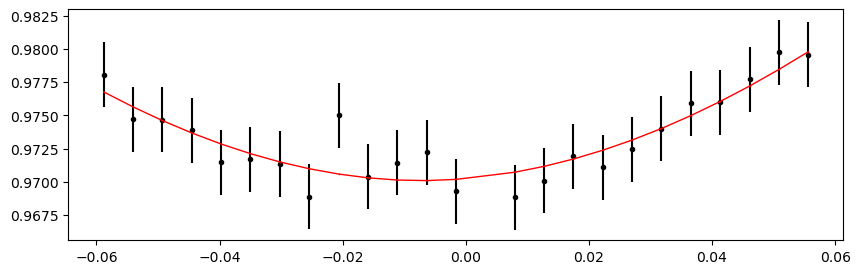

1992.6886279999999 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.16it/s]


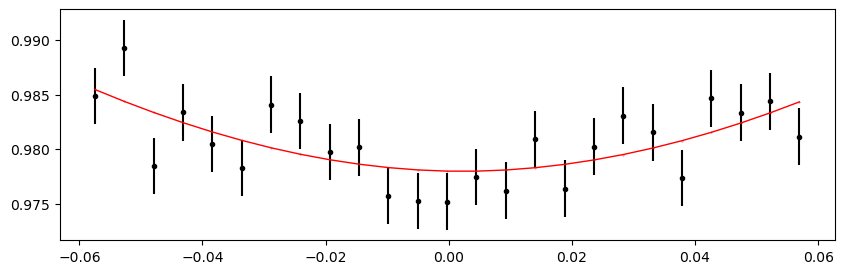

1992.979906 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 444.92it/s]


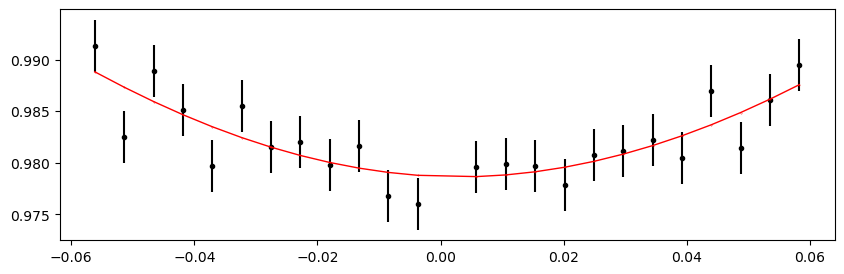

1993.271184 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 429.36it/s]


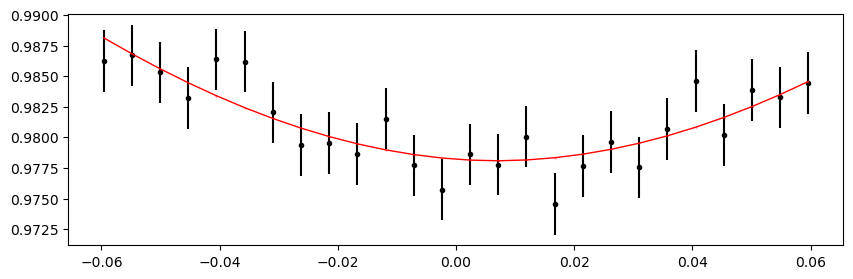

1993.5624619999999 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 431.28it/s]


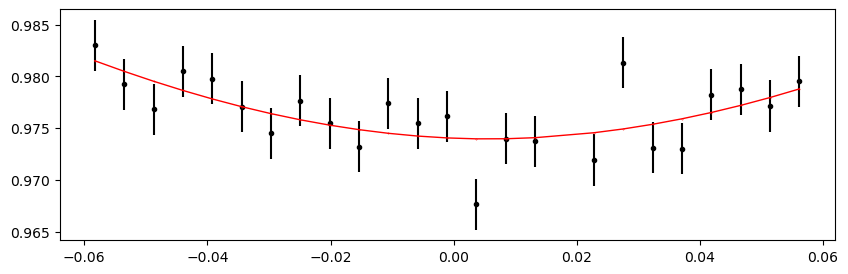

1994.145018 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 430.43it/s]


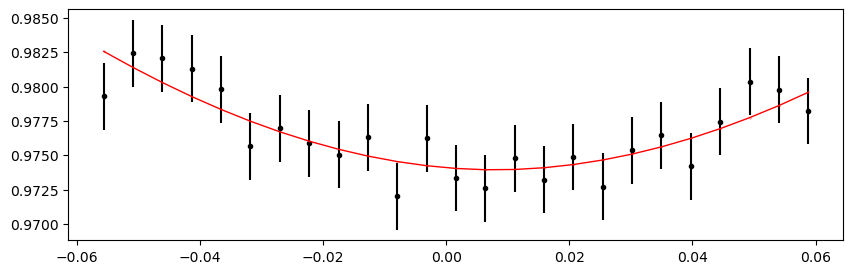

1994.4362959999999 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 429.65it/s]


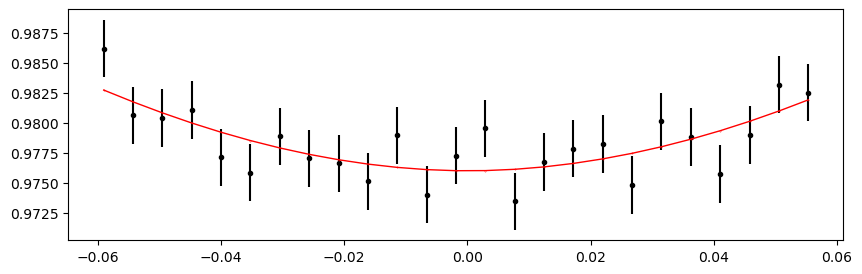

1994.727574 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 430.02it/s]


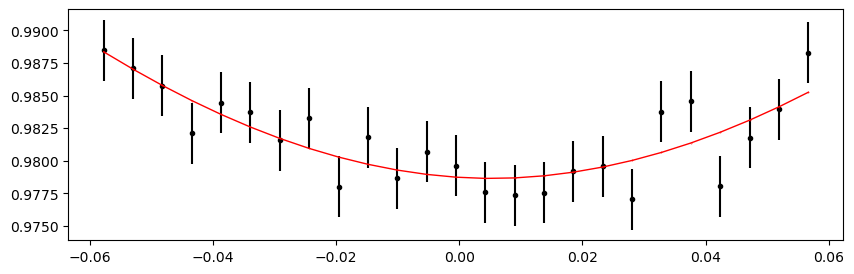

1995.018852 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 432.17it/s]


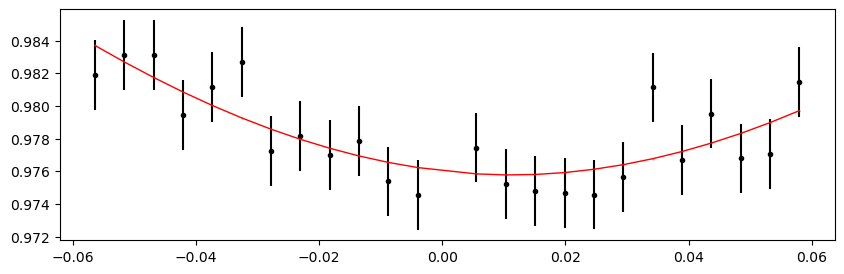

1995.3101299999998 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 430.53it/s]


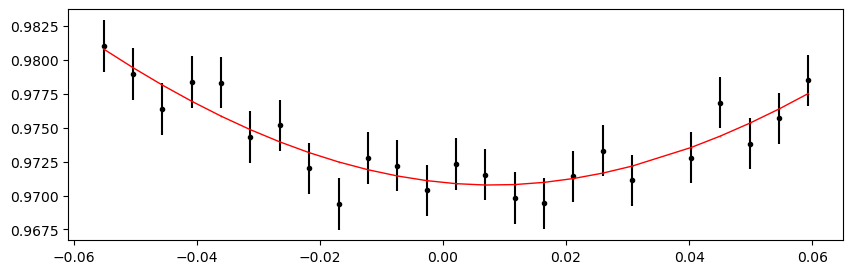

1995.601408 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 430.65it/s]


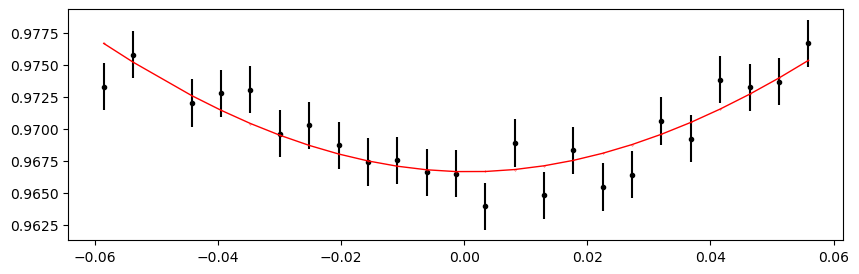

1997.349076 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 430.05it/s]


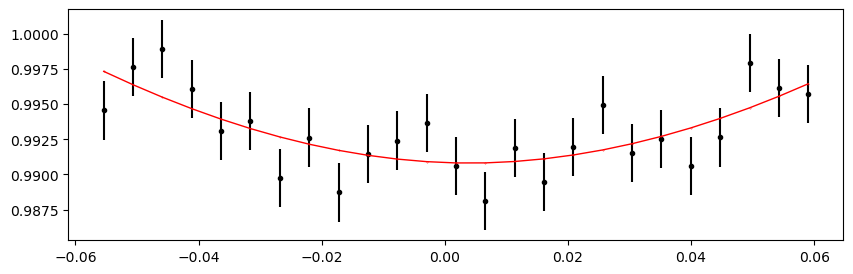

1997.640354 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.06it/s]


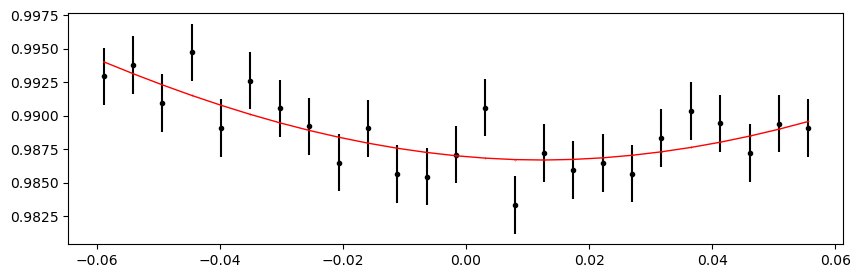

1997.931632 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 433.50it/s]


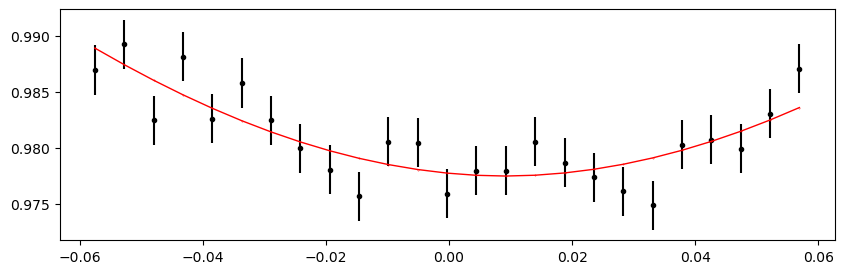

1998.22291 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 431.39it/s]


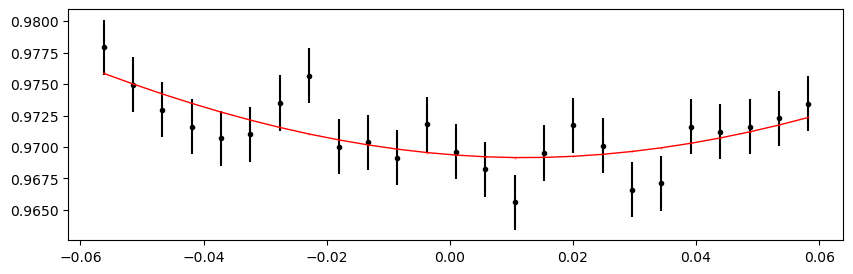

1998.5141879999999 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.77it/s]


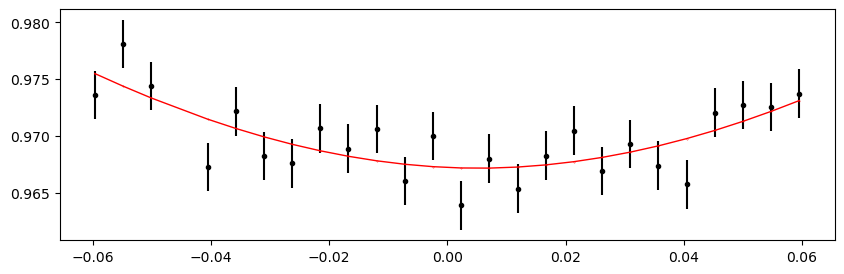

1998.805466 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.53it/s]


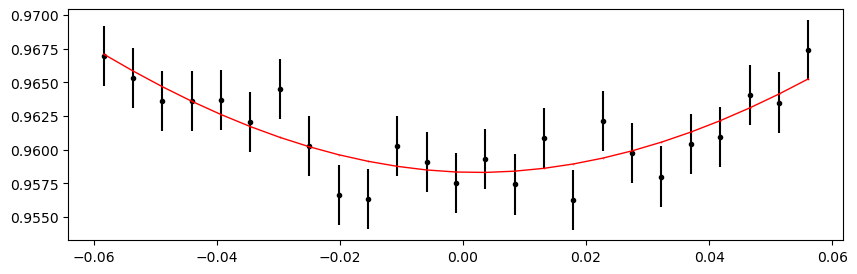

1999.096744 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 429.32it/s]


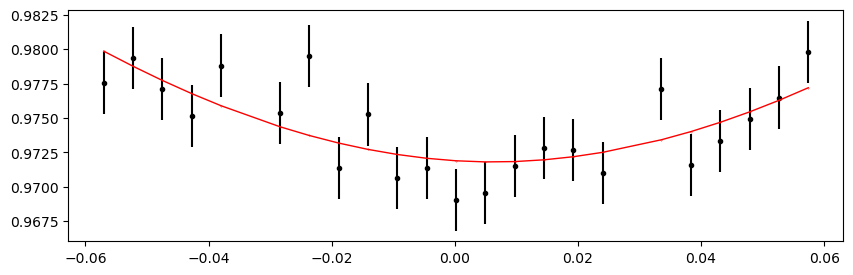

1999.3880219999999 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 431.38it/s]


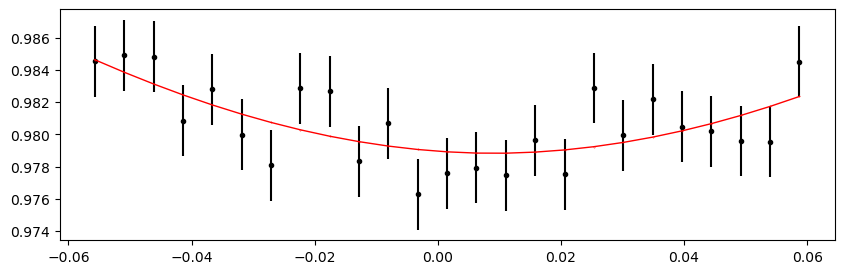

1999.6793 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 432.00it/s]


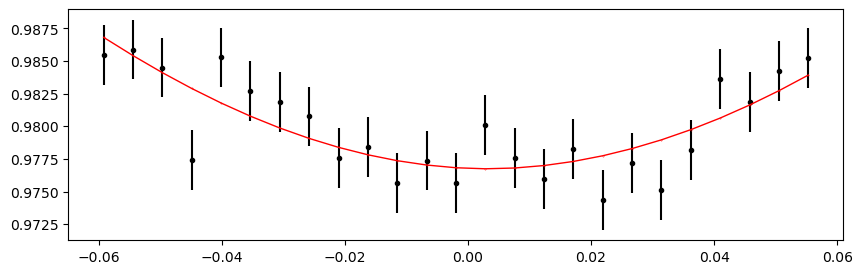

1999.970578 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 432.21it/s]


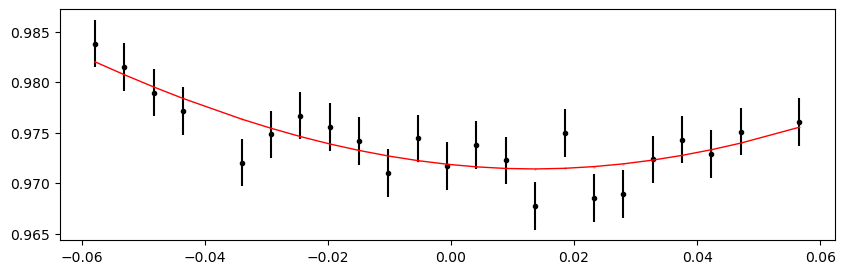

Time 2000.2618559999999 does not have enough data points: 6
Time 2000.553134 does not have enough data points: 16
2000.844412 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.42it/s]


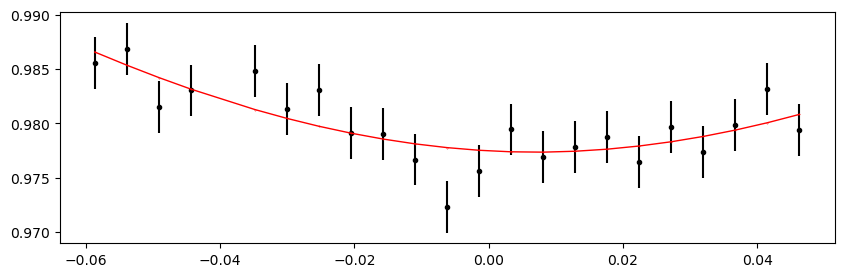

2001.1356899999998 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 432.97it/s]


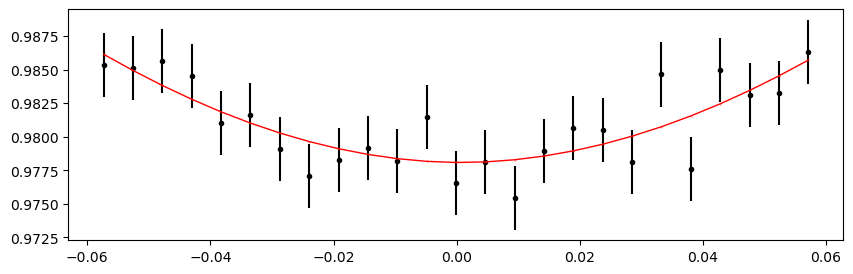

2001.426968 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 431.55it/s]


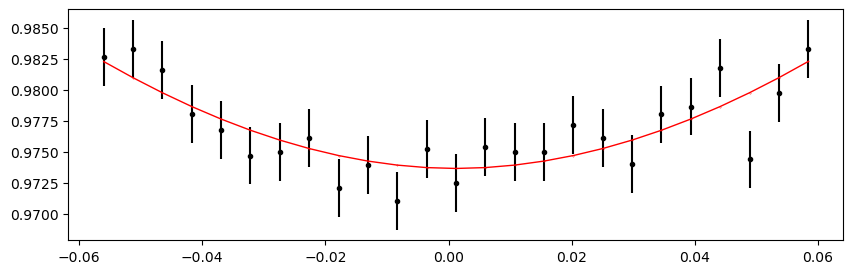

2001.718246 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 430.77it/s]


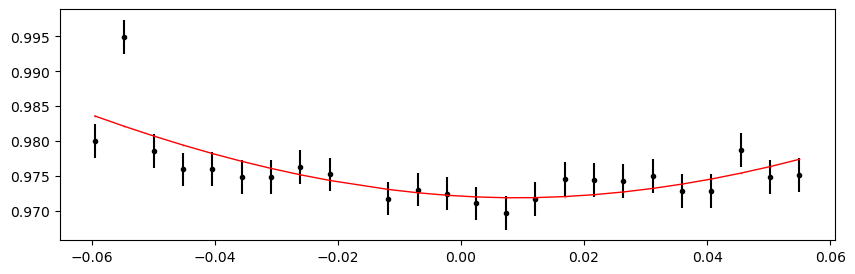

2002.0095239999998 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 429.59it/s]


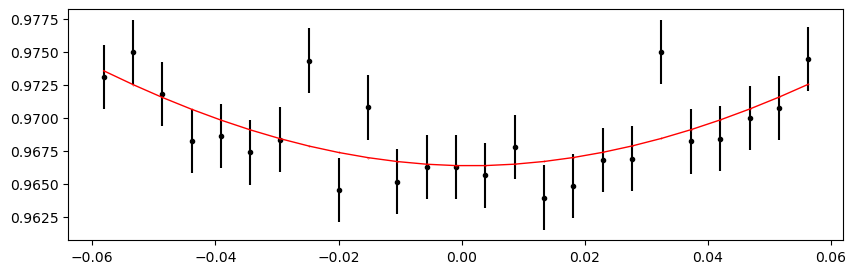

2002.300802 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 430.27it/s]


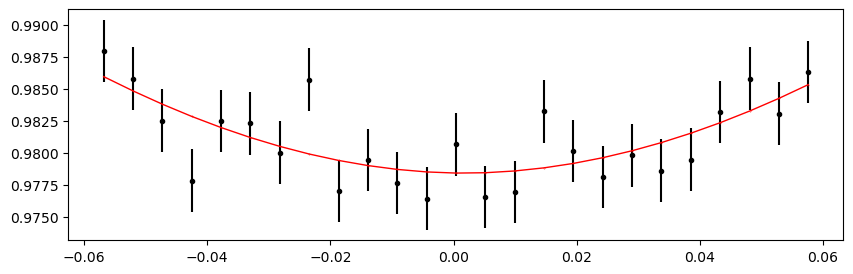

2002.59208 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 433.15it/s]


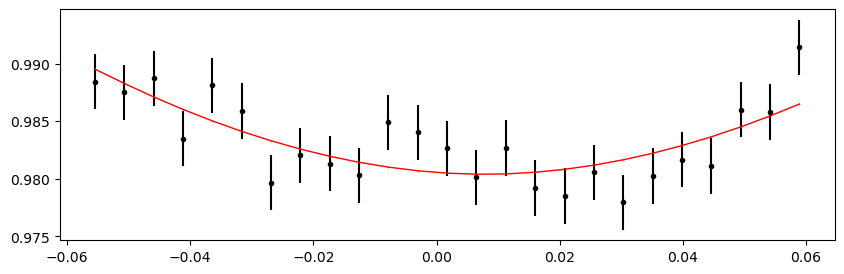

2002.8833579999998 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 431.70it/s]


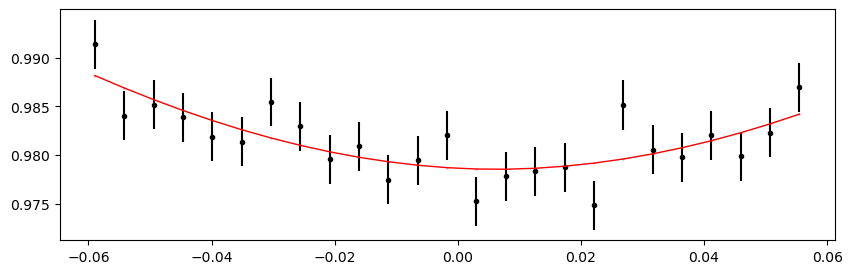

2003.174636 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.68it/s]


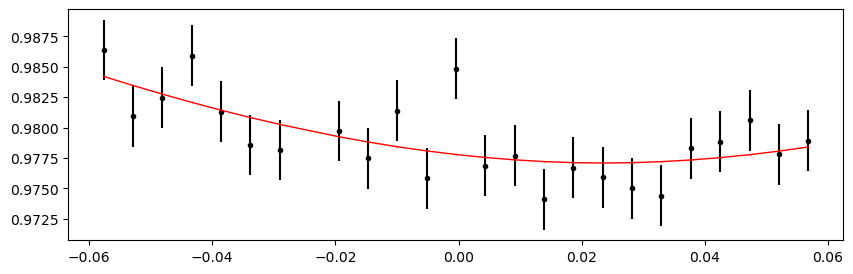

2003.4659139999999 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 432.07it/s]


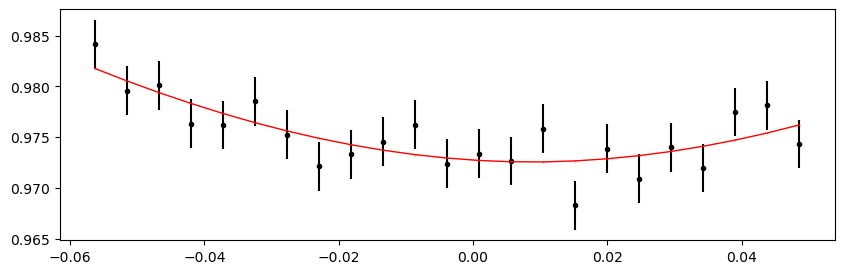

2004.04847 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 430.36it/s]


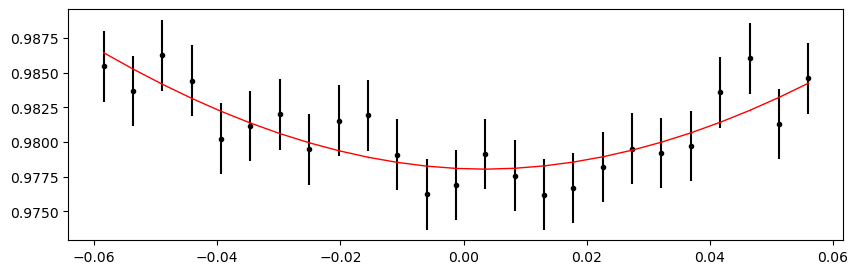

2004.3397479999999 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.01it/s]


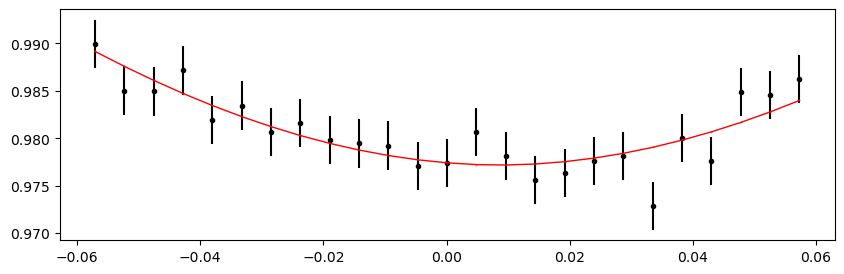

2004.631026 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 431.59it/s]


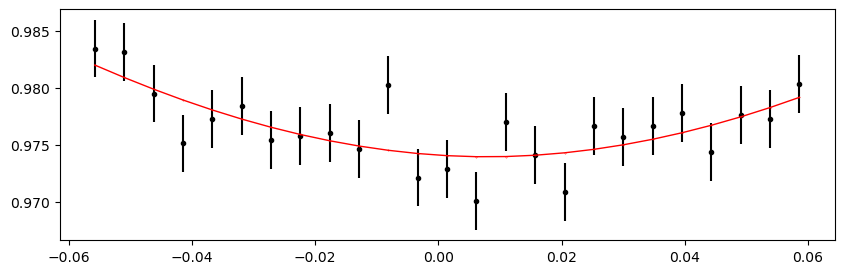

2004.922304 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.01it/s]


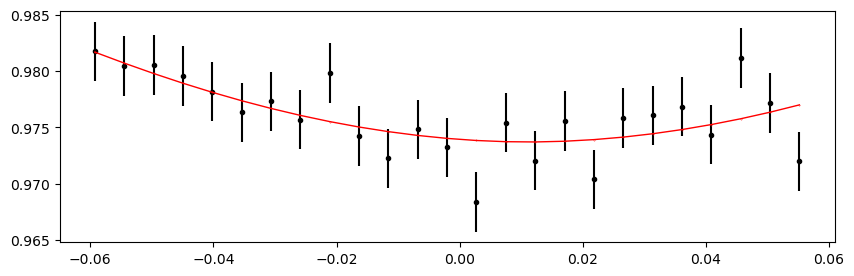

2005.2135819999999 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 429.87it/s]


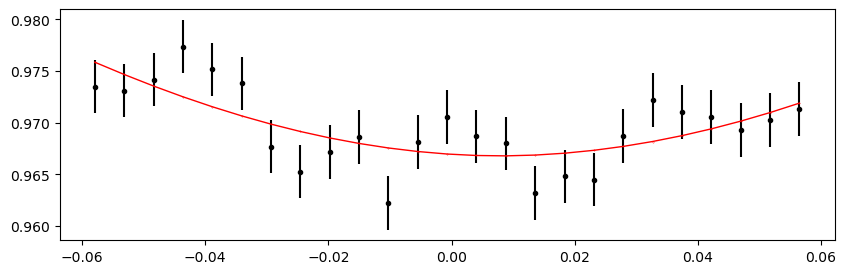

2005.50486 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 433.67it/s]


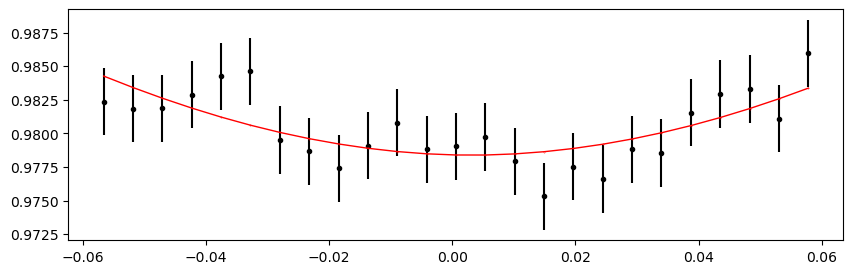

2005.796138 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 441.24it/s]


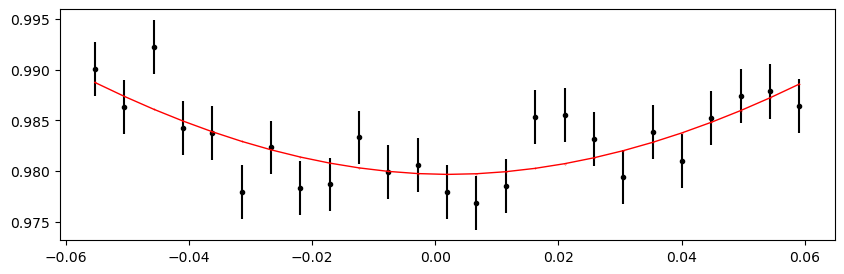

2006.0874159999998 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 421.70it/s]


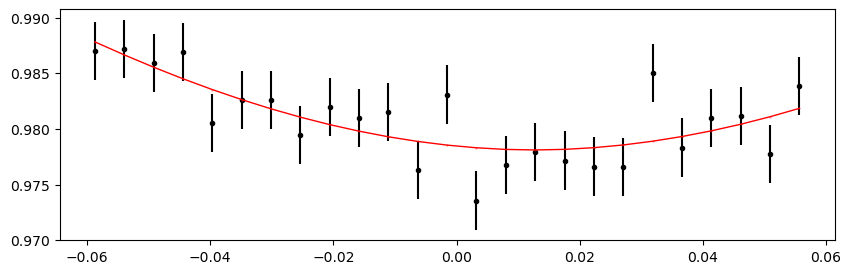

2006.378694 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 433.34it/s]


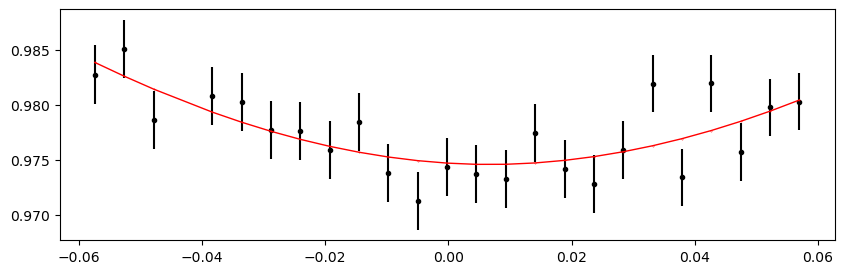

2006.669972 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.32it/s]


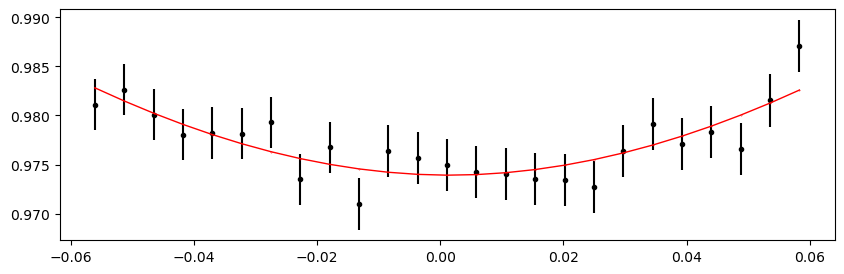

2007.252528 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 432.37it/s]


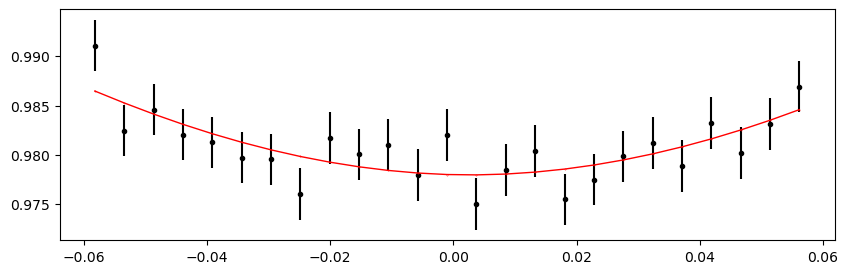

2007.543806 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 430.62it/s]


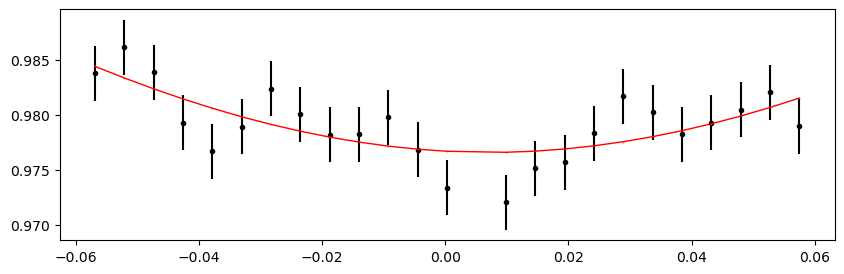

2007.8350839999998 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 431.87it/s]


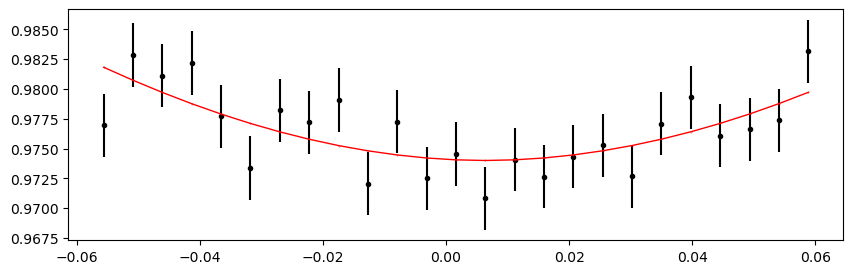

2008.126362 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 432.76it/s]


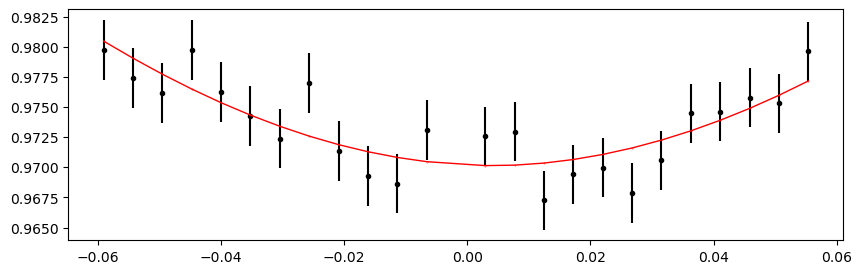

2008.41764 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 430.90it/s]


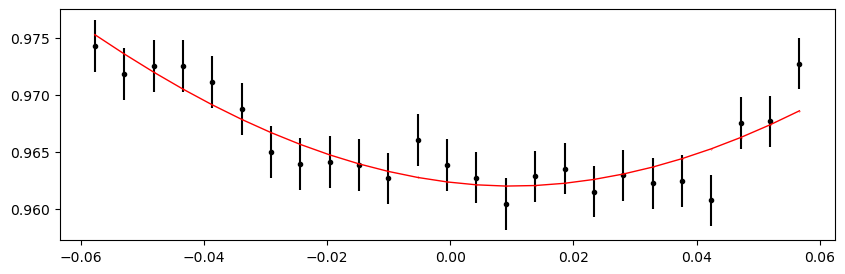

2008.7089179999998 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 430.24it/s]


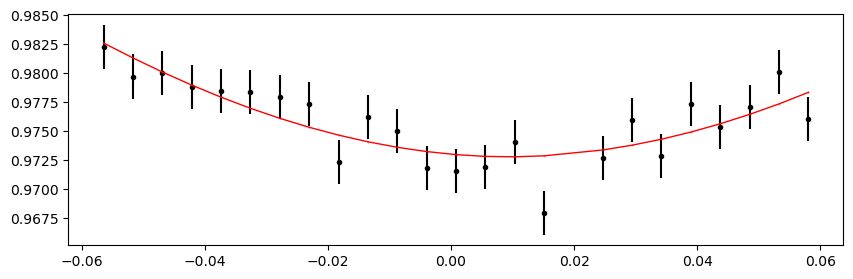

2009.000196 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.90it/s]


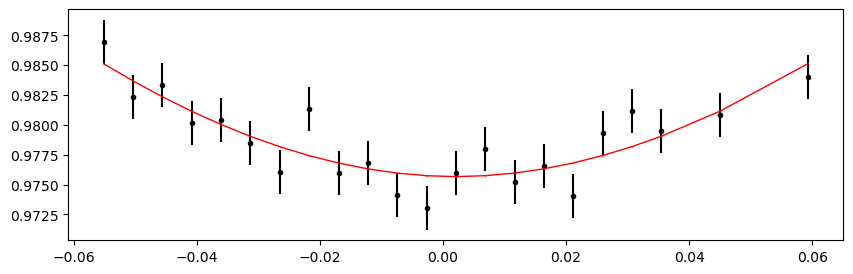

2009.2914739999999 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.04it/s]


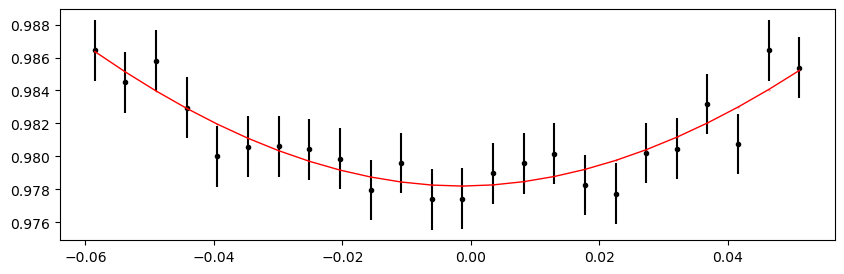

2640.4909 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 431.68it/s]


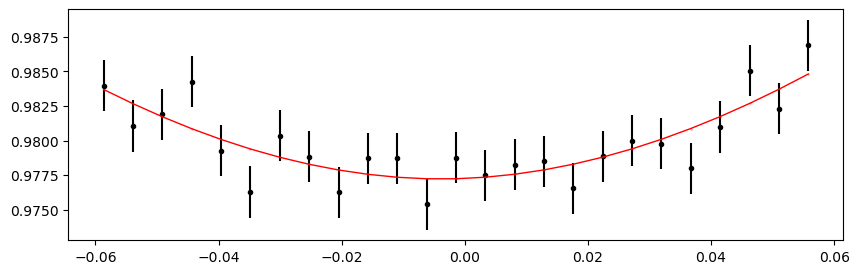

2640.782178 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.29it/s]


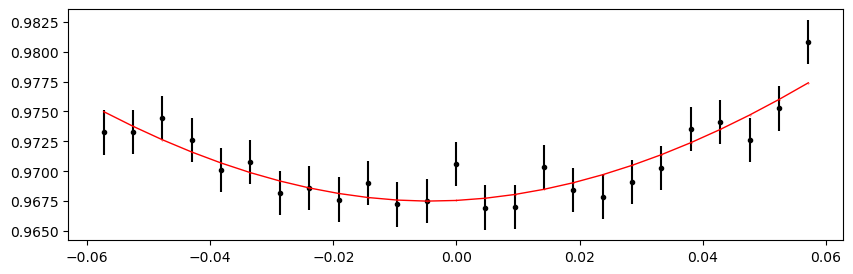

2641.073456 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.10it/s]


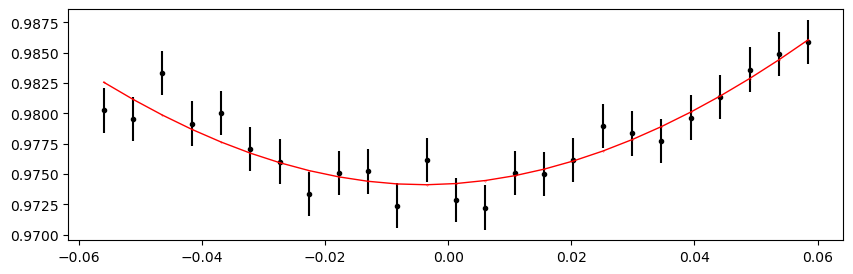

2641.3647339999998 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.00it/s]


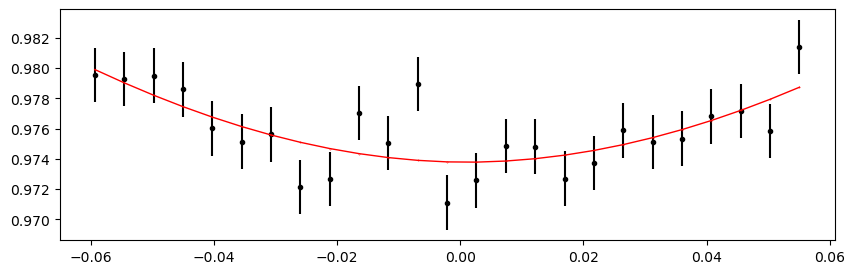

2641.656012 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.25it/s]


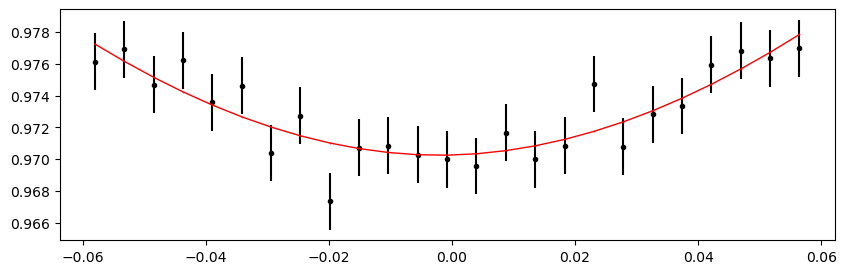

2641.94729 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 429.19it/s]


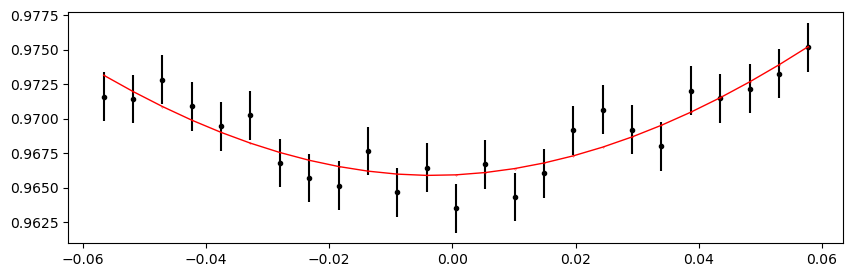

2642.2385679999998 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.89it/s]


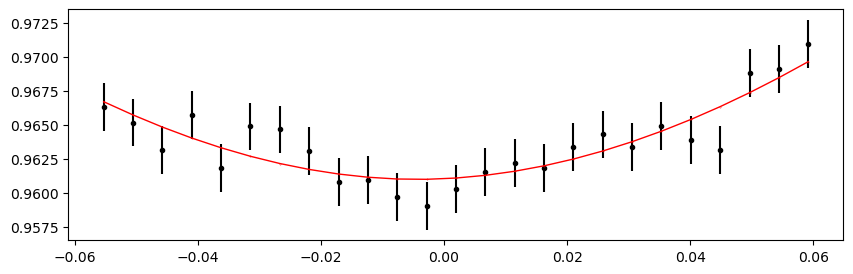

2642.821124 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.87it/s]


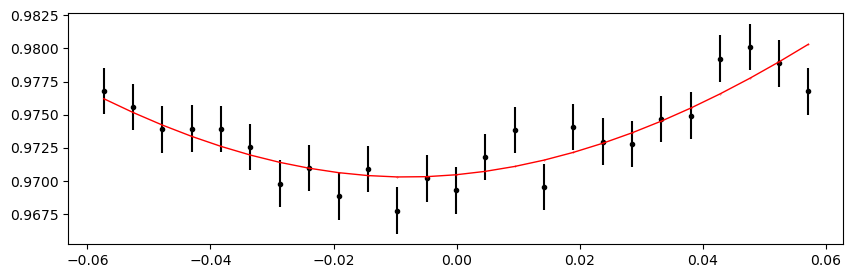

2643.1124019999997 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.50it/s]


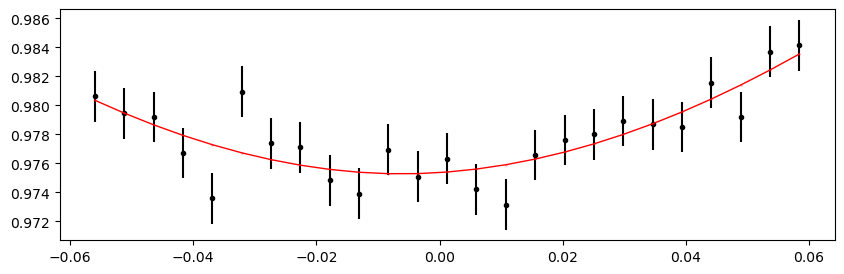

2643.40368 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.02it/s]


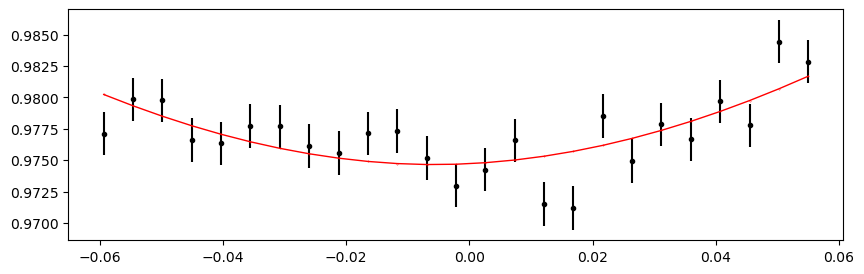

2643.694958 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.62it/s]


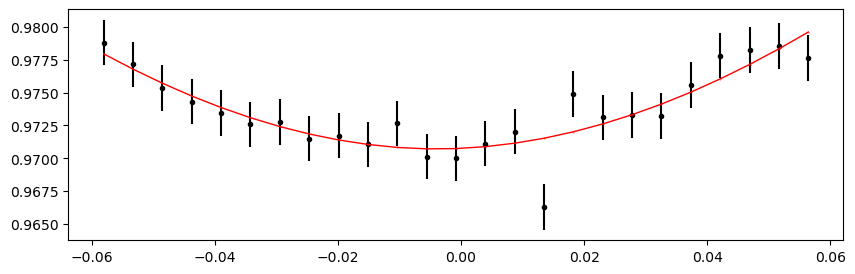

2643.9862359999997 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 429.27it/s]


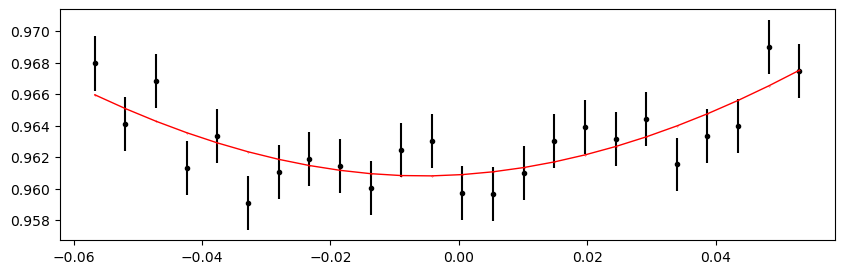

2644.277514 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.92it/s]


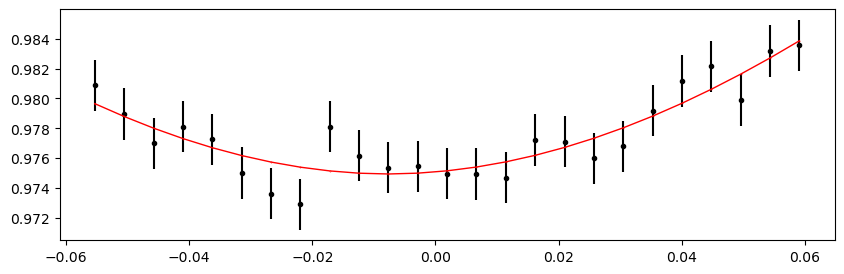

2644.568792 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 429.73it/s]


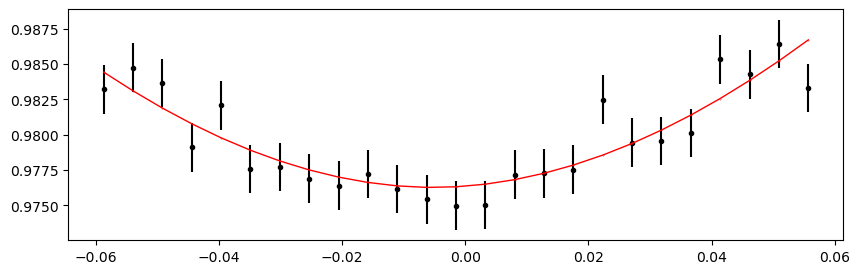

2644.8600699999997 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.30it/s]


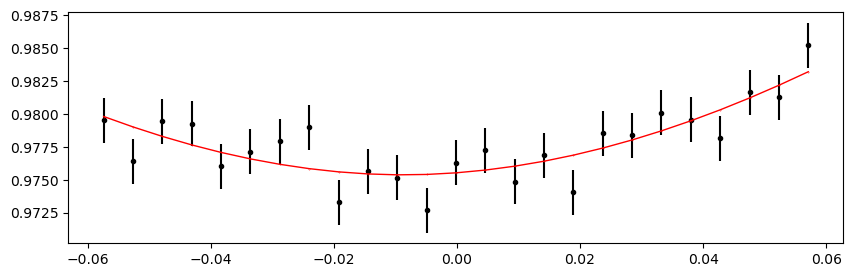

2645.151348 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.46it/s]


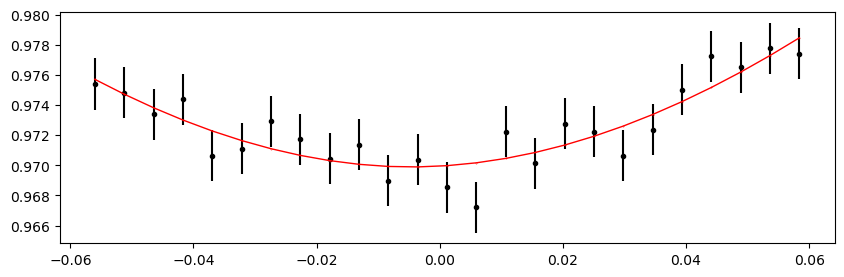

2645.442626 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.71it/s]


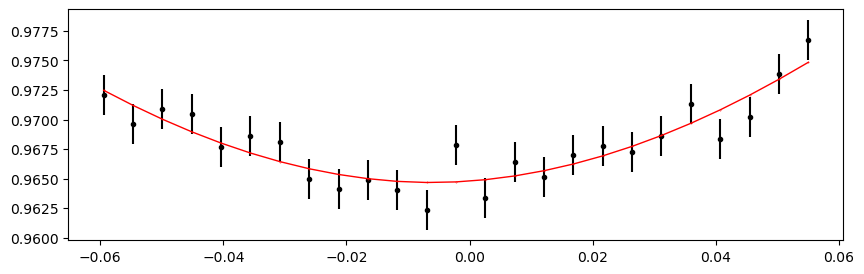

2646.025182 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.64it/s]


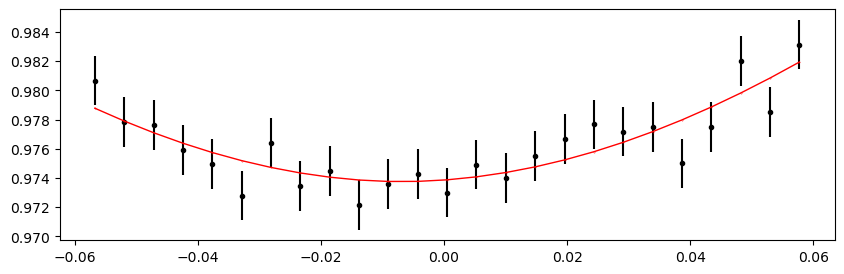

2646.31646 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.93it/s]


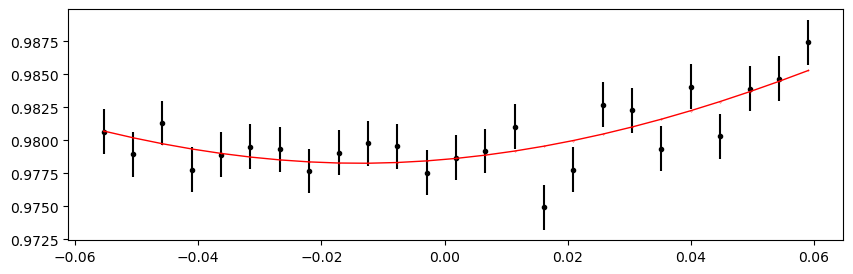

2646.6077379999997 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.05it/s]


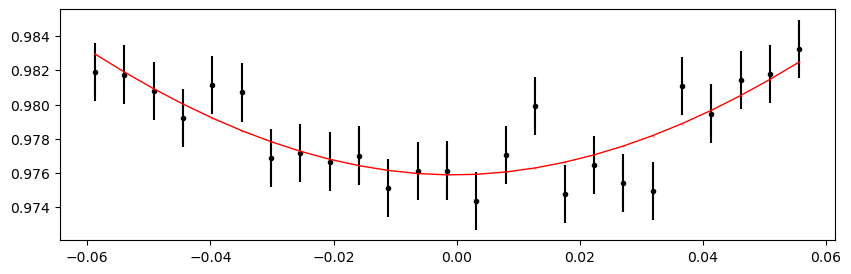

2646.899016 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.75it/s]


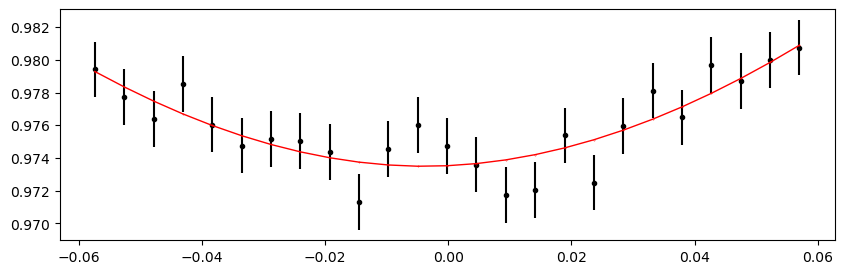

2647.190294 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.39it/s]


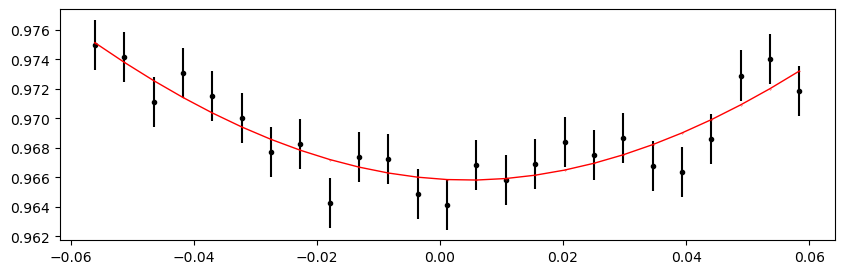

2647.4815719999997 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.83it/s]


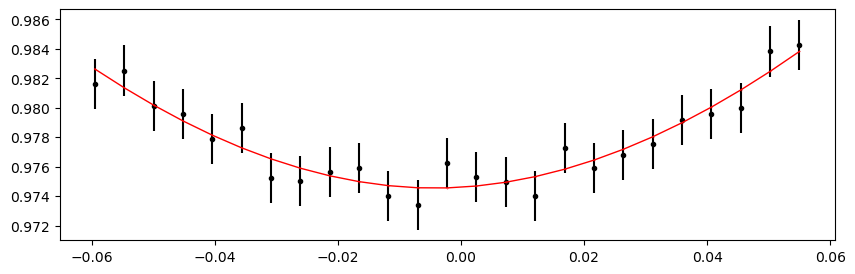

2647.77285 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.84it/s]


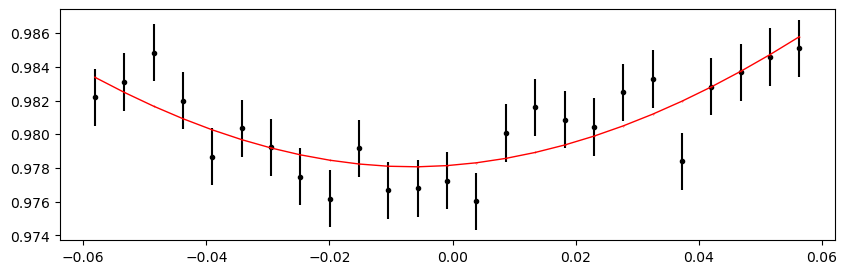

2648.064128 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.68it/s]


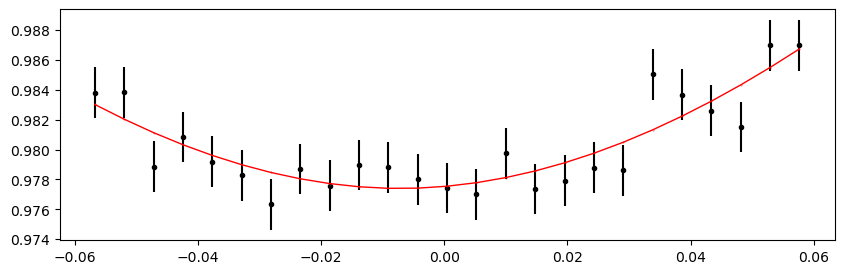

2648.3554059999997 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.59it/s]


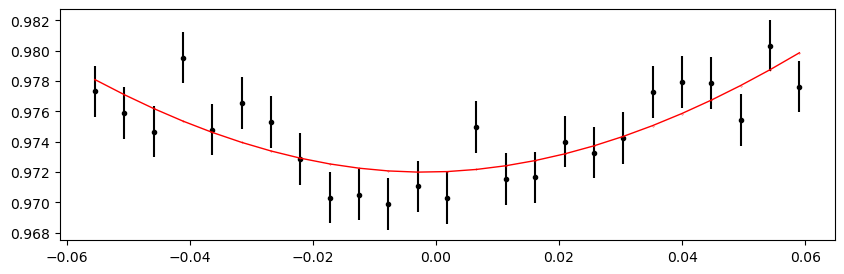

2648.646684 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.14it/s]


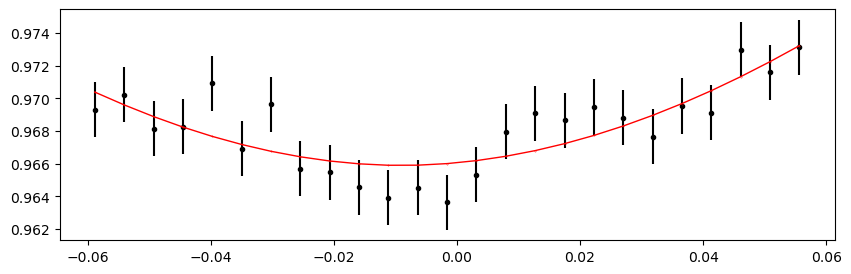

2649.2292399999997 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.61it/s]


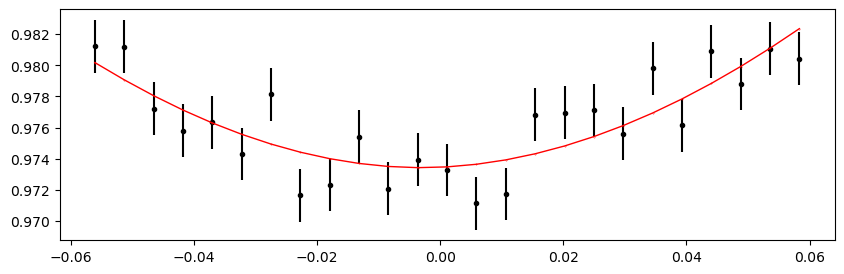

2649.520518 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 429.78it/s]


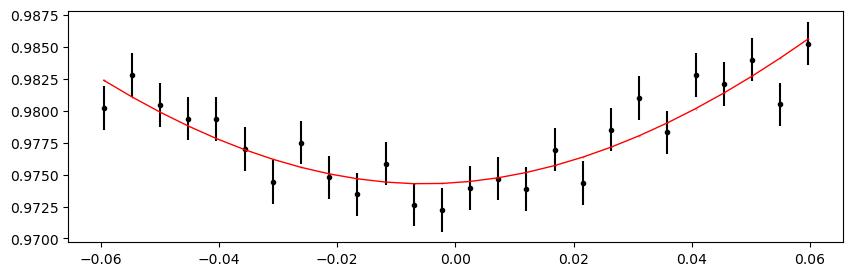

2649.811796 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.42it/s]


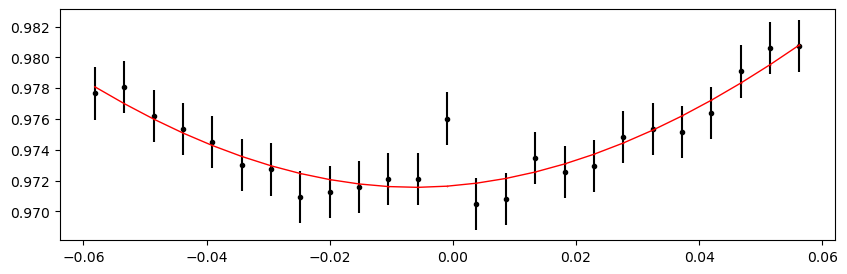

2650.1030739999997 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 430.88it/s]


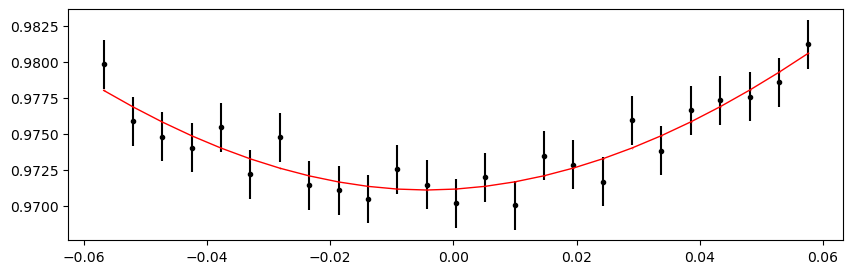

2650.394352 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.58it/s]


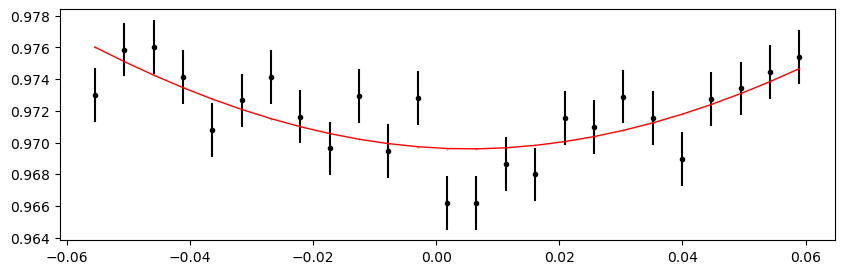

2655.6373559999997 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.28it/s]


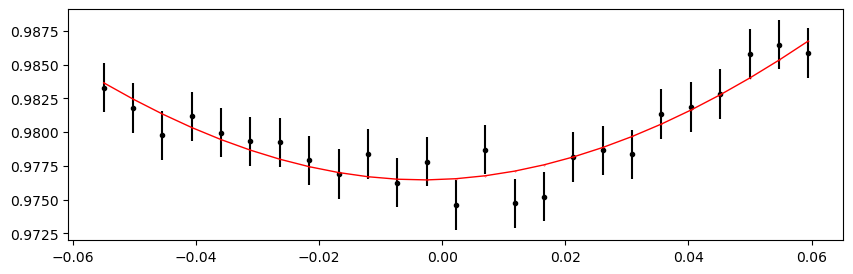

2655.928634 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.77it/s]


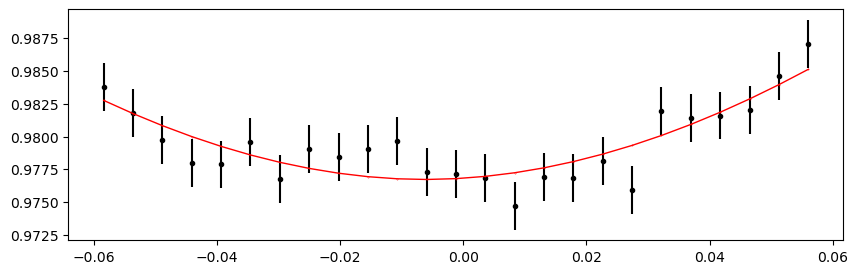

2656.219912 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 430.72it/s]


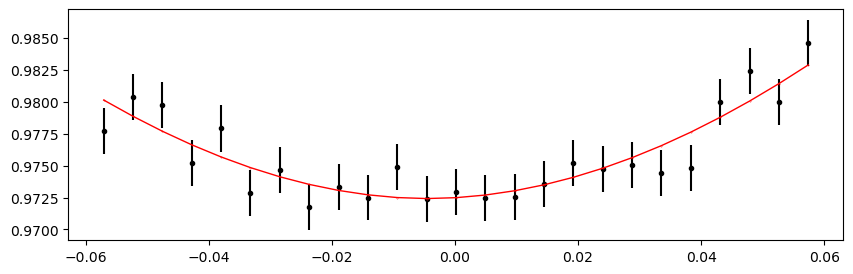

2656.5111899999997 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 429.42it/s]


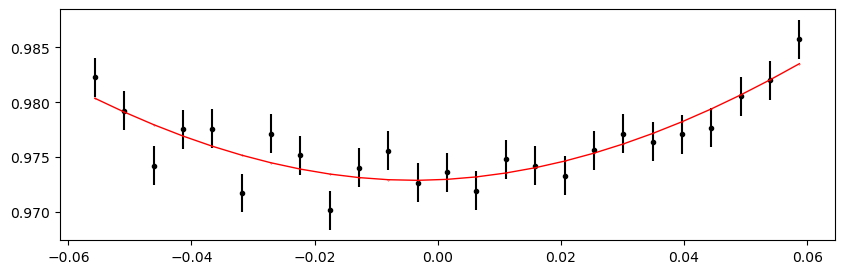

2656.802468 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.12it/s]


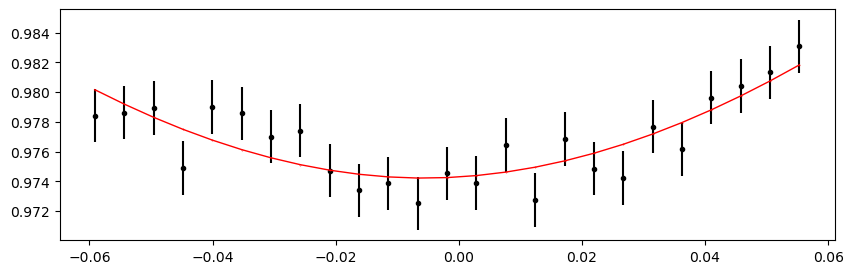

2657.093746 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.39it/s]


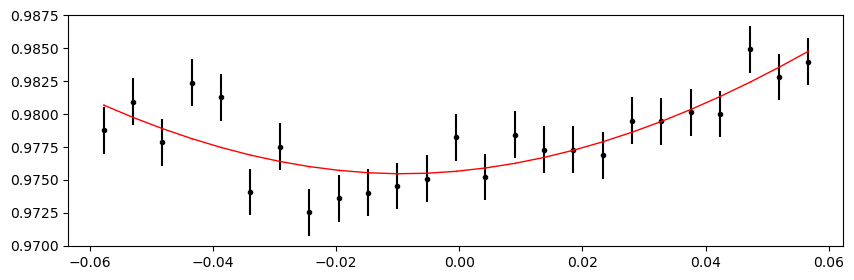

2657.385024 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.87it/s]


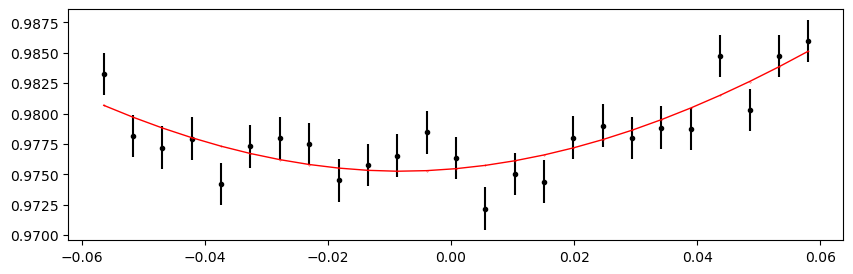

2657.676302 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.27it/s]


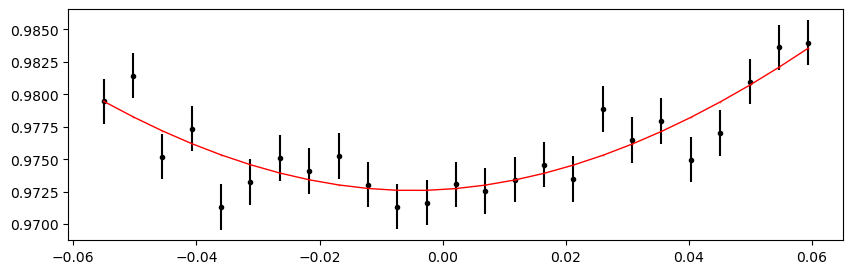

2657.96758 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.36it/s]


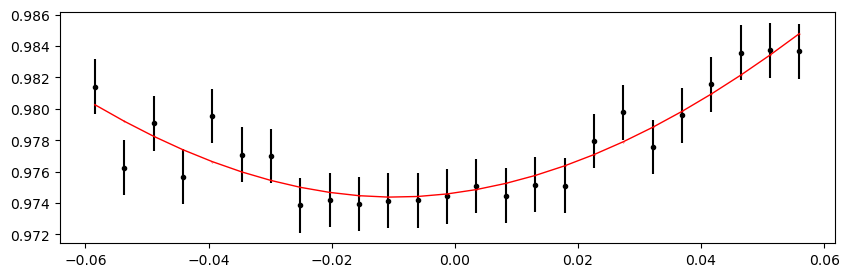

2658.258858 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 429.36it/s]


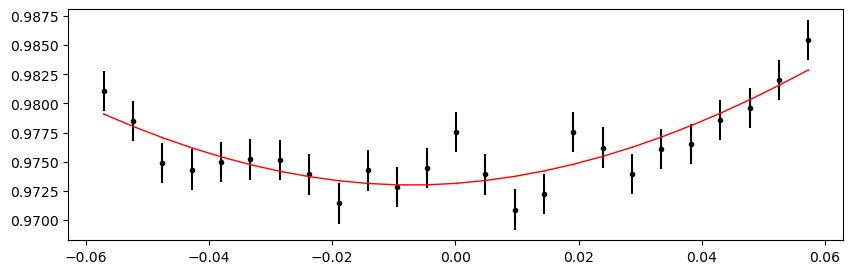

2658.841414 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.53it/s]


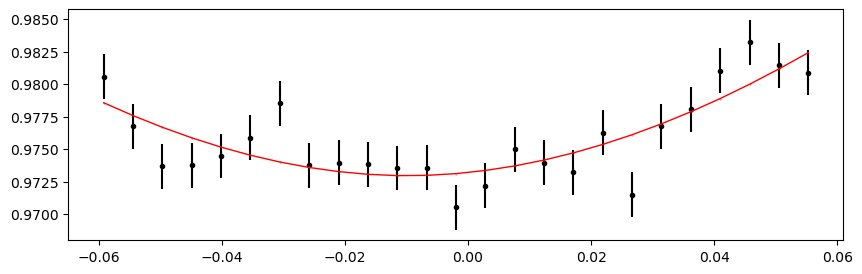

2659.132692 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.91it/s]


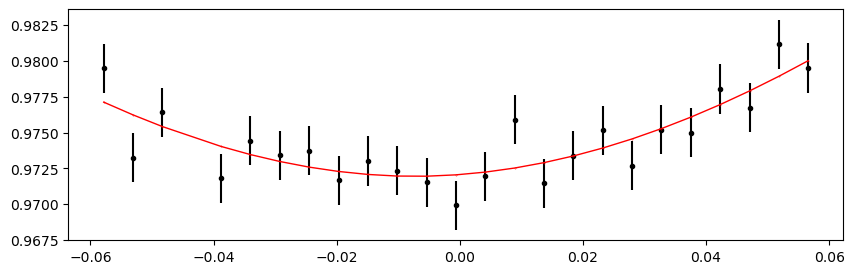

2659.42397 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.86it/s]


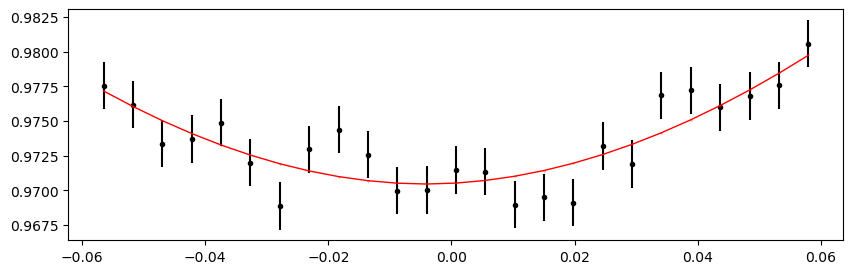

2659.715248 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.36it/s]


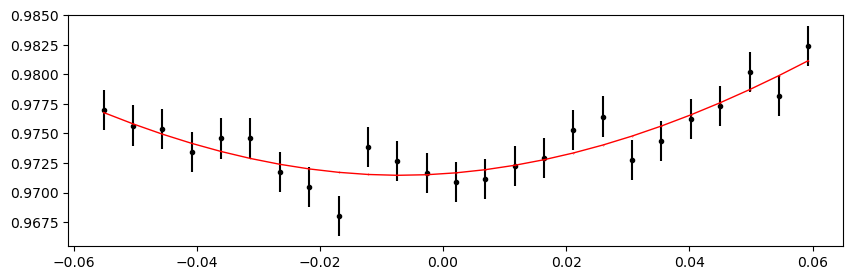

2660.006526 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.97it/s]


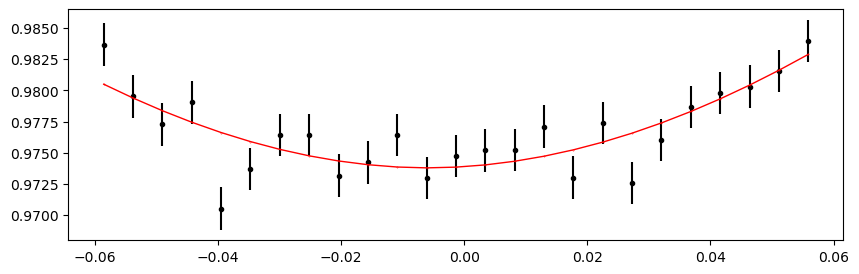

2660.297804 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.32it/s]


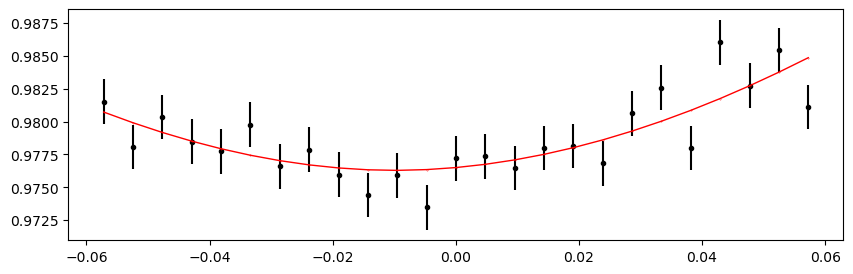

2660.589082 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.87it/s]


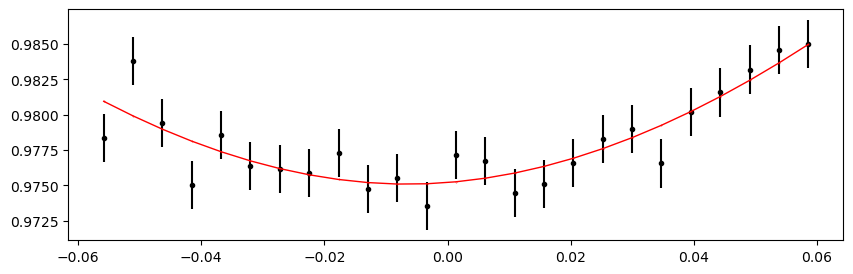

2660.88036 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.32it/s]


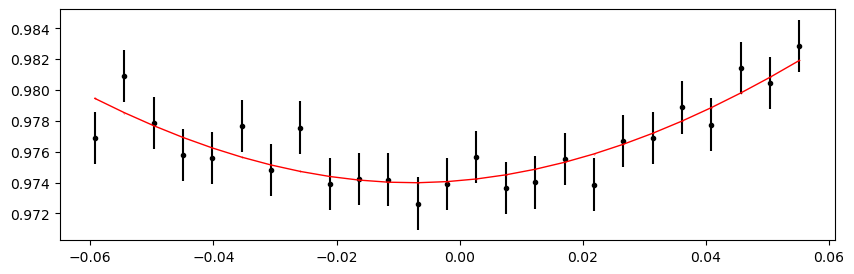

2661.171638 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 429.89it/s]


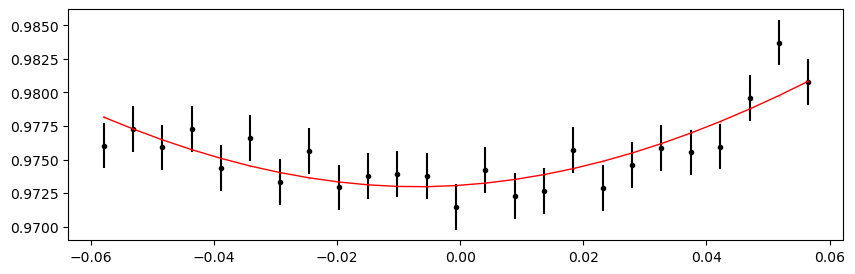

2661.462916 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.38it/s]


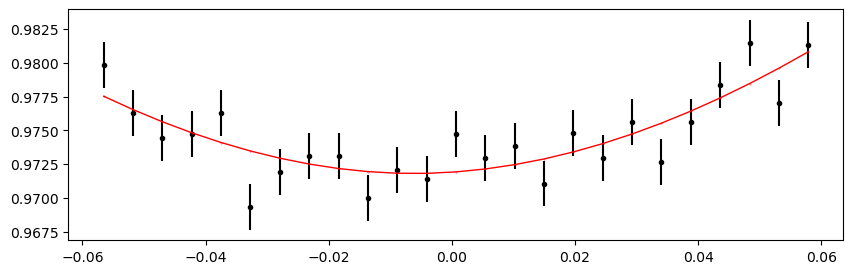

2662.045472 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.28it/s]


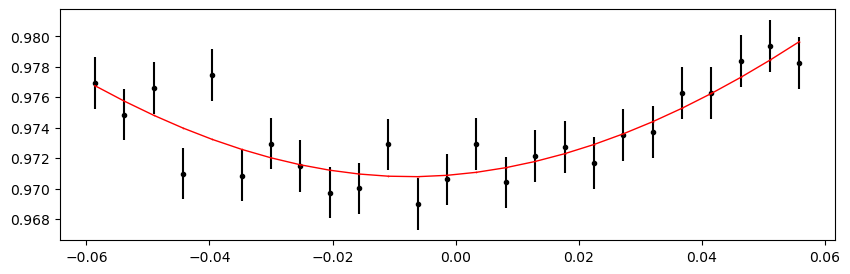

2662.33675 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.58it/s]


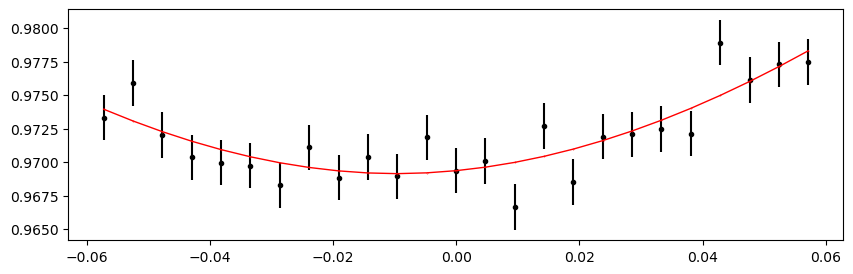

2662.628028 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.57it/s]


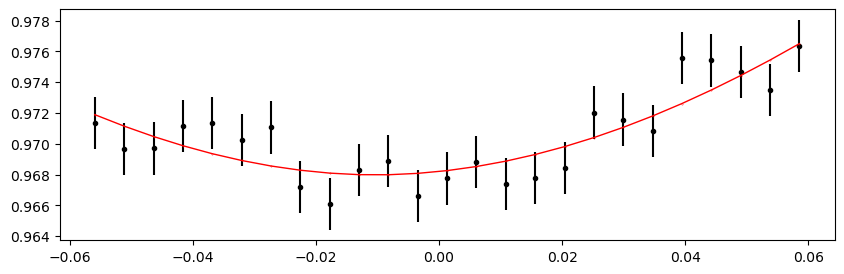

2662.919306 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 430.09it/s]


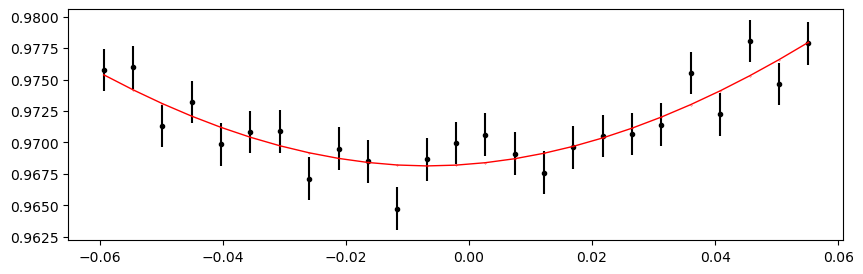

2663.210584 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.49it/s]


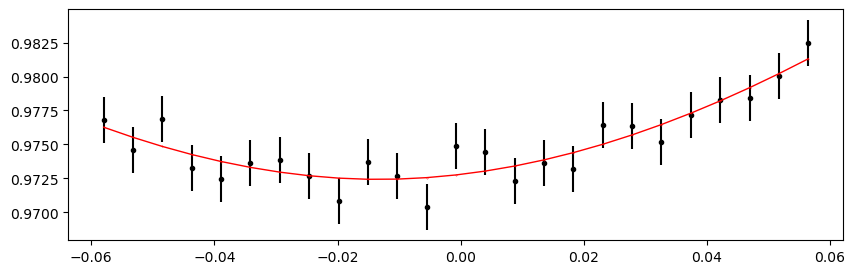

2663.501862 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.47it/s]


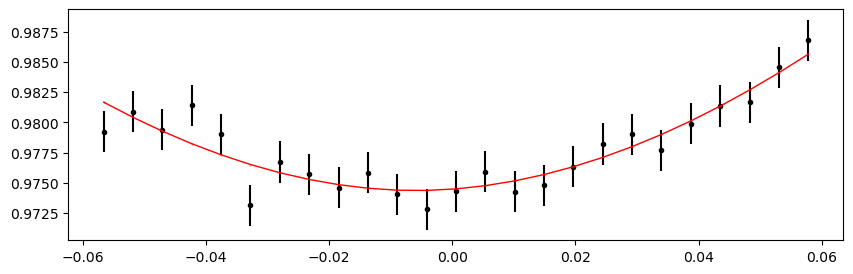

2663.7931399999998 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.27it/s]


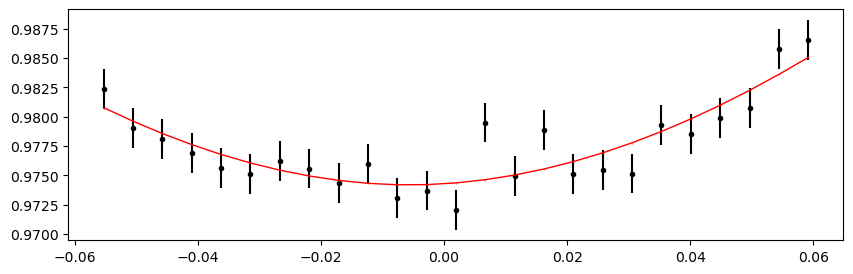

2664.084418 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 430.96it/s]


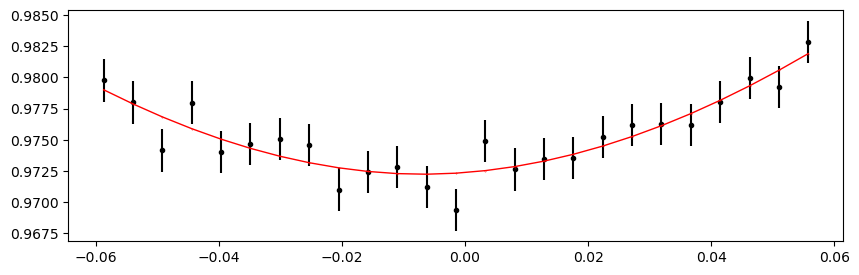

2665.5408079999997 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 429.48it/s]


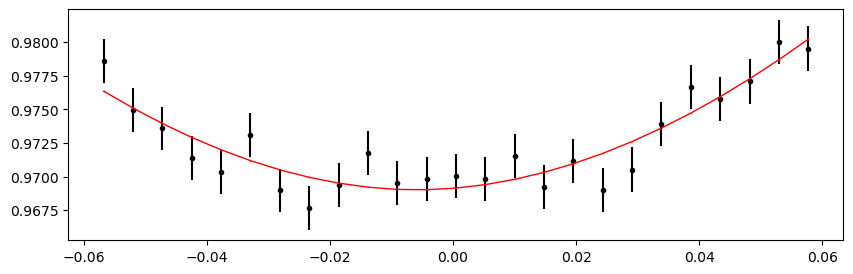

2670.201256 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.01it/s]


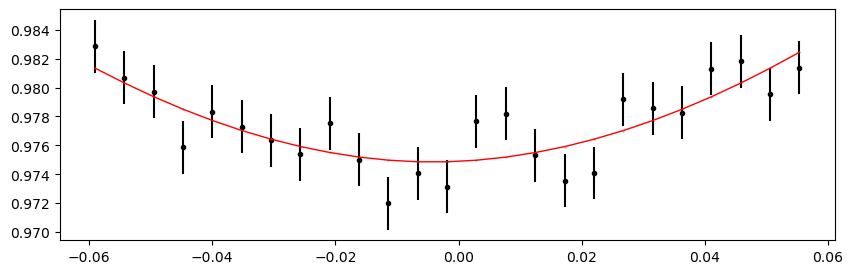

2670.492534 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 430.63it/s]


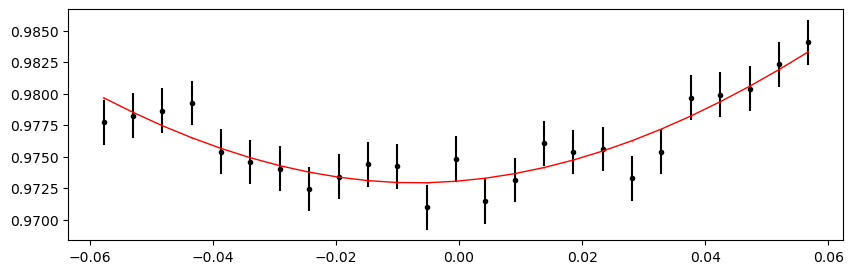

2670.7838119999997 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.30it/s]


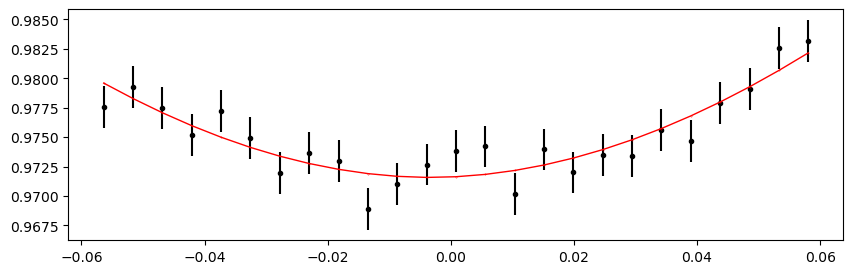

2671.07509 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.75it/s]


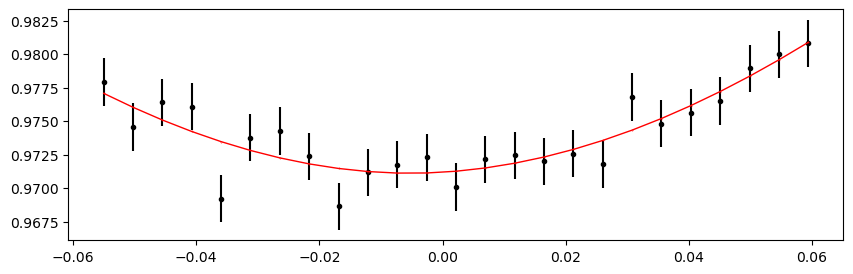

2671.6576459999997 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 429.25it/s]


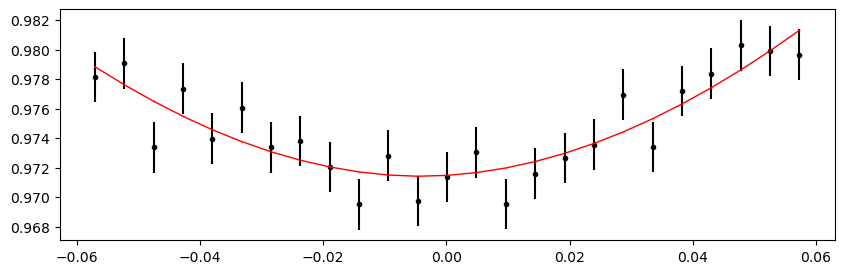

2671.948924 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.17it/s]


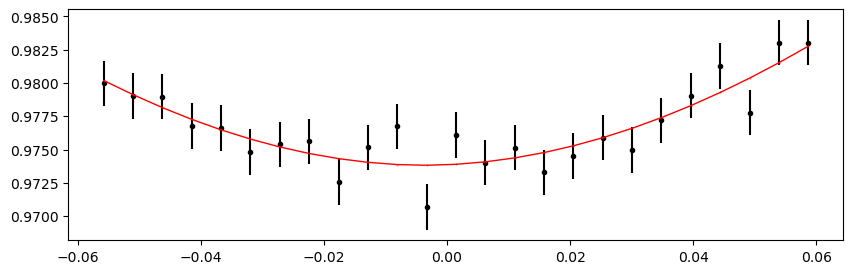

2672.240202 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 431.50it/s]


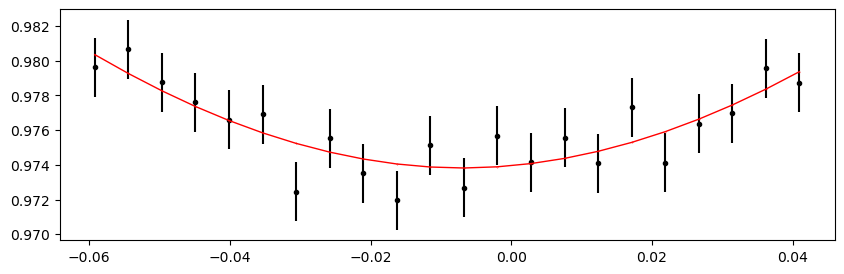

2672.5314799999996 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 404.21it/s]


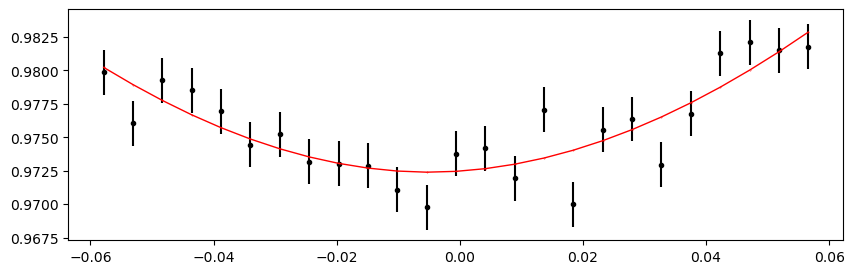

2672.822758 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.31it/s]


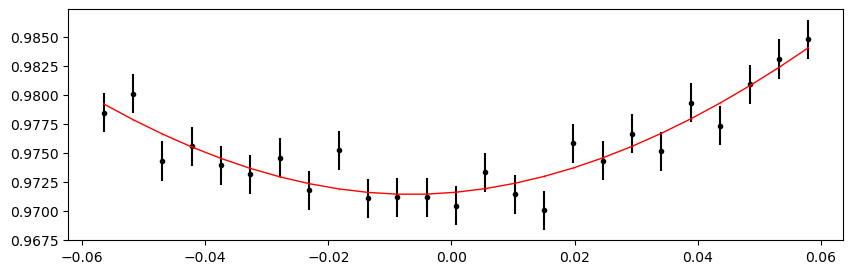

2673.114036 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 411.59it/s]


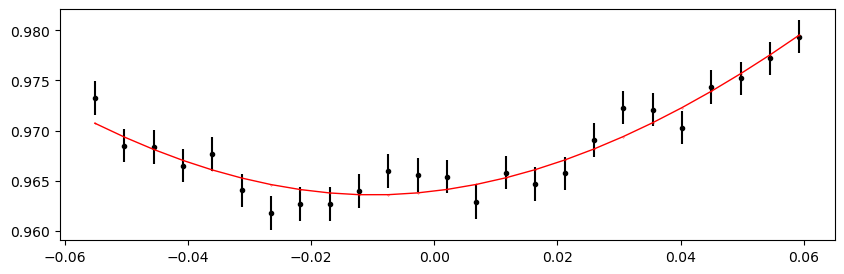

2673.4053139999996 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 415.83it/s]


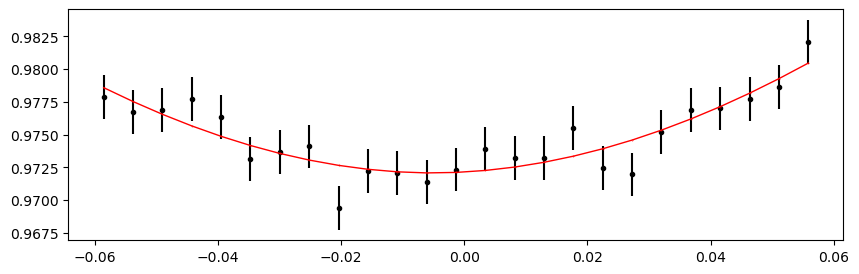

2673.696592 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.23it/s]


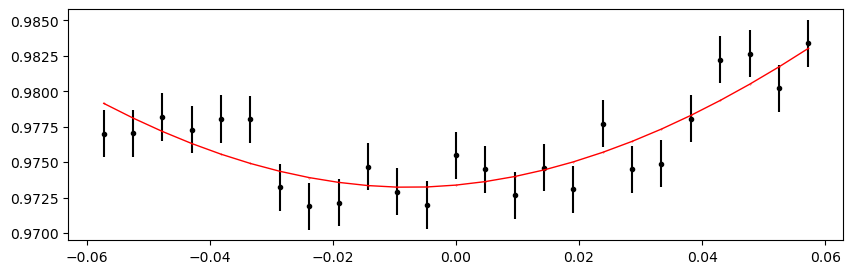

2673.98787 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 405.26it/s]


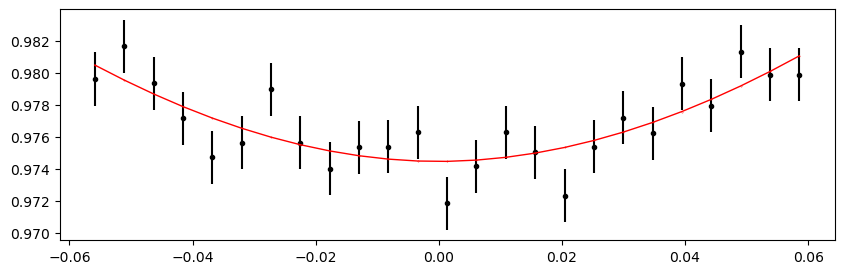

2674.2791479999996 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 410.21it/s]


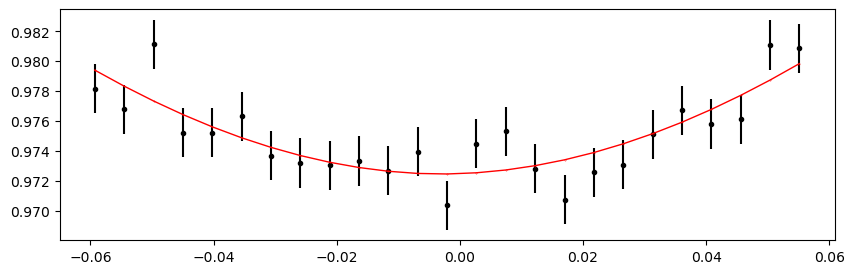

2674.861704 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 411.86it/s]


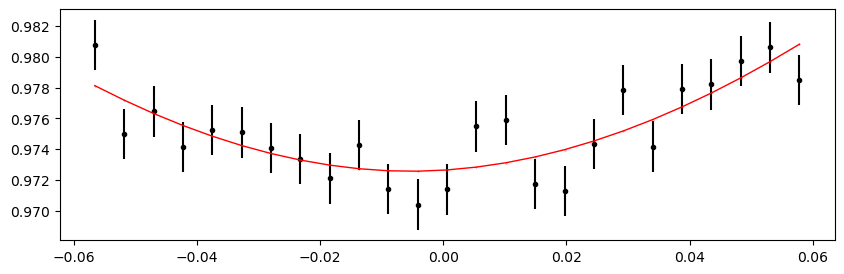

2675.1529819999996 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 405.51it/s]


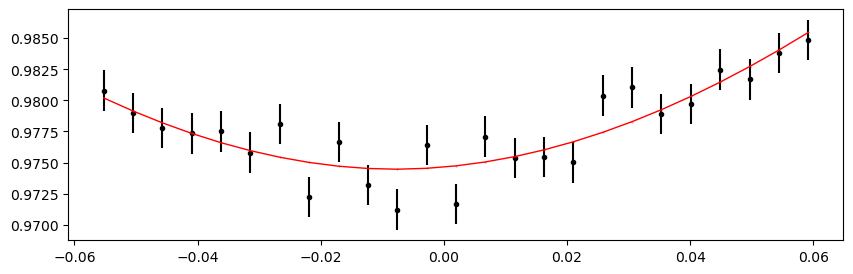

2675.4442599999998 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 404.01it/s]


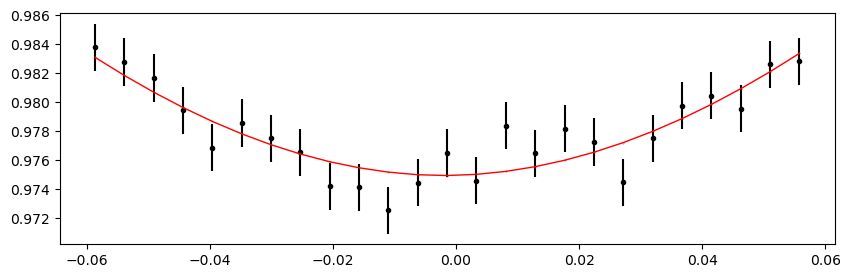

2675.735538 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 416.80it/s]


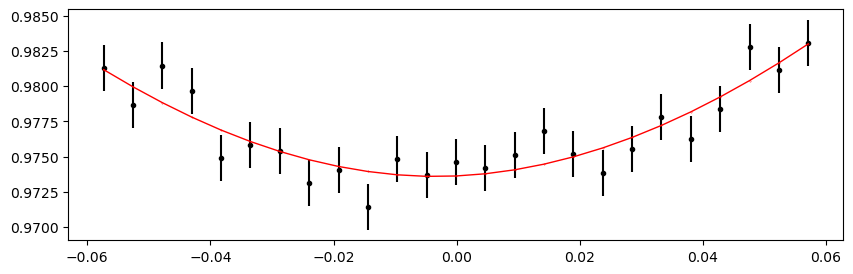

2676.026816 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.03it/s]


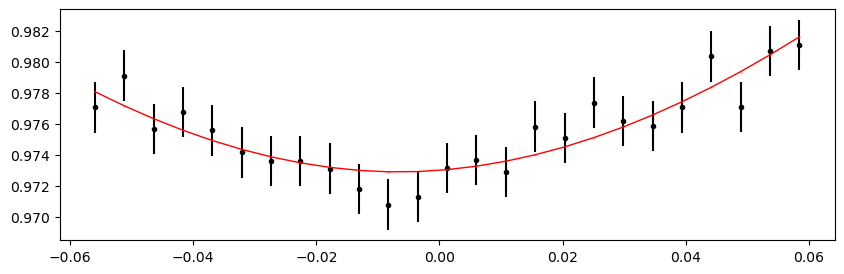

2676.3180939999997 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 419.27it/s]


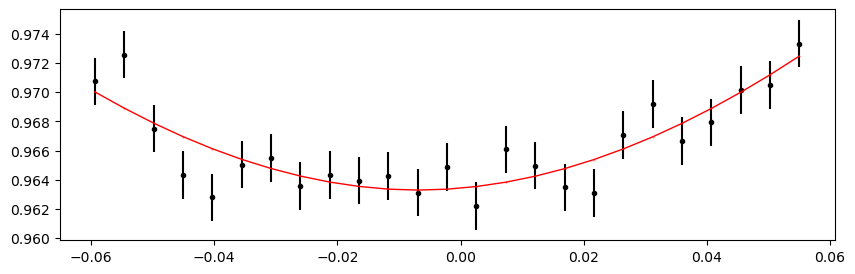

2676.609372 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 410.98it/s]


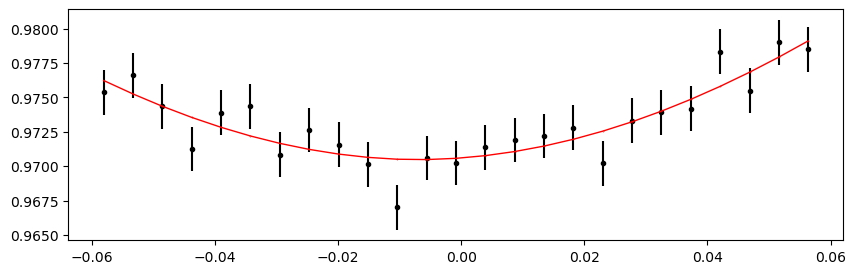

2676.90065 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.41it/s]


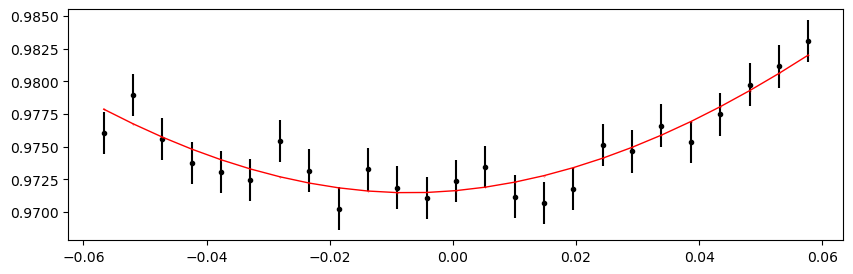

2677.1919279999997 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.02it/s]


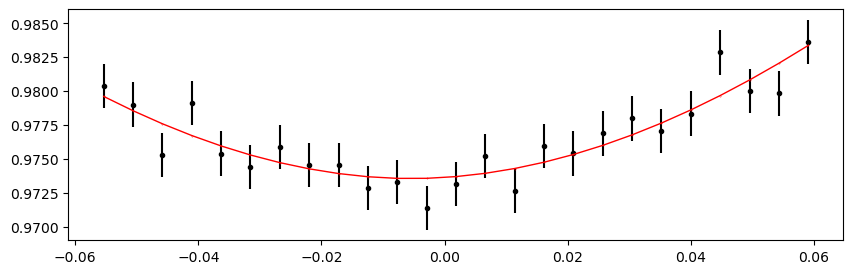

2677.483206 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 410.22it/s]


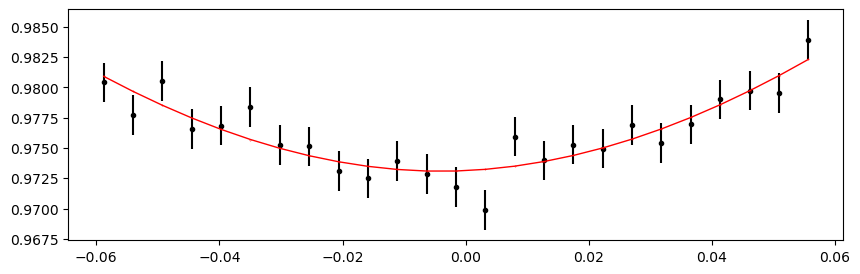

2678.0657619999997 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 404.28it/s]


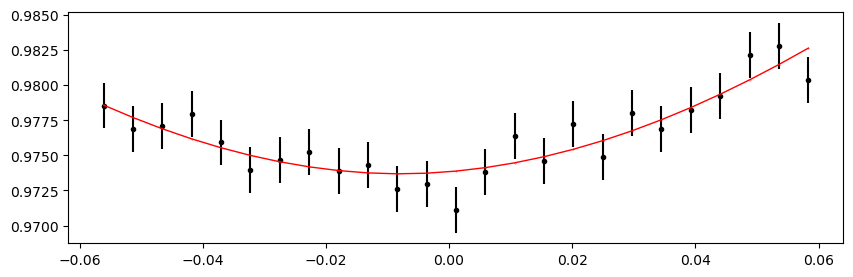

2678.35704 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 402.45it/s]


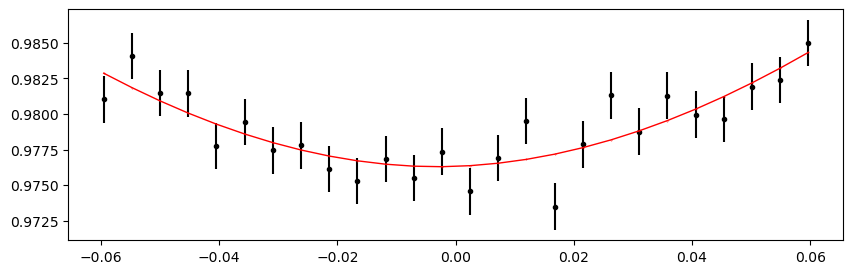

2684.1826 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.24it/s]


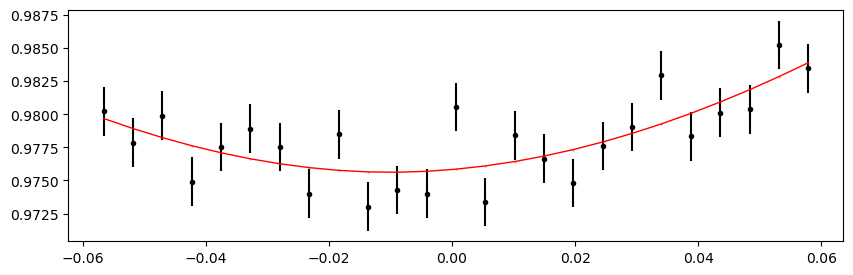

2684.765156 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 422.48it/s]


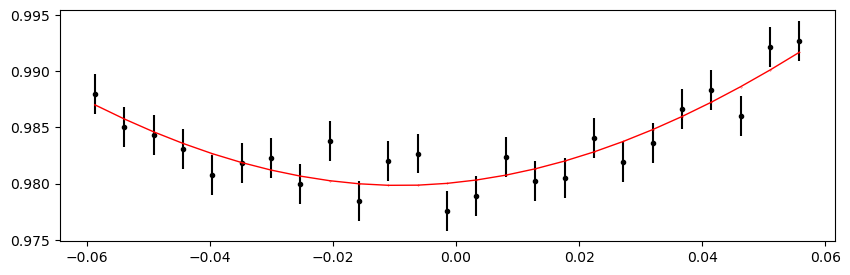

2685.056434 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 403.88it/s]


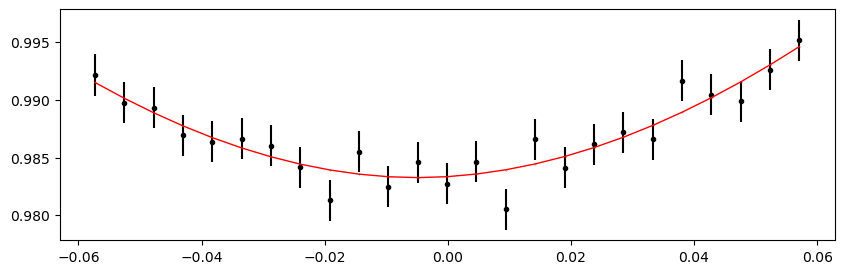

Time 2685.347712 does not have enough data points: 18
2685.63899 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.29it/s]


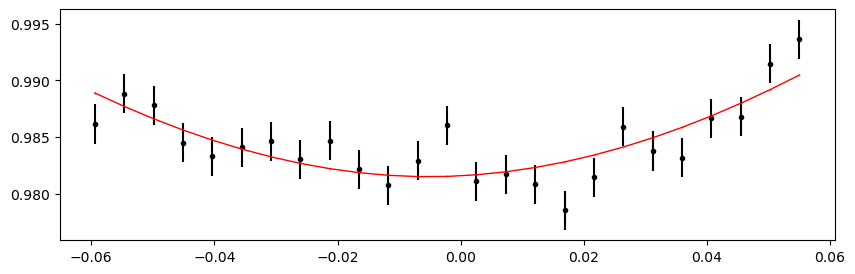

2685.930268 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 398.09it/s]


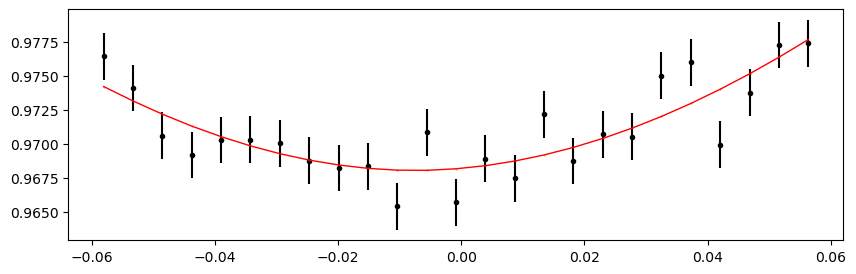

2686.2215459999998 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.66it/s]


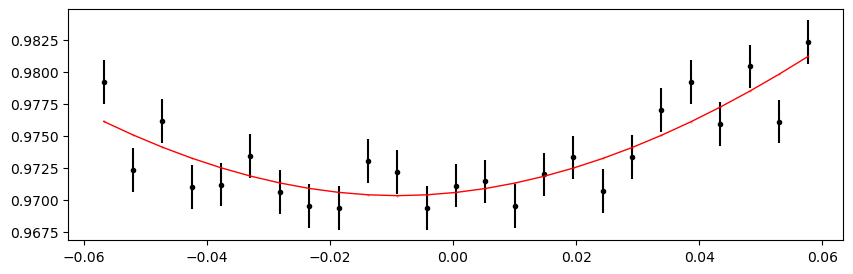

2686.512824 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.76it/s]


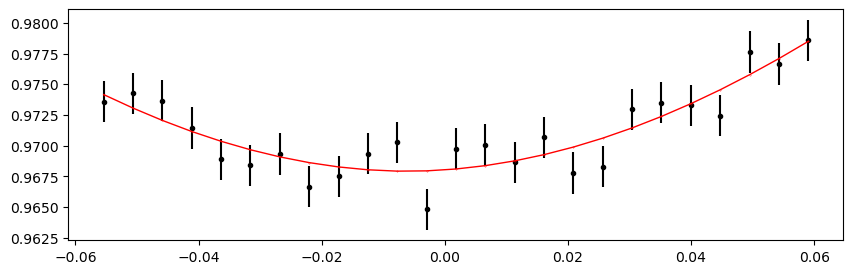

2686.804102 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 416.99it/s]


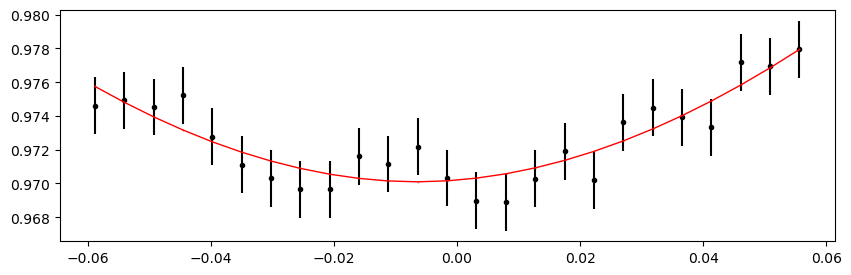

2687.0953799999997 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.15it/s]


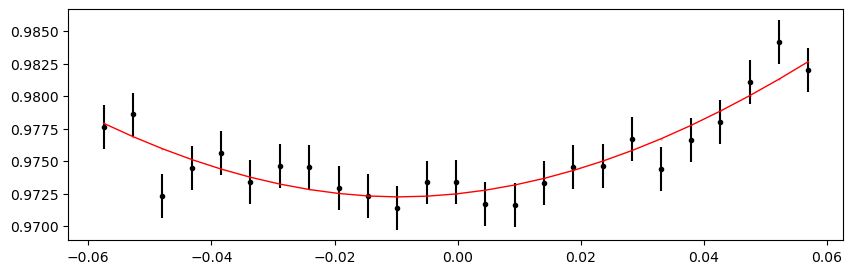

2687.386658 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 421.59it/s]


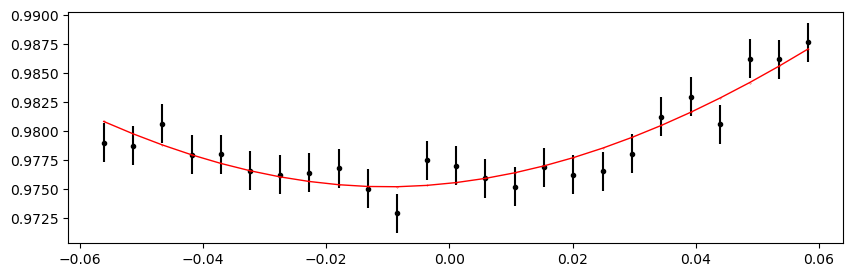

2687.9692139999997 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.96it/s]


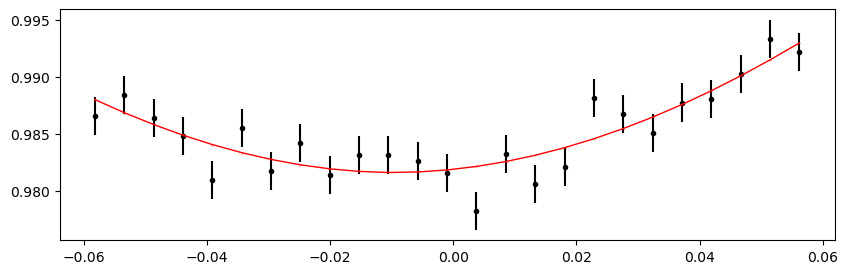

2688.260492 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 421.71it/s]


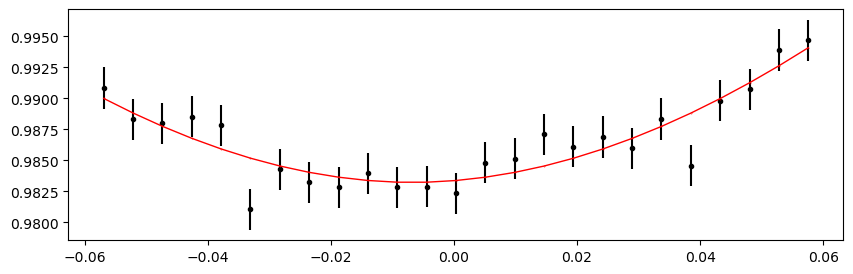

2688.55177 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 422.18it/s]


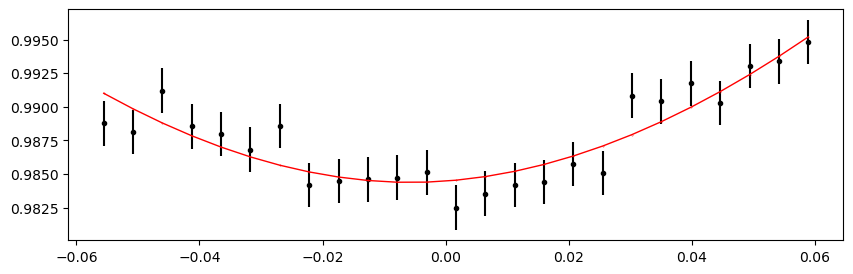

2688.8430479999997 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 420.17it/s]


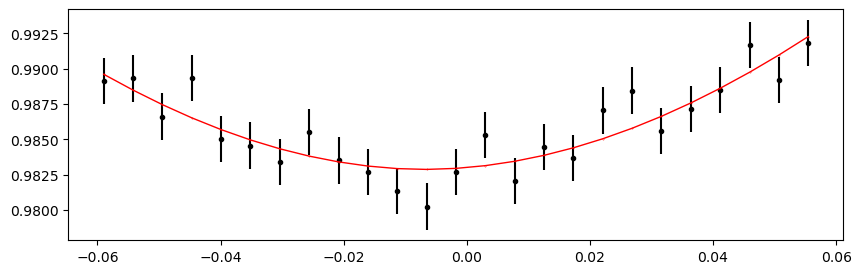

2689.134326 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 420.34it/s]


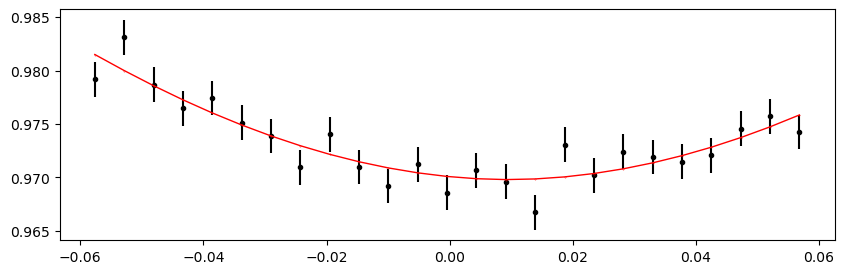

2689.425604 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.89it/s]


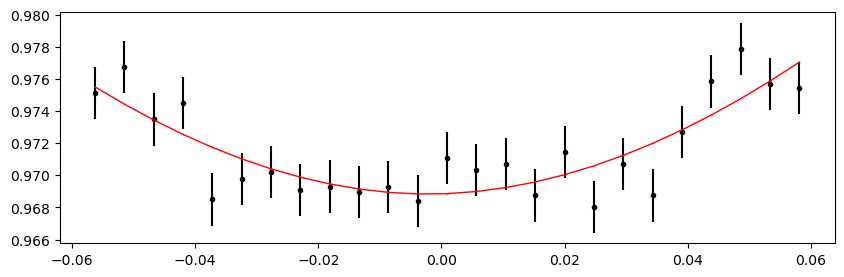

2689.7168819999997 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.72it/s]


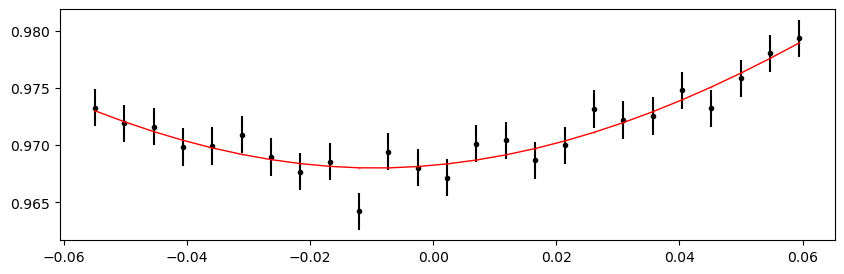

2690.00816 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.20it/s]


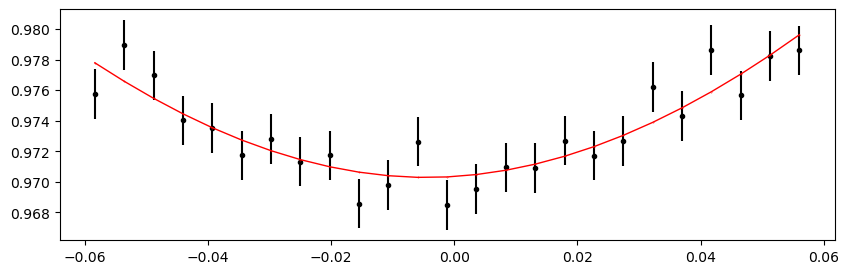

2690.299438 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 421.76it/s]


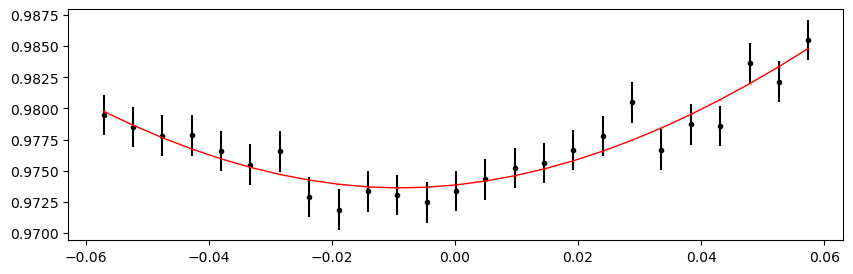

2690.5907159999997 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.54it/s]


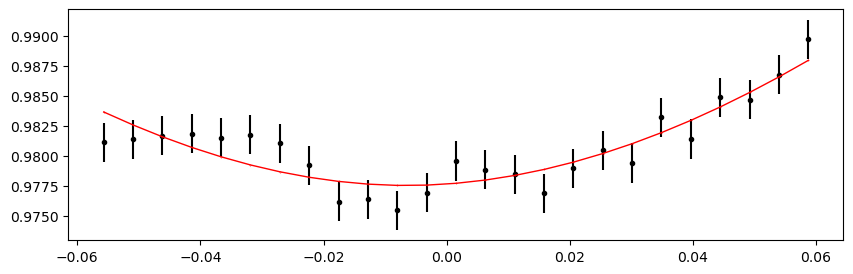

2691.173272 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 432.36it/s]


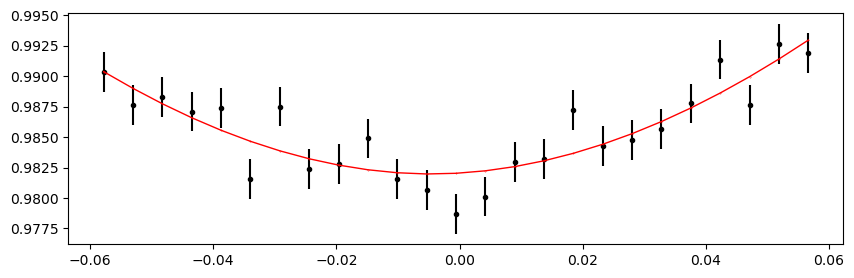

2691.4645499999997 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.17it/s]


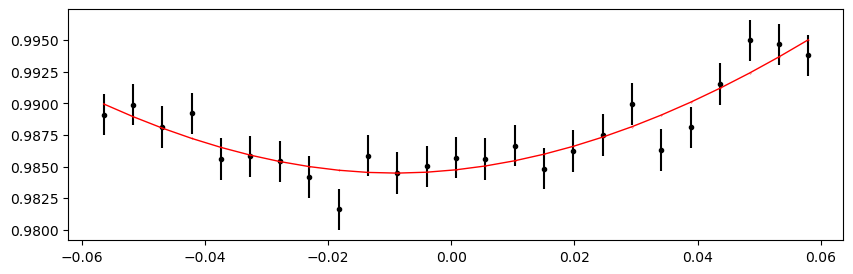

2693.2122179999997 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.95it/s]


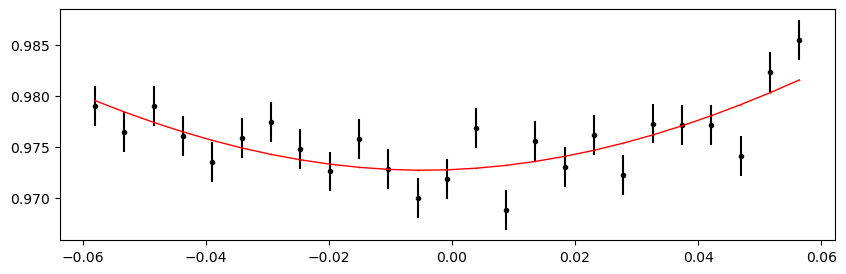

2693.503496 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.96it/s]


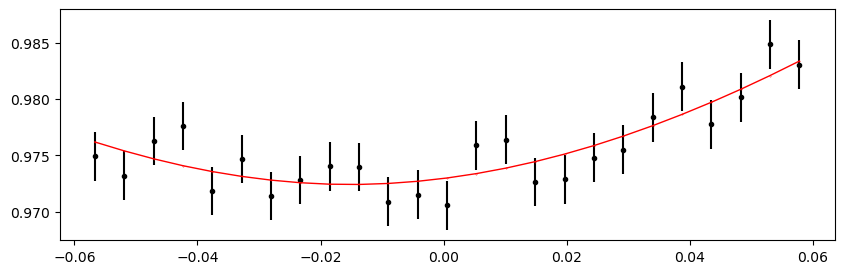

2698.455222 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 431.62it/s]


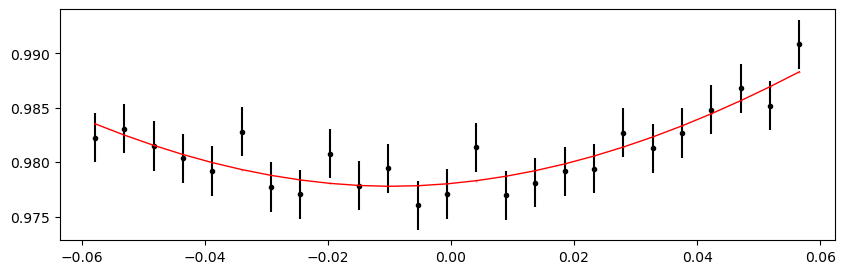

Time 2698.7464999999997 does not have enough data points: 18
2699.037778 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.35it/s]


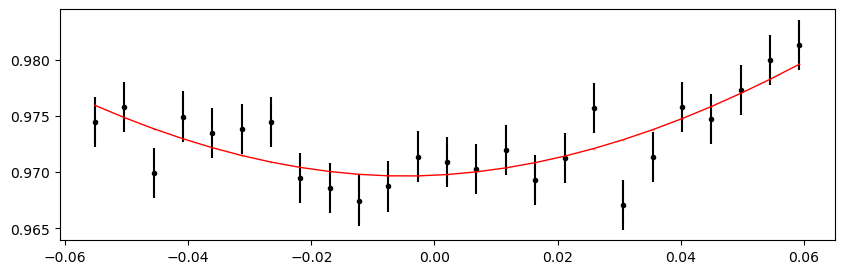

2699.329056 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.22it/s]


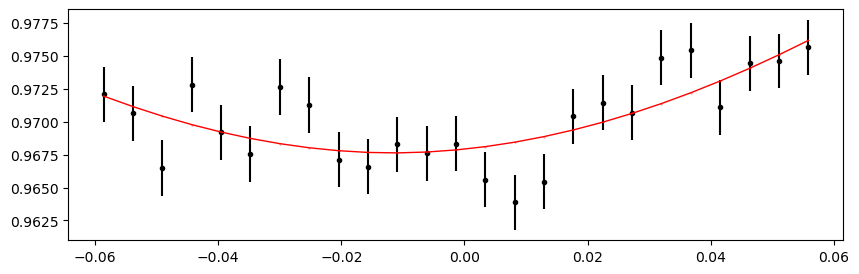

2699.6203339999997 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.07it/s]


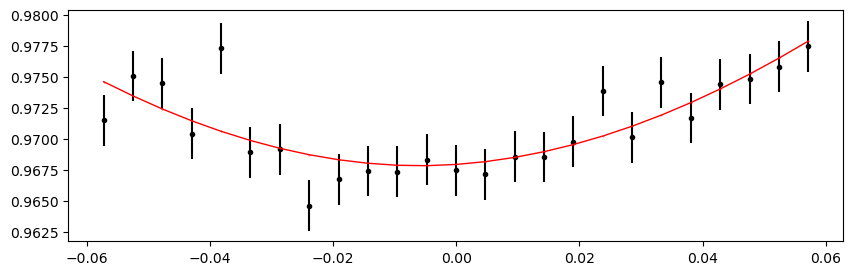

2699.911612 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 332.44it/s]


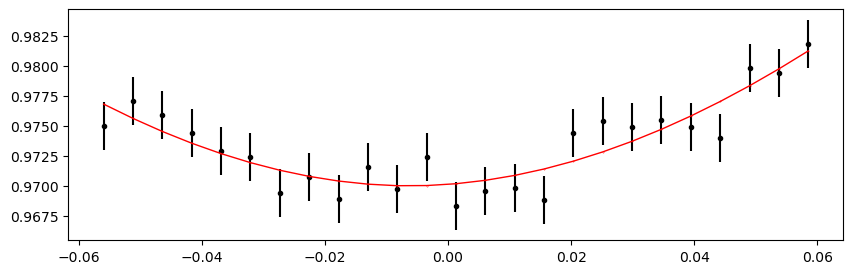

2700.20289 1.0481367889527187 -0.07276250014981386 0.1877866186894403


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 416.66it/s]


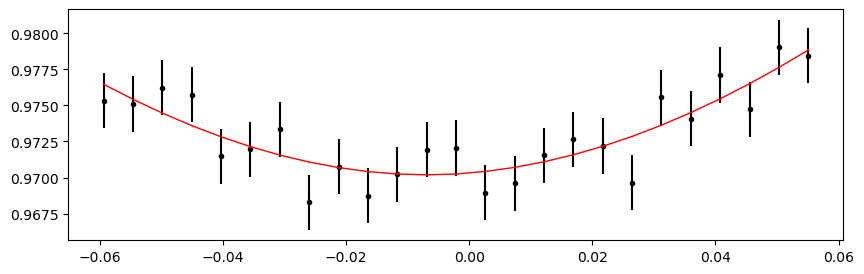

2700.785446 1.0481367889527187 -0.07276250014981386 0.1877866186894403


 94%|████████████████████████████████████████████████████▊   | 9432/10000 [00:22<00:01, 416.94it/s]


KeyboardInterrupt: 

In [57]:
%matplotlib inline

from importlib import reload
reload(etv_functions)

print("Fitting individual primary eclipses...")
etv_functions.fit_each_eclipse(data_primary, n_transits, t0_primary, period, mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, outfile_path,
                               min_number_data=20, 
                              )
!$NOTIFY_CMD "Individual primary eclipses fit done"


# ---



Fitting individual secondary eclipses...
Creating new manifest file
1955.8427 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 420.16it/s]


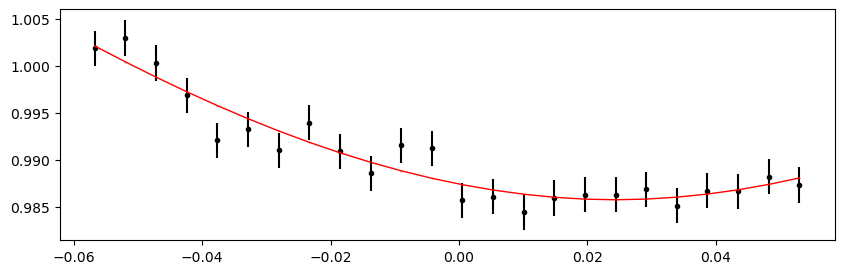

1956.1339779999998 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 415.08it/s]


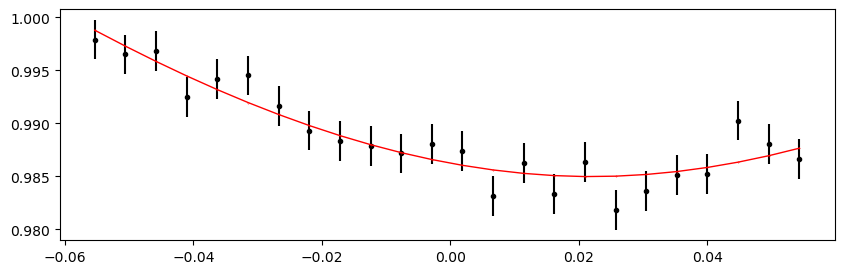

1956.425256 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 419.73it/s]


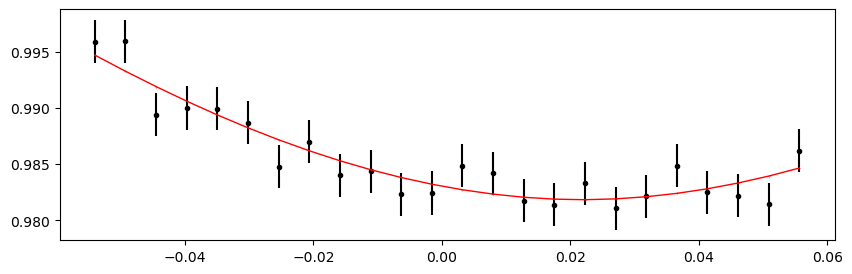

1956.716534 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 404.90it/s]


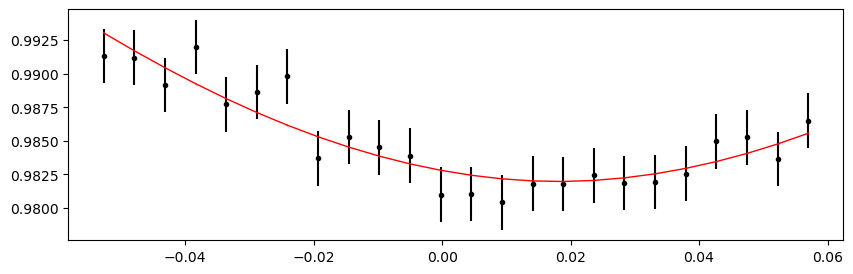

Time 1958.172924 does not have enough data points: 15
1958.75548 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 358.14it/s]


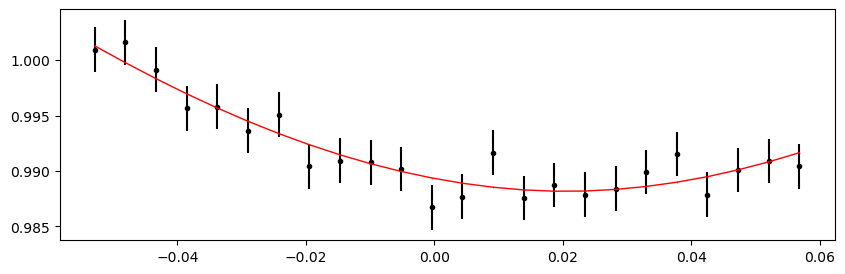

1959.046758 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 407.75it/s]


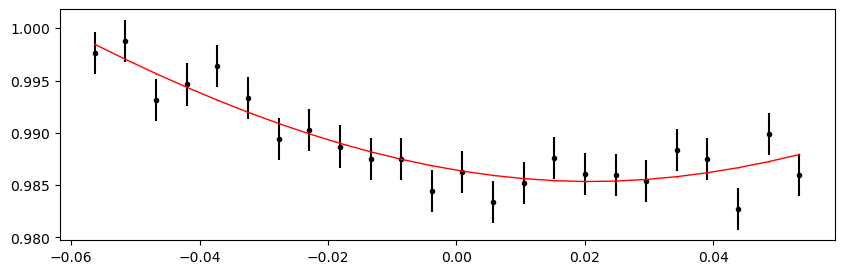

1959.3380359999999 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.27it/s]


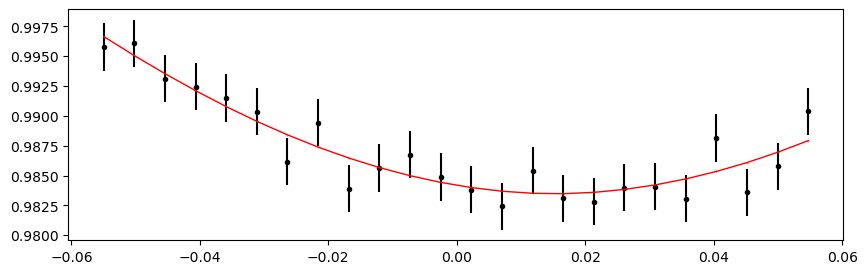

1959.629314 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.42it/s]


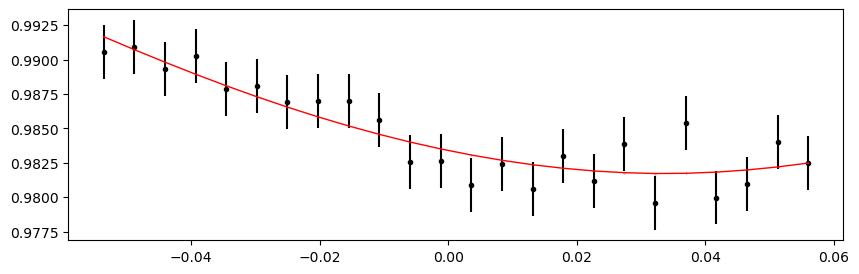

1959.920592 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.53it/s]


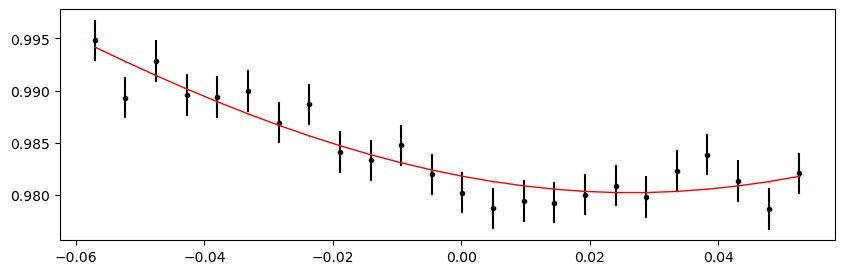

1960.2118699999999 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.72it/s]


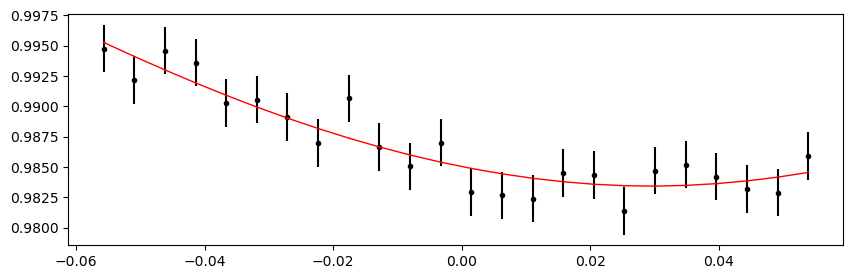

1960.503148 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.16it/s]


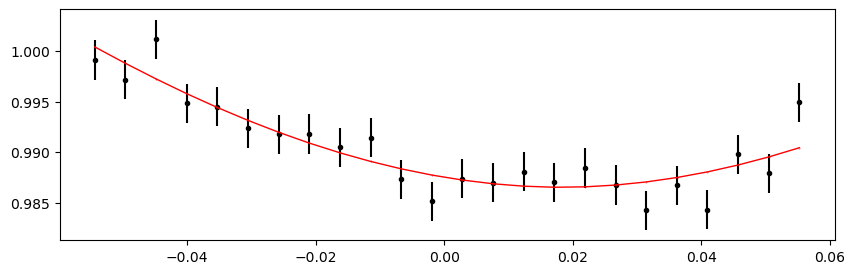

1960.794426 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.53it/s]


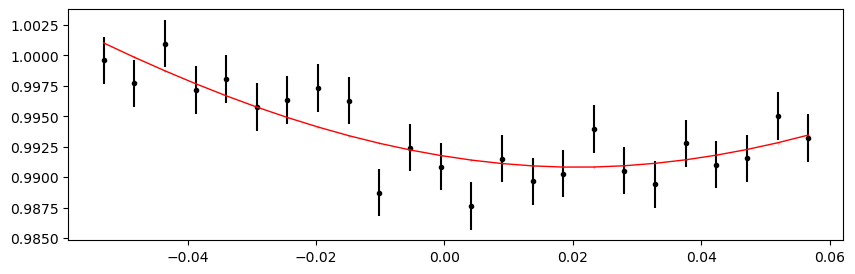

1961.0857039999999 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.94it/s]


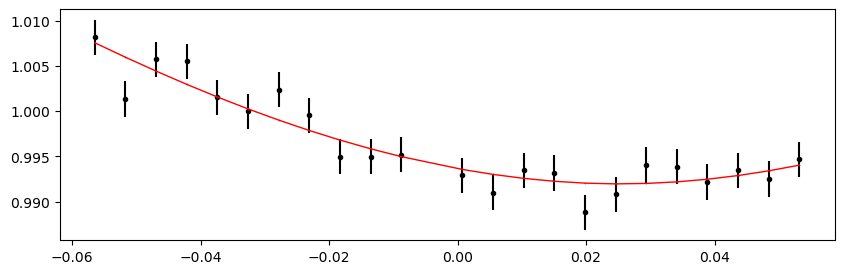

1961.376982 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.50it/s]


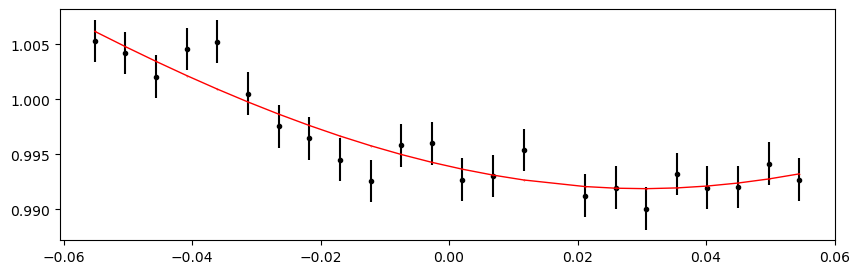

1961.9595379999998 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.15it/s]


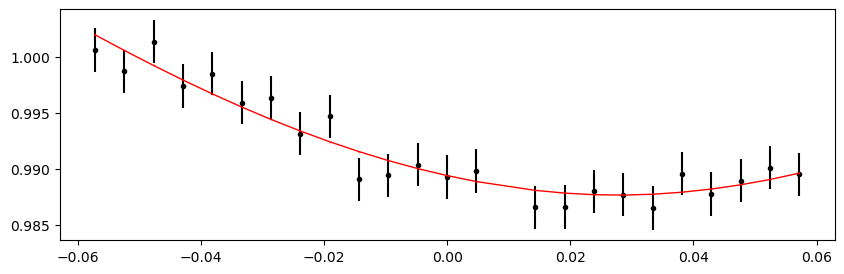

1962.250816 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.13it/s]


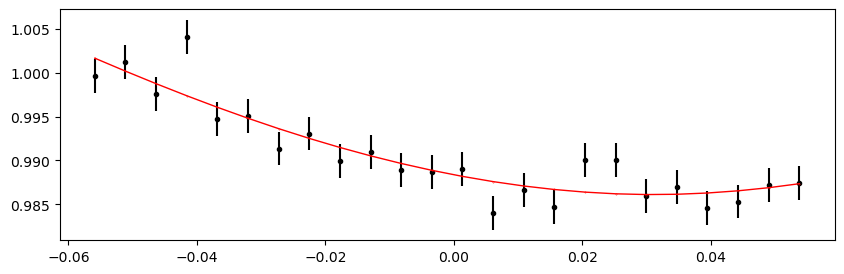

1962.542094 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.15it/s]


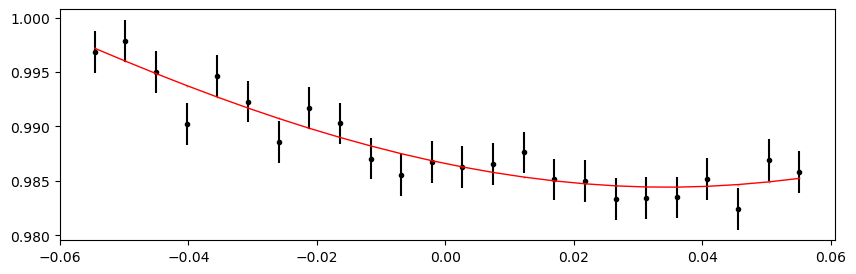

1962.8333719999998 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.09it/s]


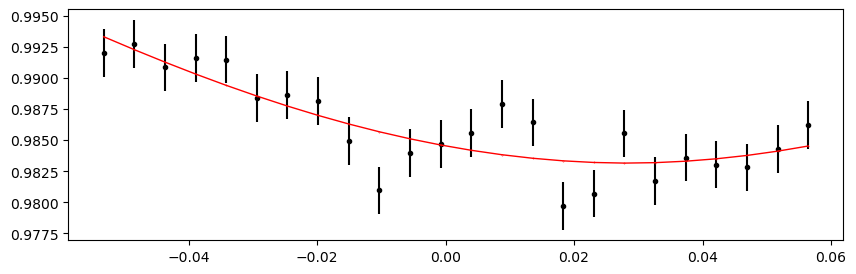

1963.12465 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.04it/s]


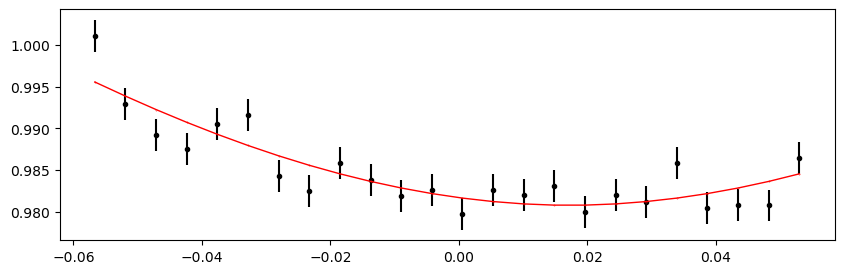

1963.415928 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.19it/s]


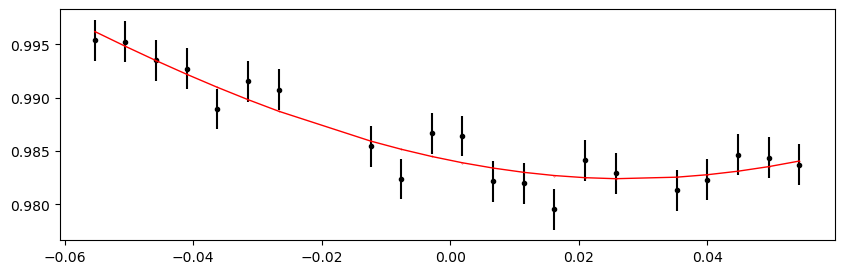

1963.7072059999998 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.09it/s]


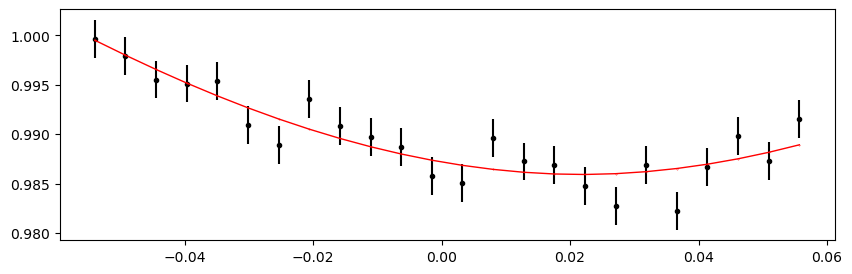

1963.998484 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.92it/s]


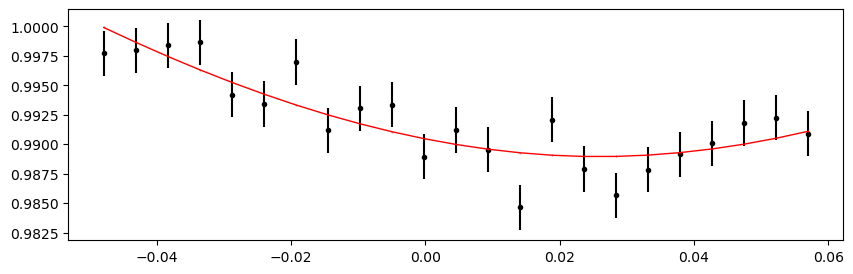

1964.2897619999999 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.23it/s]


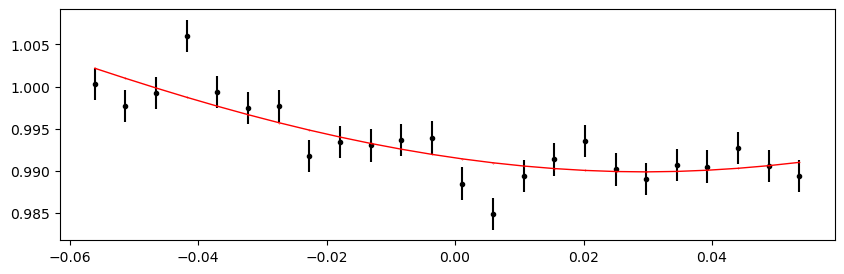

1964.58104 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.11it/s]


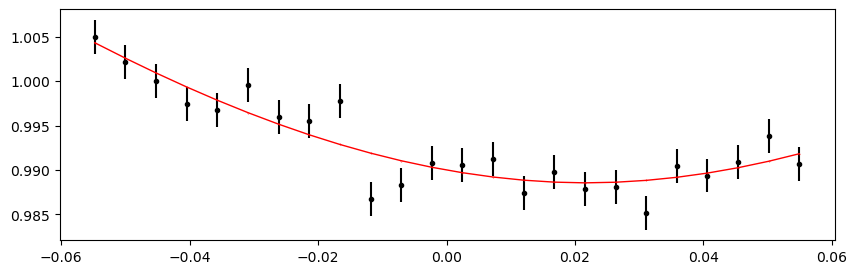

1965.1635959999999 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.55it/s]


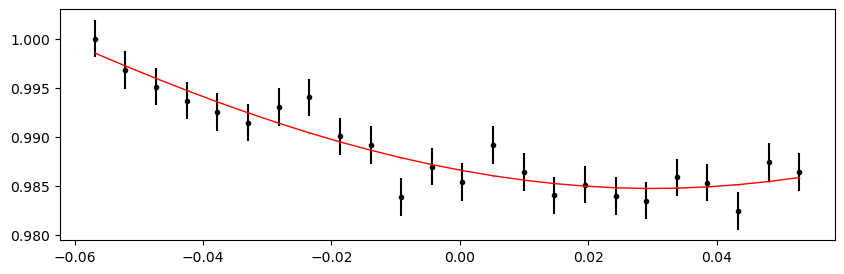

1965.454874 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 384.74it/s]


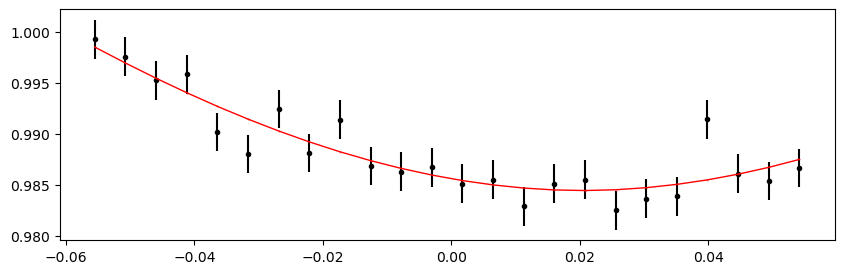

1965.746152 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.85it/s]


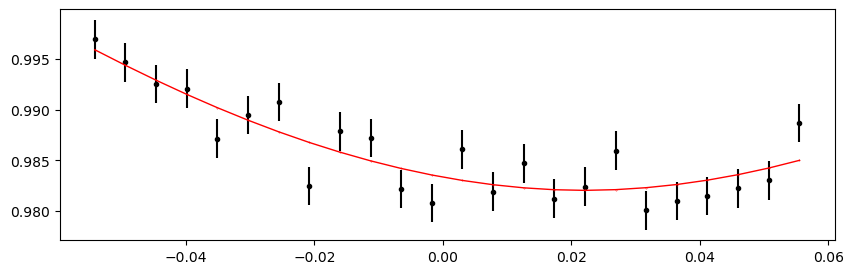

1966.0374299999999 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.32it/s]


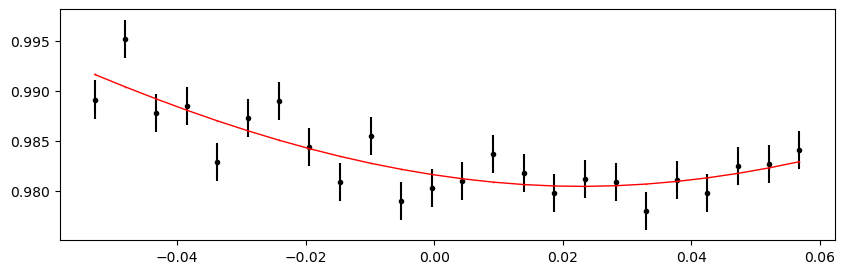

1966.328708 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.78it/s]


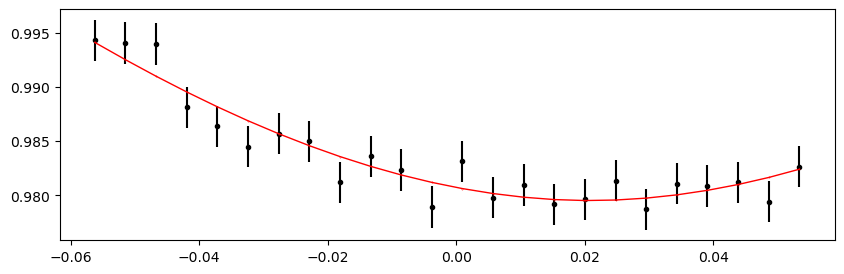

1966.619986 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.49it/s]


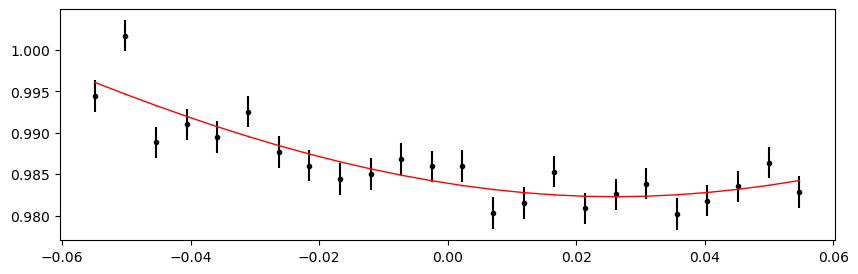

1966.9112639999998 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.58it/s]


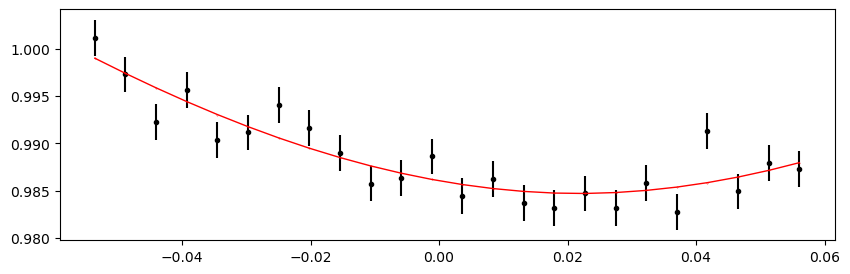

1967.202542 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 333.59it/s]


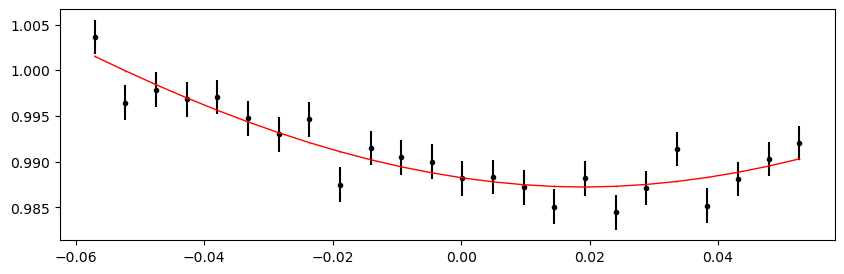

1967.49382 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.15it/s]


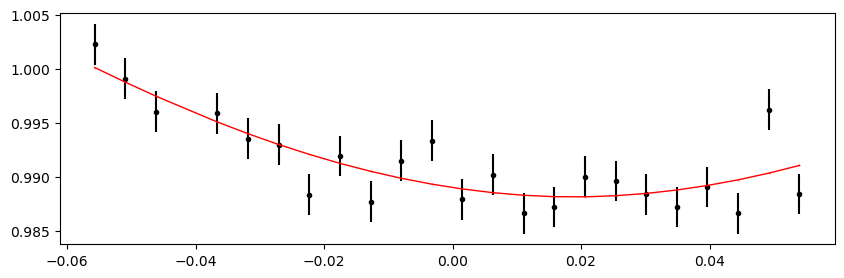

1967.7850979999998 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.94it/s]


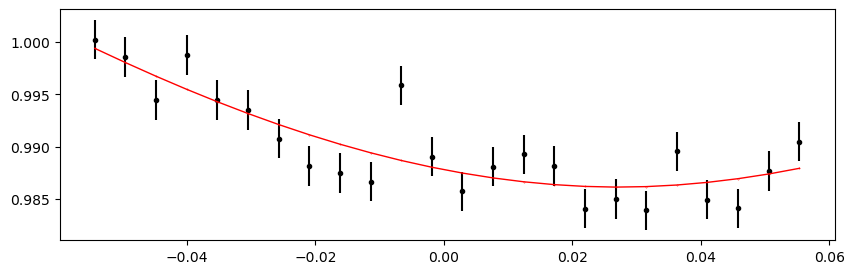

1969.5327659999998 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.15it/s]


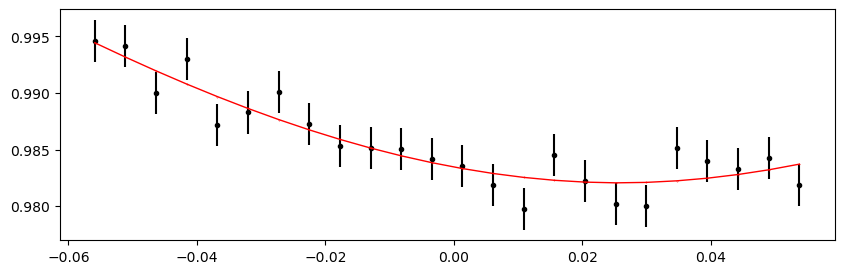

1969.824044 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.80it/s]


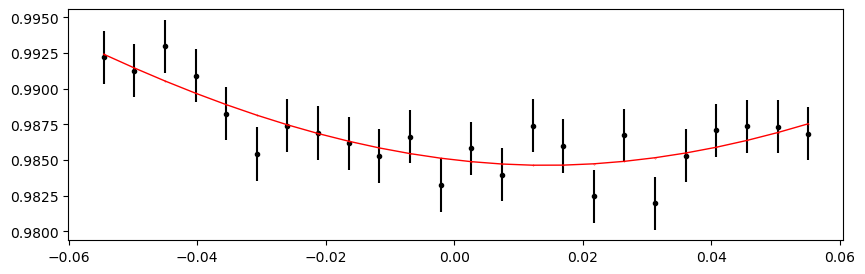

1970.1153219999999 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 370.32it/s]


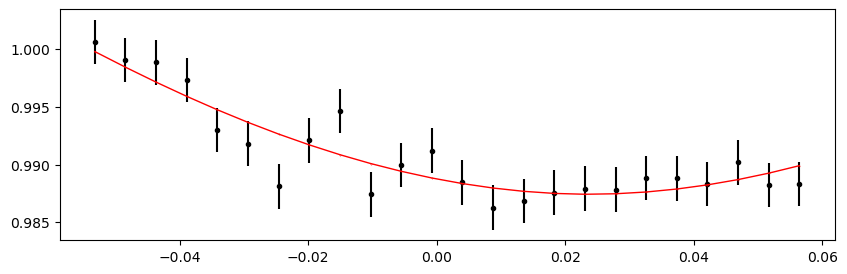

1970.4066 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.91it/s]


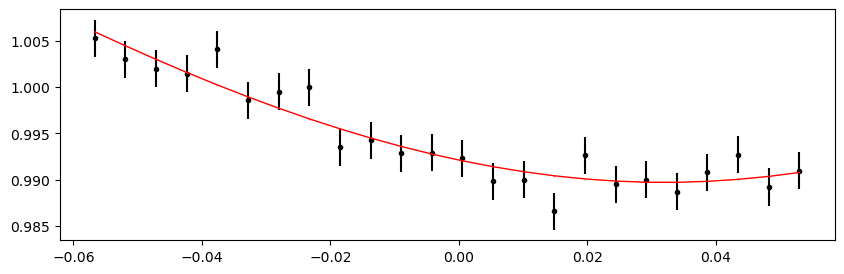

1972.154268 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.40it/s]


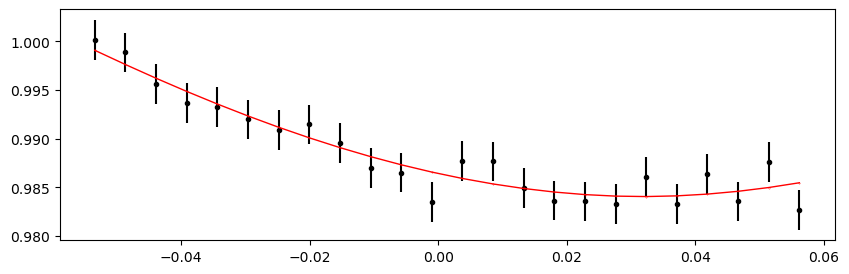

1972.445546 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.31it/s]


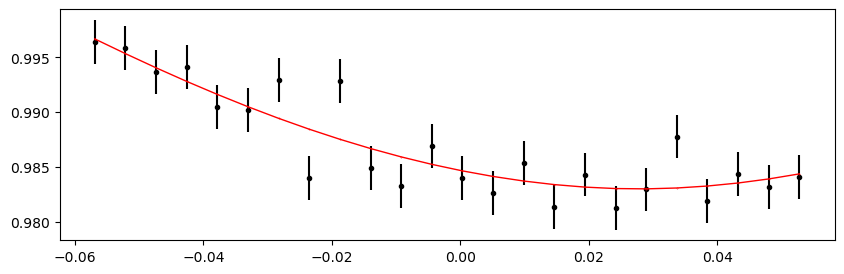

1972.7368239999998 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.58it/s]


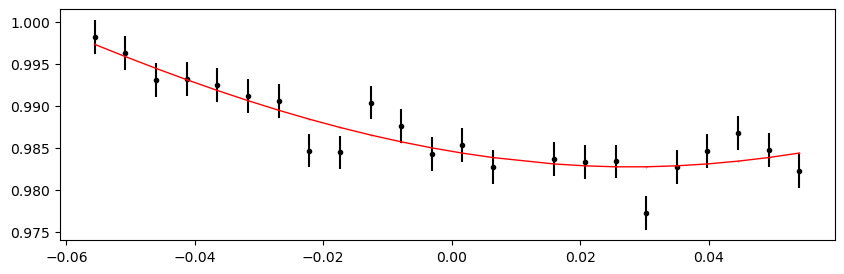

1973.028102 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.25it/s]


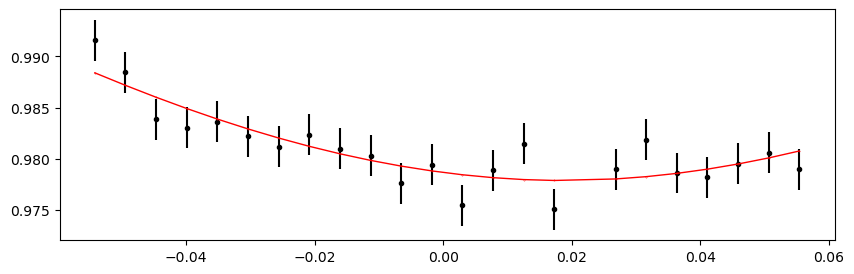

1973.31938 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.86it/s]


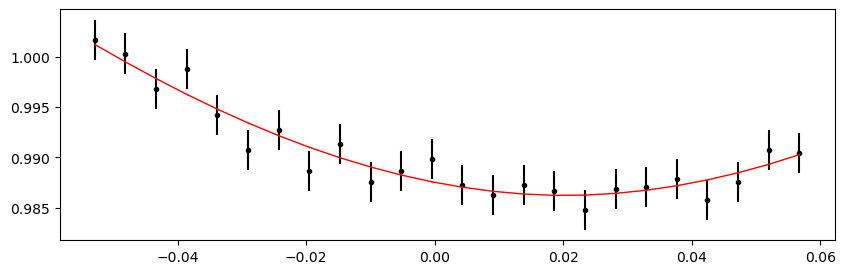

1973.6106579999998 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.69it/s]


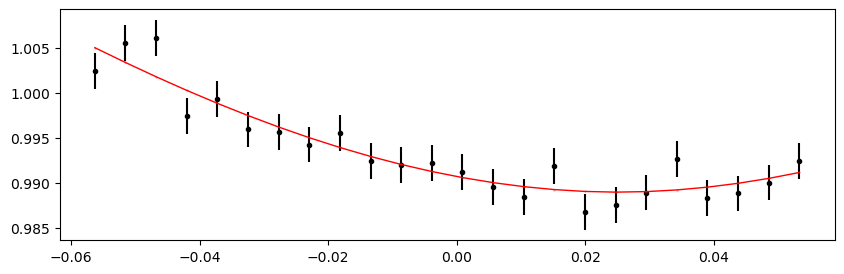

1973.901936 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.12it/s]


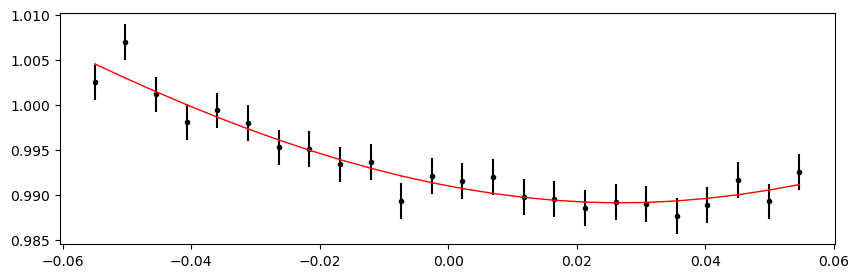

1974.193214 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.03it/s]


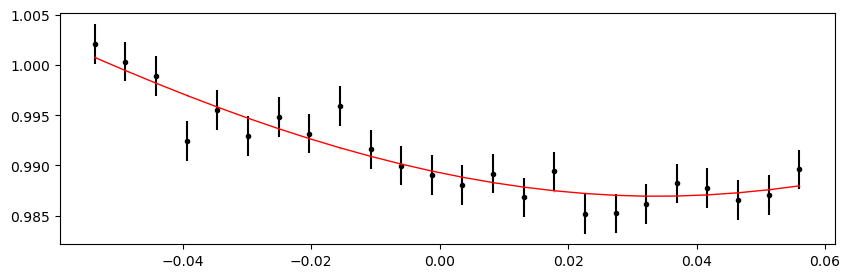

1974.77577 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 415.95it/s]


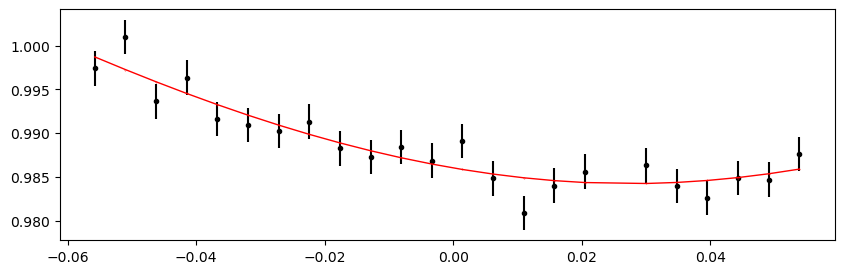

1975.0670479999999 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 422.12it/s]


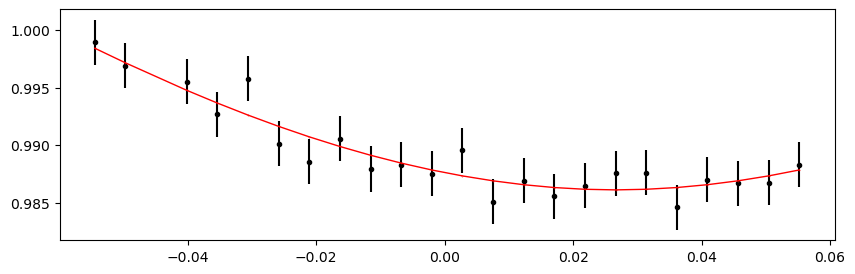

1975.358326 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.64it/s]


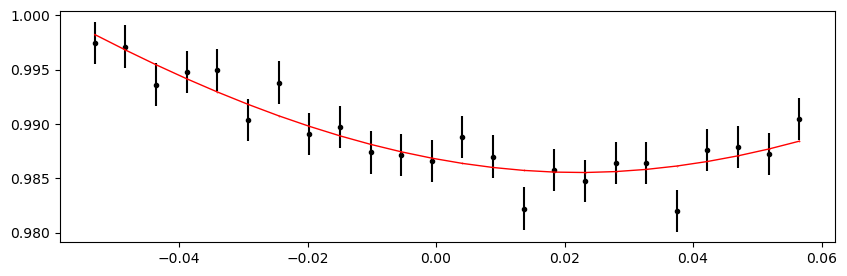

1975.649604 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.20it/s]


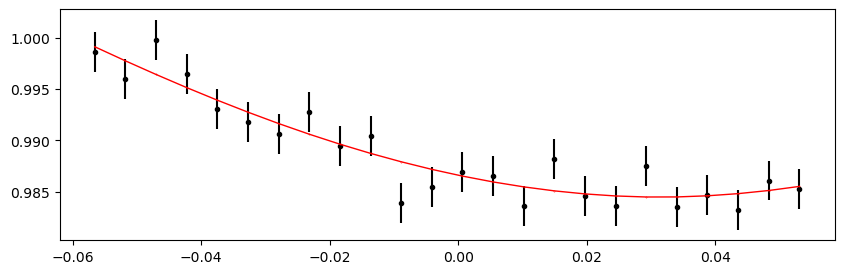

1975.9408819999999 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.40it/s]


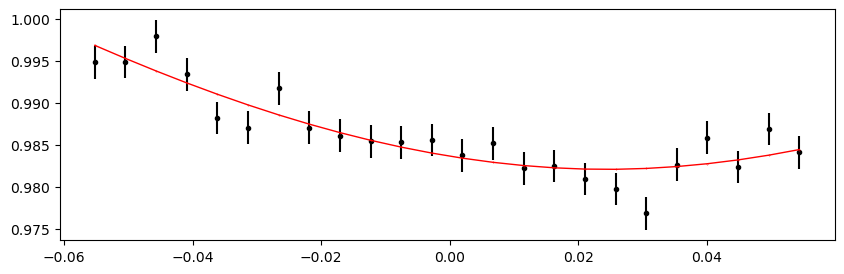

1976.23216 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.19it/s]


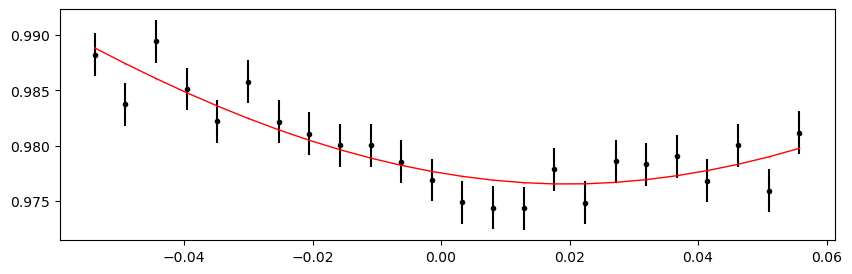

1976.523438 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.84it/s]


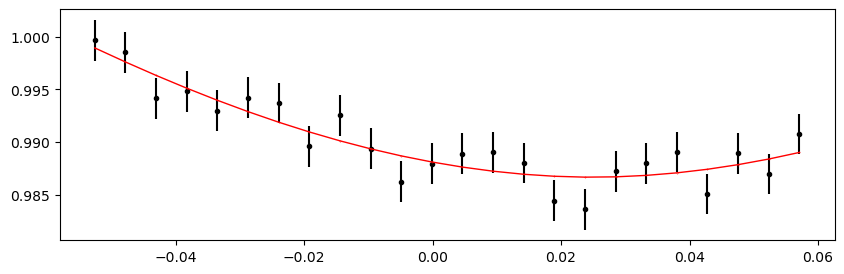

1976.8147159999999 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.89it/s]


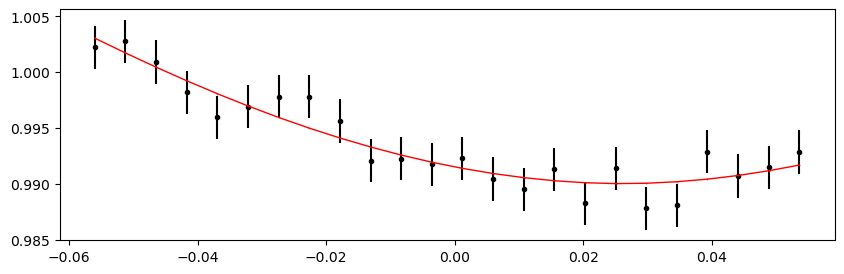

1977.105994 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.27it/s]


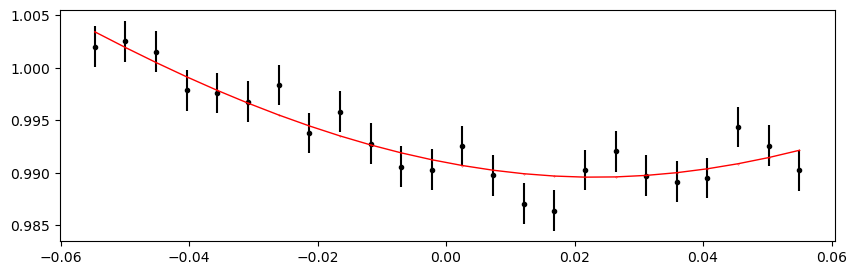

1977.397272 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.27it/s]


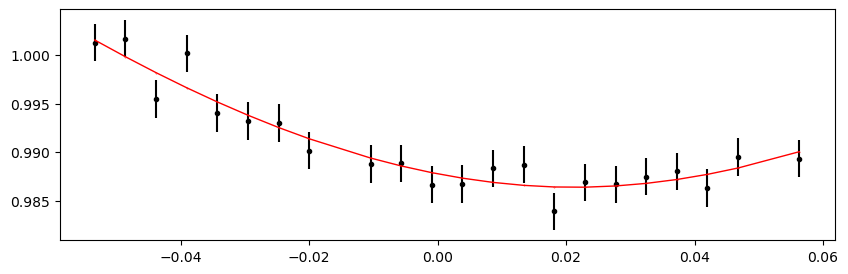

1977.979828 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.95it/s]


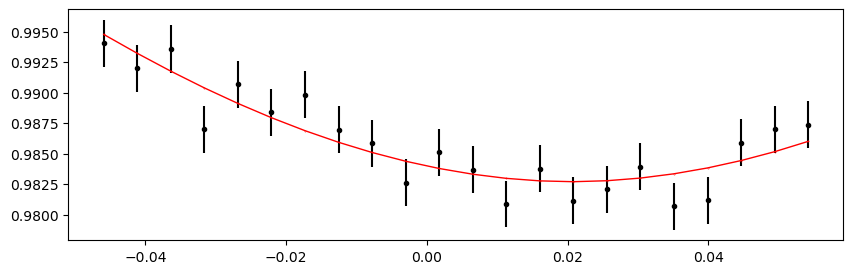

1978.271106 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.25it/s]


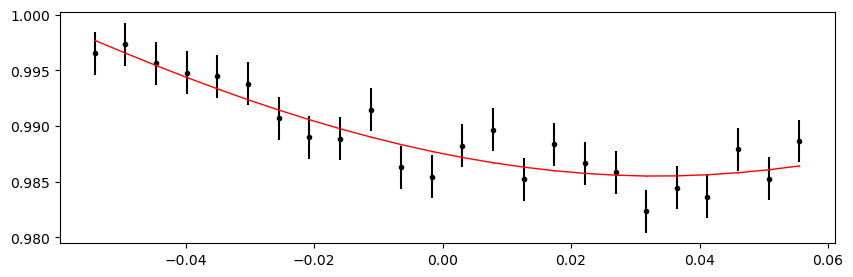

1978.5623839999998 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.81it/s]


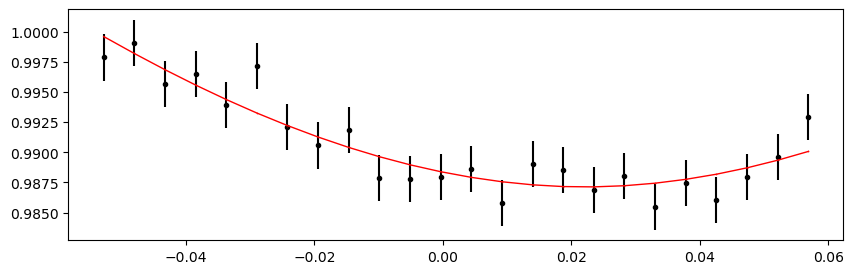

1978.853662 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.45it/s]


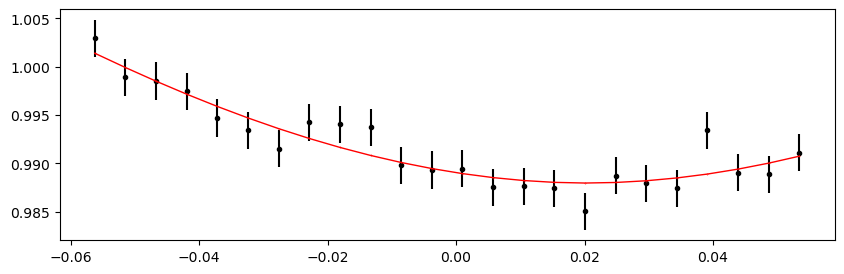

1979.14494 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.31it/s]


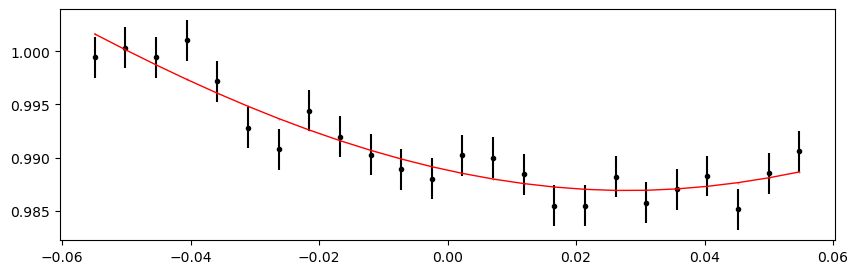

1979.4362179999998 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 410.33it/s]


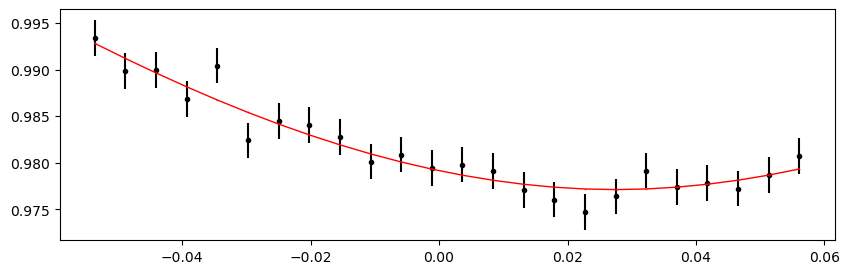

1979.727496 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.92it/s]


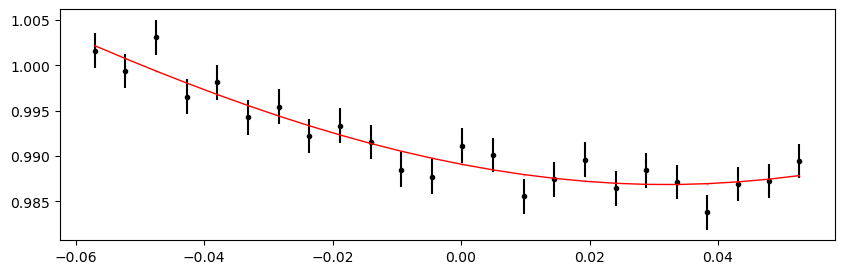

1980.018774 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 400.96it/s]


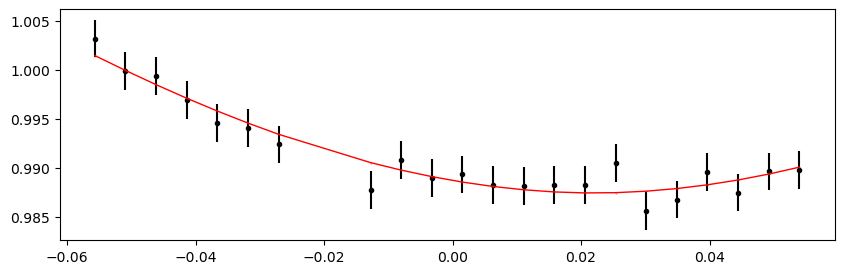

1980.3100519999998 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.80it/s]


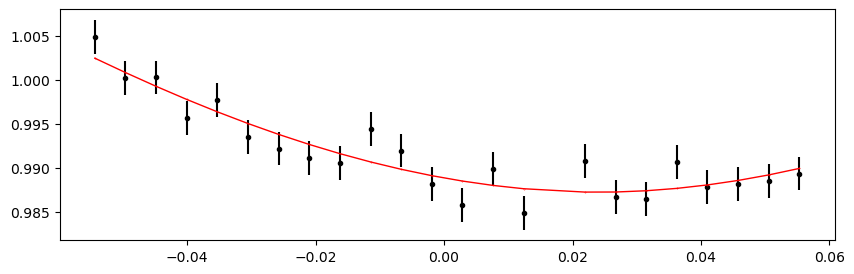

1980.60133 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 416.32it/s]


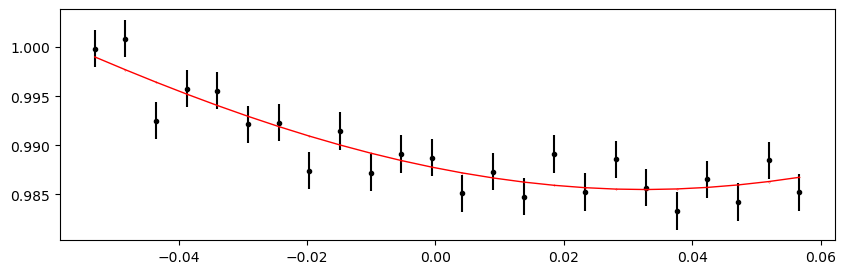

Time 1980.8926079999999 does not have enough data points: 16
Time 1981.183886 does not have enough data points: 6
1981.475164 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 422.35it/s]


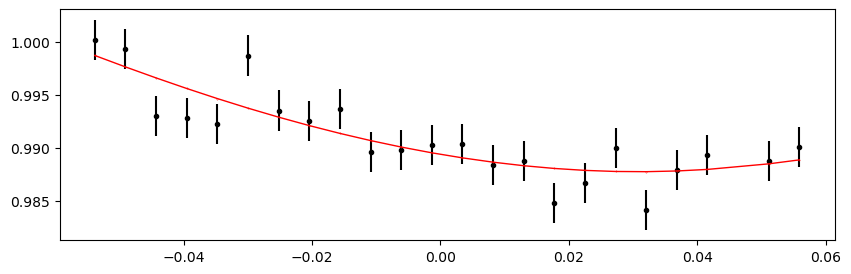

1981.7664419999999 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.27it/s]


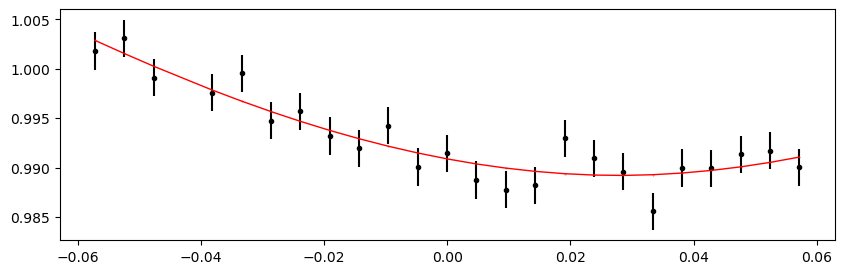

1982.05772 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.87it/s]


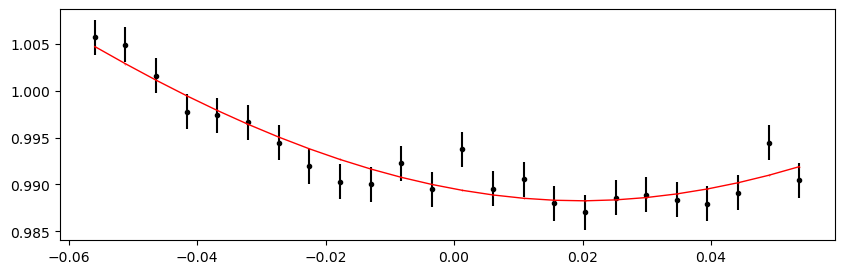

1983.805388 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.59it/s]


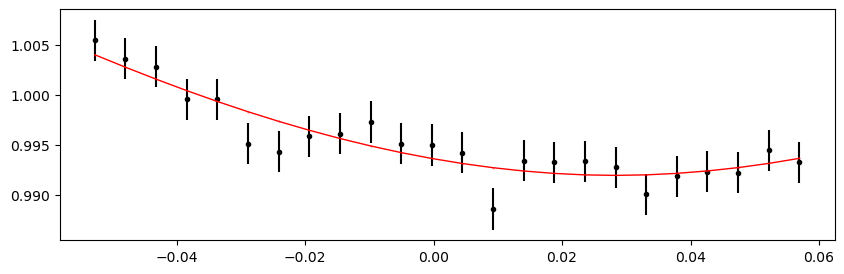

1984.096666 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.69it/s]


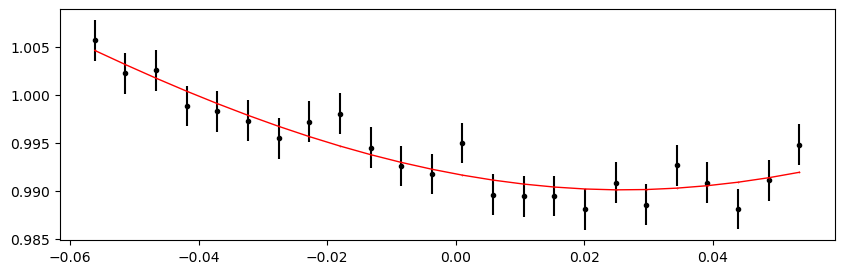

1984.679222 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 419.46it/s]


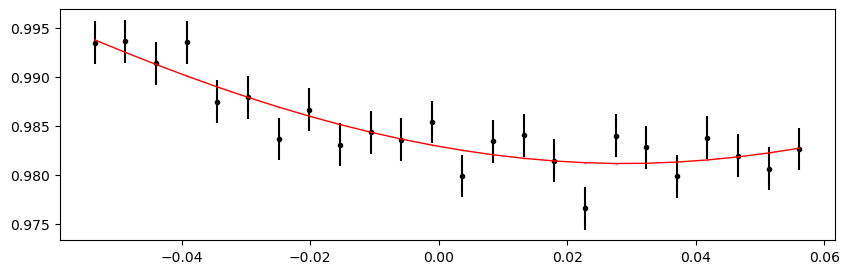

1984.9705 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.07it/s]


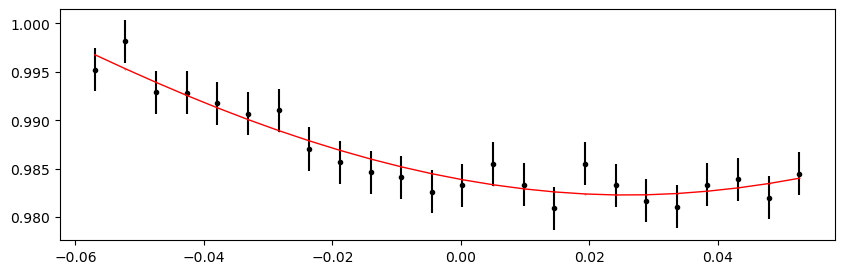

1985.2617779999998 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.17it/s]


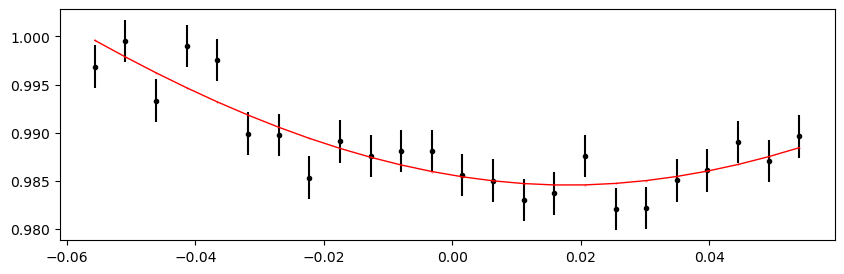

1985.553056 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 422.47it/s]


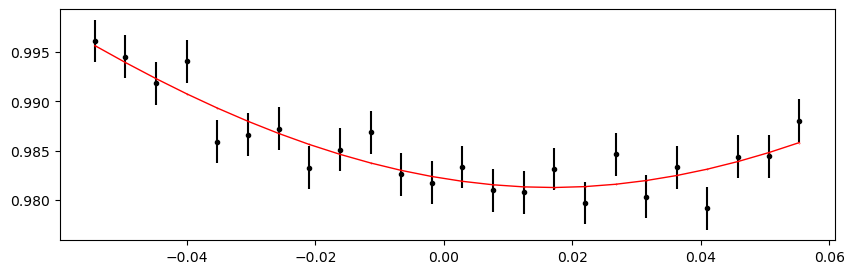

1985.844334 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.98it/s]


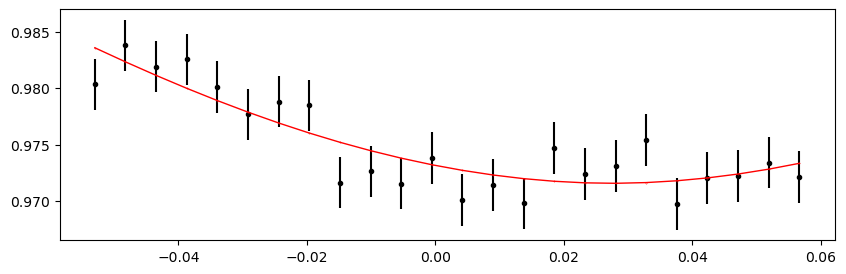

1986.1356119999998 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.65it/s]


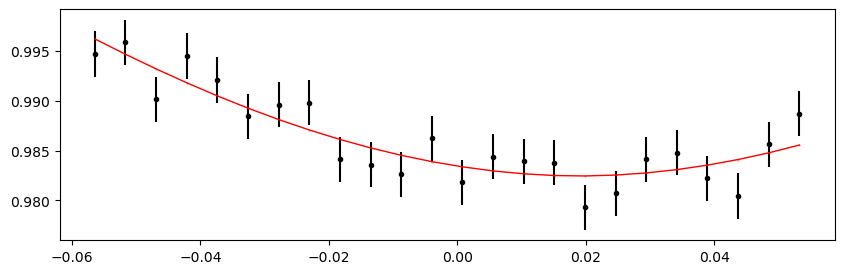

1986.42689 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.98it/s]


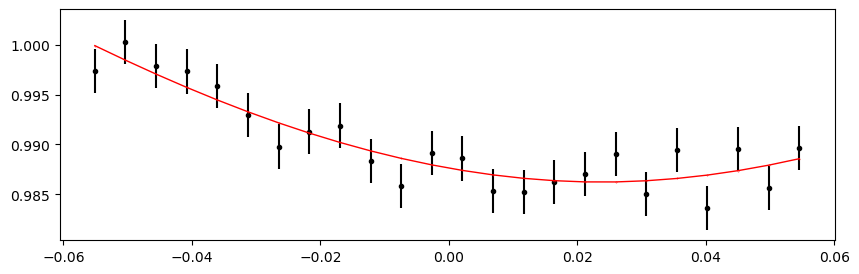

1986.7181679999999 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.88it/s]


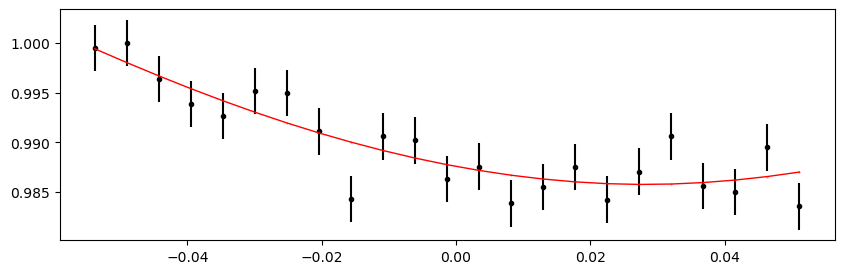

1987.009446 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 422.21it/s]


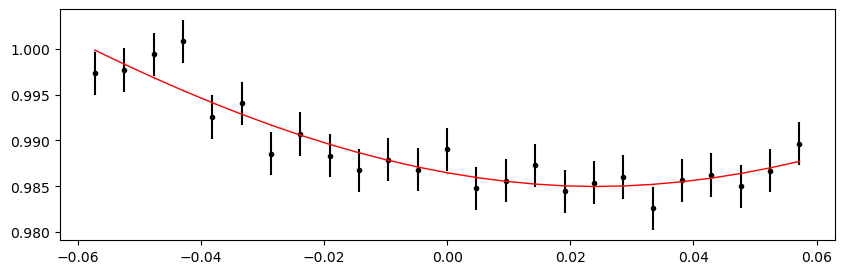

1987.300724 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.09it/s]


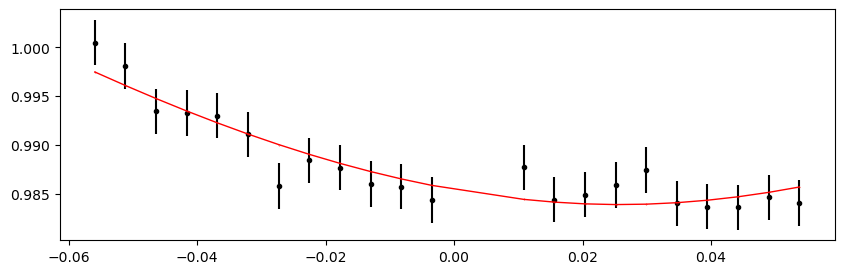

1987.88328 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.53it/s]


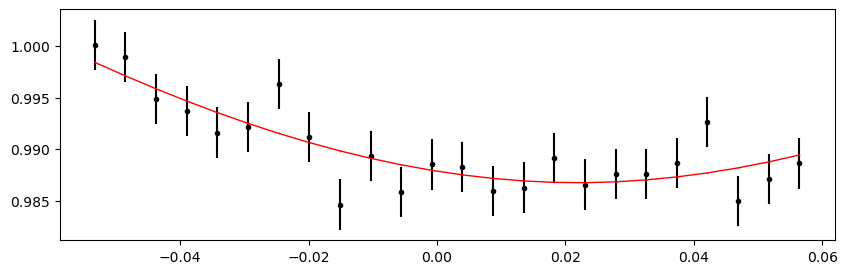

1988.174558 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 429.57it/s]


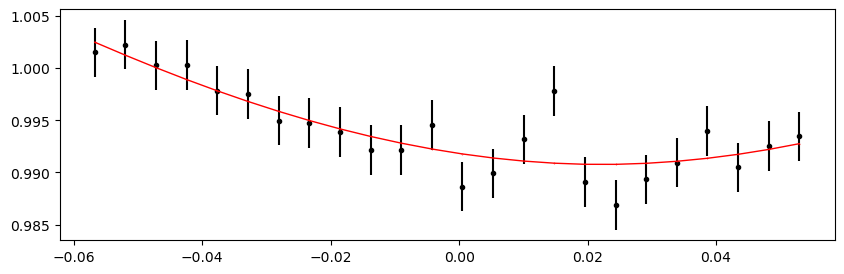

1988.4658359999999 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.35it/s]


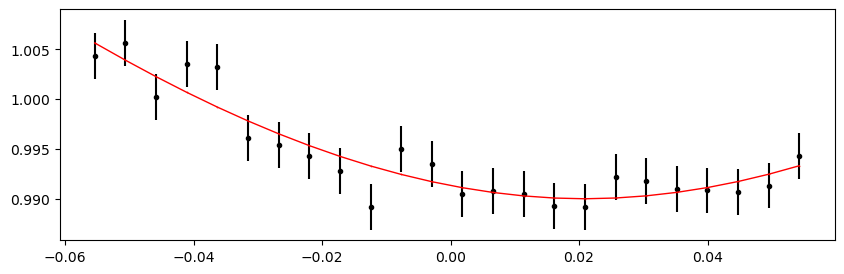

1988.757114 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.96it/s]


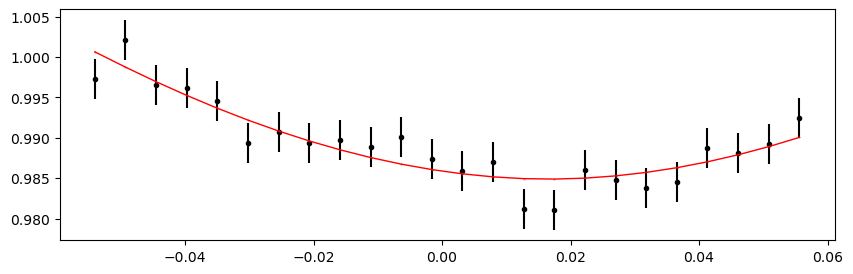

1989.048392 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.71it/s]


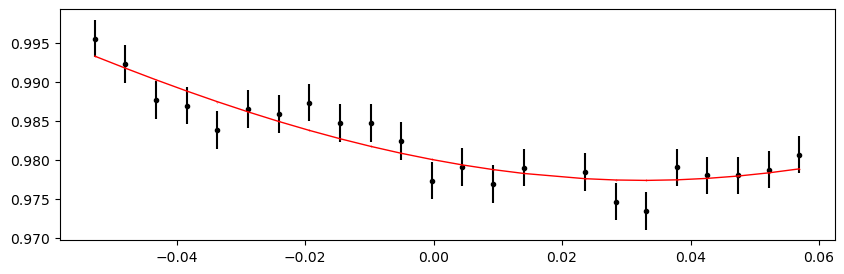

1989.3396699999998 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.62it/s]


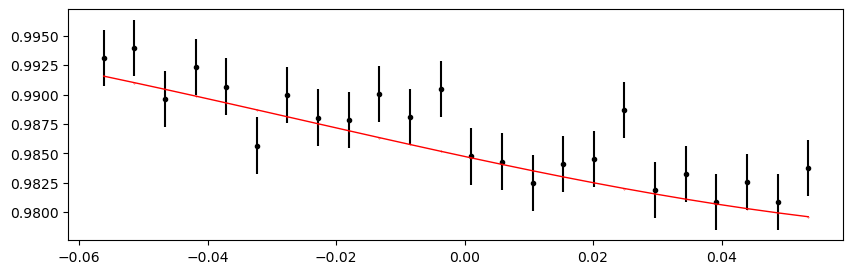

1989.630948 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.65it/s]


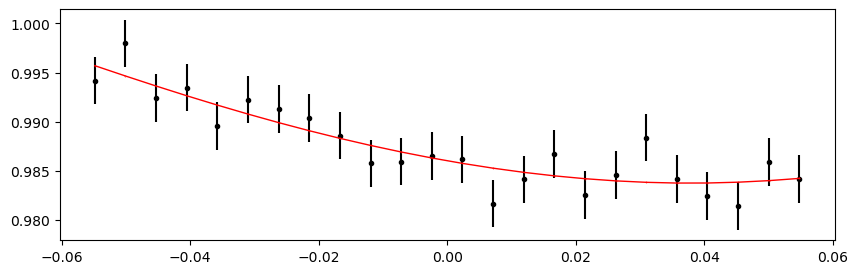

1989.922226 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.89it/s]


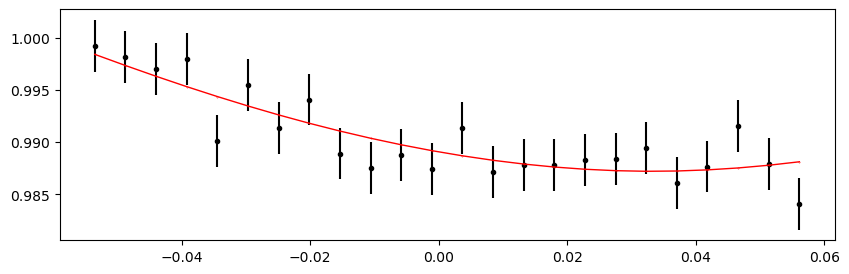

1990.2135039999998 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 429.27it/s]


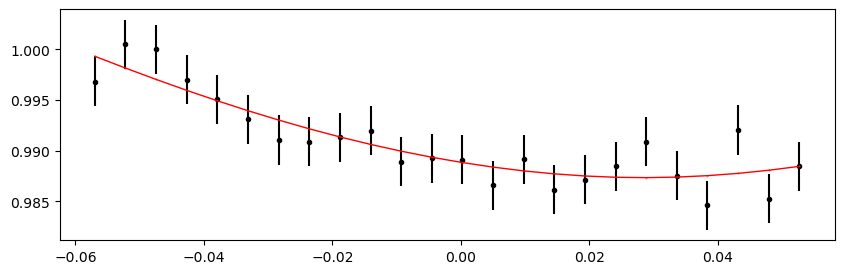

1990.504782 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.02it/s]


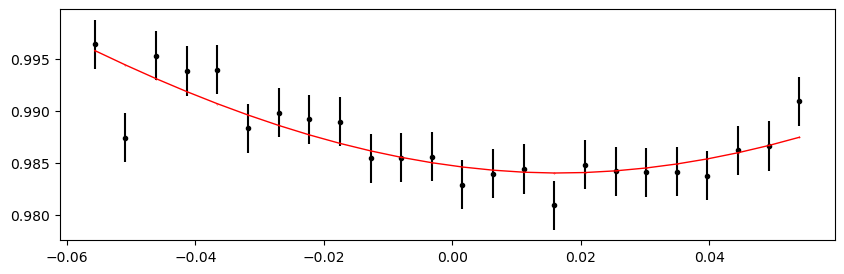

1991.0873379999998 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 431.04it/s]


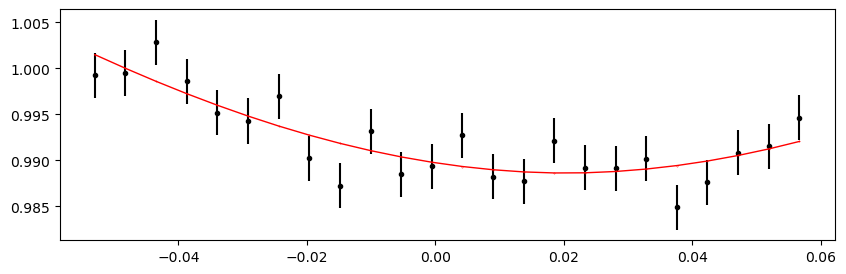

1991.378616 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.82it/s]


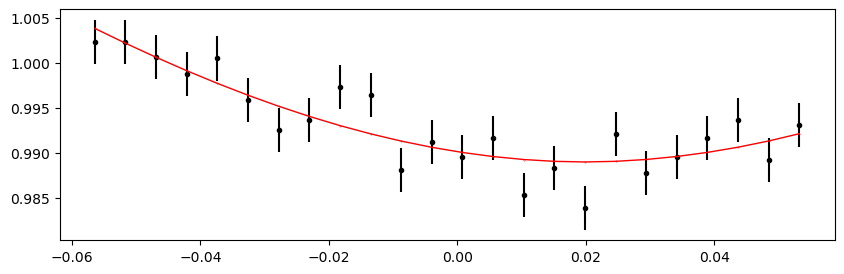

1991.6698939999999 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 430.36it/s]


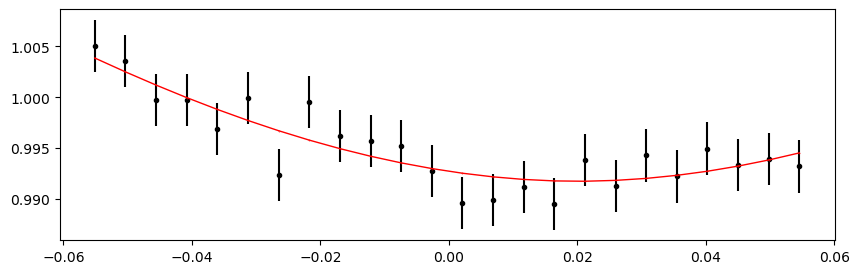

1991.9611719999998 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.46it/s]


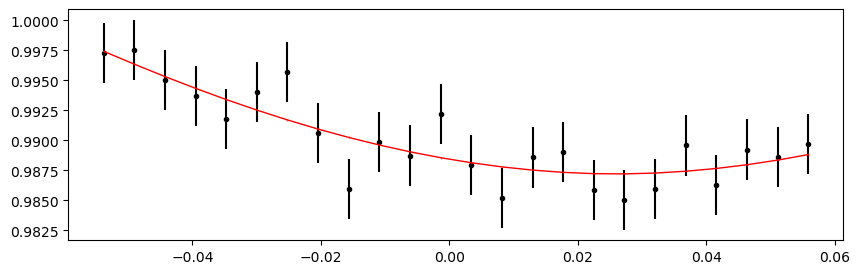

1992.25245 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 420.74it/s]


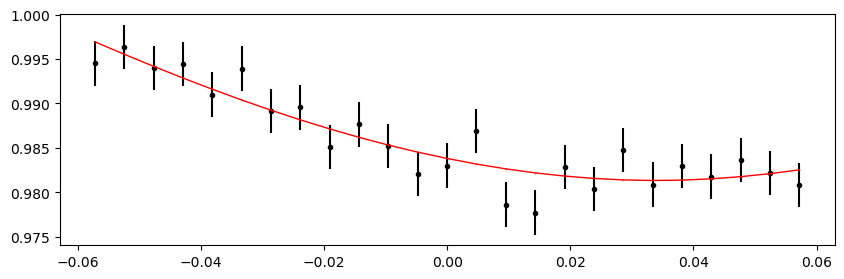

1992.5437279999999 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 433.48it/s]


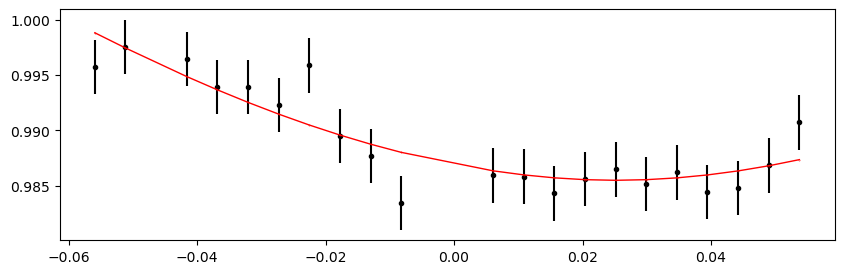

1992.835006 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 431.52it/s]


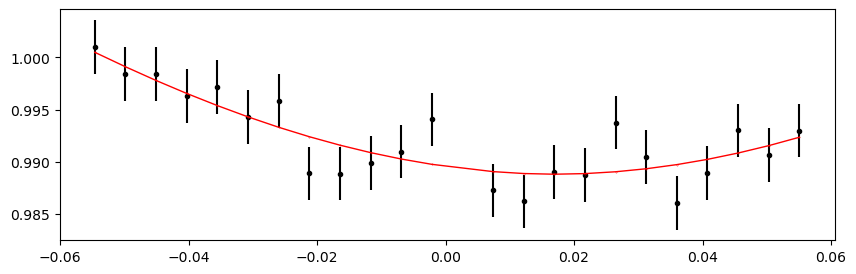

1993.126284 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 447.42it/s]


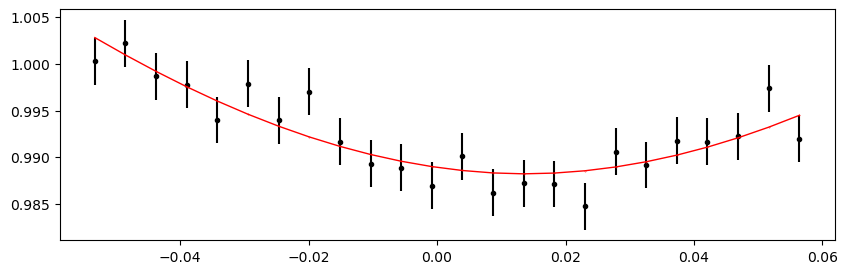

1993.4175619999999 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.13it/s]


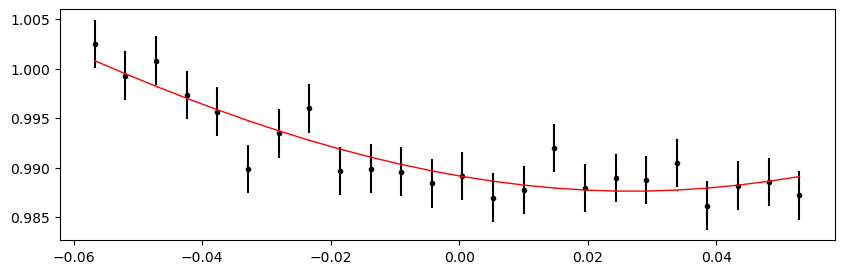

1993.70884 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.36it/s]


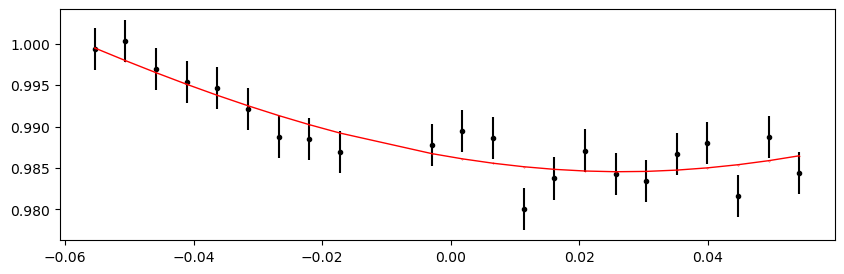

1994.2913959999998 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.17it/s]


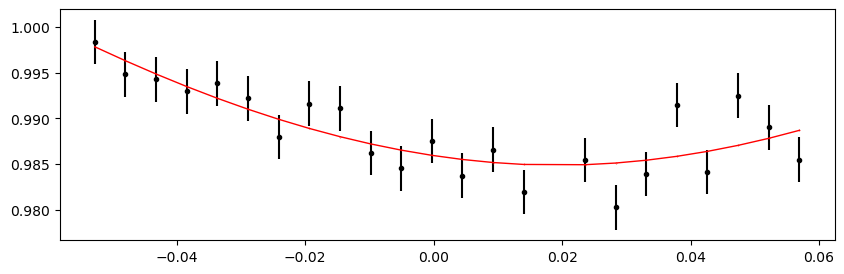

1994.582674 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 430.77it/s]


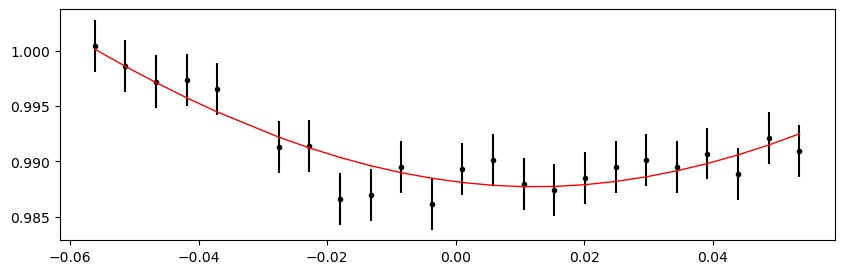

1994.873952 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.98it/s]


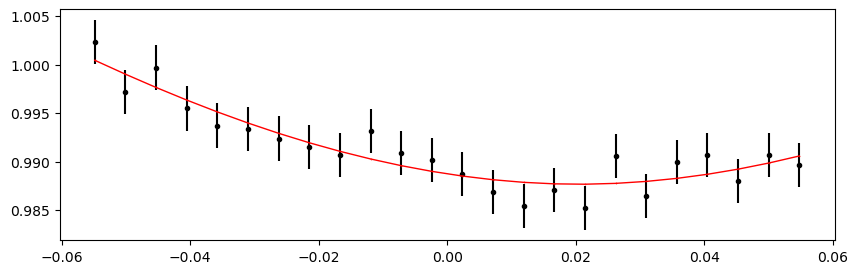

1995.1652299999998 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.93it/s]


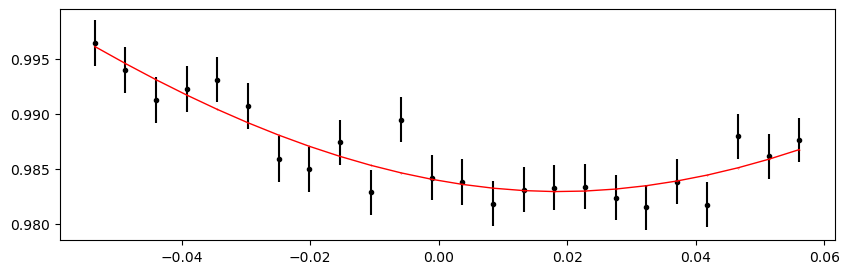

1995.456508 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.75it/s]


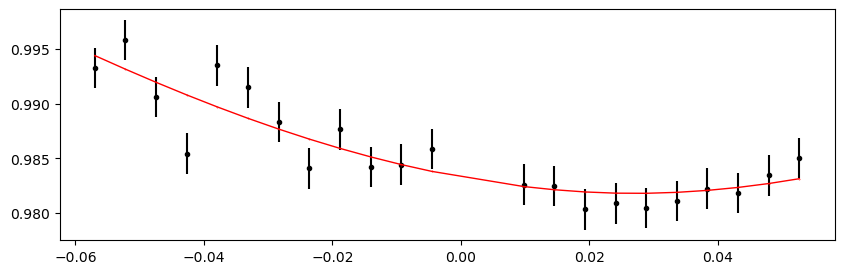

Time 1996.9128979999998 does not have enough data points: 8
1997.4954539999999 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.61it/s]


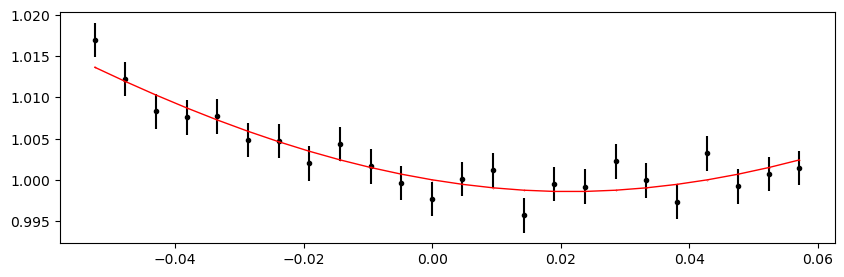

1997.786732 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.31it/s]


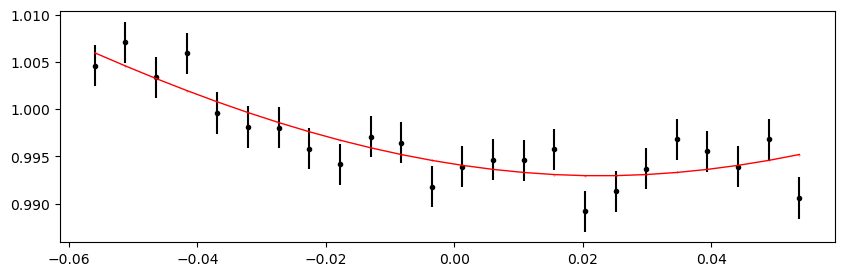

1998.07801 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 429.25it/s]


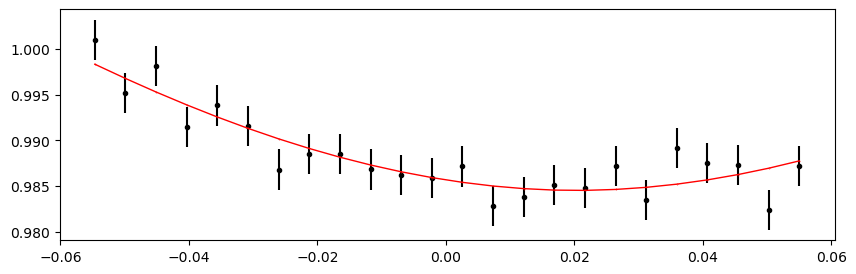

1998.3692879999999 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.73it/s]


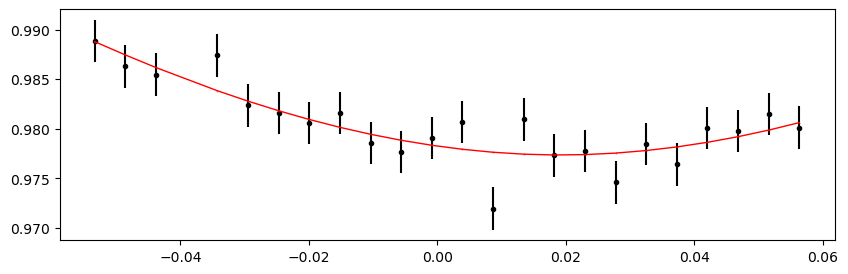

1998.660566 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.46it/s]


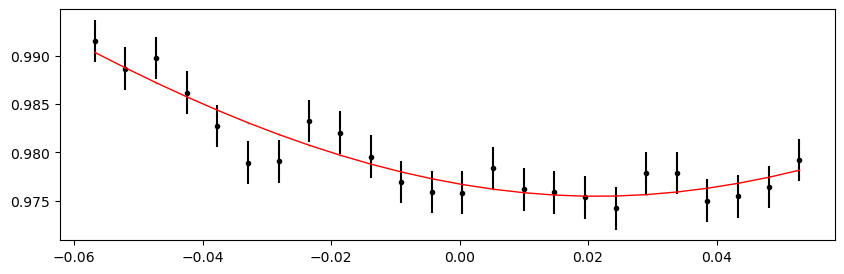

1998.951844 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 431.94it/s]


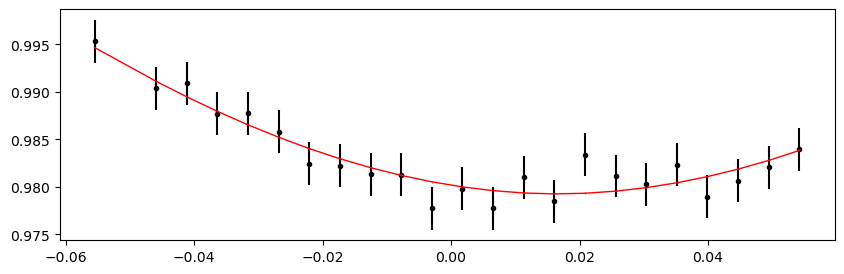

1999.2431219999999 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.40it/s]


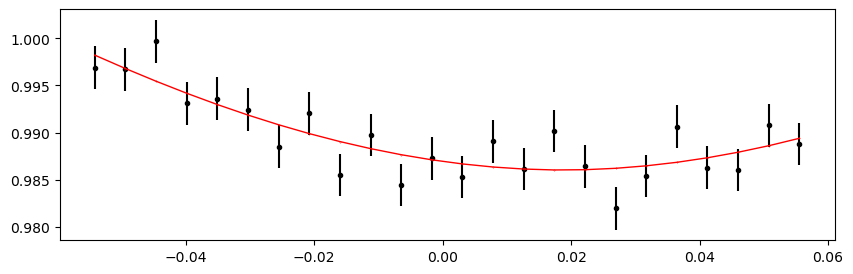

1999.5344 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 431.14it/s]


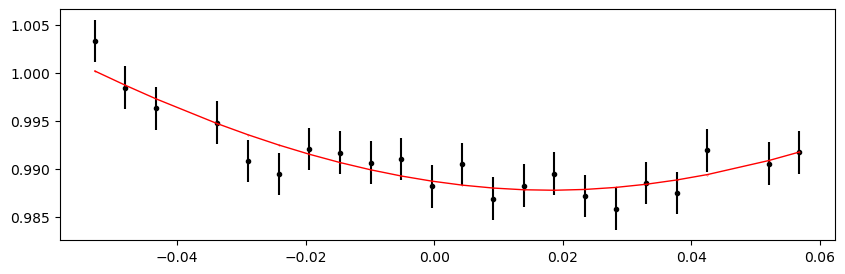

1999.825678 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 429.61it/s]


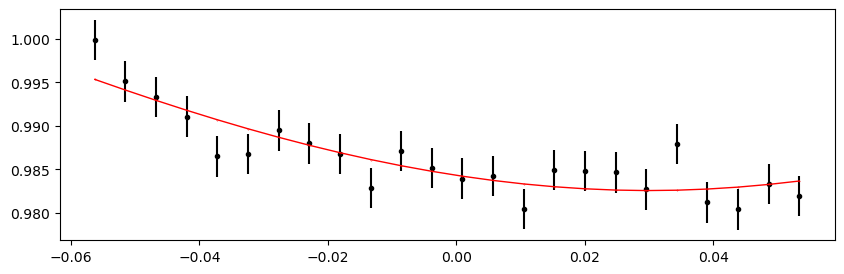

2000.1169559999998 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 420.80it/s]


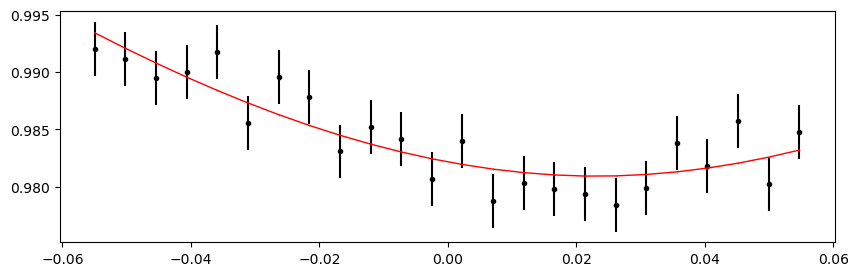

2000.699512 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.83it/s]


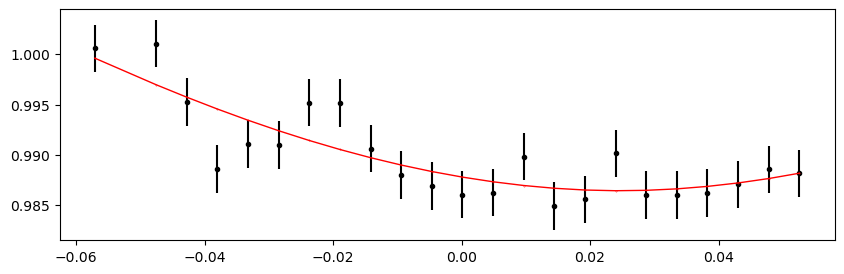

2000.9907899999998 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 431.92it/s]


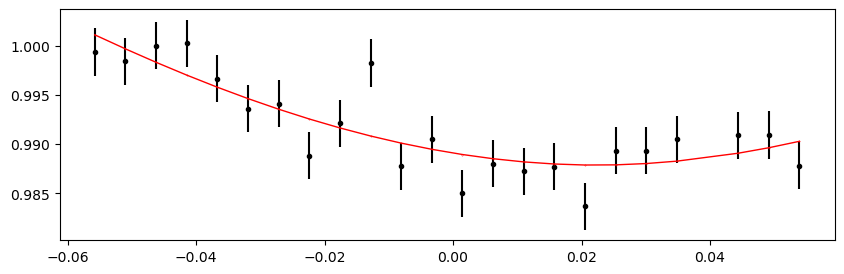

2001.282068 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 429.72it/s]


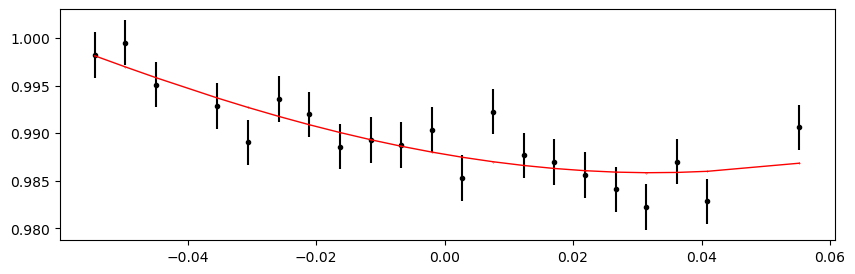

2001.573346 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.57it/s]


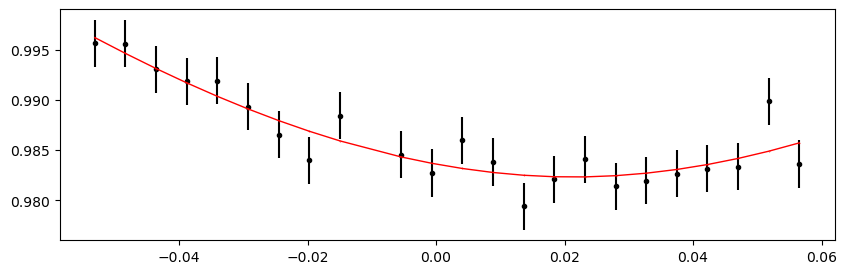

2001.8646239999998 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 398.72it/s]


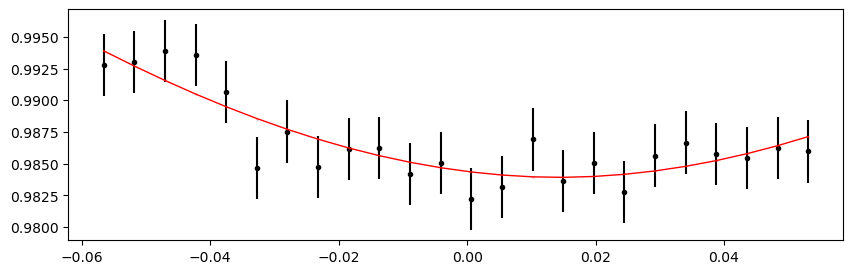

2002.155902 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 356.52it/s]


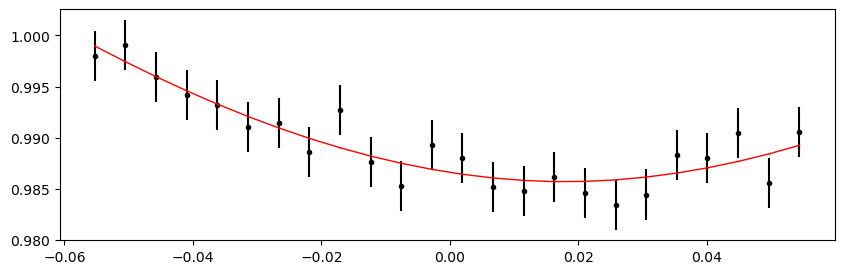

2002.44718 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.43it/s]


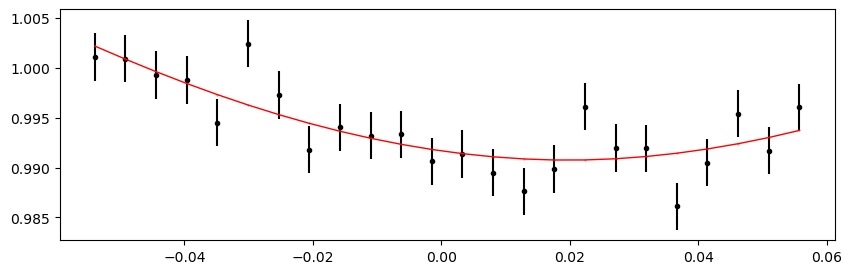

2002.7384579999998 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 429.73it/s]


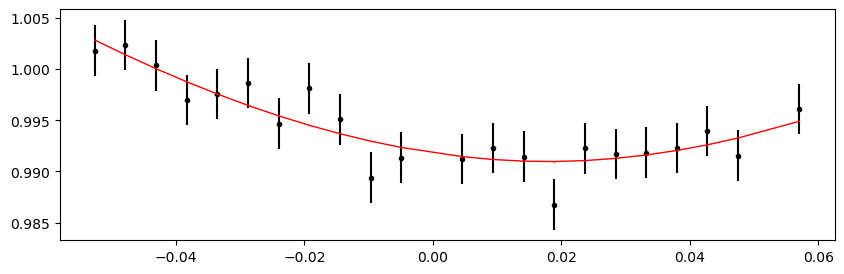

2003.029736 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 429.18it/s]


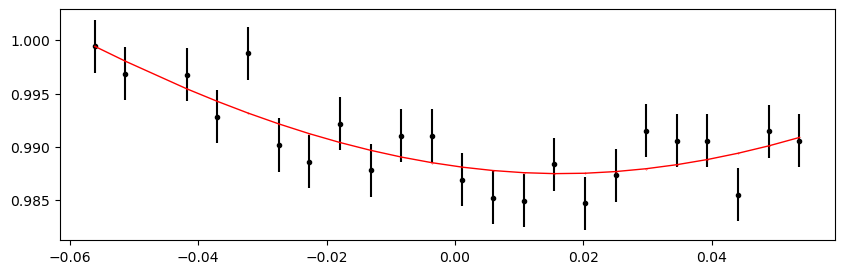

2003.3210139999999 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 429.73it/s]


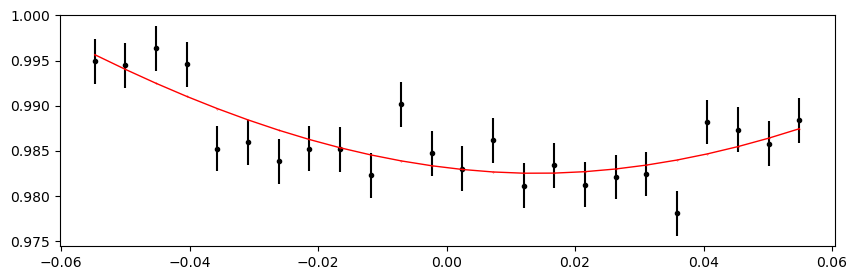

2003.90357 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.25it/s]


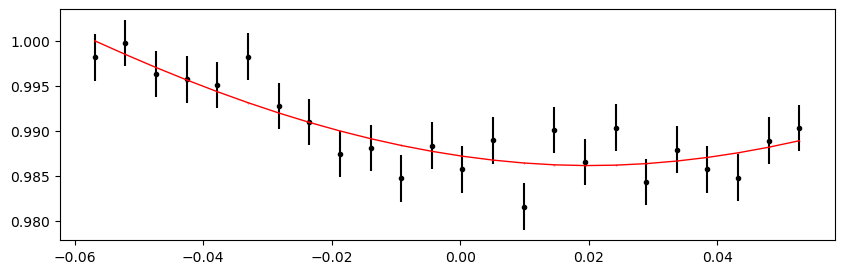

2004.1948479999999 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.90it/s]


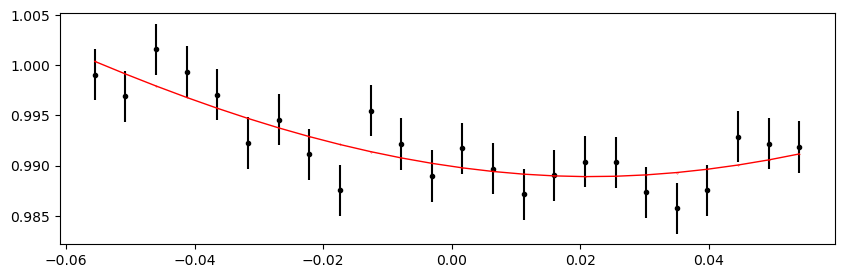

2004.486126 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.08it/s]


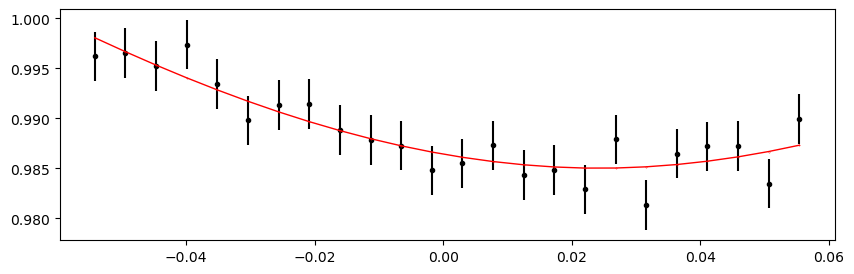

2004.777404 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 429.00it/s]


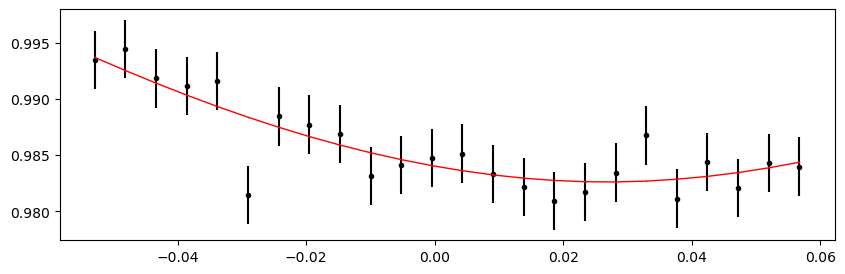

2005.0686819999999 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.27it/s]


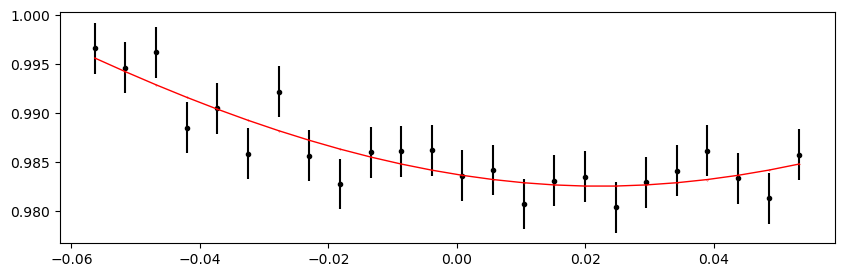

2005.35996 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.35it/s]


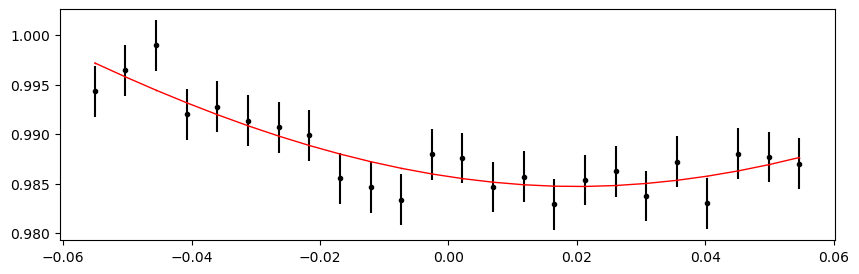

2005.651238 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.53it/s]


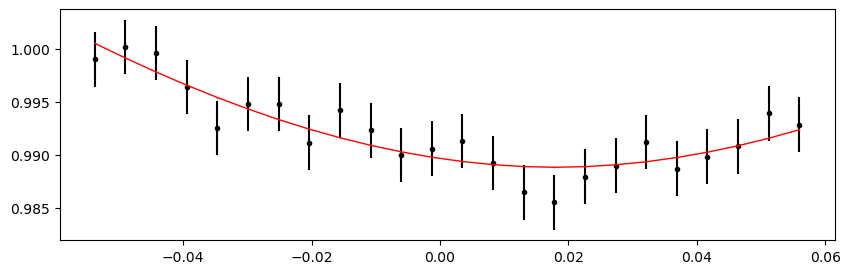

2005.9425159999998 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.45it/s]


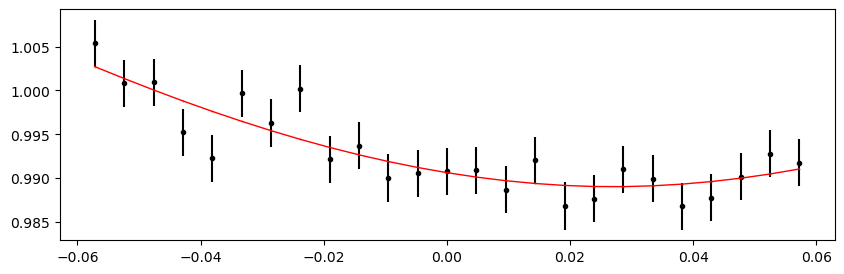

2006.233794 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 432.61it/s]


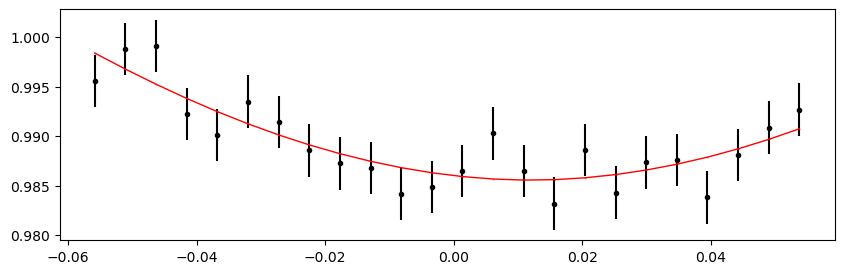

2006.525072 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.25it/s]


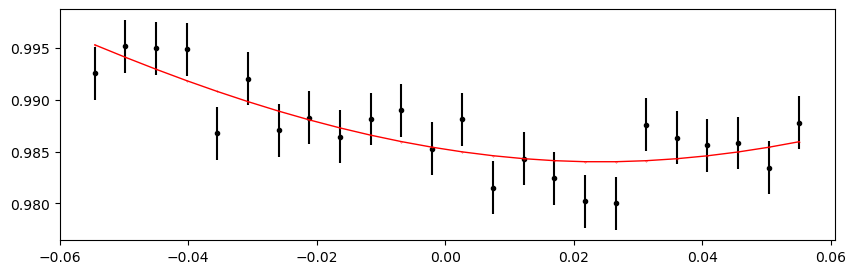

2007.107628 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.90it/s]


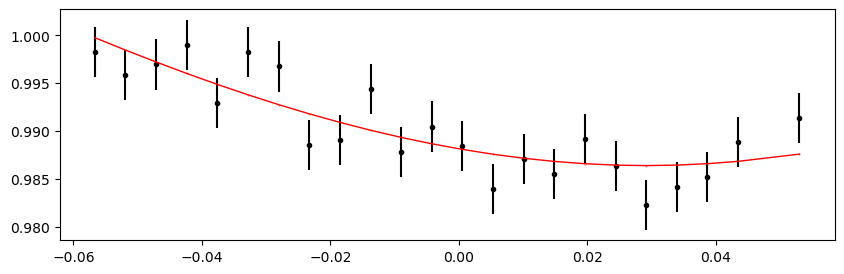

2007.398906 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 429.83it/s]


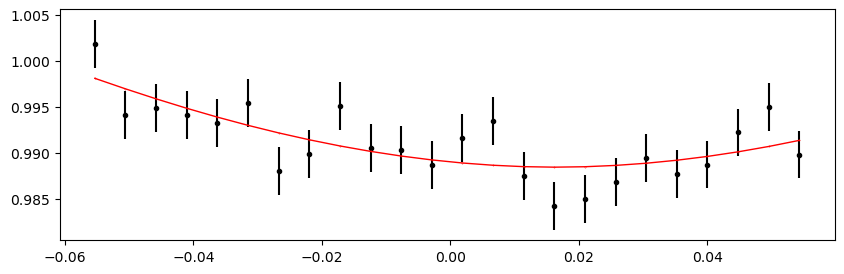

2007.6901839999998 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.89it/s]


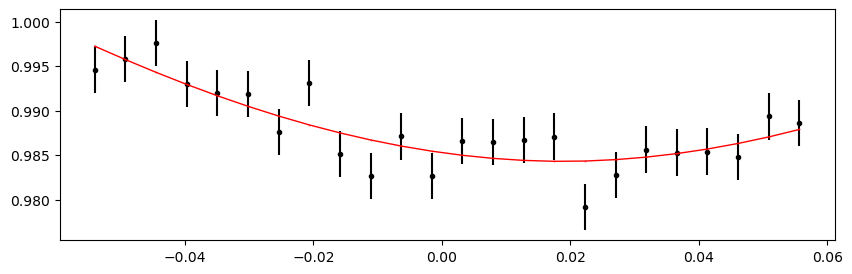

2007.981462 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.36it/s]


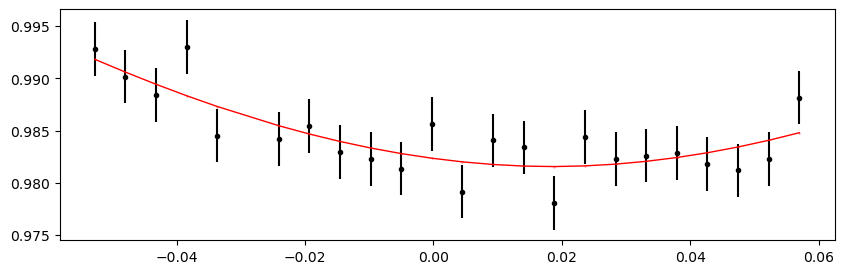

2008.2727399999999 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.82it/s]


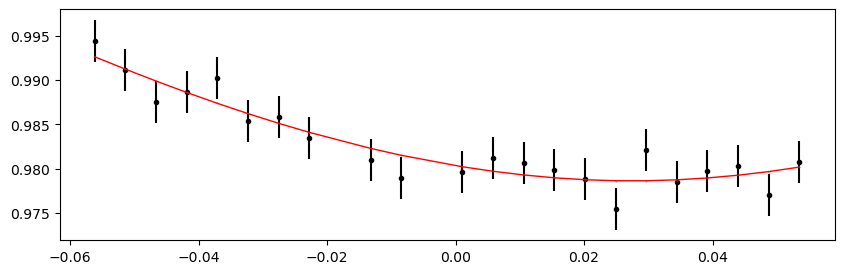

2008.564018 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.09it/s]


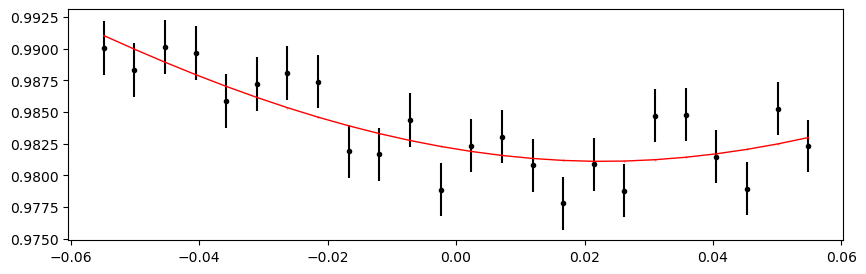

2008.855296 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.30it/s]


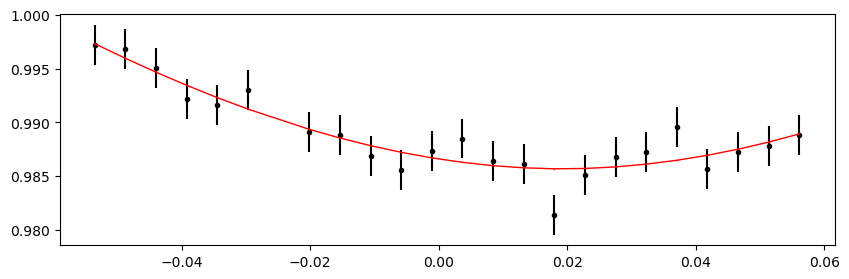

2009.1465739999999 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.45it/s]


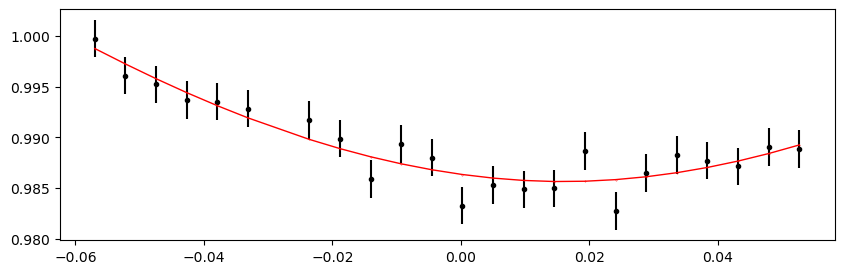

2640.637278 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.91it/s]


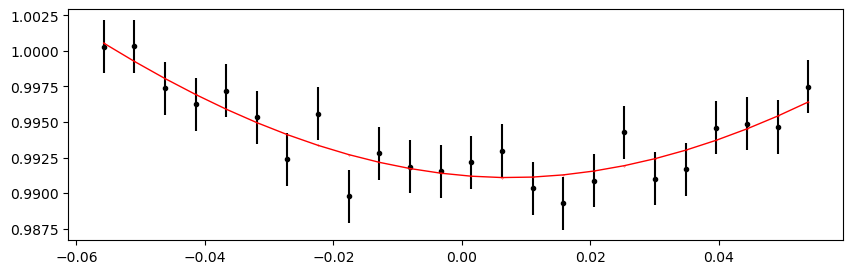

2640.928556 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.61it/s]


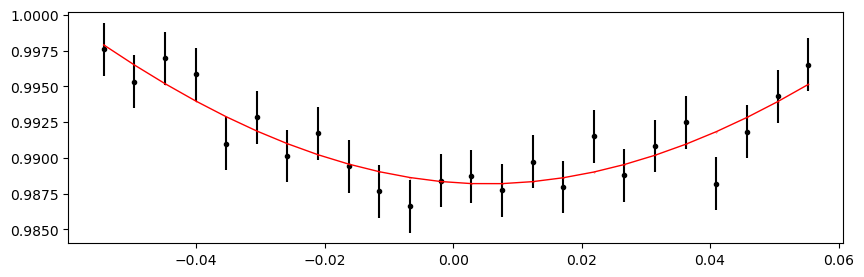

2641.219834 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 420.80it/s]


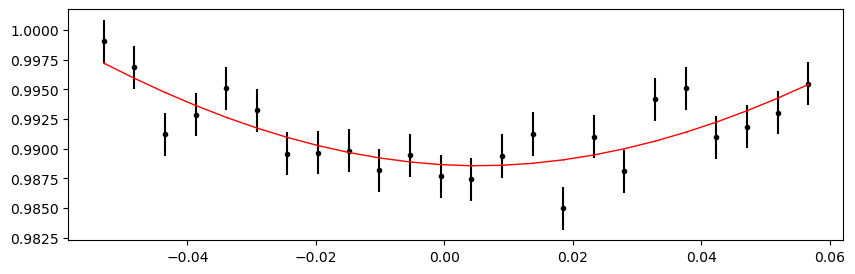

2641.511112 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.55it/s]


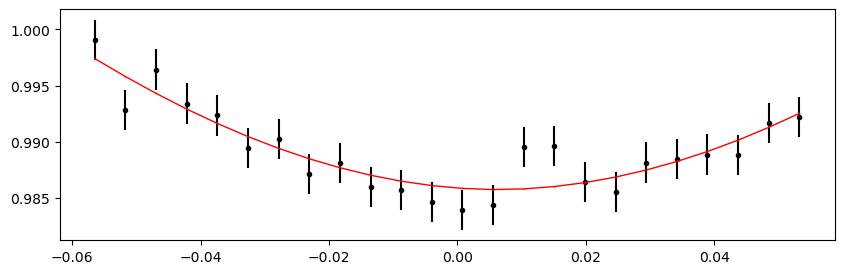

2641.80239 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 421.84it/s]


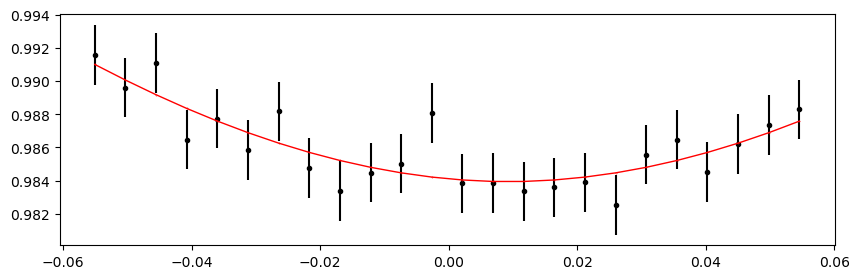

2642.093668 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.64it/s]


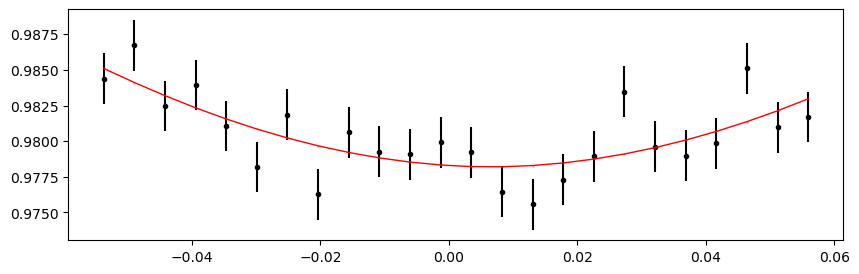

2642.676224 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.46it/s]


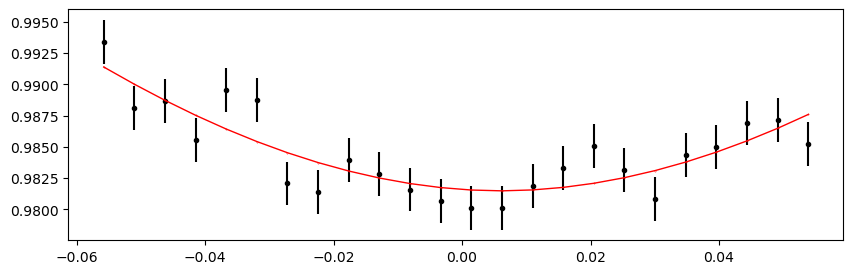

2642.967502 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 419.46it/s]


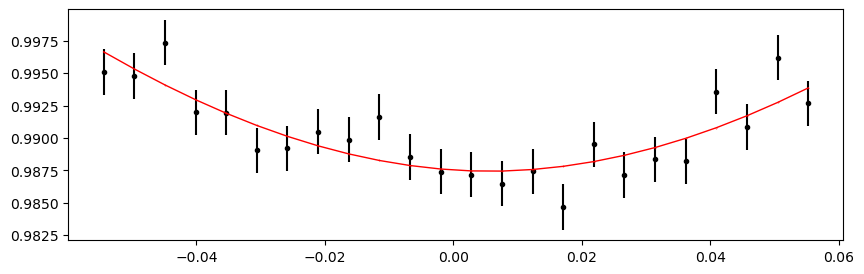

2643.25878 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.05it/s]


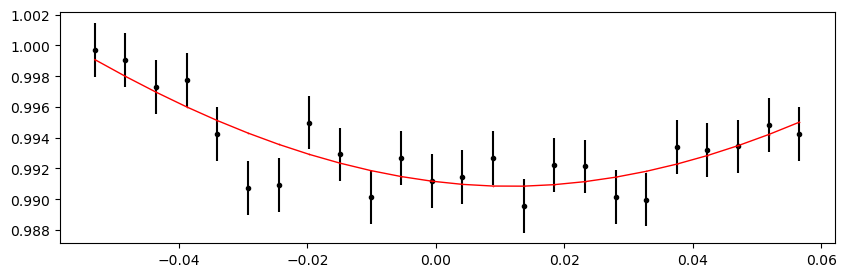

2643.550058 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 411.06it/s]


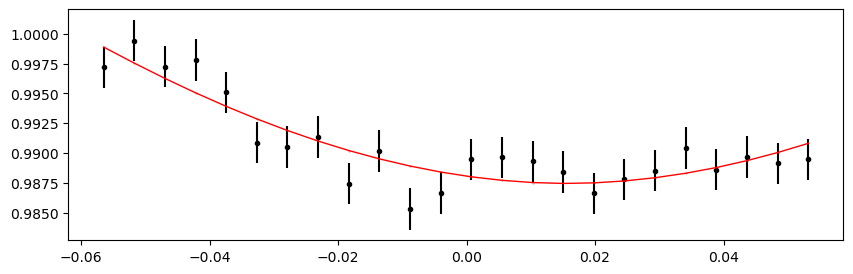

2643.841336 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.99it/s]


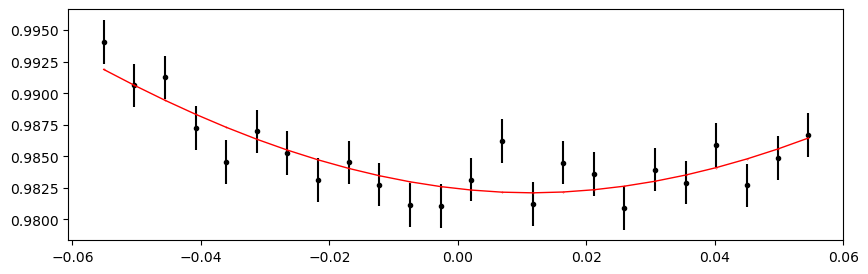

2644.132614 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.55it/s]


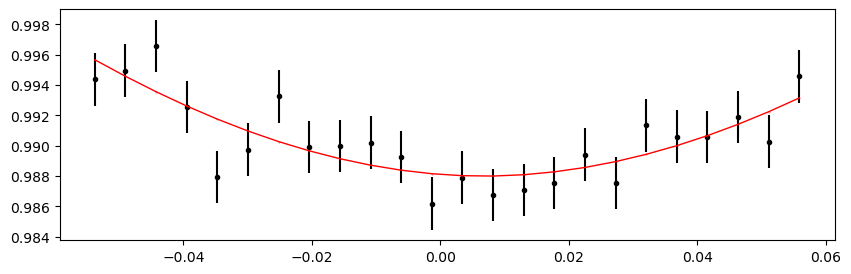

2644.423892 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 421.40it/s]


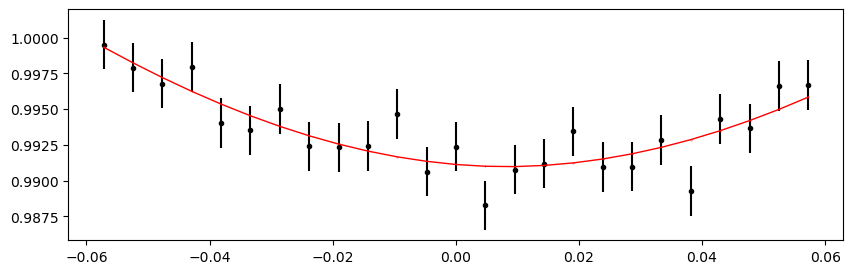

2644.71517 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.27it/s]


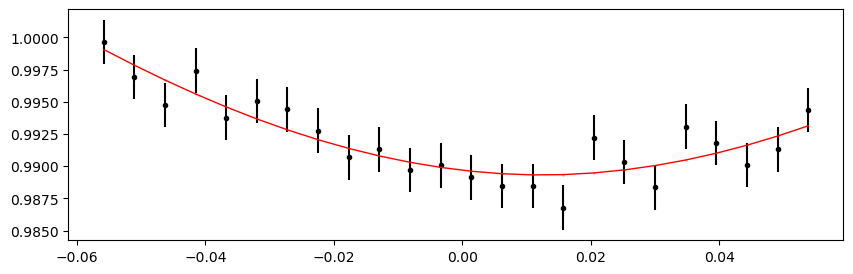

2645.006448 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 419.20it/s]


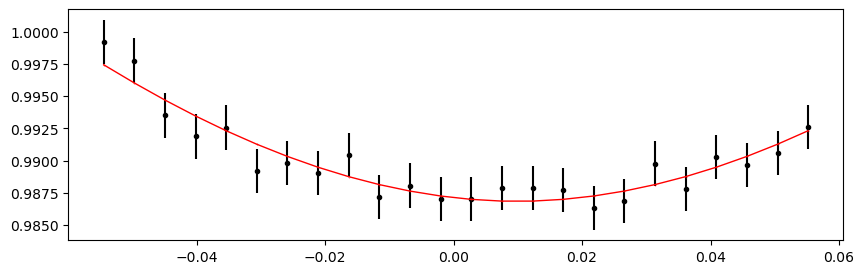

2645.297726 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 422.93it/s]


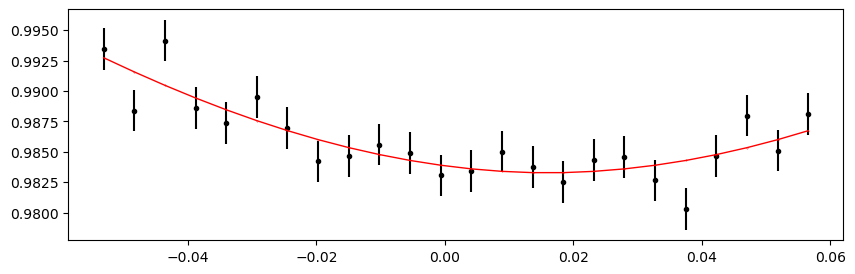

2645.880282 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.08it/s]


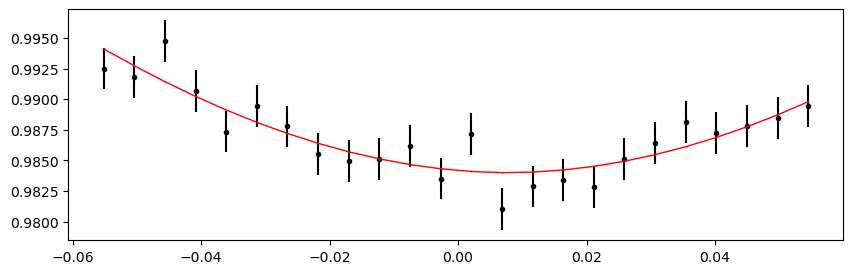

2646.1715599999998 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.12it/s]


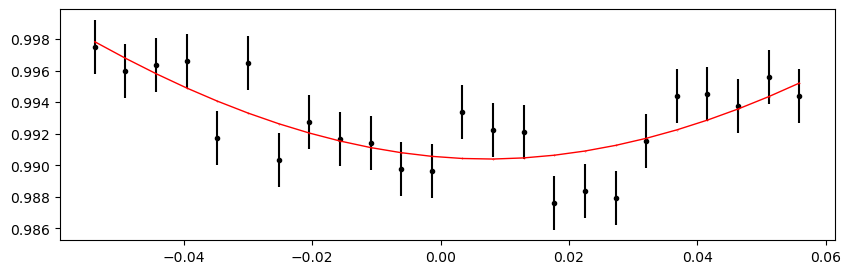

2646.462838 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.54it/s]


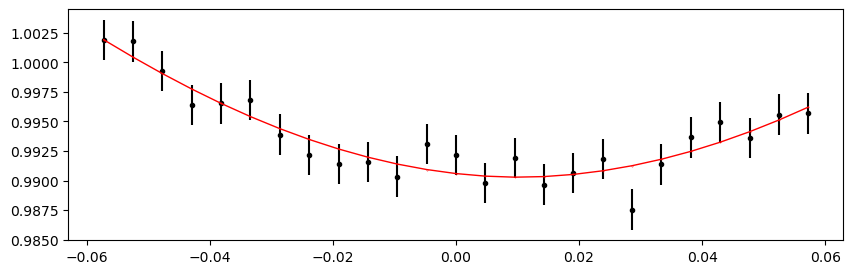

2646.754116 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.23it/s]


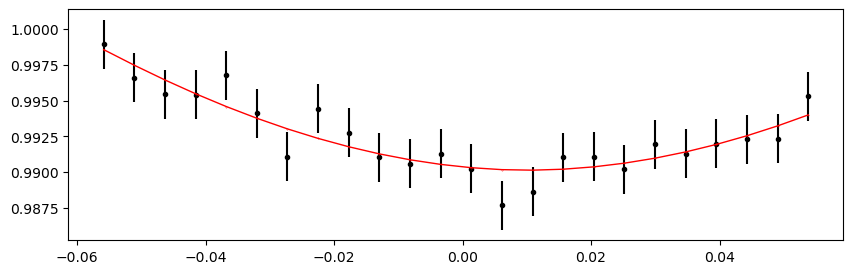

2647.0453939999998 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.00it/s]


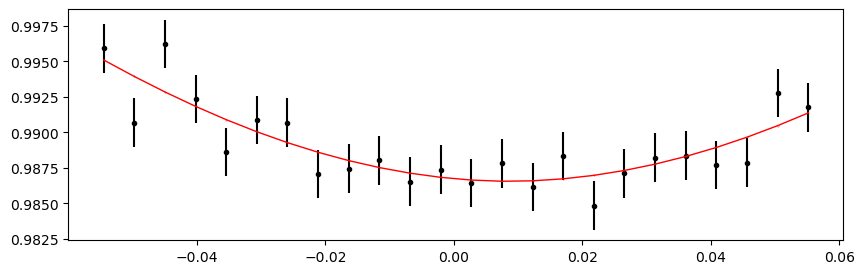

2647.336672 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.34it/s]


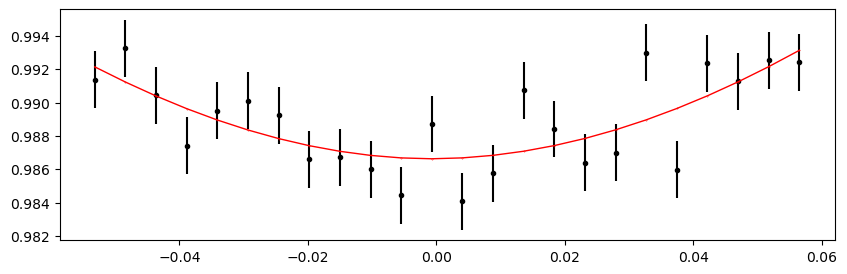

2647.62795 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 422.84it/s]


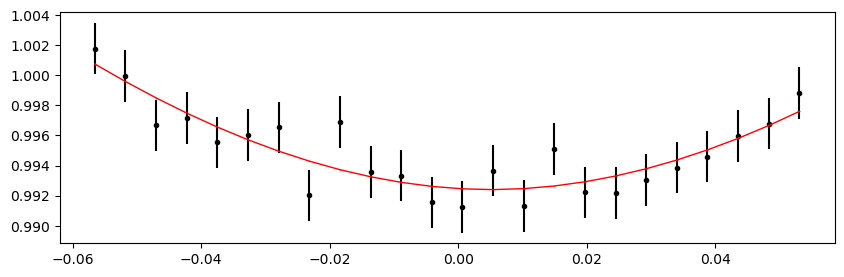

2647.9192279999997 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.16it/s]


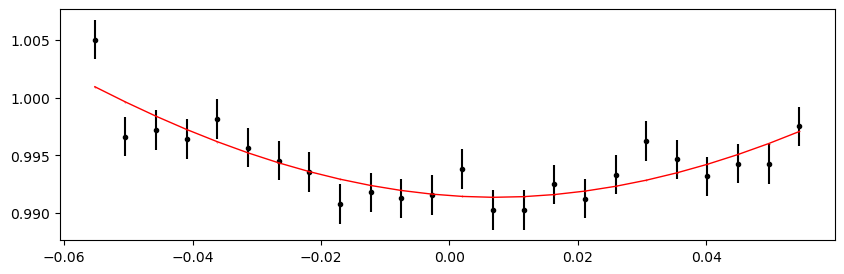

2648.210506 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.11it/s]


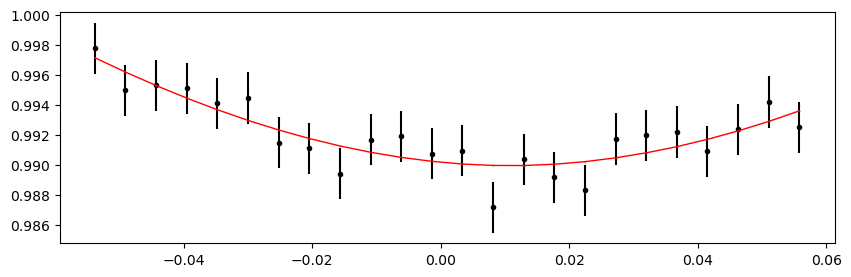

2648.501784 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 421.02it/s]


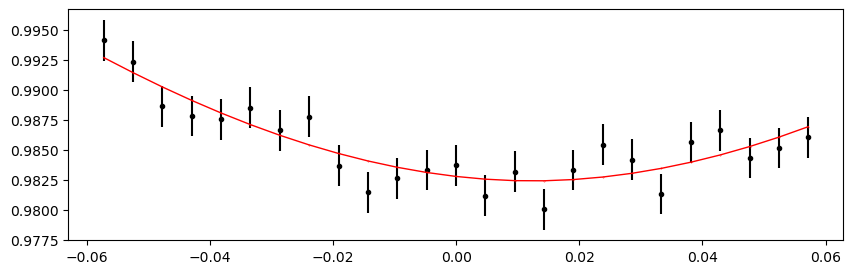

2649.08434 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 420.87it/s]


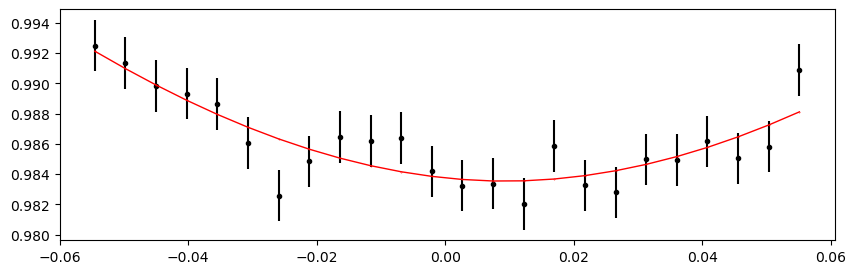

2649.375618 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.65it/s]


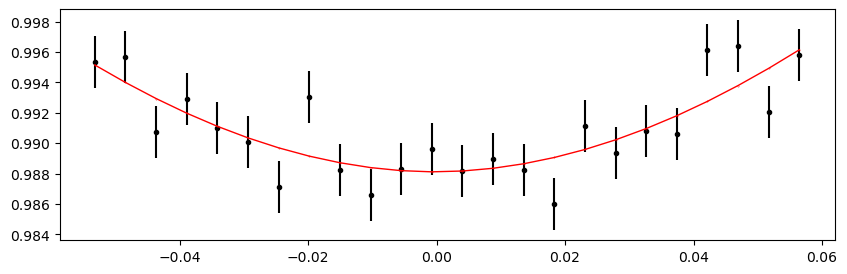

2649.6668959999997 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 422.47it/s]


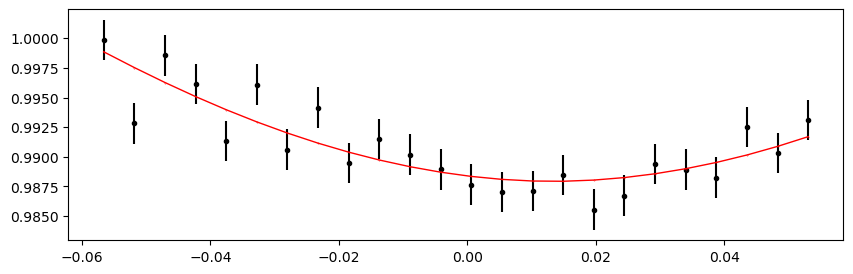

2649.958174 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.46it/s]


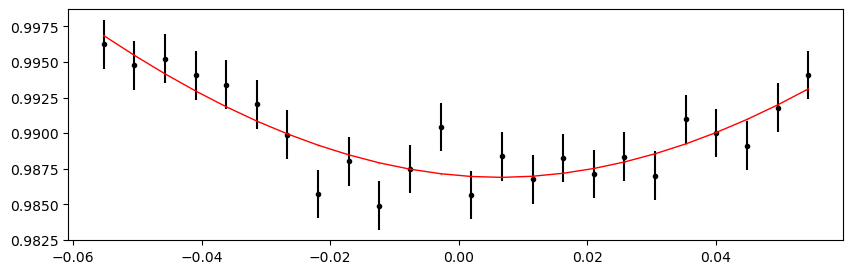

2650.249452 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.92it/s]


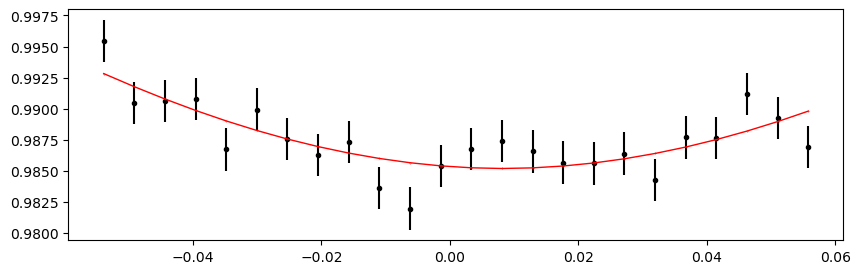

2655.492456 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.68it/s]


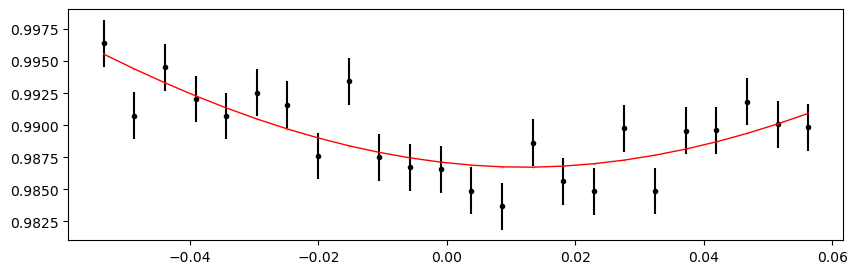

2655.7837339999996 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 432.34it/s]


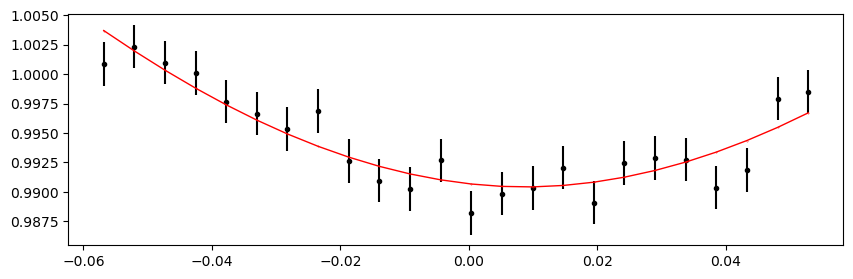

2656.075012 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 422.48it/s]


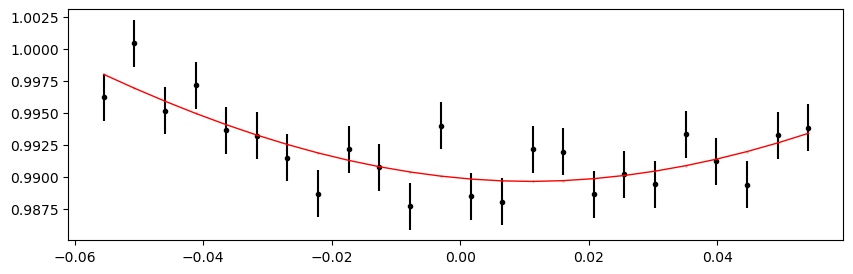

2656.36629 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.35it/s]


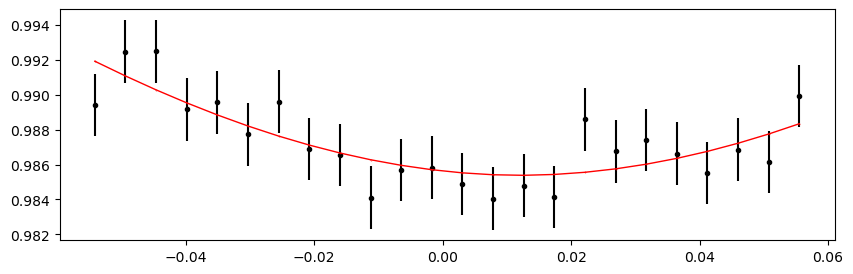

2656.6575679999996 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.17it/s]


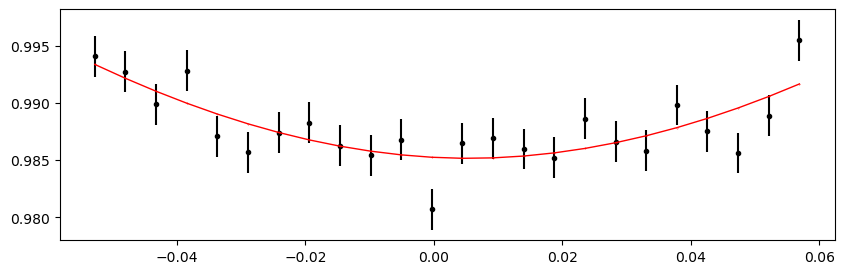

2656.948846 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.45it/s]


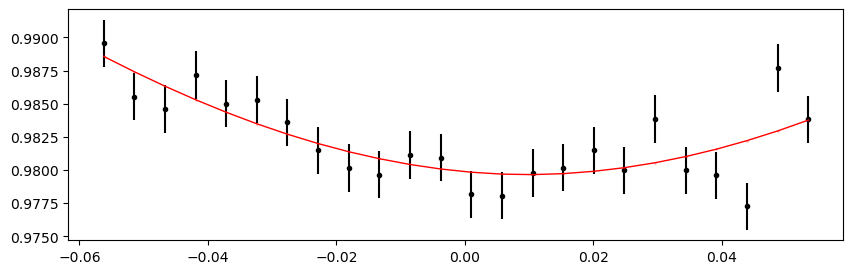

2657.240124 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.35it/s]


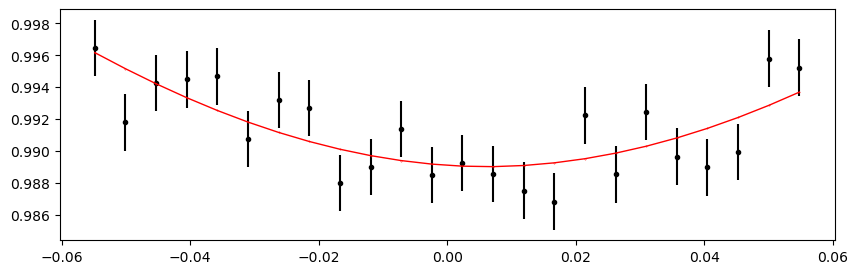

2657.5314019999996 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 420.79it/s]


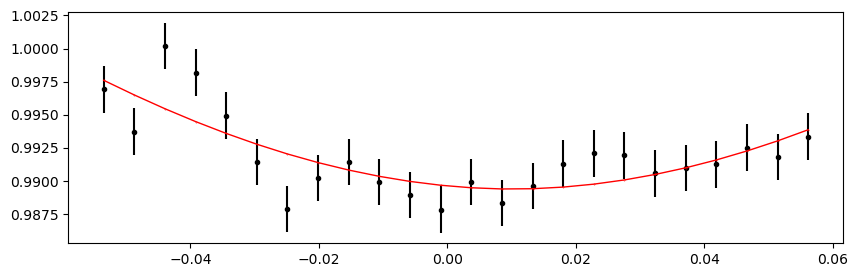

2657.8226799999998 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 352.91it/s]


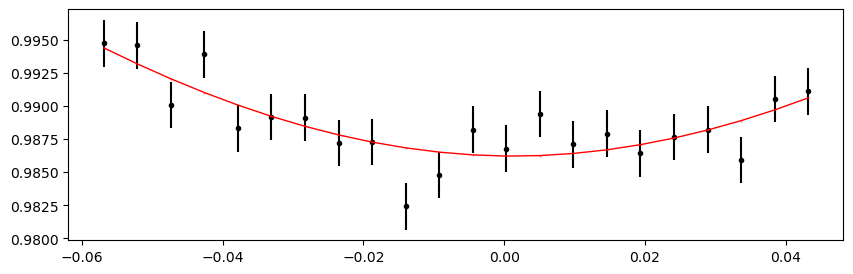

2658.113958 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 414.85it/s]


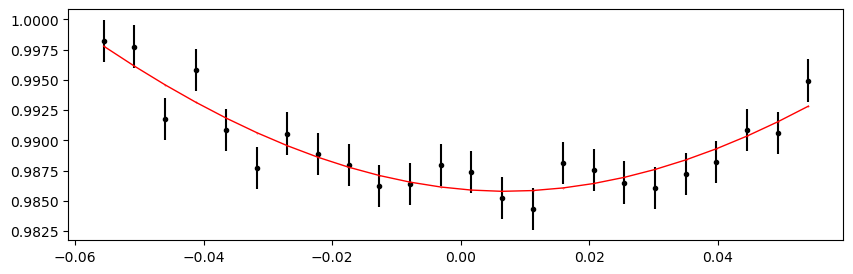

Time 2658.4052359999996 does not have enough data points: 6
Time 2658.6965139999998 does not have enough data points: 16
2658.987792 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 398.92it/s]


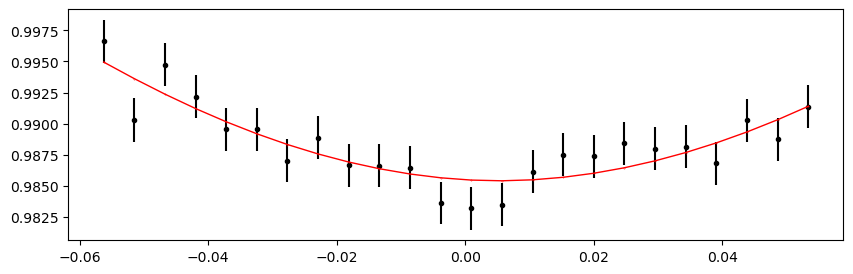

2659.27907 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.76it/s]


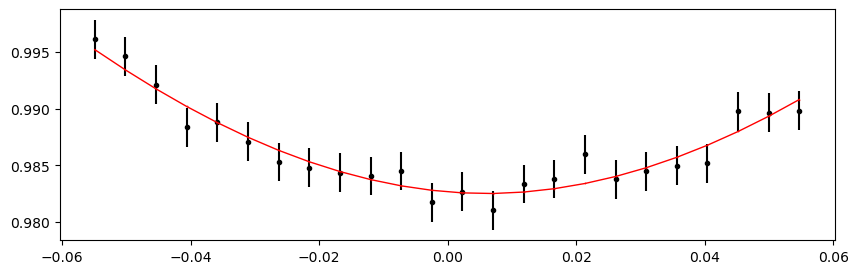

2659.5703479999997 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 406.76it/s]


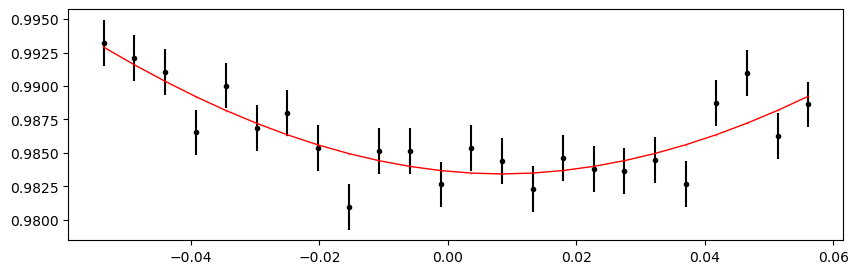

2659.861626 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.59it/s]


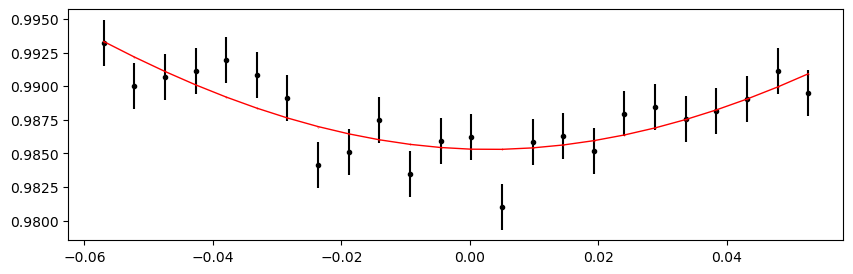

2660.152904 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.88it/s]


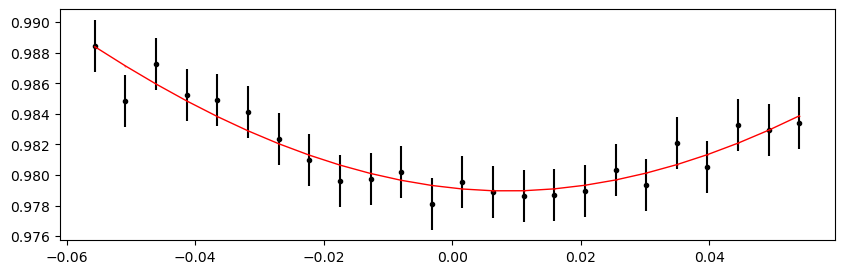

2660.4441819999997 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 401.76it/s]


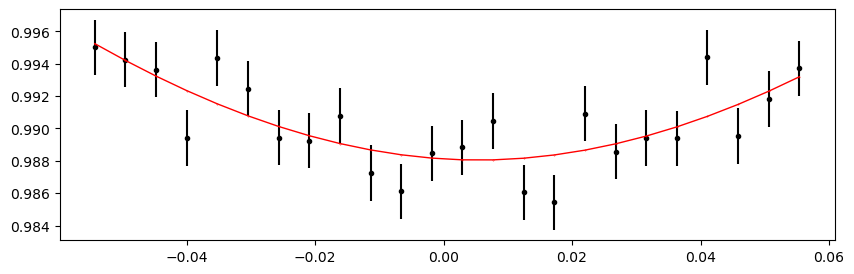

2660.73546 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.47it/s]


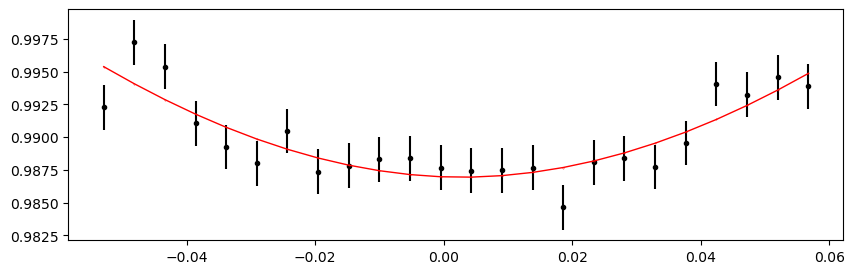

2661.026738 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.94it/s]


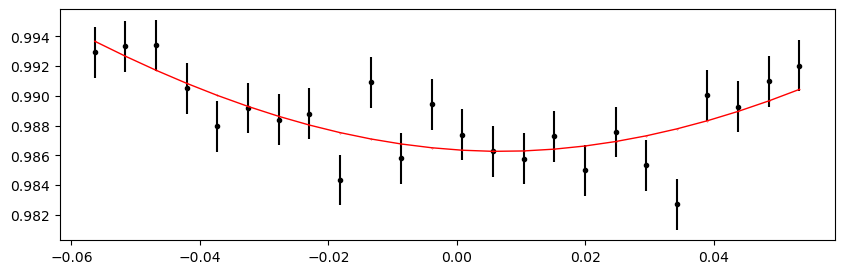

2661.3180159999997 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 402.09it/s]


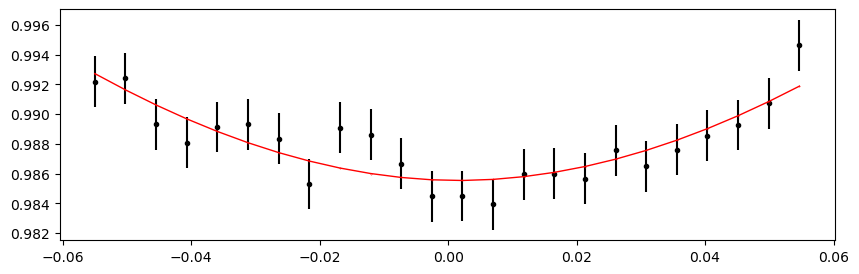

2661.609294 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 396.51it/s]


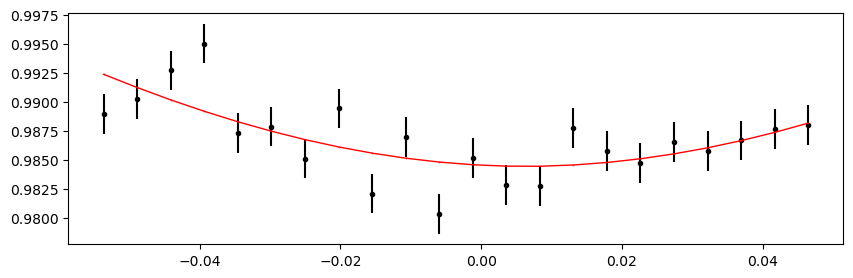

2662.19185 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.78it/s]


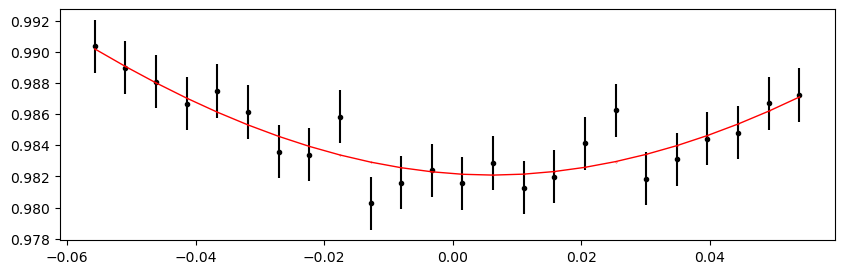

2662.483128 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.41it/s]


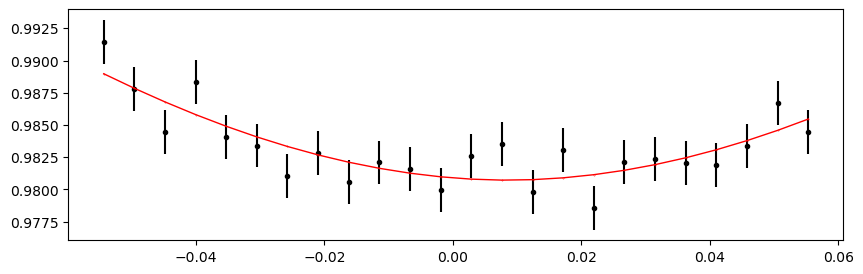

2662.774406 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 398.74it/s]


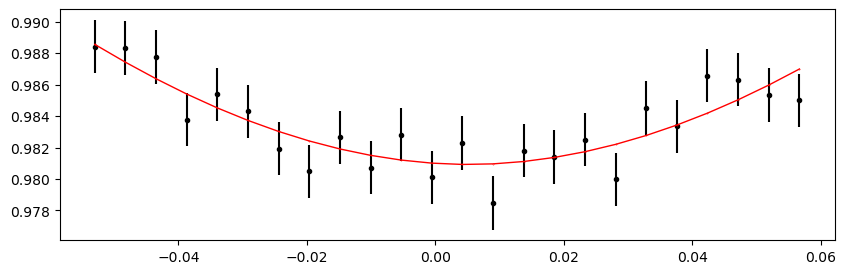

2663.065684 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 403.23it/s]


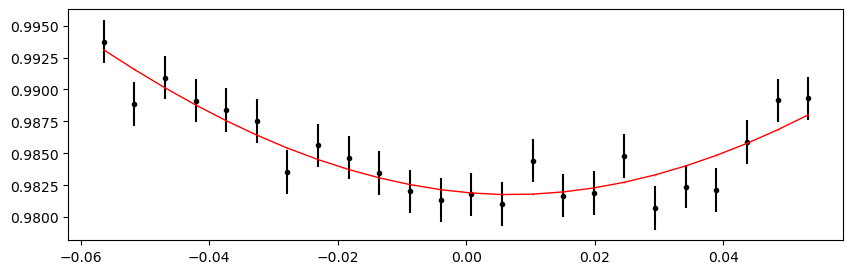

2663.356962 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 411.61it/s]


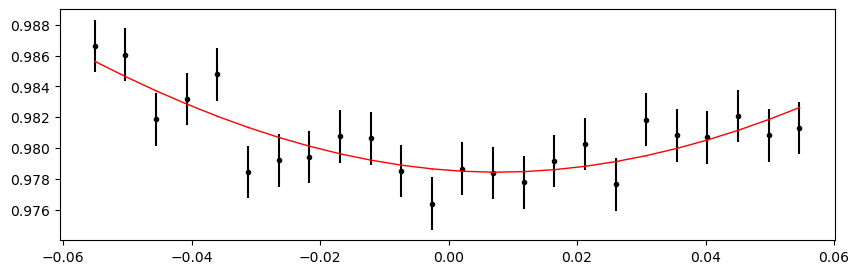

2663.64824 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 410.94it/s]


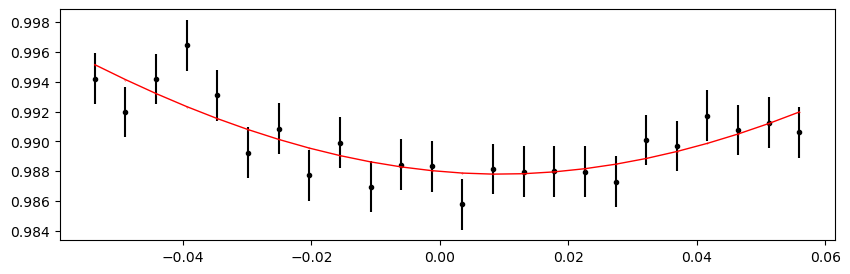

2663.939518 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 422.56it/s]


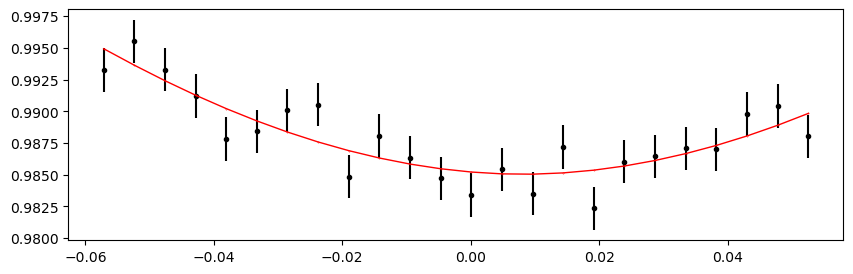

2664.230796 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 419.98it/s]


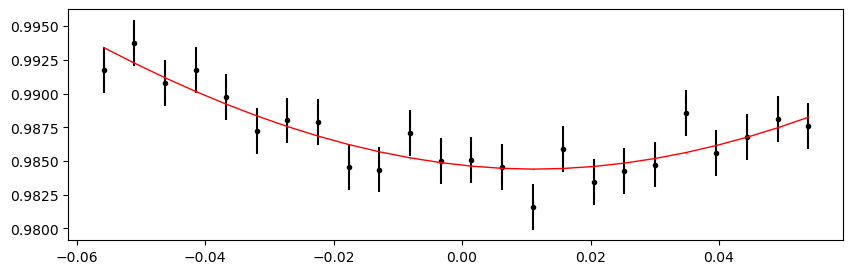

2665.395908 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 405.11it/s]


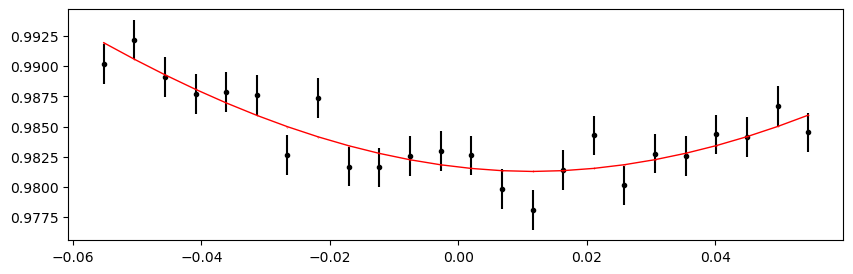

2670.056356 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 404.77it/s]


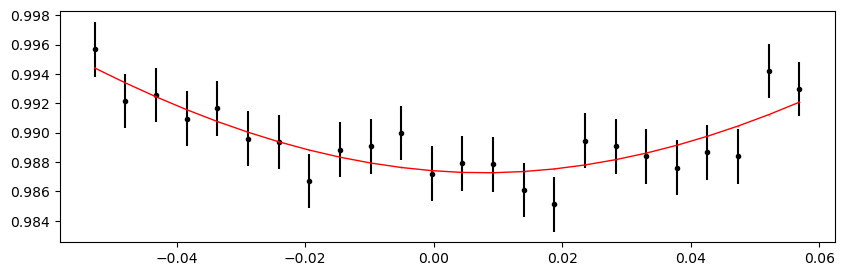

2670.3476339999997 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.20it/s]


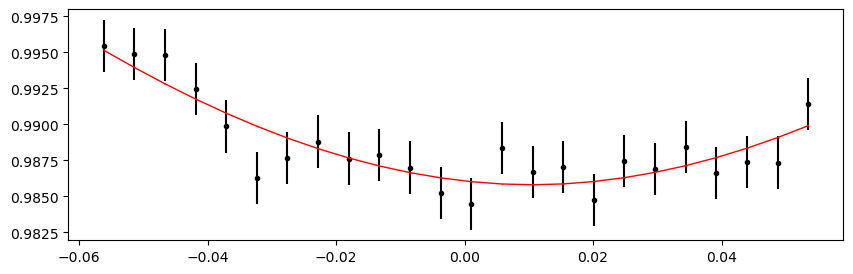

2670.638912 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.00it/s]


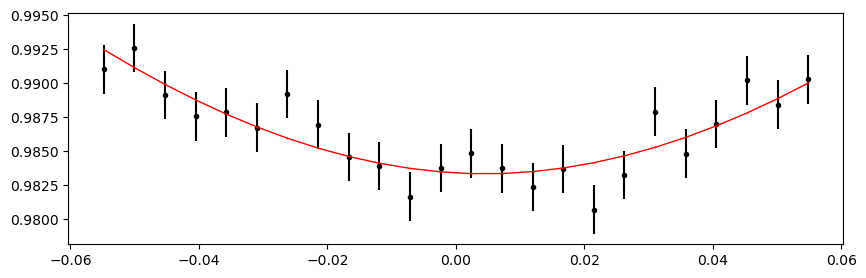

2670.93019 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 398.62it/s]


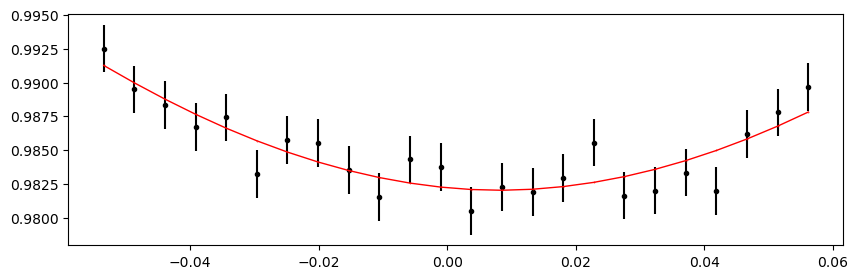

2671.2214679999997 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.29it/s]


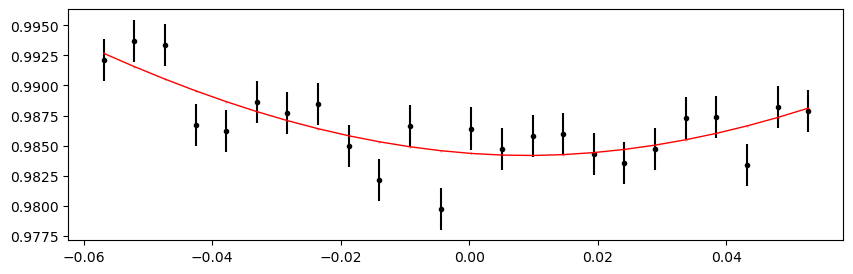

2671.804024 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.52it/s]


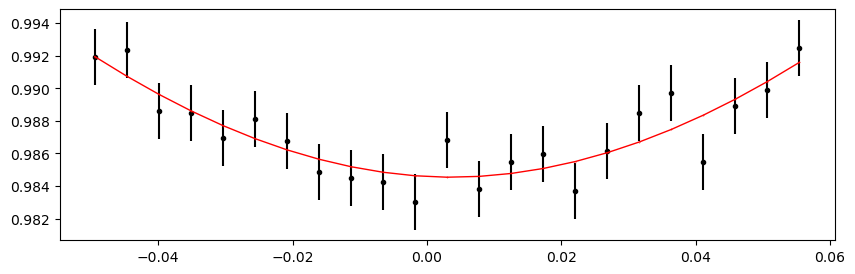

2672.0953019999997 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.29it/s]


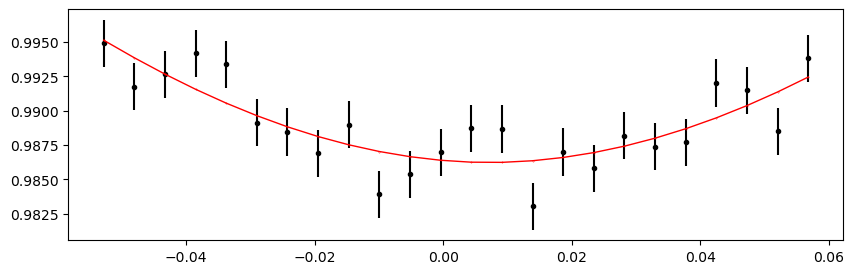

2672.677858 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.73it/s]


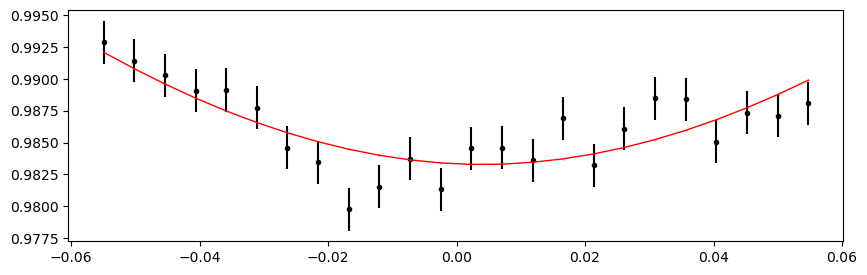

2672.9691359999997 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.75it/s]


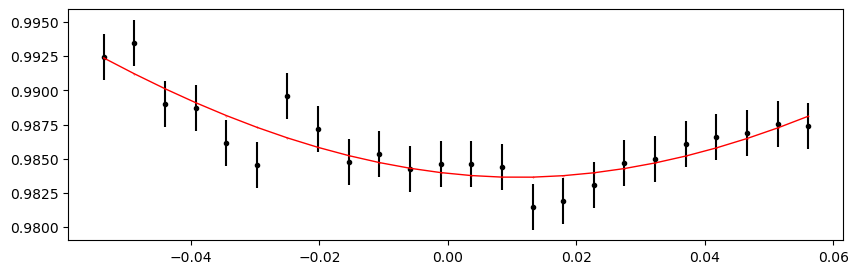

2673.260414 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.28it/s]


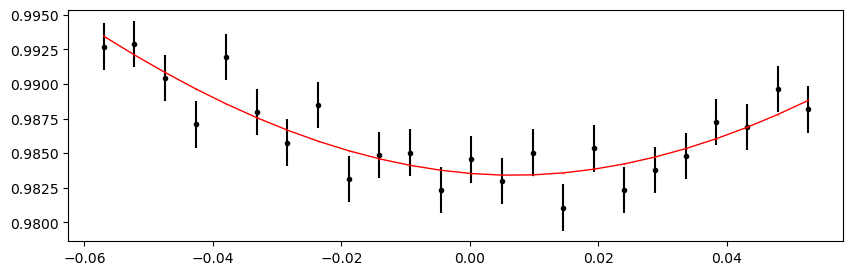

2673.551692 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 421.67it/s]


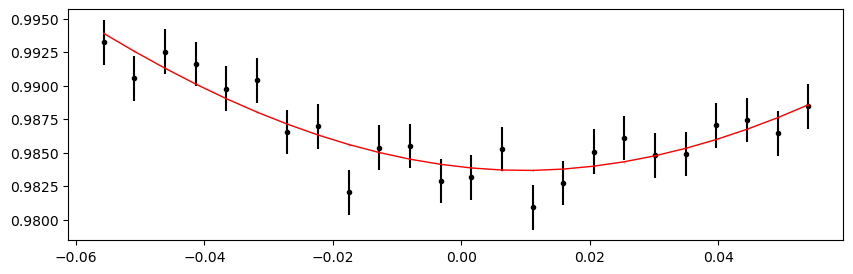

2673.8429699999997 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.79it/s]


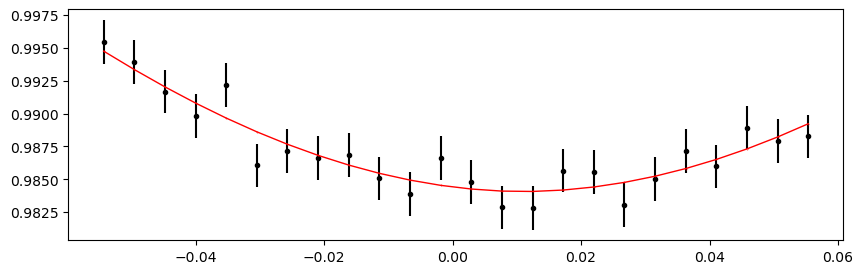

2674.134248 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 415.71it/s]


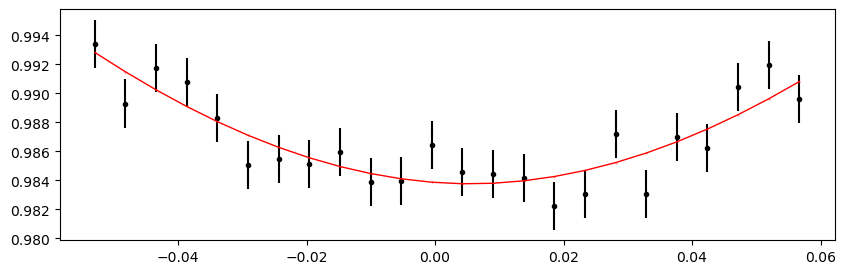

2674.425526 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 422.12it/s]


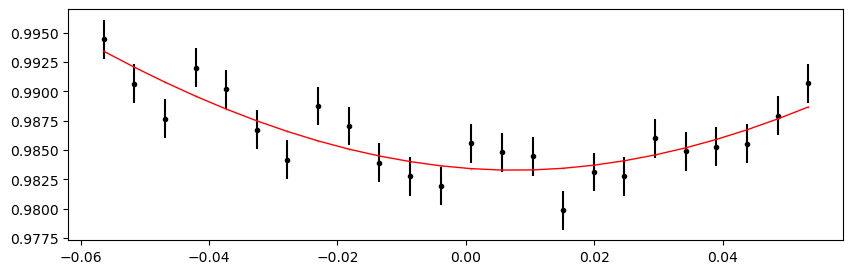

2675.008082 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 420.70it/s]


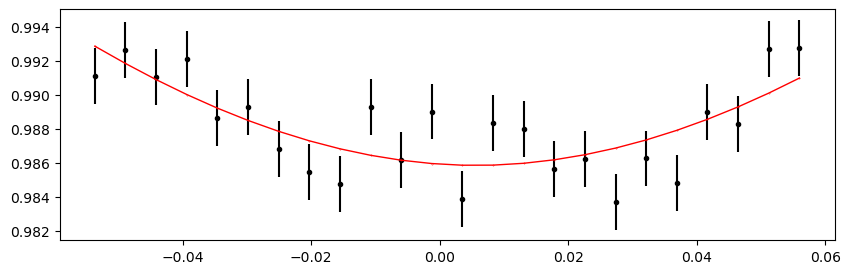

2675.29936 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 405.85it/s]


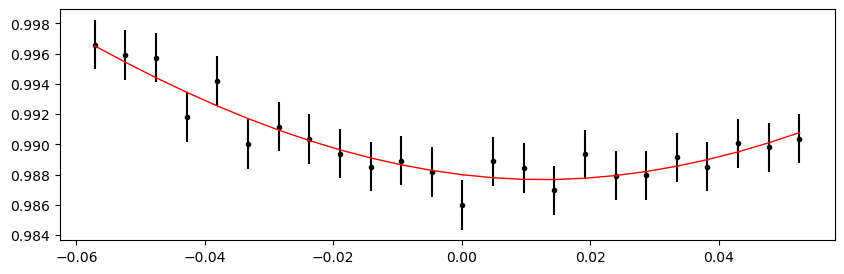

2675.5906379999997 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.50it/s]


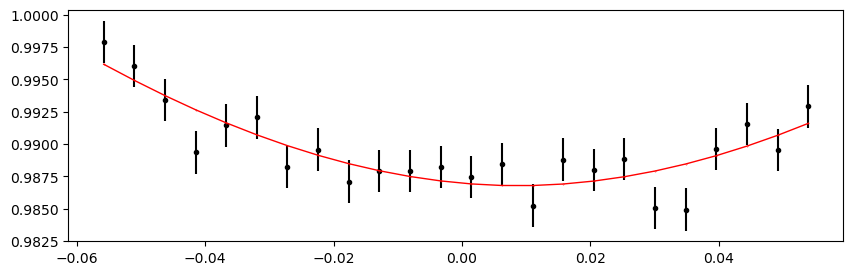

2675.881916 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 421.23it/s]


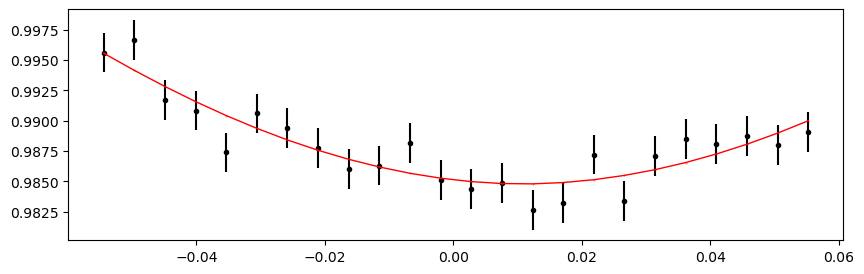

2676.173194 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.85it/s]


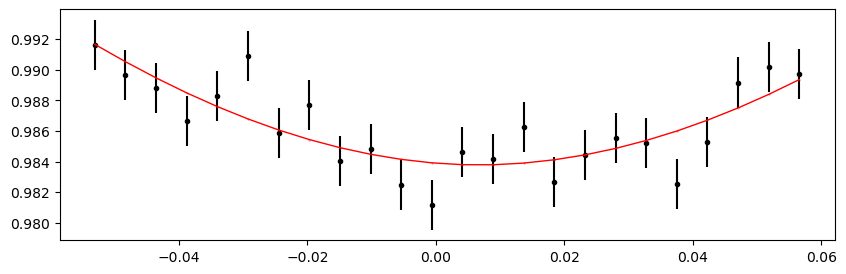

2676.4644719999997 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 405.68it/s]


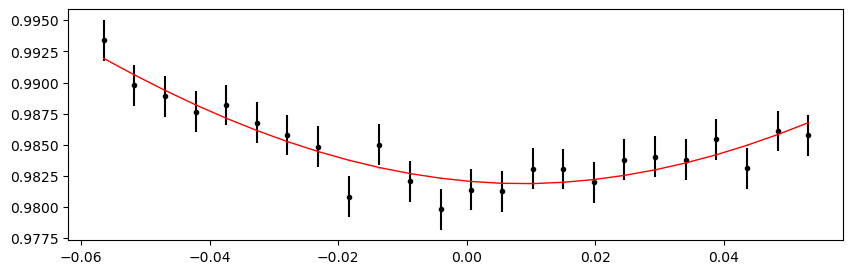

2676.75575 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.25it/s]


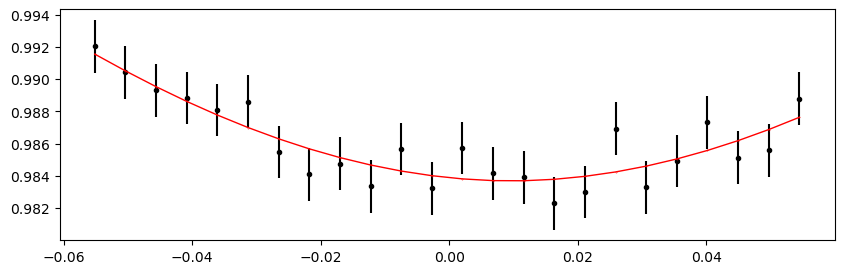

2677.047028 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 401.48it/s]


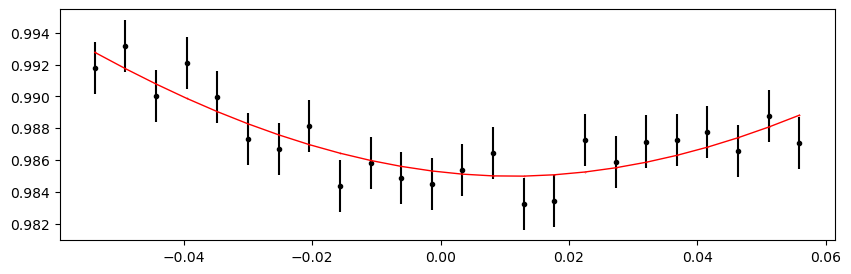

2677.3383059999996 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.60it/s]


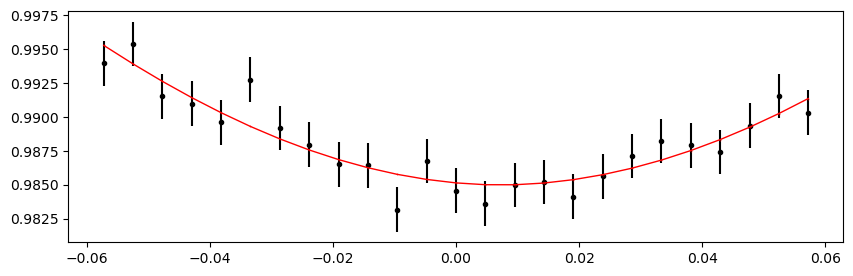

2677.629584 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.59it/s]


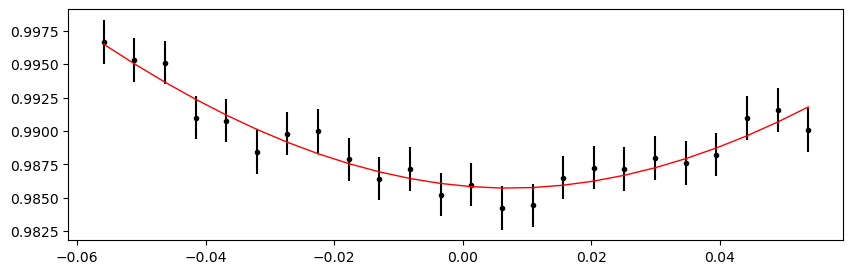

2678.2121399999996 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.43it/s]


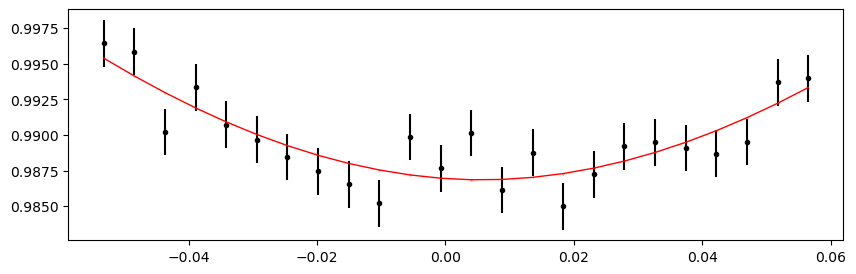

2684.620256 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.46it/s]


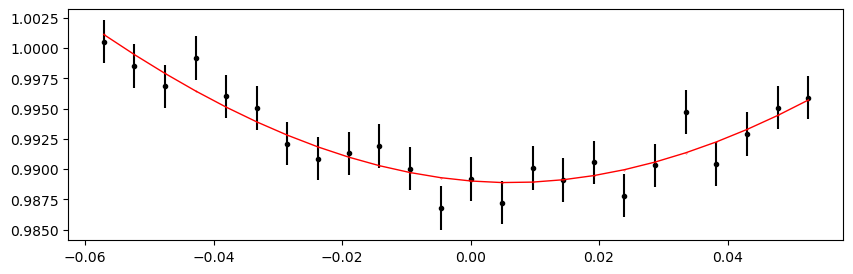

2684.911534 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.73it/s]


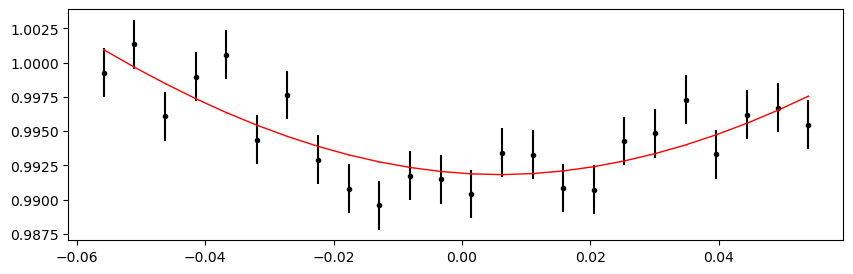

2685.202812 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.70it/s]


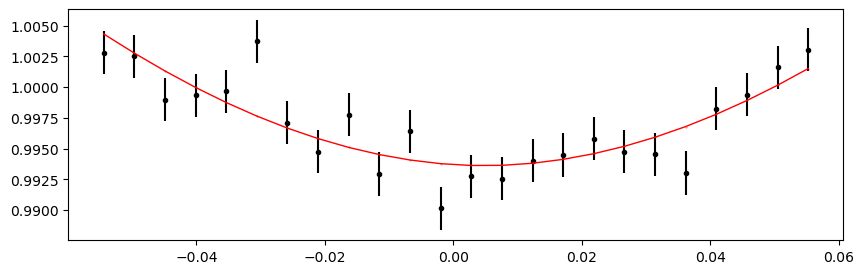

2685.49409 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.02it/s]


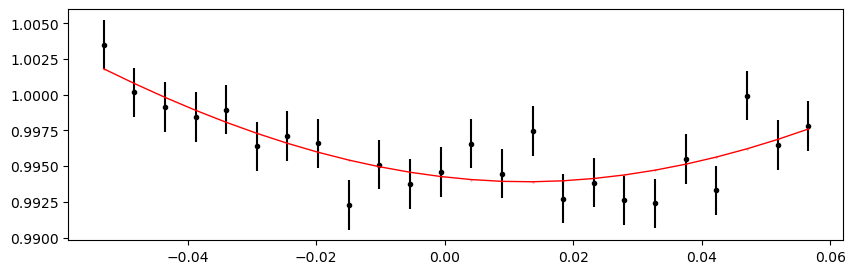

2685.785368 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.95it/s]


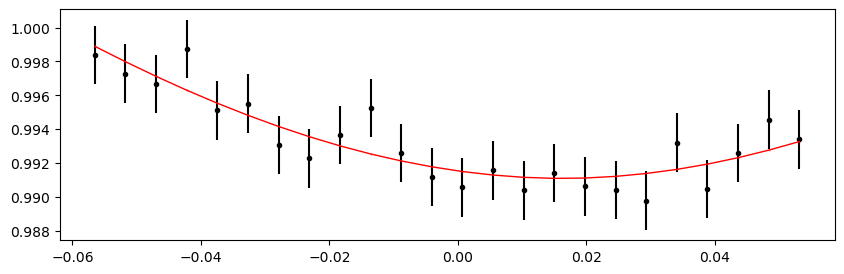

2686.076646 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.80it/s]


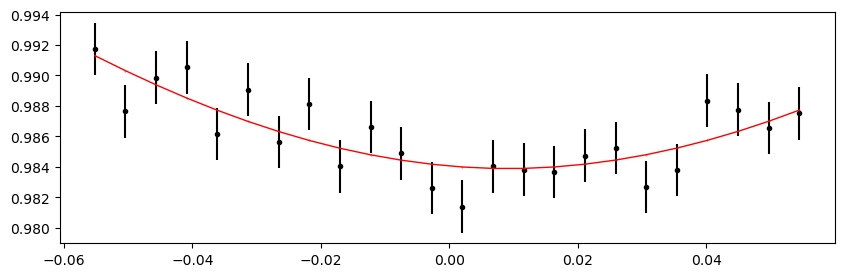

2686.367924 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.54it/s]


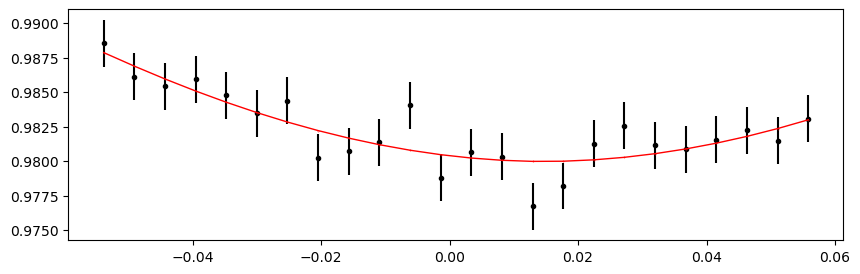

2686.659202 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.42it/s]


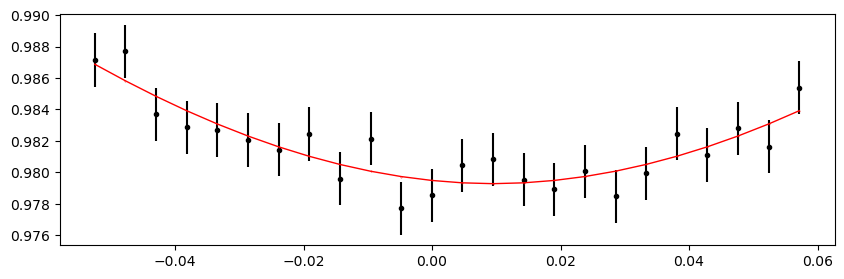

2686.95048 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.06it/s]


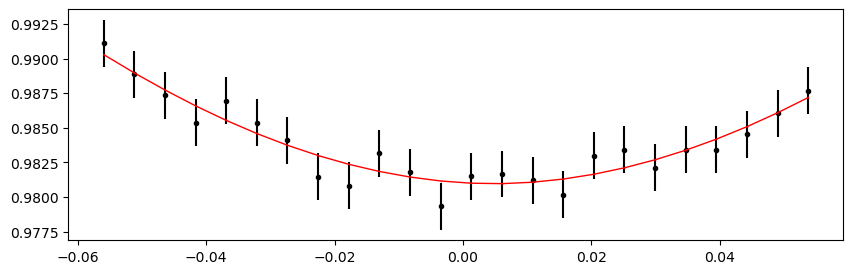

2687.241758 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.90it/s]


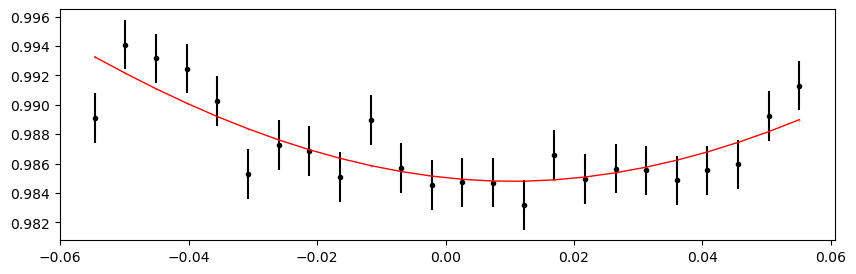

2687.824314 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.29it/s]


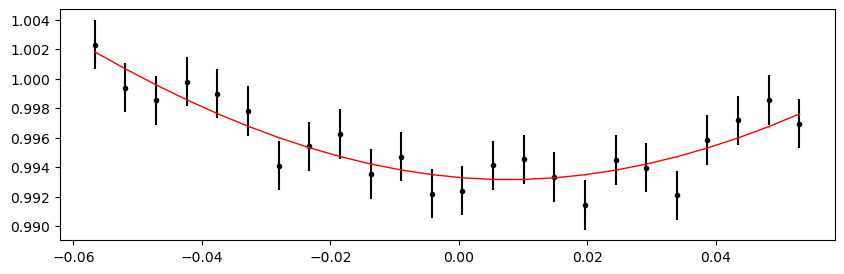

2688.115592 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.42it/s]


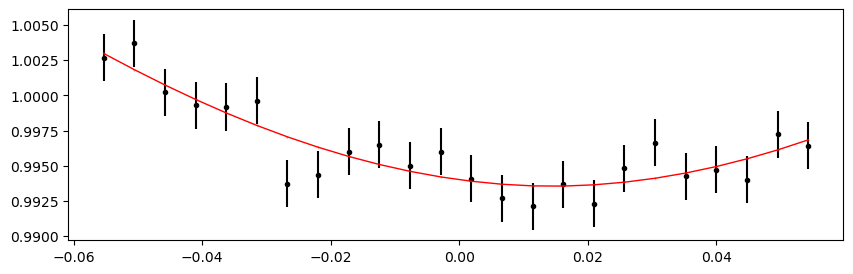

2688.40687 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.62it/s]


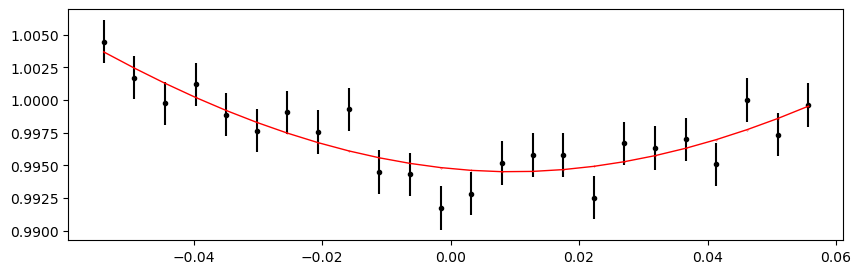

2688.698148 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.62it/s]


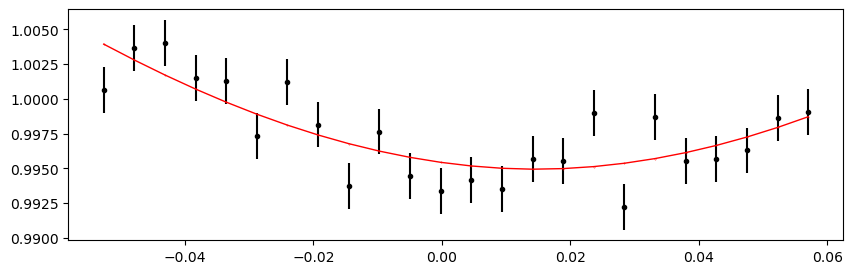

2688.989426 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.08it/s]


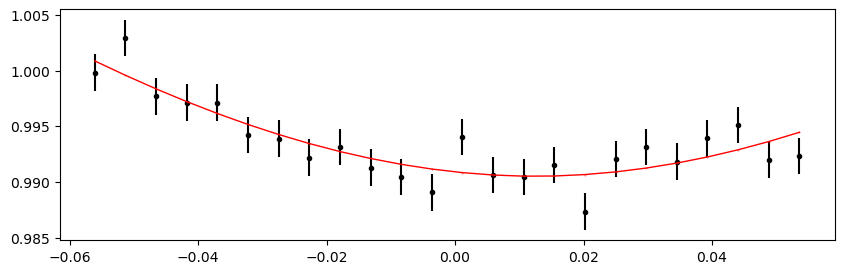

2689.280704 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.30it/s]


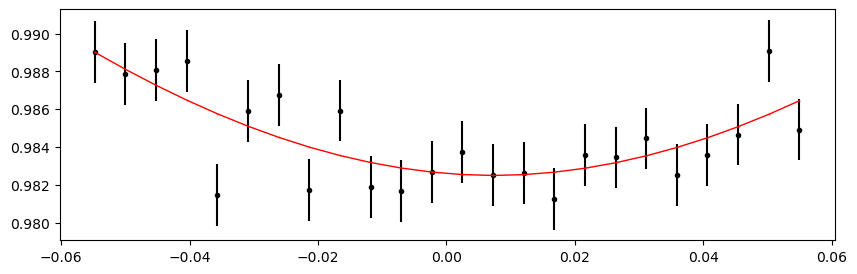

2689.571982 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 397.77it/s]


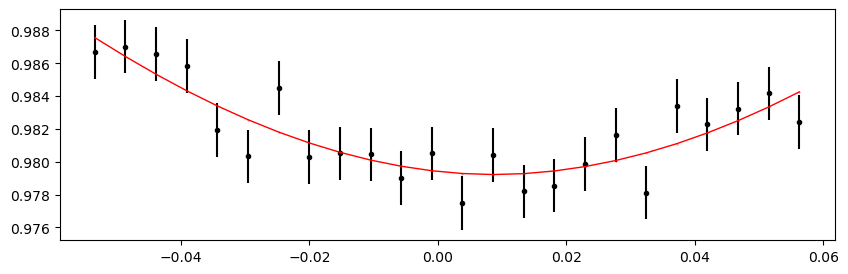

2689.86326 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.35it/s]


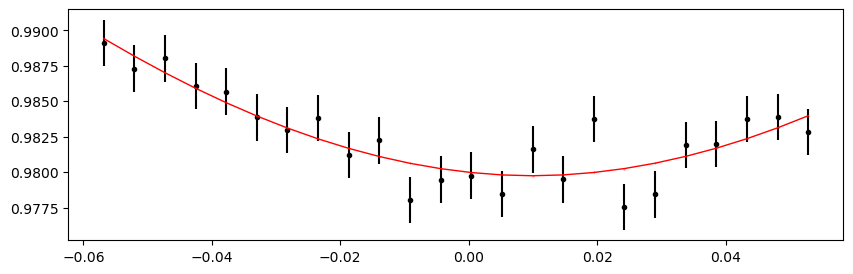

2690.154538 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.78it/s]


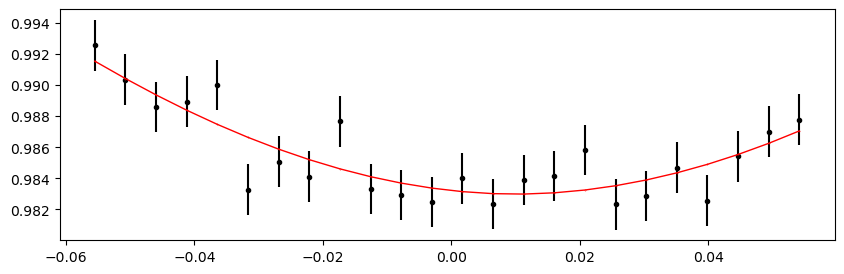

2690.445816 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.40it/s]


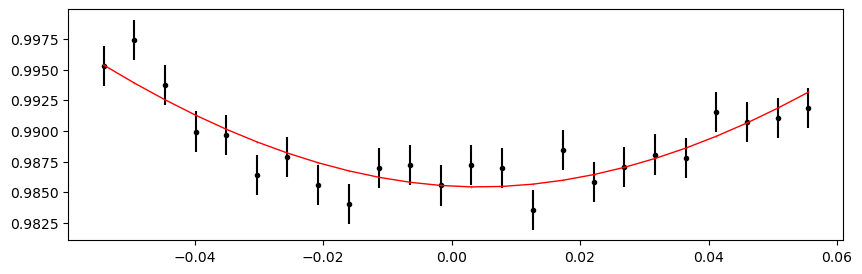

2691.0283719999998 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.93it/s]


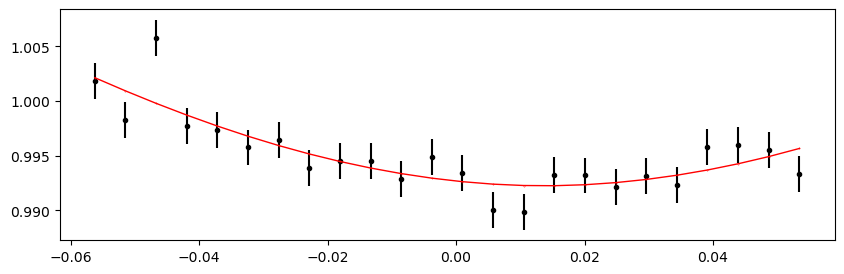

2691.31965 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.37it/s]


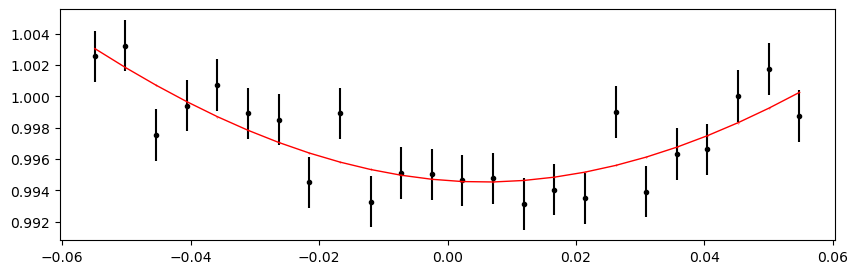

2693.067318 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.33it/s]


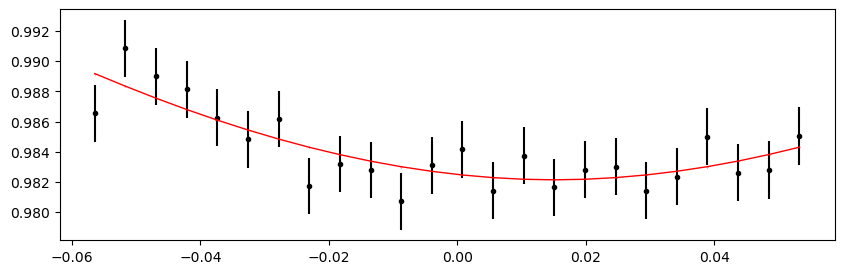

2693.358596 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.93it/s]


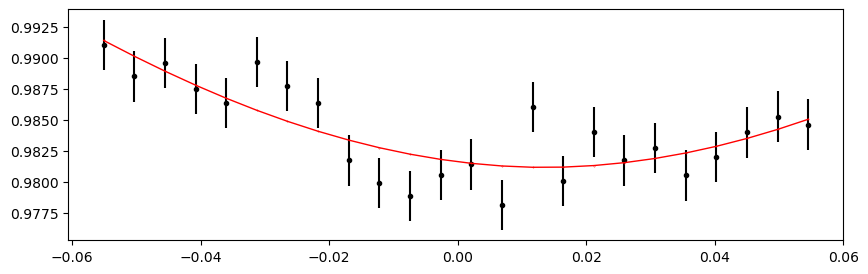

2693.6498739999997 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.94it/s]


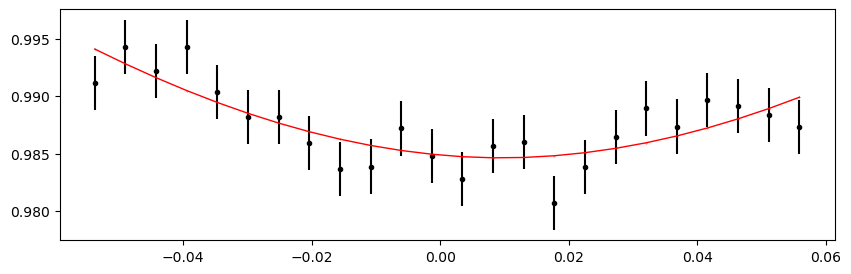

2698.310322 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 407.54it/s]


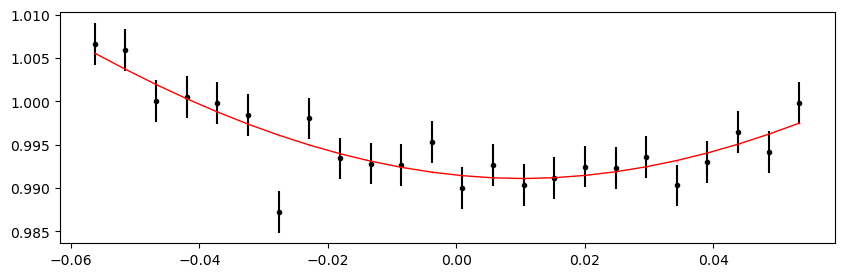

2698.6016 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.56it/s]


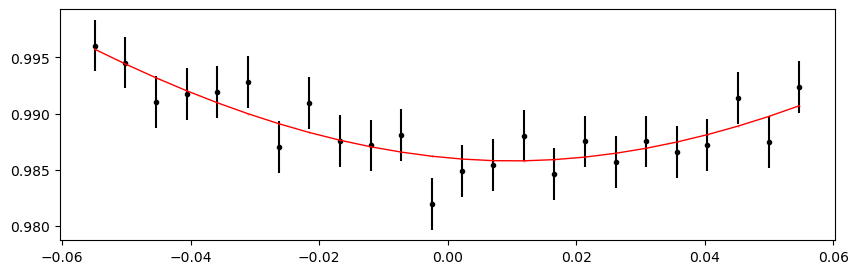

2698.8928779999997 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.47it/s]


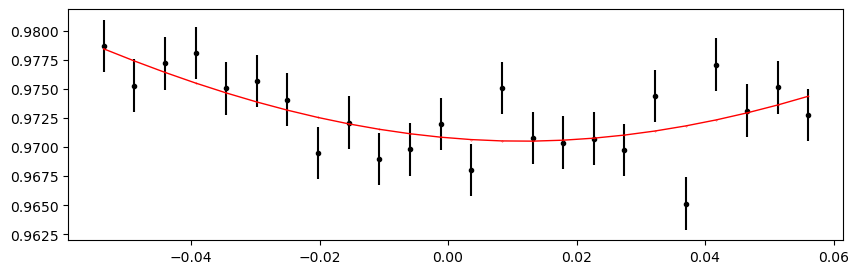

2699.184156 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.14it/s]


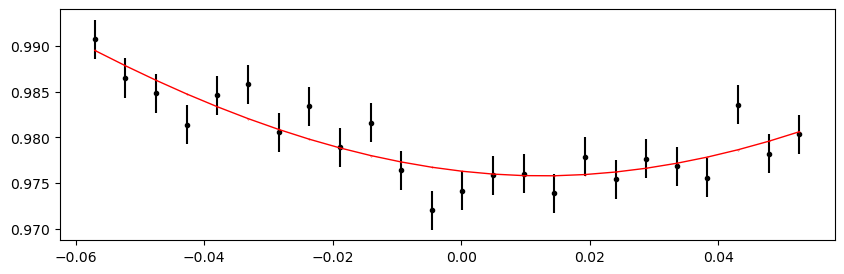

2699.475434 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.71it/s]


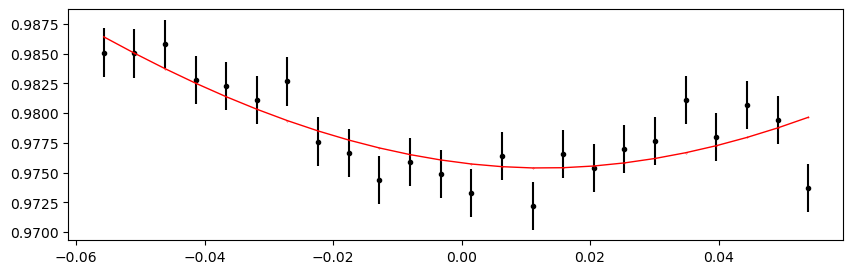

2699.7667119999996 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.50it/s]


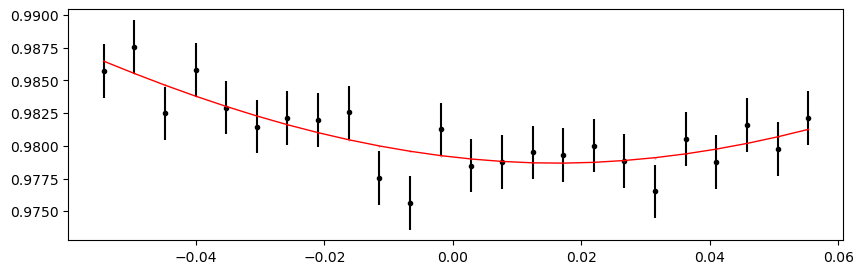

2700.05799 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.92it/s]


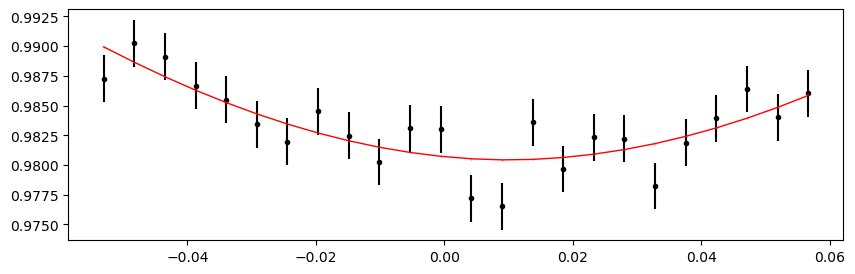

Time 2700.349268 does not have enough data points: 4
Time 2700.6405459999996 does not have enough data points: 18
2700.931824 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.38it/s]


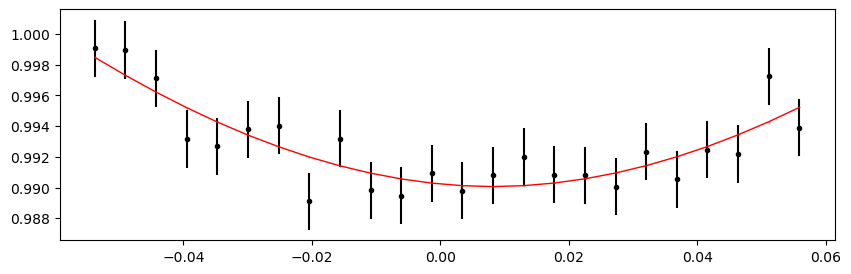

2701.223102 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.83it/s]


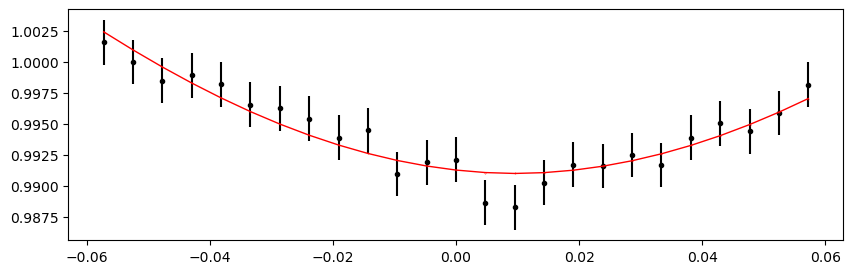

2701.5143799999996 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 410.57it/s]


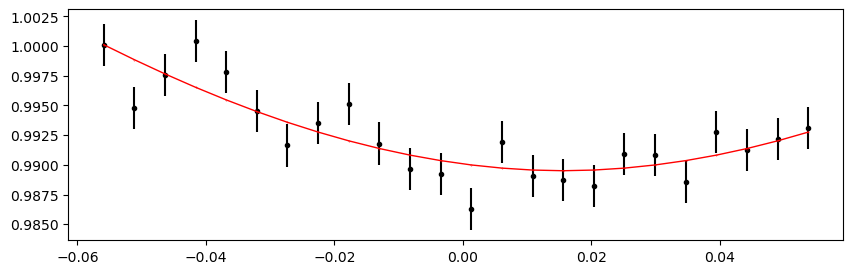

2701.8056579999998 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.91it/s]


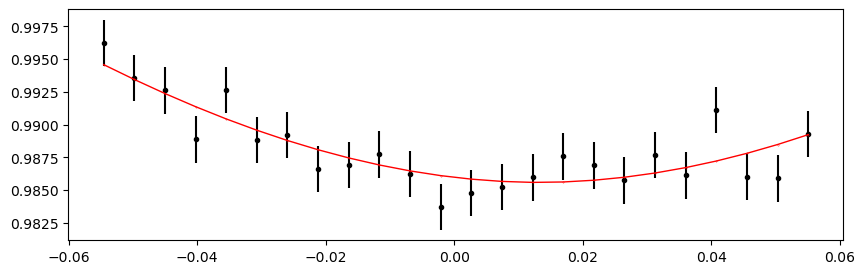

2702.096936 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 416.63it/s]


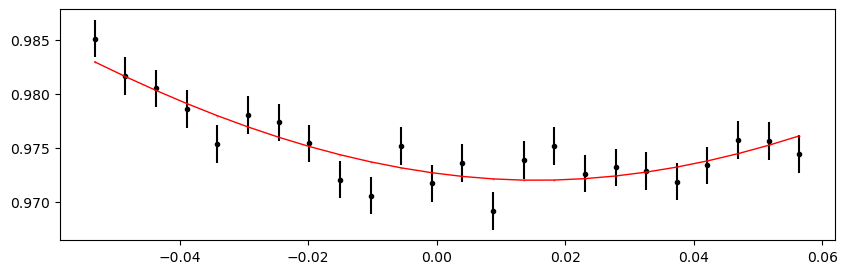

2702.3882139999996 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 416.41it/s]


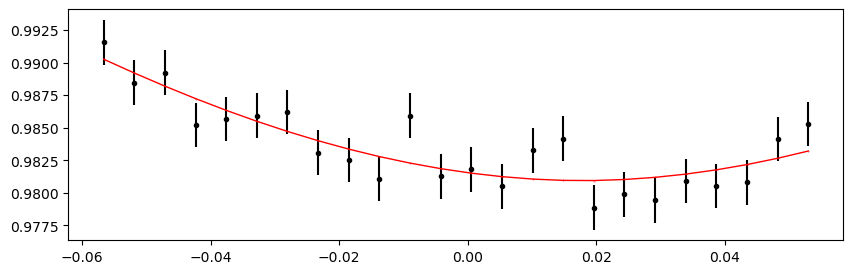

2702.6794919999998 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 411.18it/s]


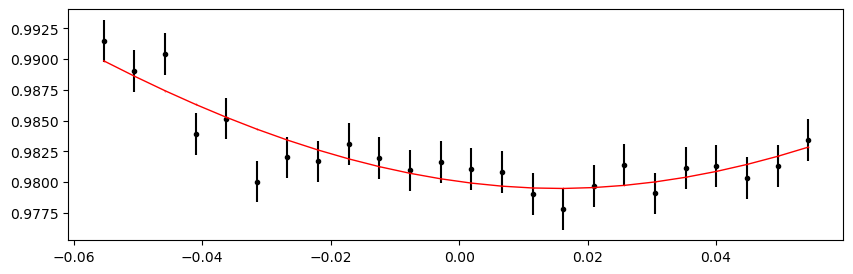

2702.97077 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 413.74it/s]


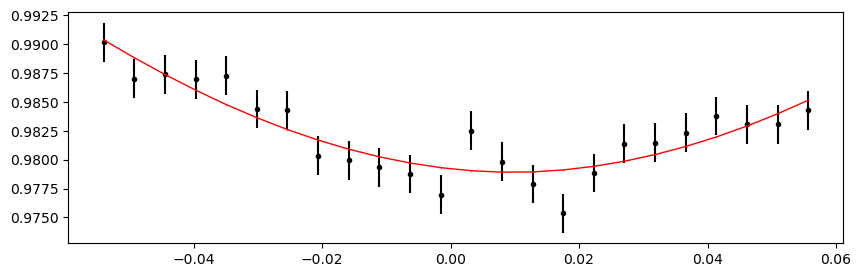

2703.2620479999996 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 410.68it/s]


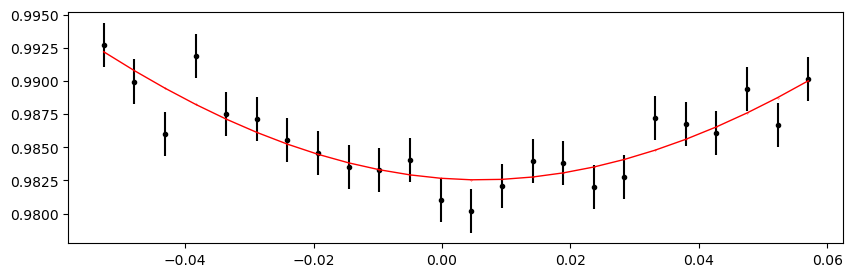

Time 2703.5533259999997 does not have enough data points: 20
Time 2703.844604 does not have enough data points: 2
2704.135882 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.10it/s]


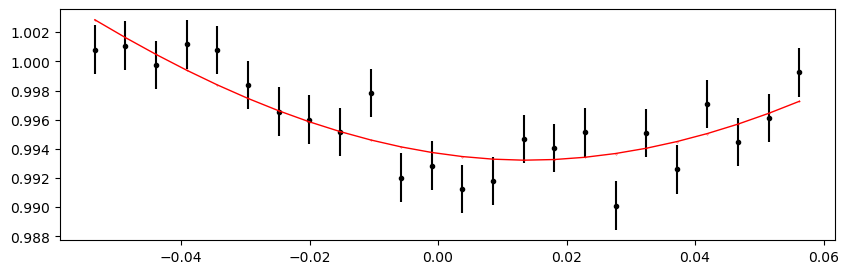

2704.4271599999997 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 433.74it/s]


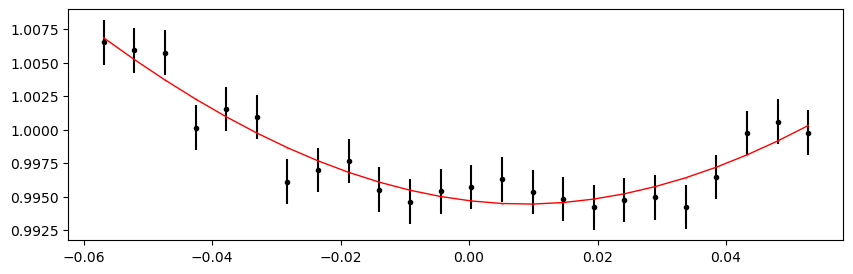

2705.88355 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.46it/s]


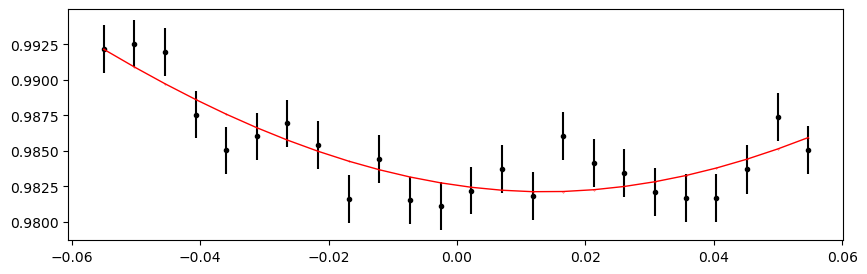

2706.1748279999997 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 419.64it/s]


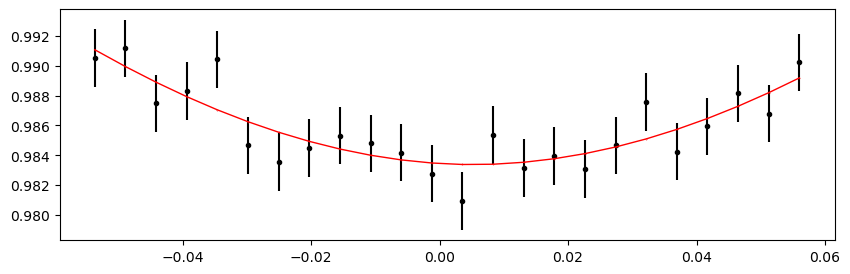

2706.466106 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 421.76it/s]


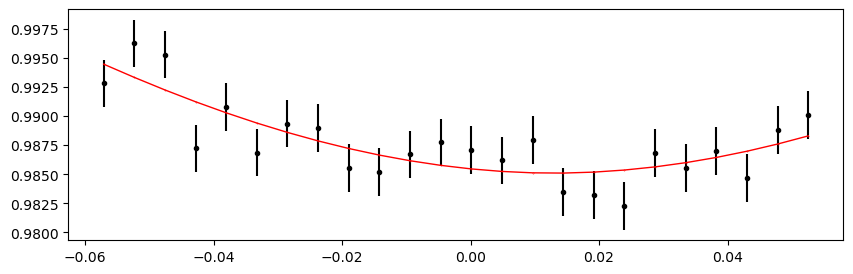

2712.000388 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.72it/s]


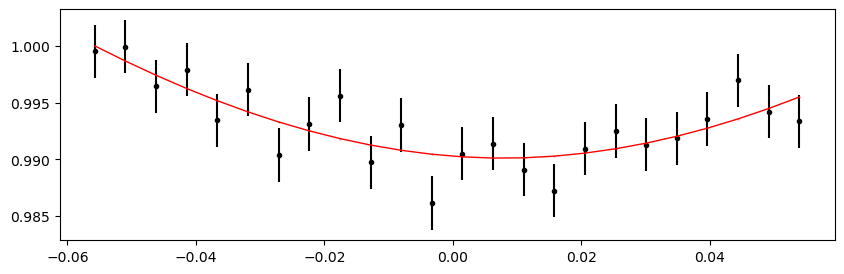

2712.291666 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 419.07it/s]


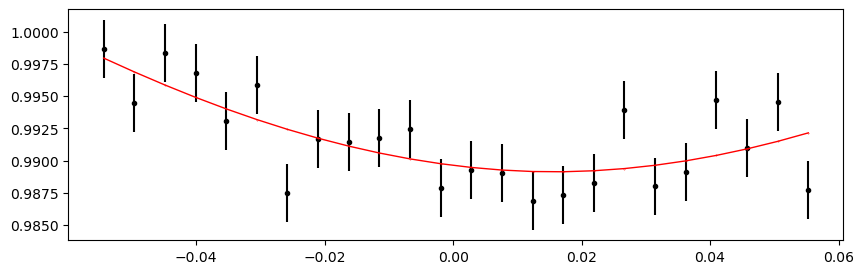

2712.5829439999998 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 415.99it/s]


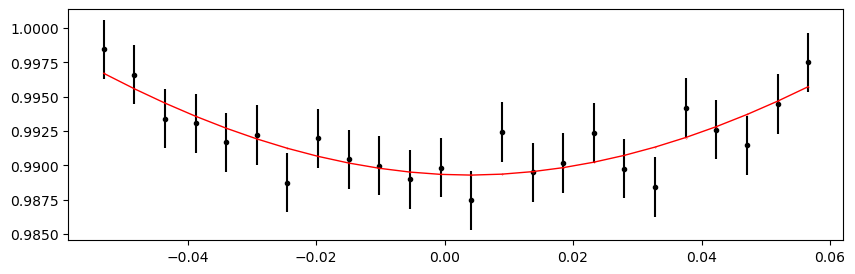

2712.874222 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 413.65it/s]


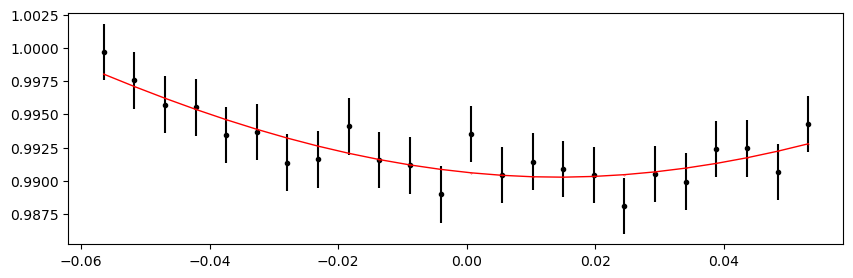

2713.1655 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.27it/s]


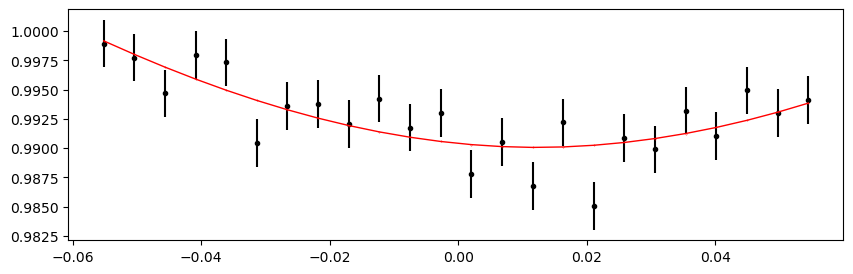

2713.748056 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.71it/s]


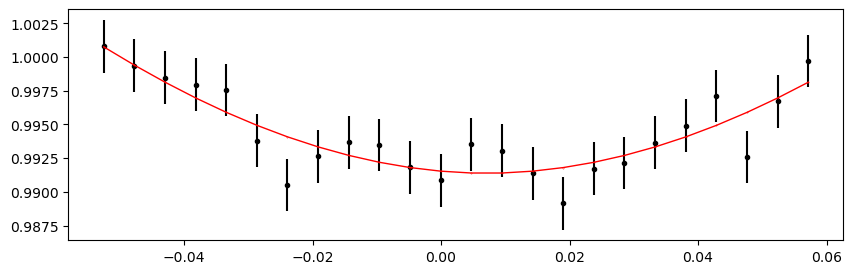

2714.039334 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.68it/s]


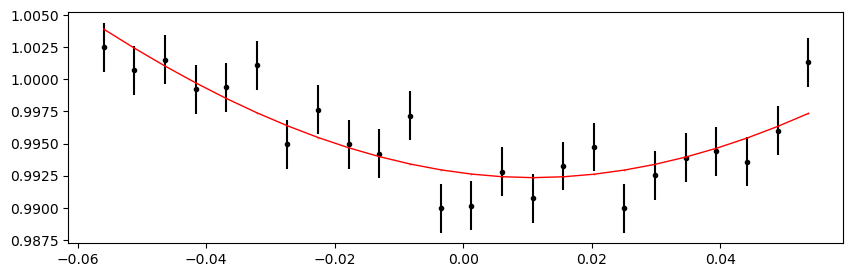

2714.3306119999997 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.48it/s]


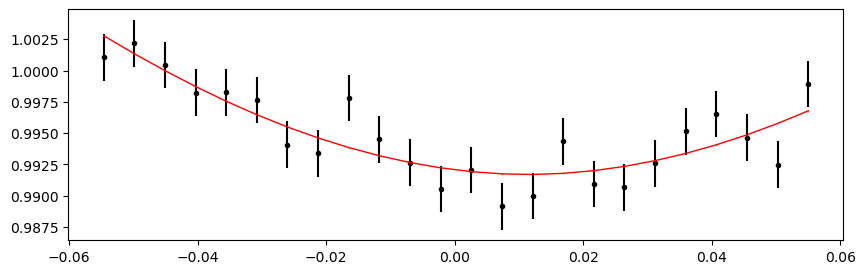

2714.62189 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.42it/s]


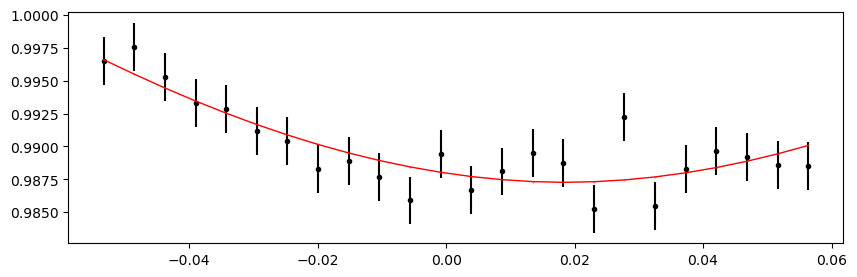

2714.913168 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.81it/s]


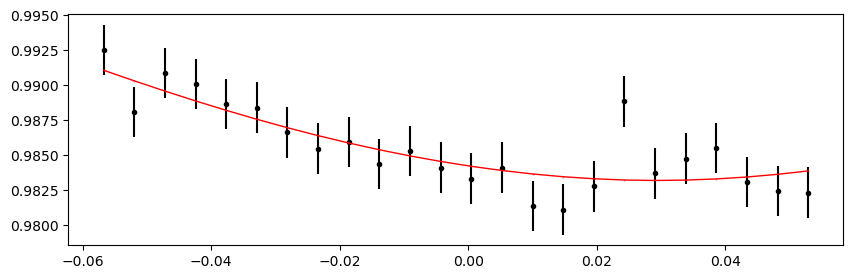

2715.2044459999997 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.73it/s]


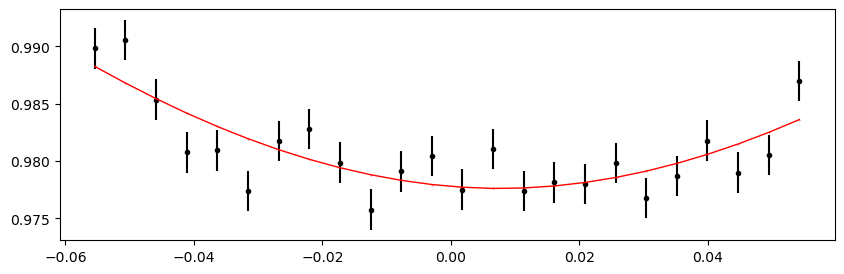

2715.495724 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.17it/s]


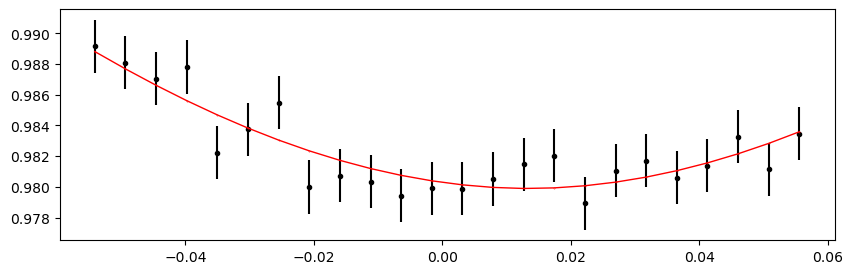

2715.787002 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 420.66it/s]


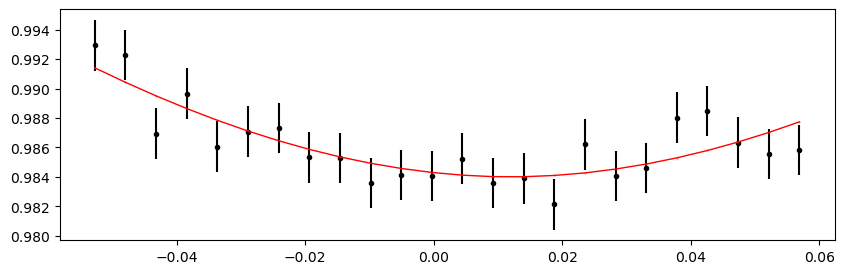

2716.0782799999997 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 413.29it/s]


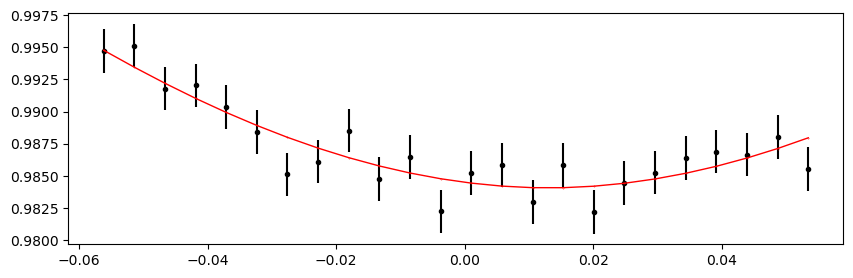

2716.369558 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.06it/s]


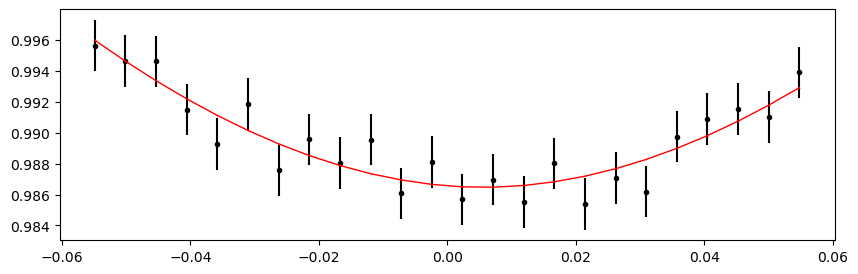

2716.9521139999997 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.22it/s]


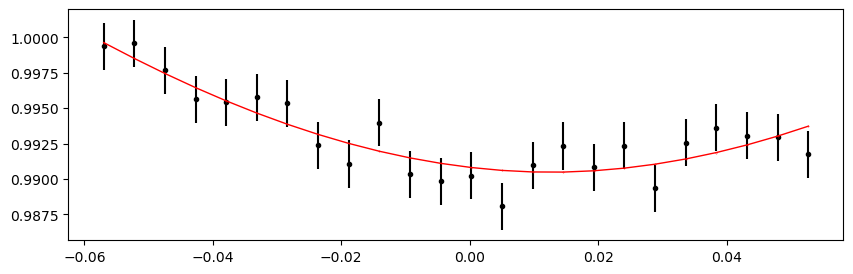

2717.243392 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 403.94it/s]


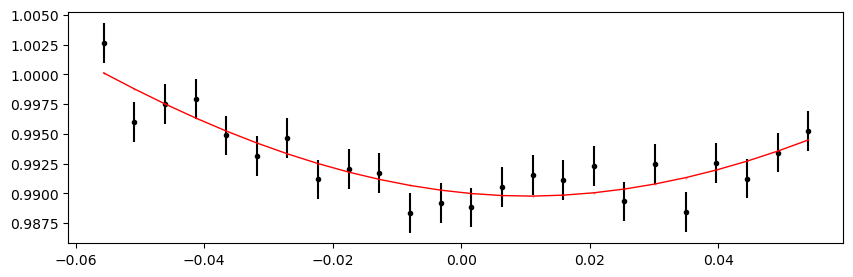

Time 2717.53467 does not have enough data points: 13
2718.6997819999997 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.76it/s]


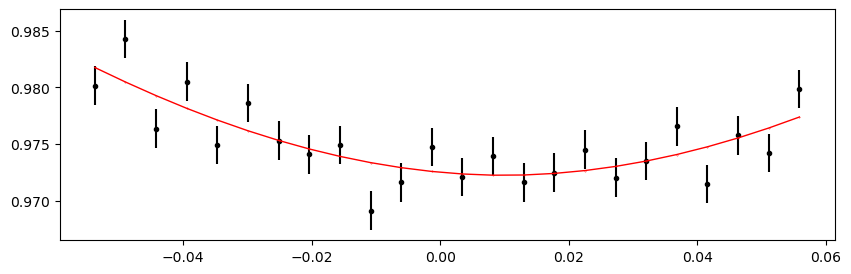

2718.99106 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 406.84it/s]


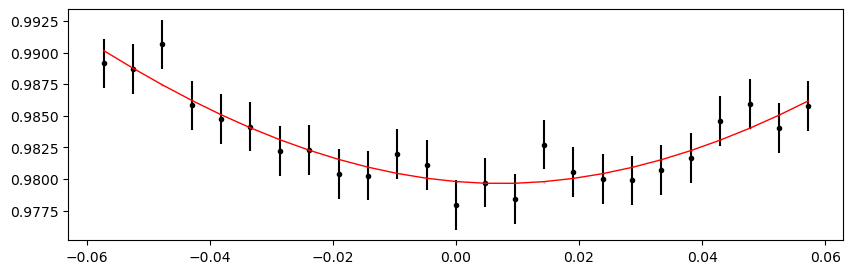

2719.282338 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 407.72it/s]


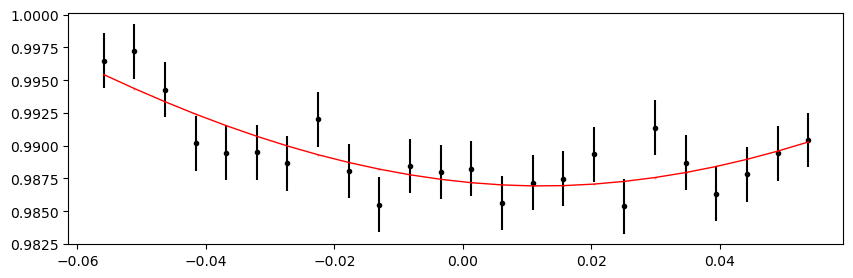

2719.5736159999997 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 415.29it/s]


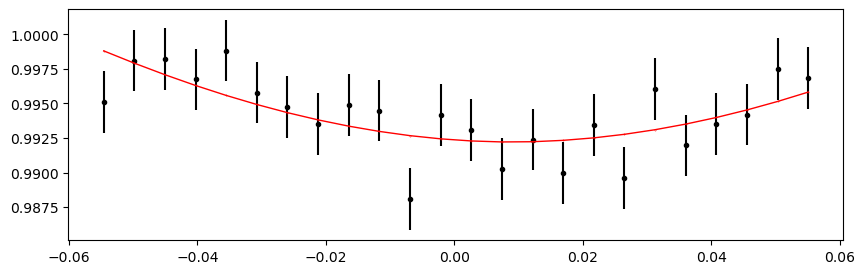

2720.156172 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.43it/s]


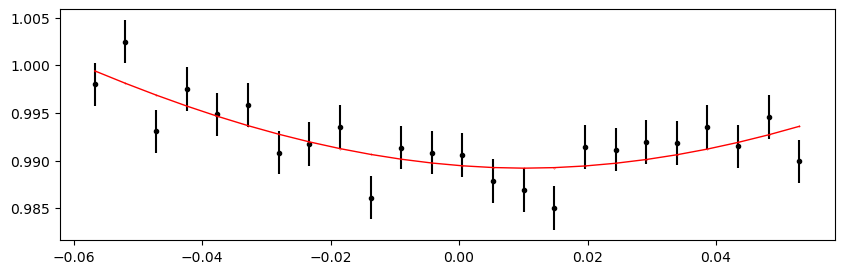

2720.4474499999997 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 413.59it/s]


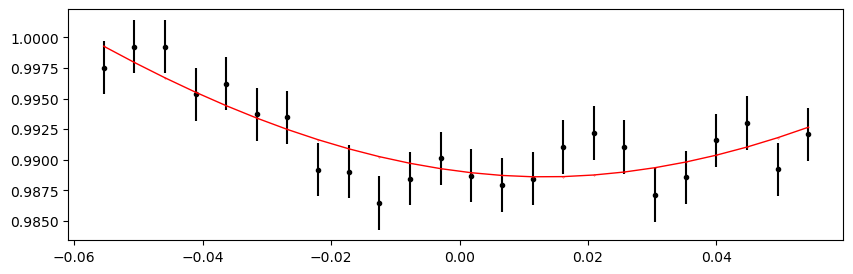

2720.738728 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 415.30it/s]


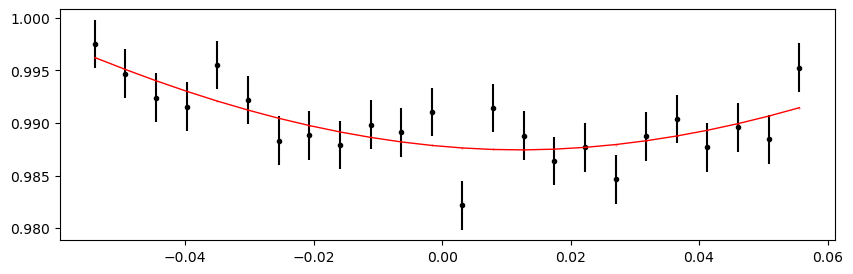

2721.030006 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.37it/s]


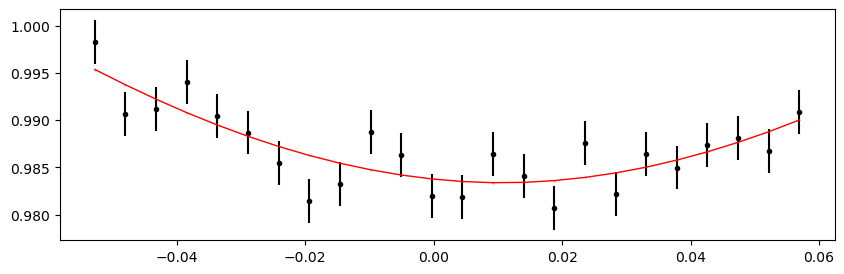

2721.3212839999997 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 420.32it/s]


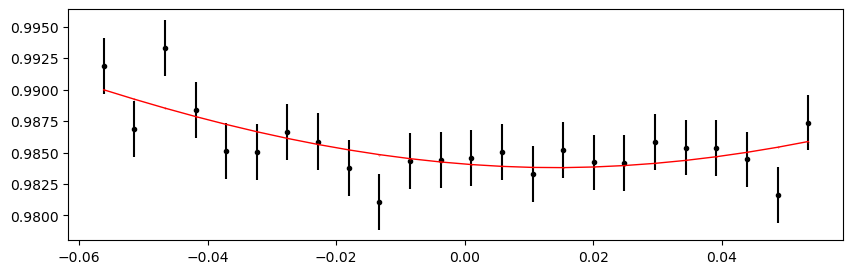

2721.612562 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.51it/s]


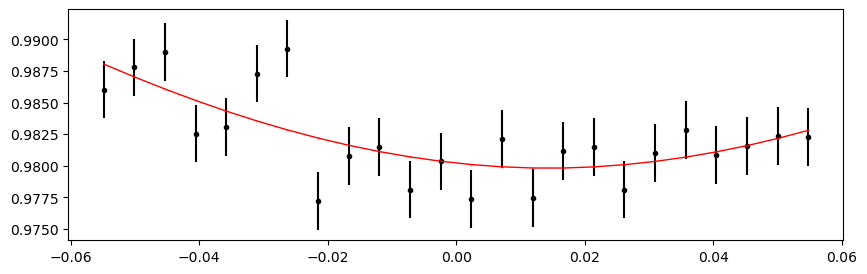

2721.90384 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 413.77it/s]


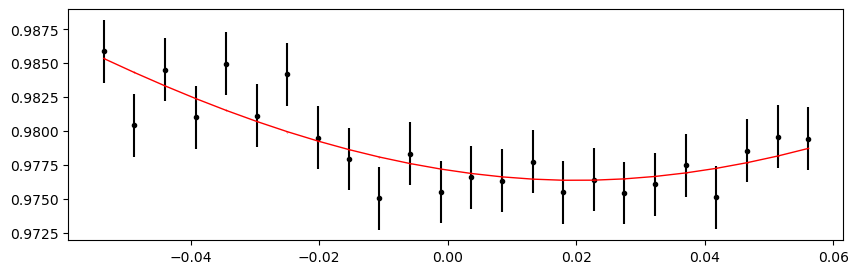

2722.1951179999996 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 419.82it/s]


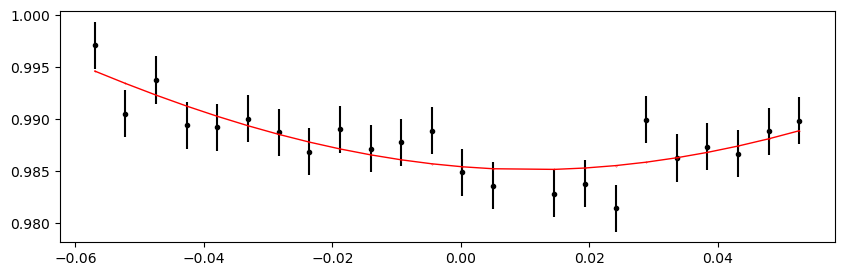

2722.486396 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.61it/s]


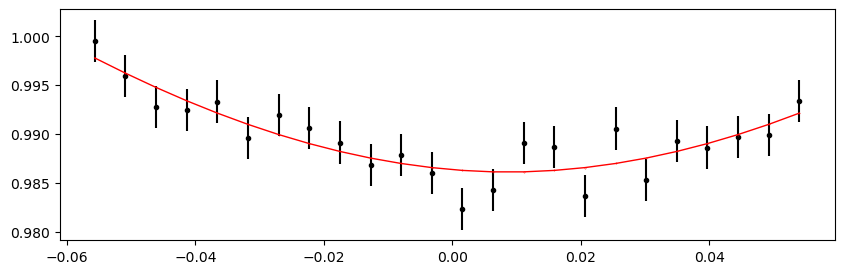

2722.777674 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 432.63it/s]


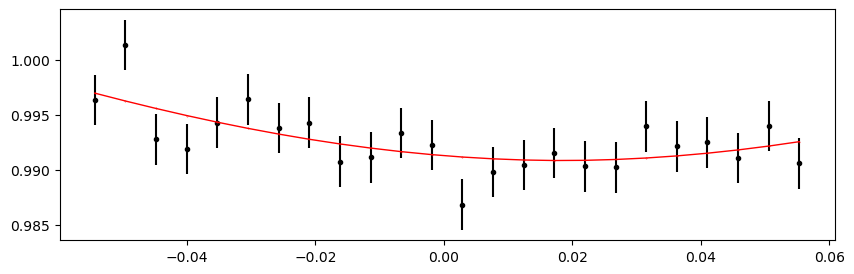

2723.36023 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 420.68it/s]


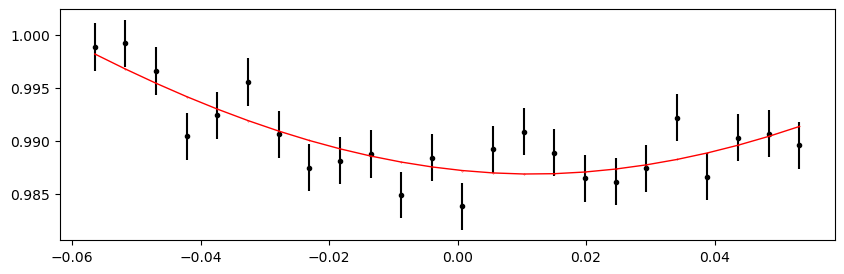

2723.651508 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 401.45it/s]


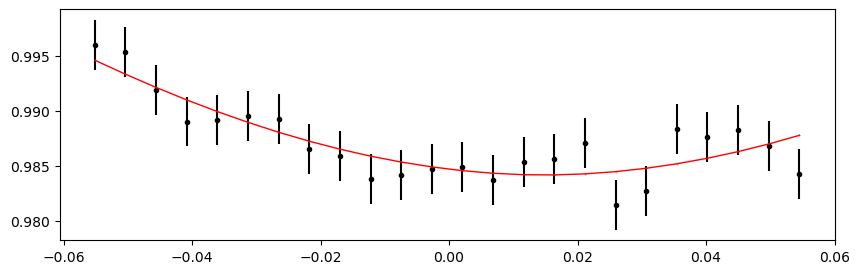

2723.9427859999996 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.96it/s]


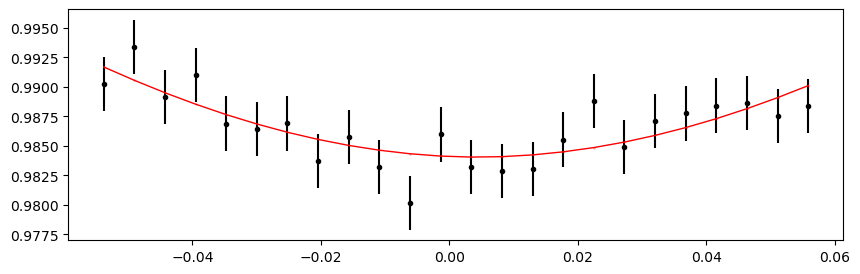

2724.2340639999998 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 419.51it/s]


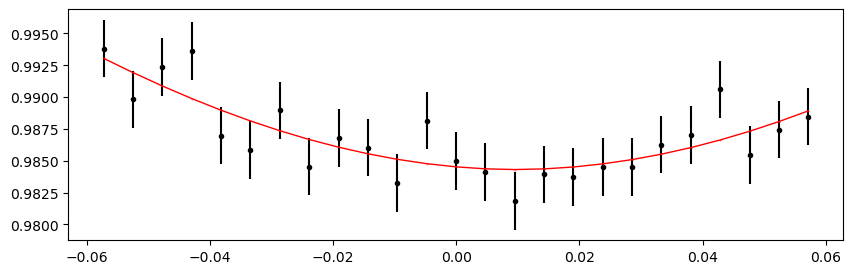

2724.525342 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 416.47it/s]


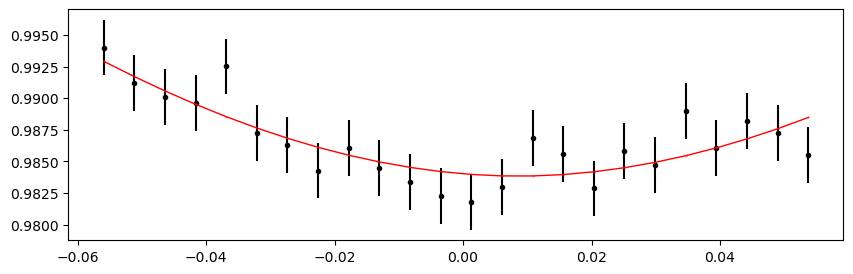

2724.8166199999996 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 404.53it/s]


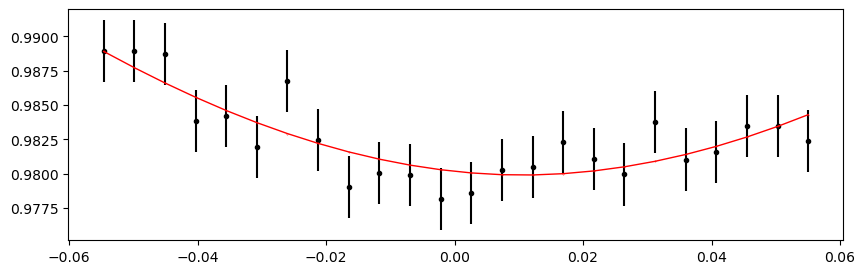

2725.1078979999998 1.0470587669445575 -0.0619183967063911 -0.2957511148827722


 42%|███████████████████████▊                                | 4243/10000 [00:10<00:14, 404.04it/s]


KeyboardInterrupt: 

In [64]:
%matplotlib inline

if t0_secondary is not None:
    print("Fitting individual secondary eclipses...")
    etv_functions.fit_each_eclipse(data_secondary, n_transits, t0_secondary, period, mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s, outfile_path_s,
                                   min_number_data=20, 
                                  )
    !$NOTIFY_CMD "Individual secondary eclipses fit done"
else:
    print("No secondary eclipses defined. No-Op.")

## ETV O-C plot

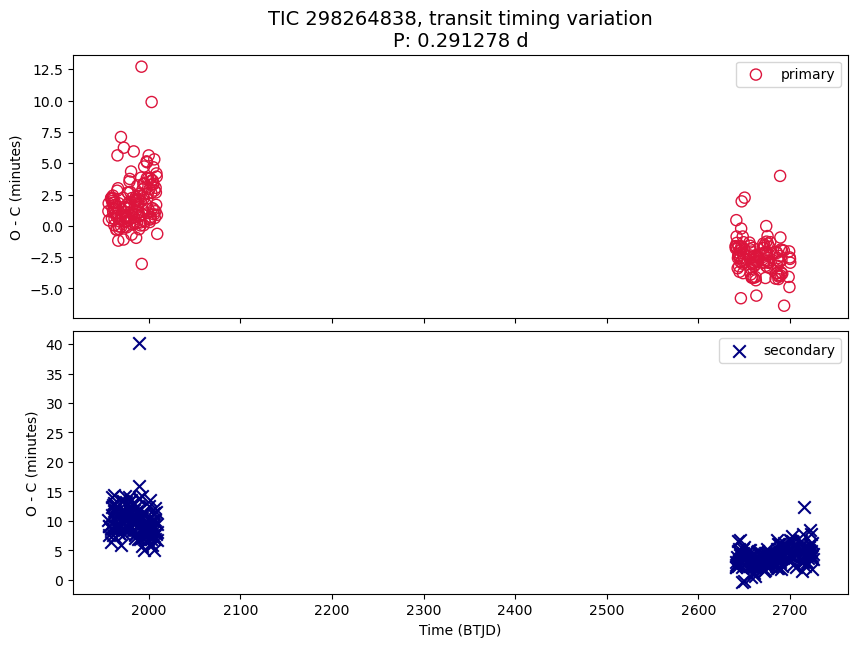

In [80]:
%matplotlib inline
# %matplotlib widget

#plot the extracted transit times to check for ETVs

num_rows = 2 if t0_secondary is not None else 1
figsize_y = 3.3 if num_rows == 1 else num_rows * 3.5
# num_rows = 1  # force to plot primary only
# figsize_y = 3.3

fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True)
if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
    axs = [axs]

in_df_primary = pd.read_csv(outfile_path)
in_df_primary['midpoint'] = in_df_primary['epoch'] + (in_df_primary['t0']*period)
in_df_primary['shift_mins'] = in_df_primary['t0']*period*24*60
in_df_primary['std_mins'] = in_df_primary['stdv_t0']*period*24*60

# axs[0].plot(in_df_primary['epoch'], in_df_primary['shift_mins'], 
#              lw = 1, color = 'crimson', )
axs[0].scatter(in_df_primary['epoch'], in_df_primary['shift_mins'], 
             marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")
# axs[0].errorbar(in_df_primary['epoch'], in_df_primary['shift_mins'], yerr = in_df_primary['std_mins'], 
#              lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'crimson', label="primary")

# if False:
if t0_secondary is not None:
    in_df_secondary = pd.read_csv(outfile_path_s)
    in_df_secondary['midpoint'] = in_df_secondary['epoch'] + (in_df_secondary['t0']*period)
    in_df_secondary['shift_mins'] = in_df_secondary['t0']*period*24*60
    in_df_secondary['std_mins'] = in_df_secondary['stdv_t0']*period*24*60
    # axs[1].plot(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
    #              lw = 1, color = 'navy', )
    axs[1].scatter(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
                 marker = 'x',  s=9**2, color = 'navy', zorder = -2, label="secondary" );
    # axs[1].errorbar(in_df_secondary['epoch'], in_df_secondary['shift_mins'], yerr = in_df_secondary['std_mins'], 
    #              lw = 0, marker = 'x', elinewidth = 1, markersize = 9, color = 'navy', zorder = -2, label="secondary" );

for ax in axs:
    ax.set_ylabel("O - C (minutes)")
    ax.legend();

axs[-1].set_xlabel(f"Time ({search_result.time.format.upper()})")
axs[0].set_title(f"TIC {ticid}, transit timing variation\nP: {period} d", fontsize=14)

plt.subplots_adjust(hspace=0.05)
# plt.ylim(-3, 8)
plt.show()

### O-C Plot, Zoom In

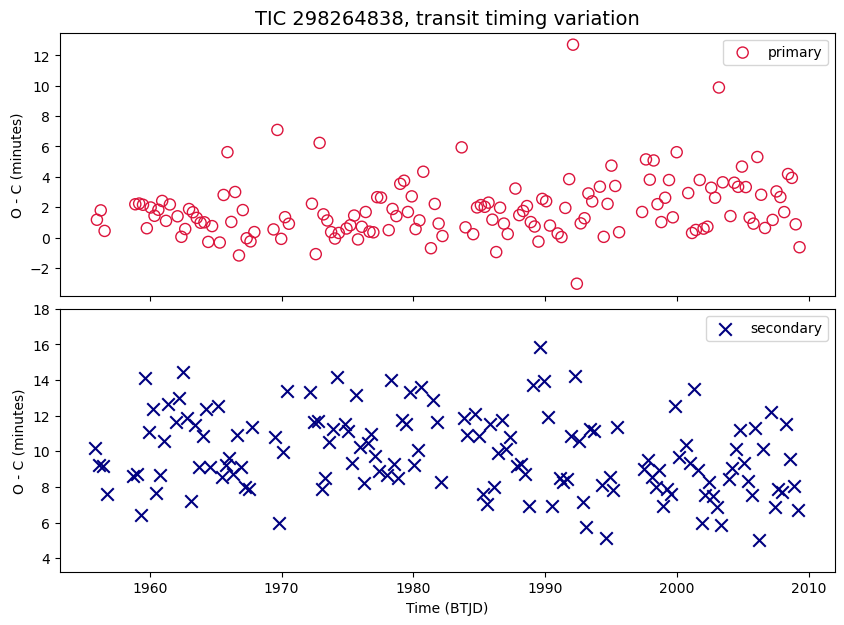

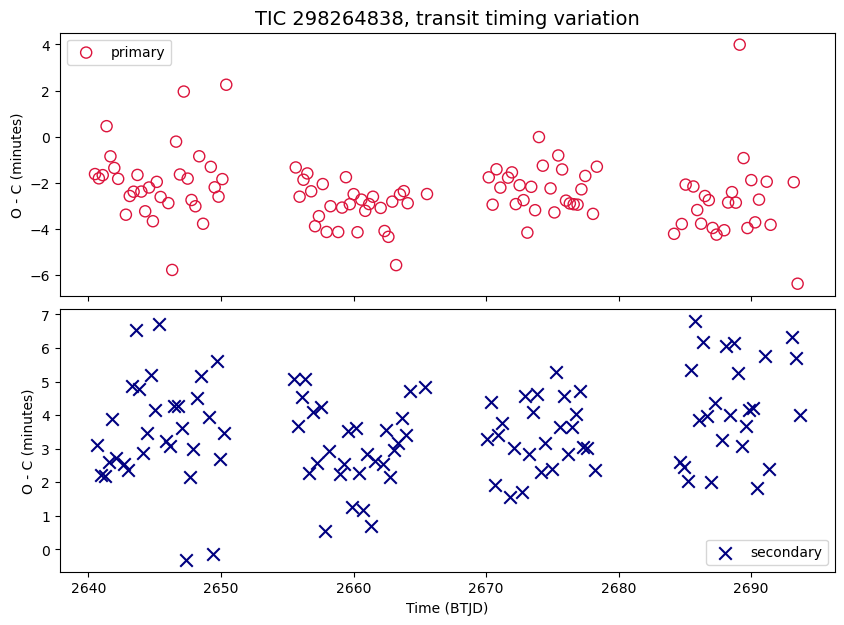

In [76]:
%matplotlib inline
# %matplotlib widget

zoom_ranges = [
    (1900, 2050),
    (2600, 2695),
]
title_suffix = "transit timing variation"

def tweak_axs_list(axs_list):
    ax = axs_list[0][1]
    # ax.set_title(f"{ax.get_title()}, Sectors 1-3")
    ax.set_ylim(None, 18);
    pass


axs_list = []
for zoom_start, zoom_end in zoom_ranges:
    num_rows = 2 if t0_secondary is not None else 1
    figsize_y = 3.3 if num_rows == 1 else num_rows * 3.5

    fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True)
    if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
        axs = [axs]
    
    in_df_primary = pd.read_csv(outfile_path)
    in_df_primary['midpoint'] = in_df_primary['epoch'] + (in_df_primary['t0']*period)
    in_df_primary['shift_mins'] = in_df_primary['t0']*period*24*60
    in_df_primary['std_mins'] = in_df_primary['stdv_t0']*period*24*60
    in_df_primary = in_df_primary[(in_df_primary['epoch'] > zoom_start) & (in_df_primary['epoch'] < zoom_end)]
    
    axs[0].scatter(in_df_primary['epoch'], in_df_primary['shift_mins'], 
                 marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")
    
    if t0_secondary is not None:
        in_df_secondary = pd.read_csv(outfile_path_s)
        in_df_secondary['midpoint'] = in_df_secondary['epoch'] + (in_df_secondary['t0']*period)
        in_df_secondary['shift_mins'] = in_df_secondary['t0']*period*24*60
        in_df_secondary['std_mins'] = in_df_secondary['stdv_t0']*period*24*60
        in_df_secondary = in_df_secondary[(in_df_secondary['epoch'] > zoom_start) & (in_df_secondary['epoch'] < zoom_end)]
    
        axs[1].scatter(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
                     marker = 'x',  s=9**2, color = 'navy', zorder = -2, label="secondary" );
    
    for ax in axs:
        ax.set_ylabel("O - C (minutes)")
        ax.legend();
    
    axs[-1].set_xlabel("Time (BTJD)")
    axs[0].set_title(f"TIC {ticid}, {title_suffix}", fontsize=14)
    
    plt.subplots_adjust(hspace=0.05)
    axs_list.append(axs)

tweak_axs_list(axs_list);

## make a periodogram 

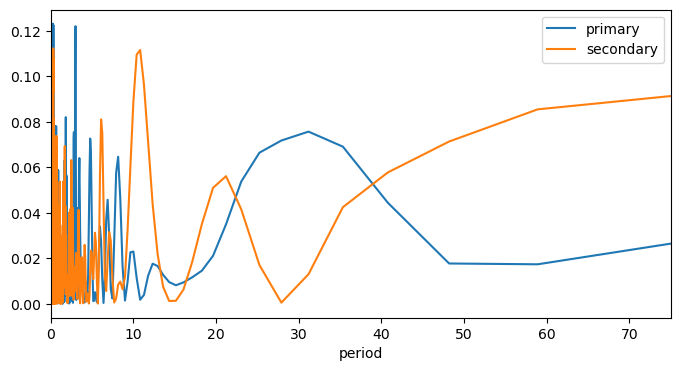

In [78]:
frequency, power = LombScargle(in_df_primary['epoch'], in_df_primary['shift_mins']).autopower()

fig, ax = plt.subplots(figsize=(8, 4))

plt.plot(1/frequency, power, label = 'primary')    

if t0_secondary is not None:
    frequency_s, power_s = LombScargle(in_df_secondary['epoch'], in_df_secondary['shift_mins']).autopower()
    plt.plot(1/frequency_s, power_s, label = 'secondary')    

plt.xlabel("period")

plt.legend()
plt.xlim(0, 75)
plt.show()


## Results Summary

In [81]:
# FILL-IN the ETV results / comments
has_etv = "Inconclusive"
comments = "scatter in O-C with no obvious pattern. Unsure if the cosh model can handle the assyemtirc eclipses. Unsure if the period is good enough."

# Eclipse depth from the model
depth_pct_p = round(-mean_alpha1 * 100, 2)
if t0_secondary is not None:
    depth_pct_s = round(-mean_alpha1_s * 100, 2)
else:
    depth_pct_s = None

summary = {
    "tic": ticid,
    "has_etv": has_etv,
    "comments": comments,
    "period": period,  # the period used in ETV analysis
    "depth_pct_p": depth_pct_p,
    "depth_pct_s": depth_pct_s,
    "epoch_p": t0_primary,
    "epoch_s": t0_secondary,
    "num_sectors": len(sr),
    "time_span": round(time[-1] - time[0], 2),
    "time_start": round(time[0], 2),
    "time_end": round(time[-1], 2),
}

summary = pd.DataFrame.from_dict(summary, orient="index")
with pd.option_context('display.max_colwidth', None, 'display.max_rows', 999, 'display.max_columns', 99):
    display(summary);

# Single line to be added to a CSV
print("")
print(summary.transpose().to_csv(
    index=False,
    header=True, 
))

,0
tic,298264838
has_etv,Inconclusive
comments,scatter in O-C with no obvious pattern. Unsure if the cosh model can handle the assyemtirc eclipses. Unsure if the period is good enough.
period,0.291278
depth_pct_p,7.28
depth_pct_s,6.19
epoch_p,1955.9876
epoch_s,1955.8427
num_sectors,8
time_span,980.89



tic,has_etv,comments,period,depth_pct_p,depth_pct_s,epoch_p,epoch_s,num_sectors,time_span,time_start,time_end
298264838,Inconclusive,scatter in O-C with no obvious pattern. Unsure if the cosh model can handle the assyemtirc eclipses. Unsure if the period is good enough.,0.291278,7.28,6.19,1955.9876,1955.8427,8,980.89,1955.8,2936.69

